In [1]:
# @title imports 
%load_ext autoreload
%autoreload 2
import os
import pickle
from typing import Set
# from jedi import settings
import numpy as np 
import matplotlib.pyplot as plt
from scipy.sparse import data 
import pandas as pd 
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import normalize
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
# import umap.plot as uplot
import sys  

sys.path.append('C:/Users/Nishant Joshi/Downloads/Old_code/repo/single_cell_analysis/scripts')
from utils import *
sys.path.append(os.getcwd()+'/../scripts/')
from UMAP_utils import *
from plot_utils import *
sys.path.append('C:/Users/Nishant Joshi/Model_fitting/GIFFittingToolbox/src/examples/')
from cluster_stability import *
from neuromod_utils import * 
from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score


In [2]:
savepath = 'D:/Data For Publication/figures/part2/'

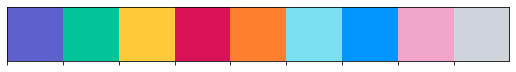

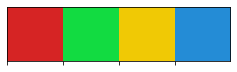

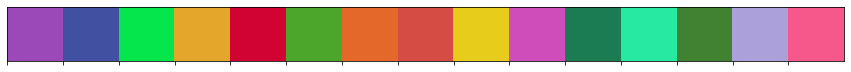

In [3]:
pal = ["#00202e","#003f5c","#2c4875","#8a508f","#bc5090","#ff6361","#ff8531","#ffa600","#ffd380",[0.969,	0.349, 0.549]]
CUSTOM_PAL_SORT_3 = ['#5e60ce','#00c49a','#ffca3a','#D81159','#fe7f2d','#7bdff2','#0496ff','#efa6c9','#ced4da']
GMM_PAL = ['#d62424','#12db41','#f0c905','#248cd6']

# In RGB form
coherence_colors = [[0.609, 0.283, 0.724],
                    [0.259,	0.314, 0.635],
                    [0.02,	0.9, 0.3],
                    [0.898,	0.654, 0.169],
                    [0.821, 0.012, 0.198],
                    [0.298,	0.654, 0.169],
                    [0.898,	0.41 , 0.165],  
                    [0.834,	0.3 , 0.265],
                    [0.912,	0.8 , 0.112],
                    [0.812,	0.3 , 0.734],
                    [0.109, 0.483, 0.324],
                    [0.159,	0.914, 0.635],
                    [0.251,	0.512, 0.198],
                    [0.676,	0.631, 0.859],
                    [0.969,	0.349, 0.549],]
sns.palplot(CUSTOM_PAL_SORT_3)
sns.palplot(GMM_PAL)
sns.palplot(coherence_colors)

# Waveforms

In [4]:
discarded_exps = ['xuan_151118_E1',
'xuan_15319_E1' ,
'xuan_20919_E2',
'xuan_27919_E1',
'xuan_27919_E2',
'xuan_27919_E3',
'NC_20717_E5' ,
'NC_25717_E2',
'payam_31019_E5',
'payam_101019_E5',
'NC_24717_E1',
'xuan_27319_E4',
'xuan_23119_E2',
'xuan_3419_E2',
'xuan_22319_E1',
'xuan_19319_E4',
'xuan_22319_E4',
'xuan_26319_E4']

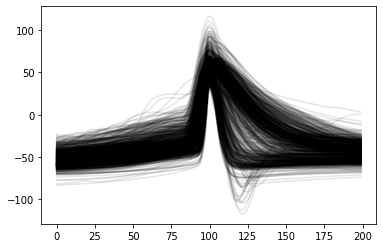

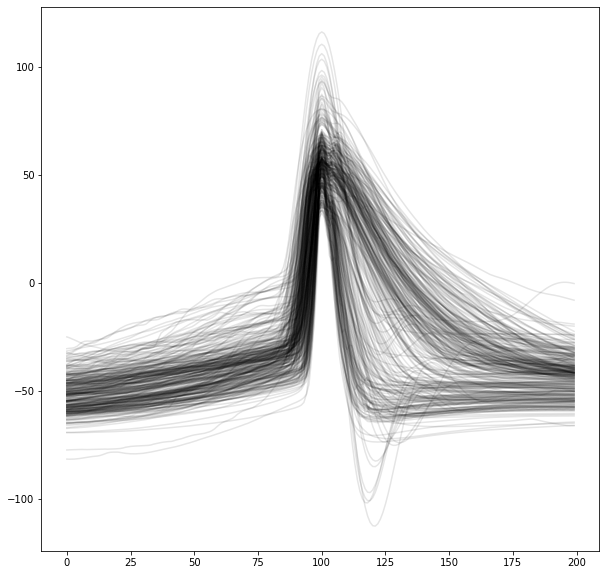

In [5]:
# %matplotlib widget

ephys = pd.read_pickle("D:/FN_analysed_feat_set/Ephys_collection_all_exps_all_conds_spikes_calculated_5ms.pkl")
ephys_with_mi = pd.read_pickle("D:/FN_analysed_feat_set/Ephys_collection_all_exps_all_conds_spikes_calculated_5ms_with_MI.pkl")

ephys = ephys[~ephys.exp_name.isin(discarded_exps)]

plt.plot(np.vstack(ephys.waveform).T,alpha=0.1,c='black')
plt.show()

data_ephys_FN_acsf = ephys[ephys.cond.isin(['acsf','acsf_bic'])][ephys.columns[1:]]
data_ephys_FN_acsf = data_ephys_FN_acsf[data_ephys_FN_acsf.trialnr==0]

data_wave_FN_acsf = ephys[ephys.cond.isin(['acsf','acsf_bic'])][['waveform','tau', 'exp_name', 'cond', 'trialnr']]
data_wave_FN_acsf=data_wave_FN_acsf[data_wave_FN_acsf.trialnr==0]
# data_wave_FN_acsf.drop_duplicates('exp_name')

# exps_with_double_trials = np.array(data_wave_FN_acsf.exp_name)[list(np.where(np.unique(data_wave_FN_acsf.exp_name,return_counts=True)[1]>1)[0])]
# data_wave_FN_acsf = data_wave_FN_acsf[data_wave_FN_acsf.trialnr==0]

fig,ax = plt.subplots(figsize=[10,10])
# plt.ion
plt.plot(np.vstack(data_wave_FN_acsf['waveform']).T,c='k',alpha=0.1)
# plt.xticks([])
# plt.yticks([]) 
# plt.savefig(savepath+'waves_all_entire_trial.pdf',dpi=200)
plt.show()


In [7]:
acsf  = ephys[ephys.cond=='acsf']
acsf = acsf.drop_duplicates('exp_name')
drug  = ephys[ephys.cond!='acsf']
drug = drug.drop_duplicates('exp_name')
all = pd.concat([acsf,drug])

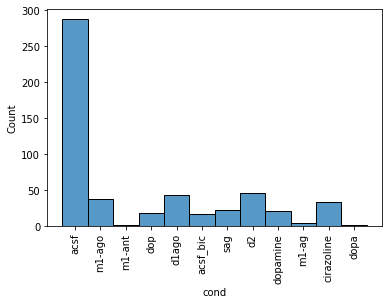

In [8]:

# set(ephys.cond)
np.unique(all.cond,return_counts=True)
sns.histplot(all.cond)
plt.xticks(rotation=90)

plt.show()

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


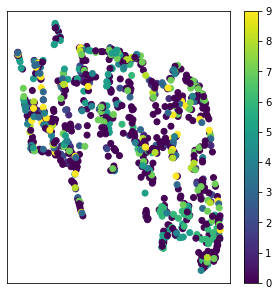

In [12]:
neuromod_list = neumericalize_neurmods(ephys)
plot_UMAP_values(np.vstack(ephys.waveform),neuromod_list,random_state=42,savepath=savepath+'wave_firstHalf_vs_entire.pdf',save=False,figsize=[5,5])

In [9]:
drugs = ['dopamine',
 'sag',
 'cirazoline',
 'm1-ago+ant',
 'd1',
 'm1-ago',
 'm1-ant',
 'd2']

## Waveform manifolds

dopamine


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


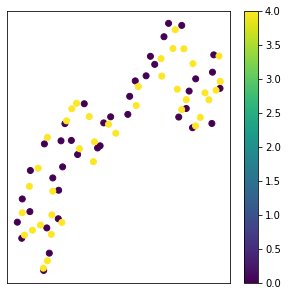

sag


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


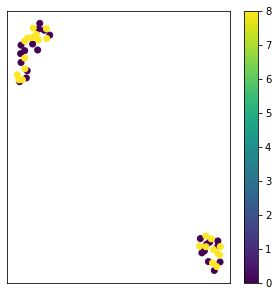

cirazoline


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


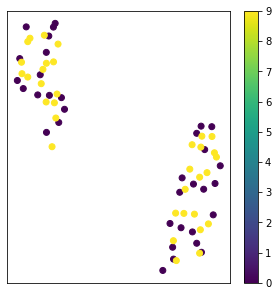

m1-ago+ant


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


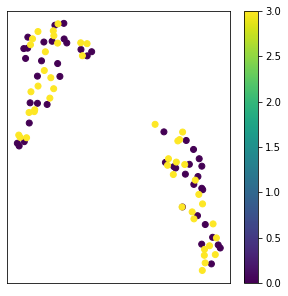

d1


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


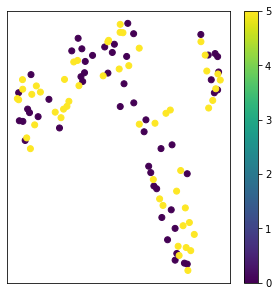

m1-ago


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


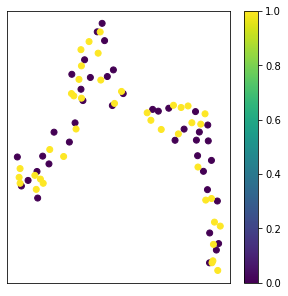

m1-ant


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


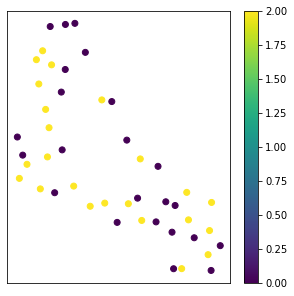

d2


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


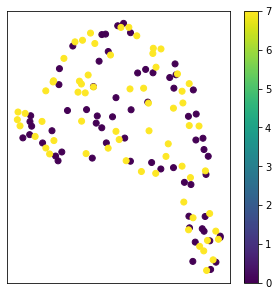

In [11]:
for i in drugs:
    print(i)
    acsf,drug = return_acsf_and_drug(ephys,cond=[i],joint=False)
    acsf = acsf.drop_duplicates('exp_name')
    drug = drug.drop_duplicates('exp_name')
    all = pd.concat([acsf,drug])
    neuromod_list =  neumericalize_neurmods(all)
    plot_UMAP_values(np.vstack(all.waveform),neuromod_list,random_state=42,savepath=savepath+'wave_firstHalf_vs_entire.pdf',save=False,figsize=[5,5])
    plt.show()

### Plot waveforms for each condition

dopamine


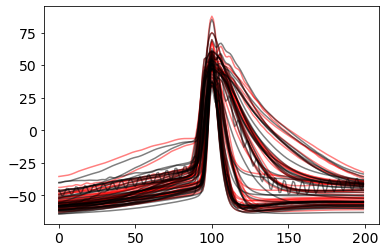

sag


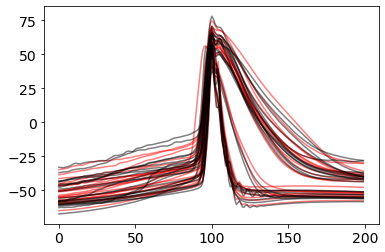

cirazoline


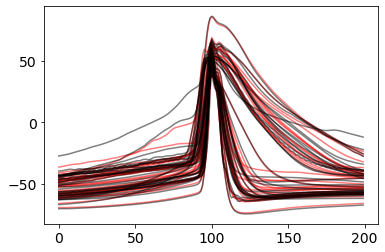

m1-ago+ant


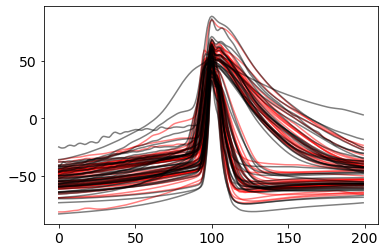

d1


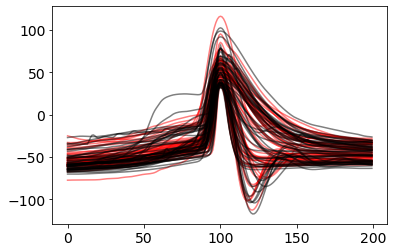

m1-ago


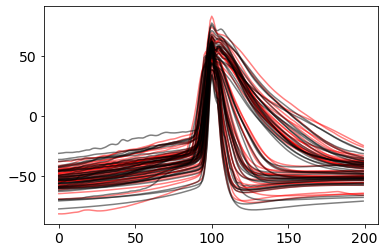

m1-ant


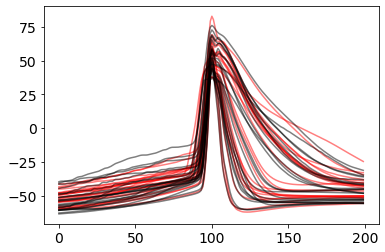

d2


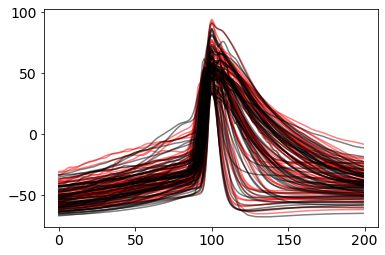

In [295]:
for i in drugs:
    print(i)
    acsf,drug = return_acsf_and_drug(ephys,cond=[i],joint=False)
    acsf = acsf.drop_duplicates('exp_name')
    drug = drug.drop_duplicates('exp_name')
    common_exps = set(acsf.exp_name) & set(drug.exp_name)

    acsf = acsf[acsf.exp_name.isin(common_exps)]
    drug = drug[drug.exp_name.isin(common_exps)]

    all = pd.concat([acsf,drug])

    neuromod_list =  neumericalize_neurmods(all)

    plt.plot(np.vstack(acsf.waveform).T,c='red',alpha=0.5)
    plt.plot(np.vstack(drug.waveform).T,c='black',alpha=0.5)

    plt.show()

### Plot ephys manifold for whiole database

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


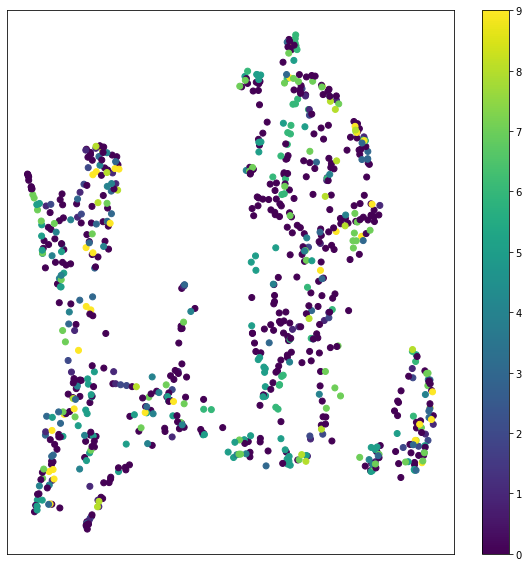

In [14]:

neuromod_list =  neumericalize_neurmods(ephys)

plot_UMAP_values((np.vstack(ephys[cols].to_numpy())),neuromod_list,random_state=42,savepath=savepath+'wave_firstHalf_vs_entire.pdf',save=False,figsize=[10,10])


## Cluster acsf waveform

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


8


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


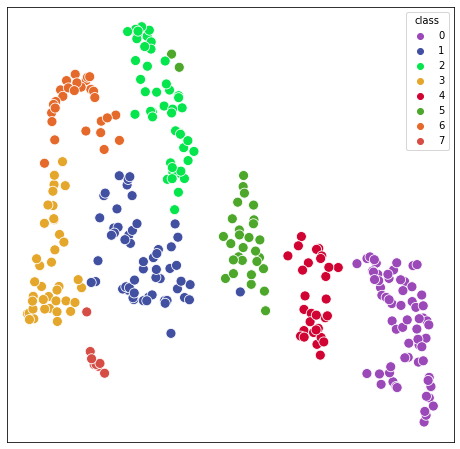

In [6]:
waves = normalize(np.vstack(data_wave_FN_acsf['waveform']))

labels_wave,mapper,reducer = plot_UMAP_clusters_single(waves,
                          20,
                          0.1,
                          random_state =42,
                          res_louvain = 1.,
                          c_list =coherence_colors,
                          norm=False,
                          save=False,
                          savepath = savepath+'wave_cluster.pdf',
                          size=100
                          )
data_wave_FN_acsf['labels_wave'] = labels_wave

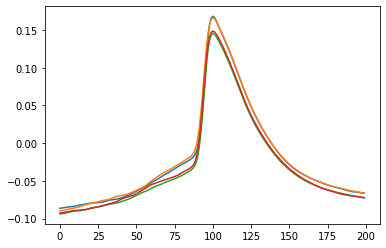

In [88]:
plt.plot(normalize(np.vstack(acsf_waveforms_filtered[acsf_waveforms_filtered.exp_name==names[13]].waveform)).T)

In [20]:
waves_scaler = StandardScaler()
# find_optimum_res(waves_scaler.fit_transform(waves),save=True,savepath=savepath+'waves_cluster_stability.pdf')

### Plot wavefroms 

0


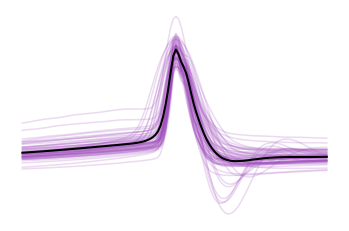

1


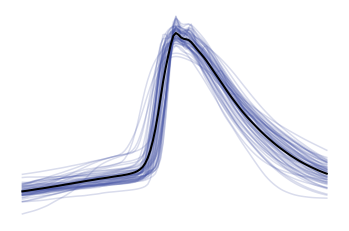

2


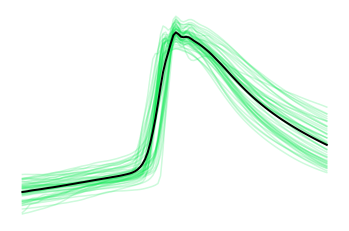

3


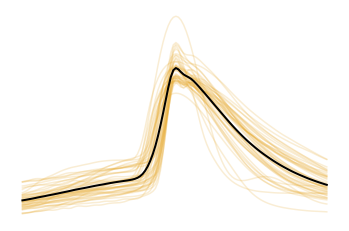

4


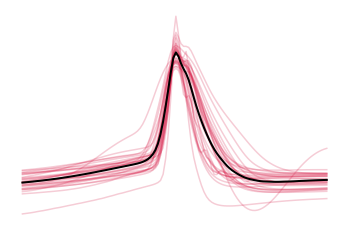

5


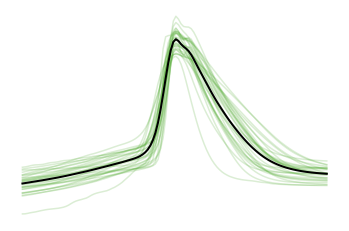

6


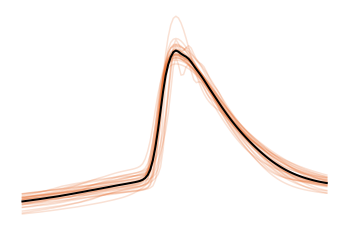

7


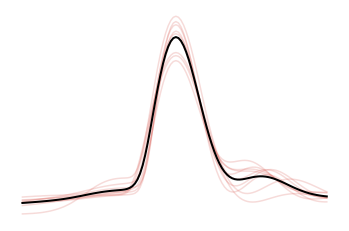

In [8]:


plot_waveforms(df=data_wave_FN_acsf,c_list=coherence_colors)
    # plt.legend()

### Assign labels

In [7]:
data_wave_FN_acsf['binary_lable'] =  binarize_EI_labels(list(data_wave_FN_acsf['labels_wave']),e_vals=[1,2,3,6,7])

In [8]:
exc_exps = data_wave_FN_acsf[data_wave_FN_acsf.binary_lable==1]['exp_name']
inh_exps = data_wave_FN_acsf[data_wave_FN_acsf.binary_lable==0]['exp_name']

In [9]:
ephys['ei_labels'] = np.nan
ephys.loc[ephys.exp_name.isin(exc_exps),'ei_labels']  = 1
ephys.loc[ephys.exp_name.isin(inh_exps),'ei_labels']  = 0

## Plot waveform clusters for Trial 1 and 2

In [8]:
acsf_waveforms = ephys[ephys.cond=='acsf']
idx = np.where(np.unique(acsf_waveforms.exp_name,return_counts=True)[1]>1)[0]
names = np.unique(acsf_waveforms.exp_name,return_counts=True)[0][idx]

In [9]:
acsf_with_2_trials = list(set(np.array(acsf_waveforms.exp_name)[idx]))
acsf_waveforms_filtered = acsf_waveforms[acsf_waveforms.exp_name.isin(names)]

In [70]:
input_data = pd.read_pickle("D:/Data For Publication/I_data.pkl")
input_data_2_trials = input_data[input_data.exp_name.isin(acsf_with_2_trials)]

input_data_2_trials[['mean_I', 'var_I', 'trialnr',]] = input_data_2_trials[['mean_I', 'var_I', 'trialnr',]].apply(lambda a : np.float32(a))


<ipython-input-70-f0d29b467bbe>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  input_data_2_trials[['mean_I', 'var_I', 'trialnr',]] = input_data_2_trials[['mean_I', 'var_I', 'trialnr',]].apply(lambda a : np.float32(a))


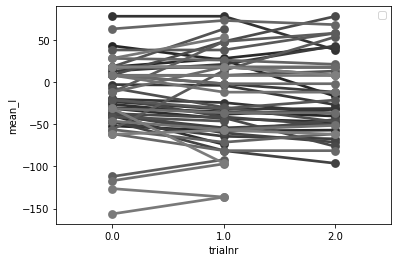

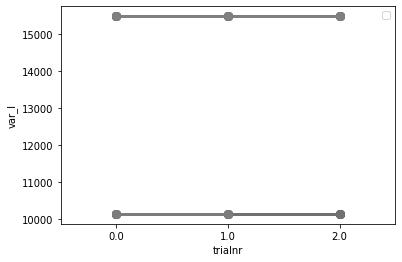

In [71]:
sns.pointplot( x = 'trialnr' ,y= 'mean_I' ,data = input_data_2_trials,hue='exp_name',color='grey')
plt.legend([])
plt.show()

sns.pointplot( x = 'trialnr' ,y= 'var_I' ,data = input_data_2_trials, hue='exp_name',color='grey')
plt.legend([])
plt.show()

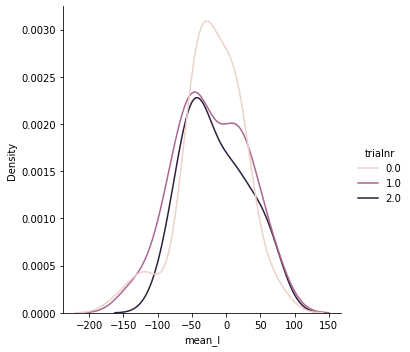

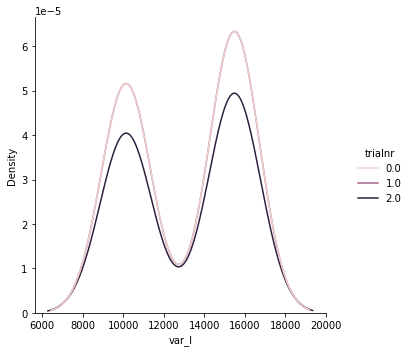

In [72]:
sns.displot(data = input_data_2_trials,x = 'mean_I',kind='kde',hue='trialnr')
plt.show()
sns.displot(data = input_data_2_trials,x = 'var_I',kind='kde',hue='trialnr')
plt.show()


In [75]:
np.unique(input_data_2_trials['trialnr'],return_counts = True)

(array([0., 1., 2.], dtype=float32), array([49, 49, 40], dtype=int64))

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: t-test paired samples, P_val:6.267e-01 t=4.895e-01


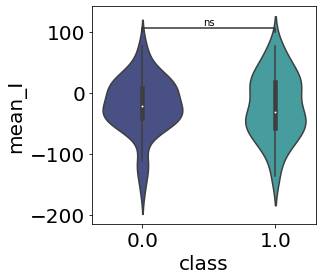

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

0.0 vs. 1.0: t-test paired samples, P_val:nan t=nan


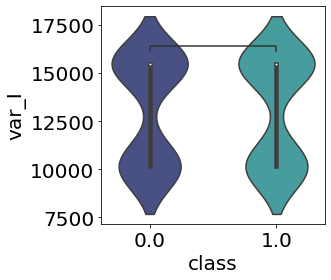

In [81]:
fig,ax = plt.subplots(figsize  = [ 4,4])
plot_significance_new(data = input_data_2_trials[input_data_2_trials.trialnr<2],
var = 'mean_I',
hue = 'trialnr',
ax = ax,
drug = True,
# palette = CUSTOM_PAL_SORT_3[:len(set(df_temp_m1_ant_ago['labels_lv']))] 
test ='t-test_paired'
)
plt.show()

fig,ax = plt.subplots(figsize  = [ 4,4])
plot_significance_new(data = input_data_2_trials[input_data_2_trials.trialnr<2],
var = 'var_I',
hue = 'trialnr',
ax = ax,
drug = True,
# palette = CUSTOM_PAL_SORT_3[:len(set(df_temp_m1_ant_ago['labels_lv']))] 
test ='t-test_paired'
)
plt.show()

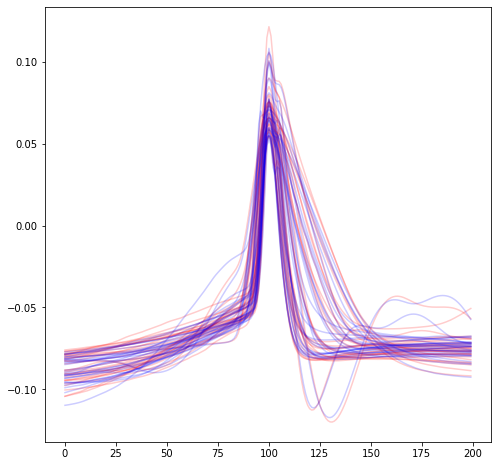

51 51


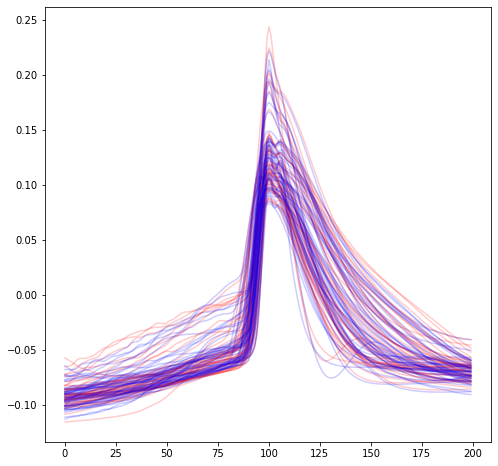

In [15]:
waves_df_inh  = acsf_waveforms_filtered[acsf_waveforms_filtered.ei_labels==0]
waves_df_exc  = acsf_waveforms_filtered[acsf_waveforms_filtered.ei_labels==1]

apcount_thr = 50

waves_df_exc = waves_df_exc[waves_df_exc.ap_count> apcount_thr]

waves1_df_inh = waves_df_inh[waves_df_inh.trialnr==0]
waves2_df_inh = waves_df_inh[waves_df_inh.trialnr==1]

waves1_df_exc = waves_df_exc[waves_df_exc.trialnr==0]
waves2_df_exc = waves_df_exc[waves_df_exc.trialnr==1]

common_exps = set(waves1_df_exc.exp_name) & set(waves2_df_exc.exp_name) 


waves1_df_exc = waves1_df_exc[waves1_df_exc.exp_name.isin(common_exps)]
waves2_df_exc = waves2_df_exc[waves2_df_exc.exp_name.isin(common_exps)]


waves1_inh   = normalize(np.vstack(waves1_df_inh['waveform']))
waves2_inh   = normalize(np.vstack(waves2_df_inh['waveform']))


fig,ax = plt.subplots(figsize=[8,8])
ax.plot(waves1_inh.T,c='red',alpha=0.2)
ax.plot(waves2_inh.T,c='blue',alpha=0.2)
plt.show()

waves1_exc = normalize(np.vstack(waves1_df_exc['waveform']))
waves2_exc = normalize(np.vstack(waves2_df_exc['waveform']))
print(len(waves1_exc),len(waves2_exc))

fig,ax = plt.subplots(figsize=[8,8])
ax.plot(waves1_exc.T,c='red',alpha=0.2)
ax.plot(waves2_exc.T,c='blue',alpha=0.2)
plt.show()



NC_3717_E1


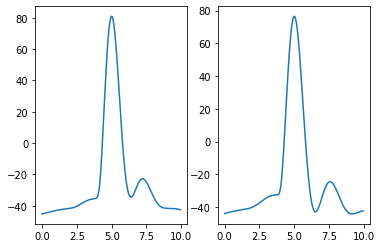

NC_11717_E1


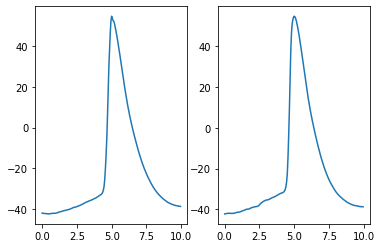

NC_21817_E1


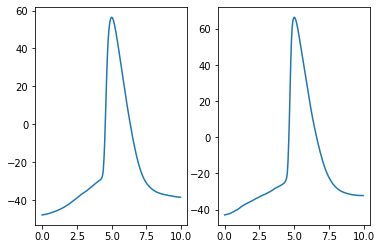

NC_21817_E2


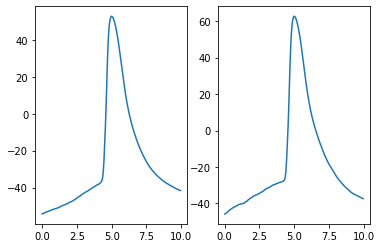

NC_21817_E3


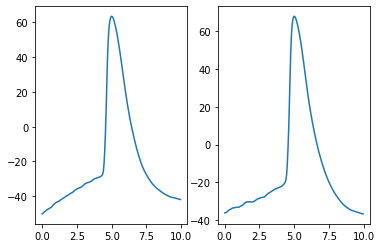

NC_30817_E4


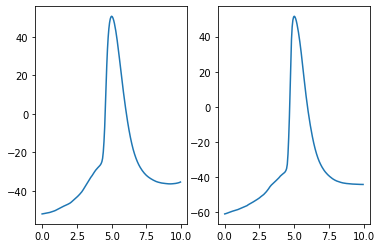

NC_101017_E5


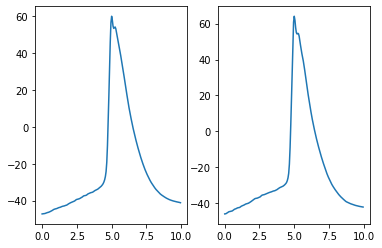

NC_101017_E6


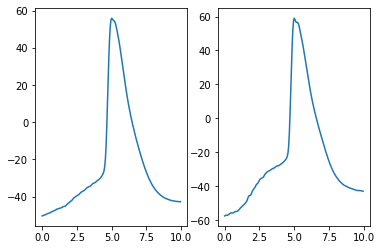

NC_111017_E1


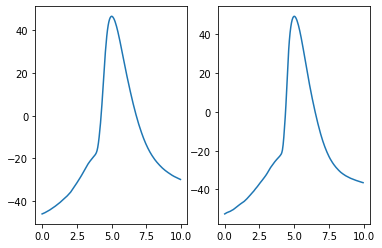

NC_111017_E2


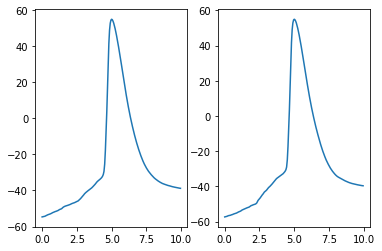

NC_111017_E3


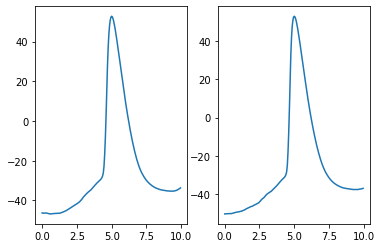

NC_111017_E4


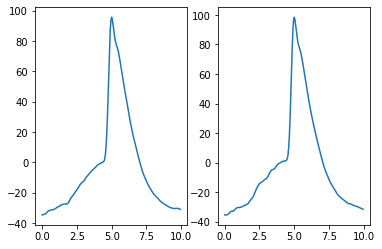

NC_111017_E5


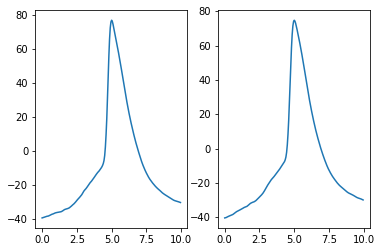

NC_121017_E3


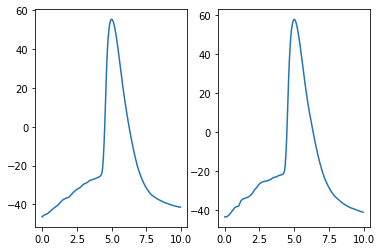

NC_121017_E5


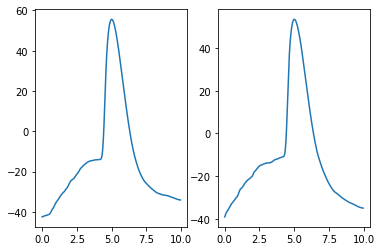

NC_121017_E6


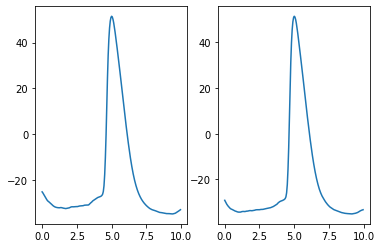

NC_121017_E7


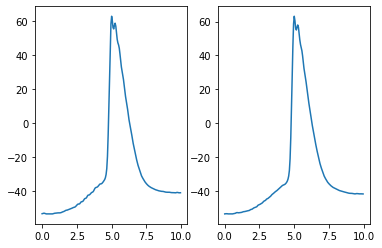

NC_121017_E8


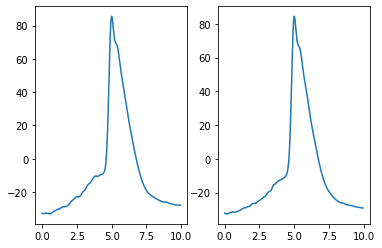

NC_171017_E2


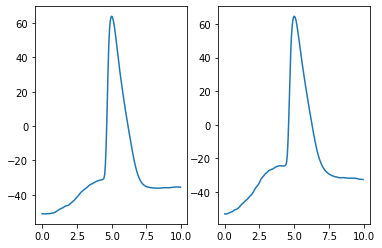

NC_171017_E3


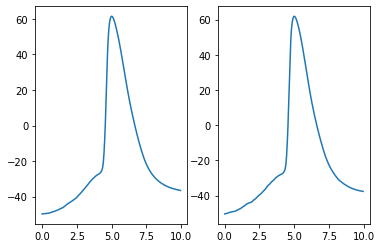

NC_171017_E4


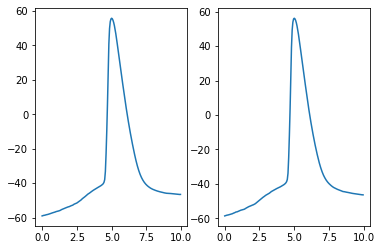

NC_171017_E5


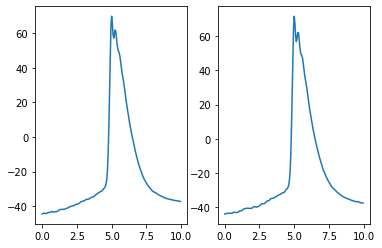

NC_221217_E2


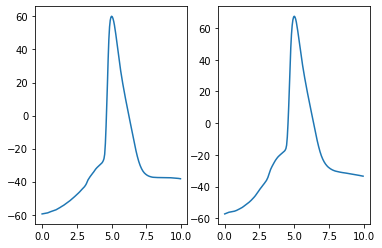

NC_221217_E3


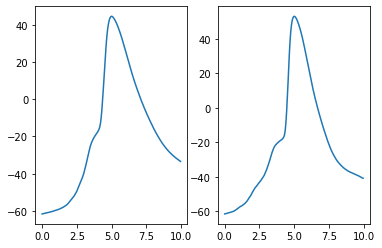

xuan_141218_E1


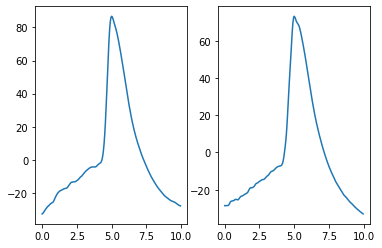

xuan_17119_E2


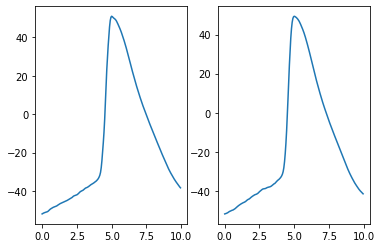

xuan_17119_E3


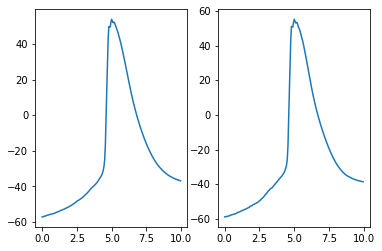

xuan_19319_E5


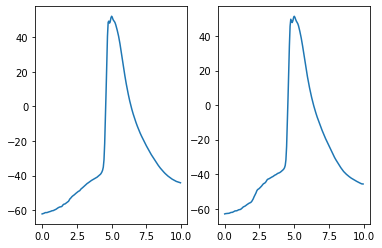

xuan_20319_E3


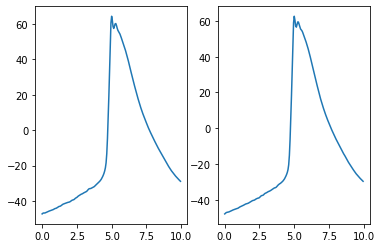

xuan_21119_E1


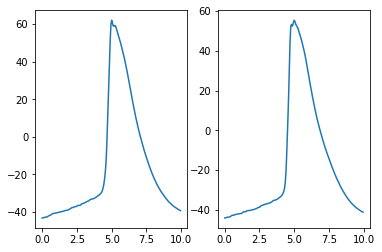

xuan_21319_E1


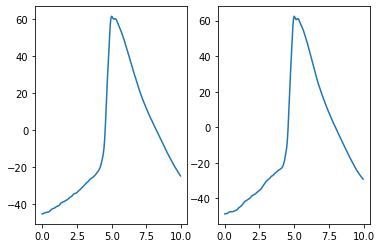

xuan_21319_E3


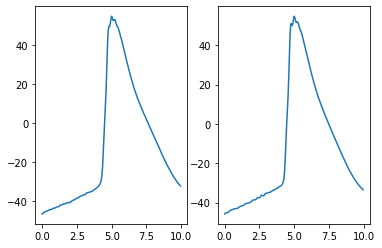

xuan_22119_E1


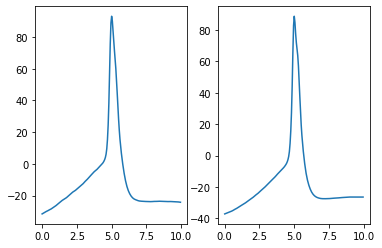

xuan_22319_E2


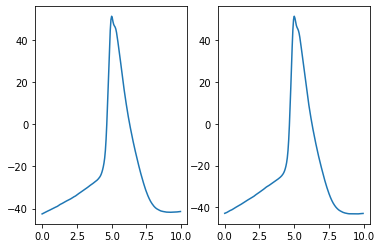

xuan_22319_E3


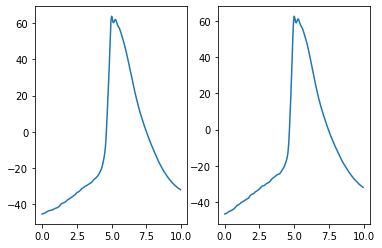

xuan_23119_E1


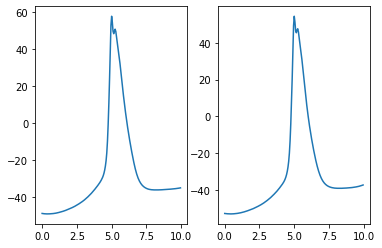

xuan_24119_E2


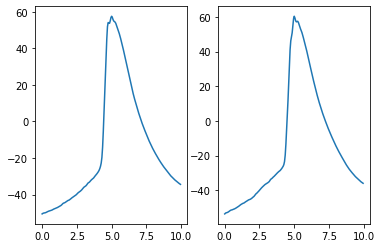

xuan_26319_E2


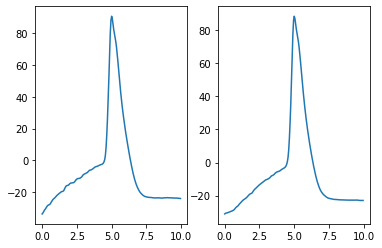

xuan_26319_E4


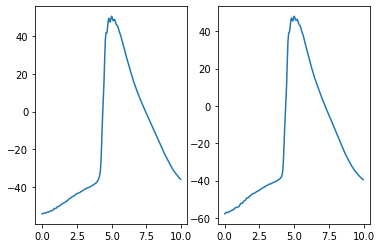

xuan_28319_E2


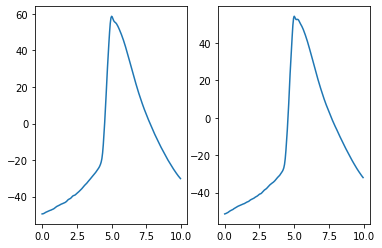

xuan_28319_E3


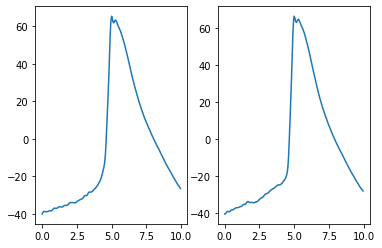

xuan_28319_E4


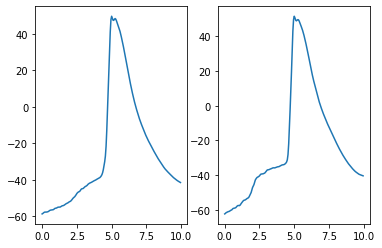

xuan_29319_E1


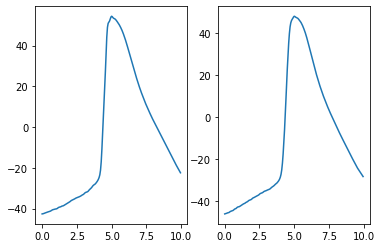

xuan_101018_E2


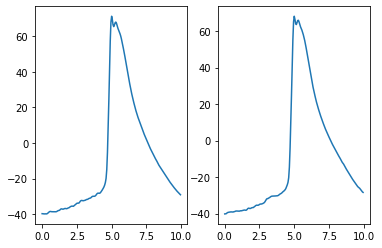

xuan_14119_E1


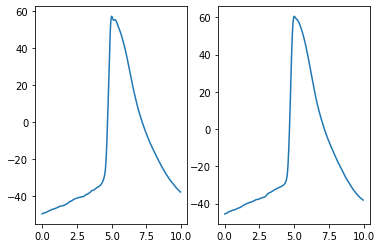

xuan_14319_E2


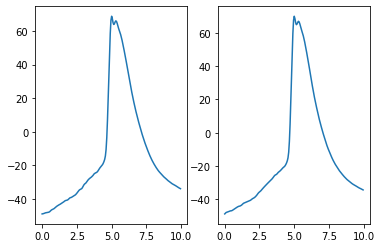

xuan_6319_E1


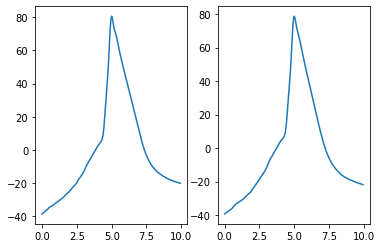

xuan_6319_E2


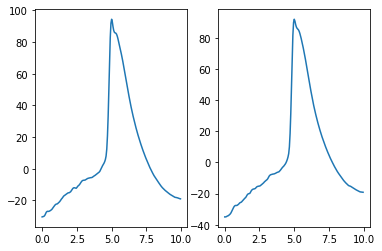

xuan_7319_E3


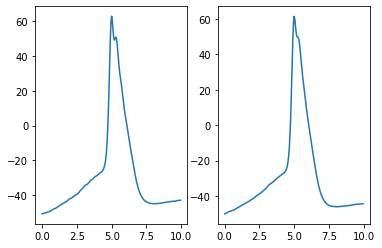

xuan_8119_E2


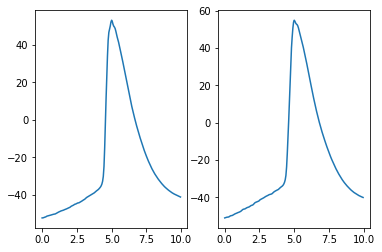

xuan_8119_E3


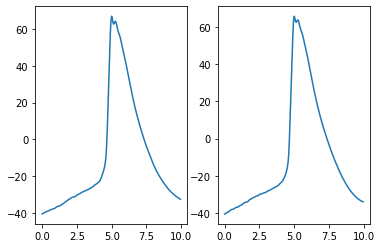

xuan_9119_E4


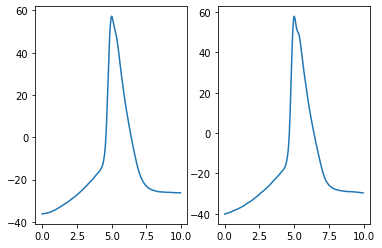

In [ ]:
for i in range(len(np.vstack(waves1_df_exc.waveform))):
    fig,ax = plt.subplots(1,2)
    wave1 = np.vstack(waves1_df_exc.waveform)[i]
    wave2 = np.vstack(waves2_df_exc.waveform)[i]

    exp = waves1_df_exc.exp_name.to_list()[i]
    print(exp)
    t = np.arange(0,10,1/20)
    ax[0].plot(t,wave1)
    ax[1].plot(t,wave2)

    plt.show()


### Inhibitory

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


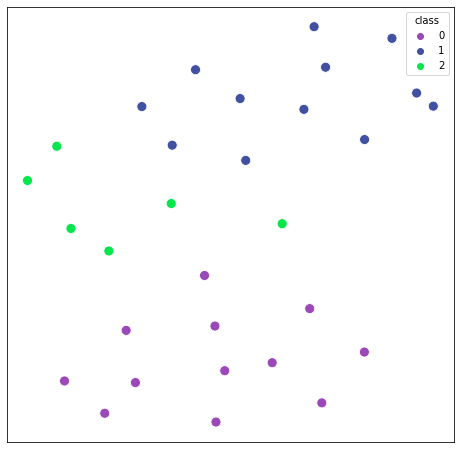

<ipython-input-16-459208db4b8a>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  waves1_df_inh['labels_wave'] = labels_wave1
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


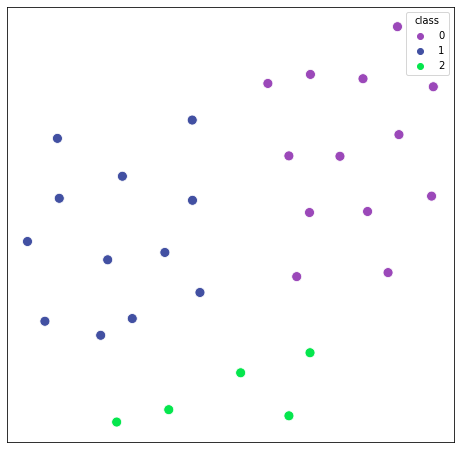

0.7714776030539698
0.7343737964635755


<ipython-input-16-459208db4b8a>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  waves2_df_inh['labels_wave'] = labels_wave2


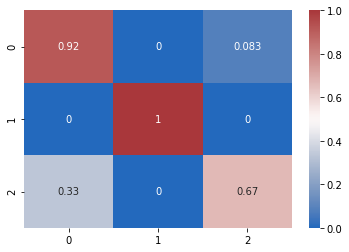

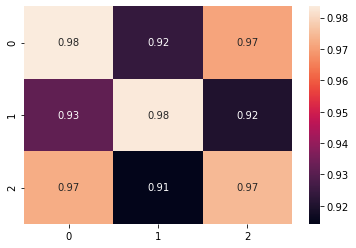

In [16]:

labels_wave1,mapper1,reducer1 = plot_UMAP_clusters_single(waves1_inh,
                          20,
                          0.1,
                          random_state =42,
                          res_louvain = 1.,
                          c_list =coherence_colors,
                          norm=False,
                          save=False,
                          savepath = savepath+'wave_cluster.pdf',
                          size=100
                          
                          )


waves1_df_inh['labels_wave'] = labels_wave1

labels_wave2,mapper2,reducer2 = plot_UMAP_clusters_single(waves2_inh,
                          20,
                          0.1,
                          random_state =42,
                          res_louvain = 1.,
                          c_list =coherence_colors,
                          norm=False,
                          save=False,
                          savepath = savepath+'wave_cluster.pdf',
                          size=100
                          )
waves2_df_inh['labels_wave'] = labels_wave2
print(adjusted_rand_score(labels_wave1,labels_wave2))
print(adjusted_mutual_info_score(labels_wave1,labels_wave2))
return_confusion_matrix_(waves1_df_inh,waves2_df_inh,'labels_wave','labels_wave',shuffle=False,cmap='vlag',vmin=0,vmax=1,figsize=[6,5],save=False,)
plt.show()
sns.heatmap(plot_cosine_mat(waves1_inh,waves2_inh,labels_wave1,labels_wave2),annot=True)
plt.show()

# data_wave_FN_acsf['labels_wave'] = labels_wave

0


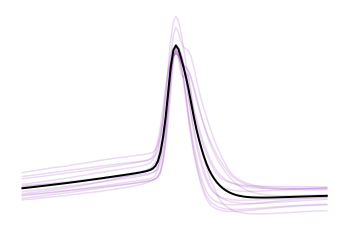

1


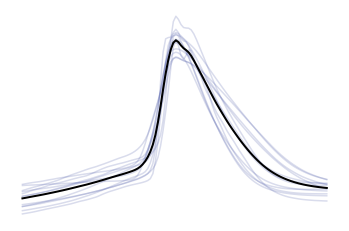

2


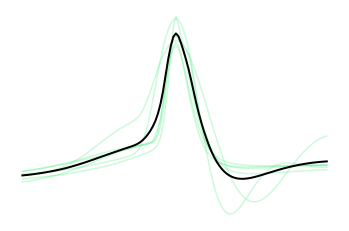

0


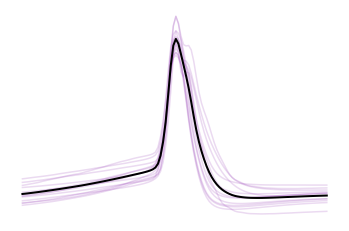

1


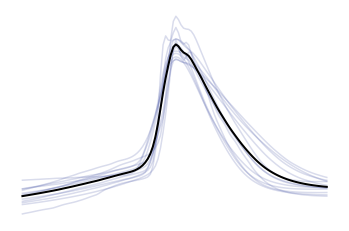

2


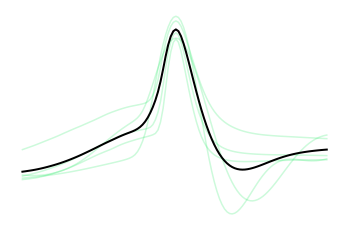

In [17]:
plot_waveforms(waves1_df_inh,c_list=coherence_colors)
plot_waveforms(waves2_df_inh,c_list=coherence_colors)

### Excitatory

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


4


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


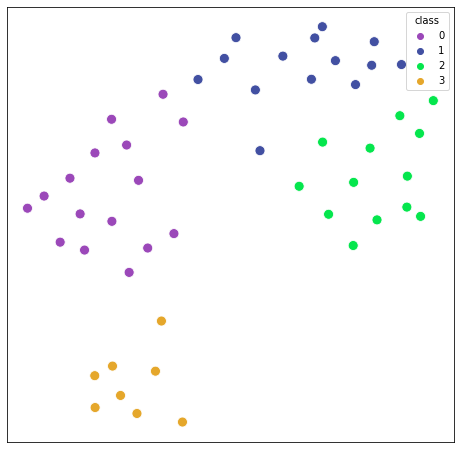

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


4


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


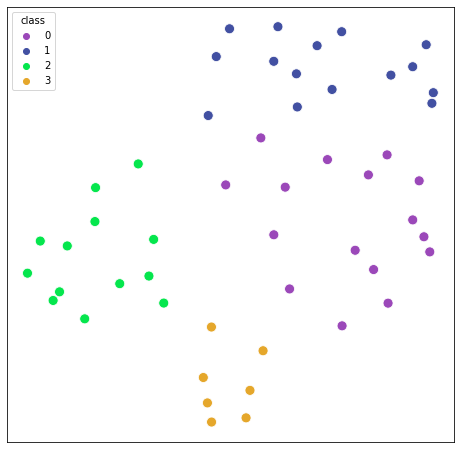

0.6353326501694018
0.651100128695311


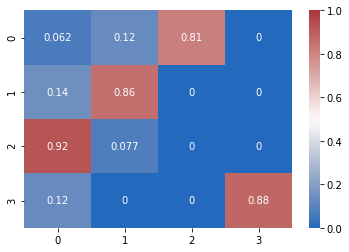

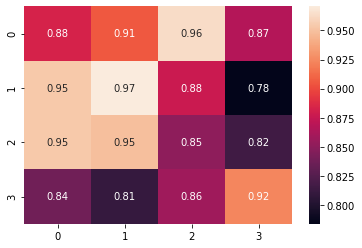

In [18]:

labels_wave1,mapper1,reducer1 = plot_UMAP_clusters_single(waves1_exc,
                          20,
                          0.1,
                          random_state =42,
                          res_louvain = 1.,
                          c_list =coherence_colors,
                          norm=False,
                          save=False,
                          savepath = savepath+'wave_cluster.pdf',
                          size=100
                          )


waves1_df_exc['labels_wave'] = labels_wave1

labels_wave2,mapper2,reducer2 = plot_UMAP_clusters_single(waves2_exc,
                          20,
                          0.1,
                          random_state =42,
                          res_louvain = 1.,
                          c_list =coherence_colors,
                          norm=False,
                          save=False,
                          savepath = savepath+'wave_cluster.pdf',
                          size=100
                          )
waves2_df_exc['labels_wave'] = labels_wave2
print(adjusted_rand_score(labels_wave1,labels_wave2))
print(adjusted_mutual_info_score(labels_wave1,labels_wave2))
return_confusion_matrix_(waves1_df_exc,waves2_df_exc,'labels_wave','labels_wave',shuffle=False,cmap='vlag',vmin=0,vmax=1,figsize=[6,5],save=False,)
plt.show()
sns.heatmap(plot_cosine_mat(waves1_exc,waves2_exc,labels_wave1,labels_wave2),annot=True)
plt.show()

# data_wave_FN_acsf['labels_wave'] = labels_wave

0


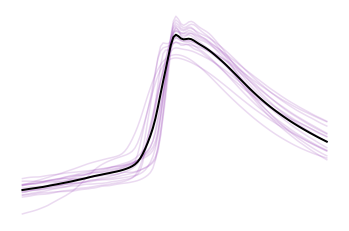

1


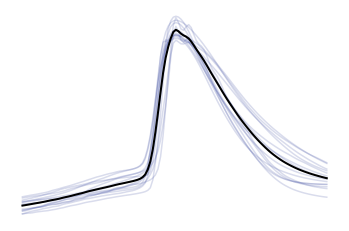

2


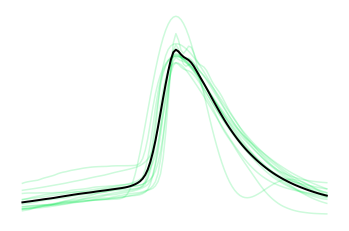

3


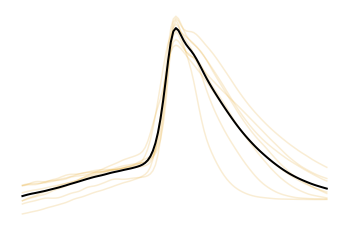

0


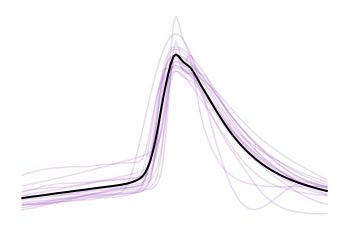

1


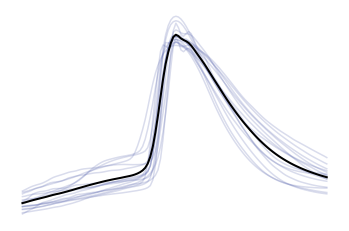

2


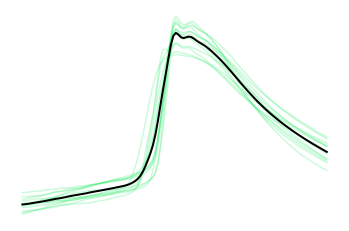

3


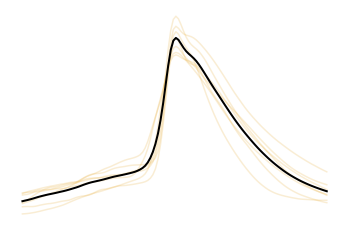

In [19]:
plot_waveforms(waves1_df_exc,c_list=coherence_colors)
plot_waveforms(waves2_df_exc,c_list=coherence_colors)

### Heterogeneity

d1


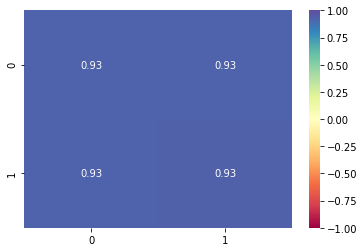

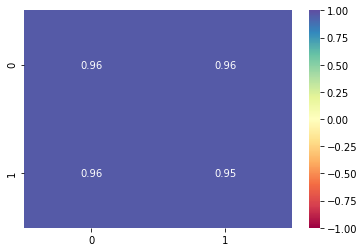

d2


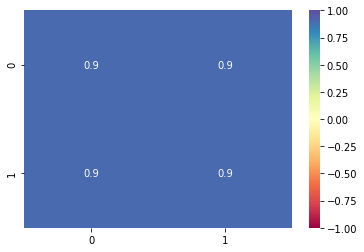

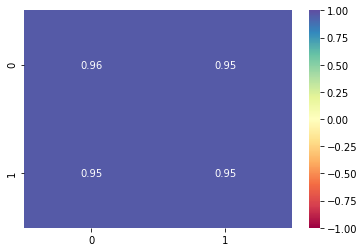

m1-ago


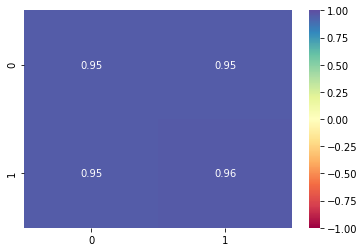

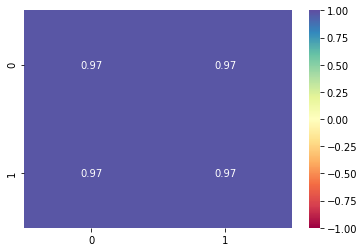

m1-ago+ant


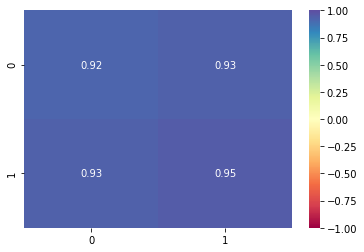

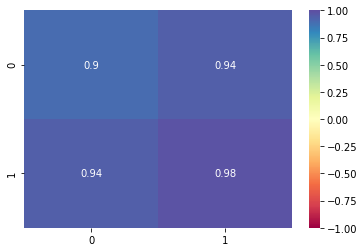

In [103]:
from sklearn.metrics.pairwise import cosine_similarity


for drug in ['d1', 'd2', 'm1-ago', 'm1-ago+ant']:
    print(drug)
    df_temp  = return_acsf_and_drug(ephys,cond=[drug],joint=True)
    df_temp_exc = df_temp[df_temp.ei_labels==1]
    df_temp_inh = df_temp[df_temp.ei_labels==0]

    heterogeniety_for_drug(df_temp_exc,cond=drug,cols='waveform')
    plt.show()
    heterogeniety_for_drug(df_temp_inh,cond=drug,cols='waveform')
    plt.show()

In [42]:
np.unique(ephys.cond,return_counts=True)

(array(['acsf', 'acsf_bic', 'cirazoline', 'd1', 'd2', 'dopamine', 'm1-ago',
        'm1-ago+ant', 'm1-ant', 'sag'], dtype=object),
 array([429,  39,  34,  88,  66,  40,  41,  46,  23,  23], dtype=int64))

## Waveform cluster for each Drug condition + acsf

### Excitatory

In [10]:
savepath = 'D:/Data For Publication/paper2/part2/'

d1
24 24


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


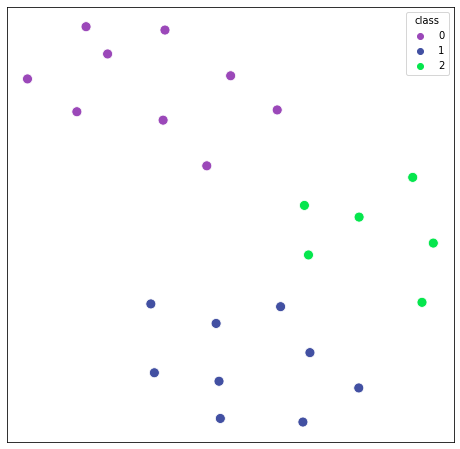

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


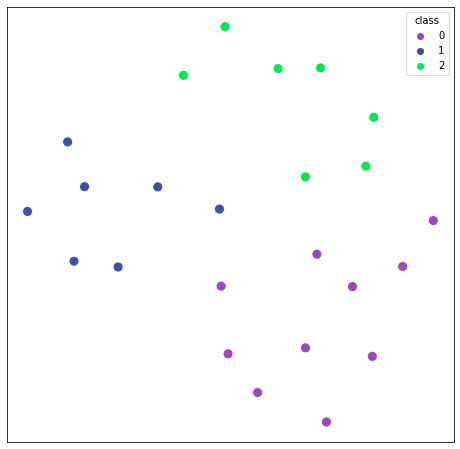

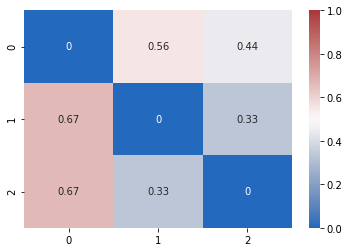

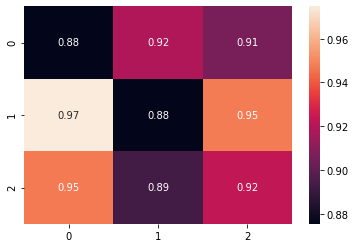

d2
40 40


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


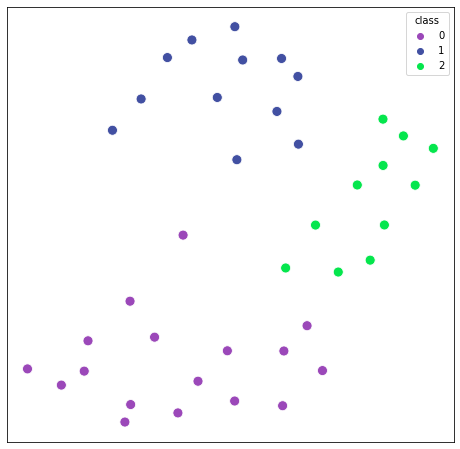

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


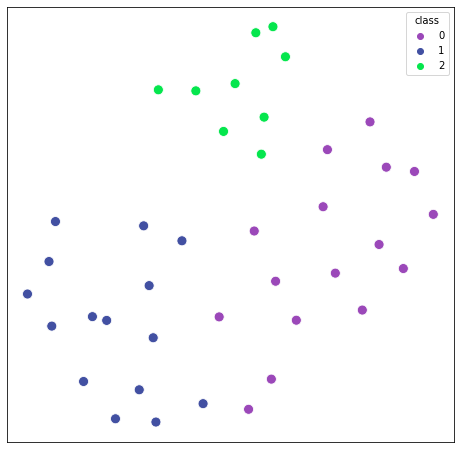

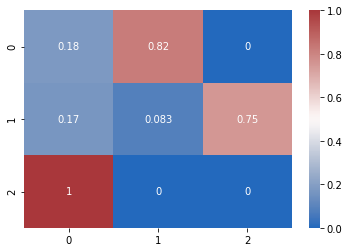

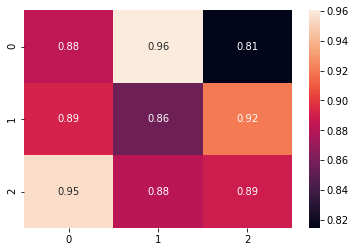

m1-ago
19 19


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


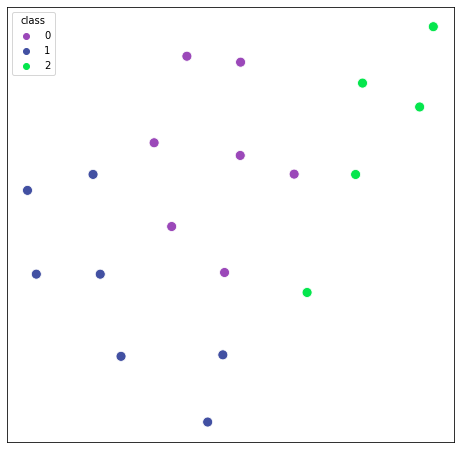

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


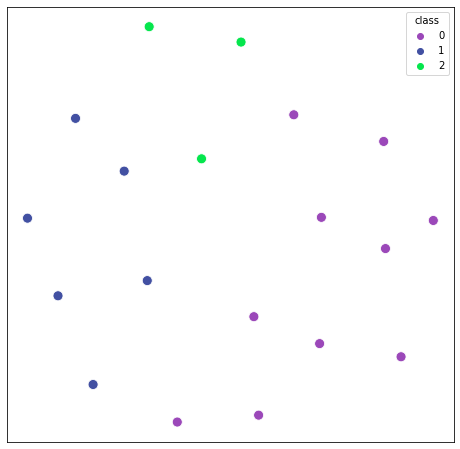

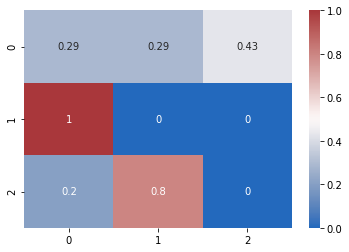

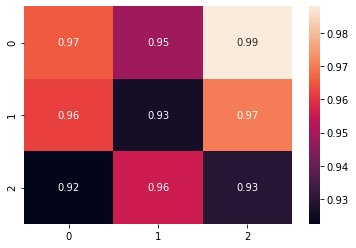

In [16]:
adj_rand_score = {}
adj_MI = {}


for cond in ['d1','d2','m1-ago']:
    print(cond)
    df_temp_acsf,df_temp_drug  = return_acsf_and_drug(ephys,cond=[cond],joint=False)
    df_temp_acsf_exc = df_temp_acsf[df_temp_acsf.ei_labels==1]
    df_temp_acsf_exc = df_temp_acsf_exc.drop_duplicates('exp_name')
    df_temp_drug_exc = df_temp_drug[df_temp_drug.ei_labels==1]
    df_temp_drug_exc = df_temp_drug_exc.drop_duplicates('exp_name')


    print(len(df_temp_acsf_exc), len(df_temp_drug_exc))

    waves_acsf = normalize(np.vstack(df_temp_acsf_exc['waveform']))
    labels_wave_acsf,mapper,reducer = plot_UMAP_clusters_single(waves_acsf,
                            20,
                            0.1,
                            random_state =42,
                            res_louvain = 1.,
                            c_list =coherence_colors,
                            norm=False,
                            save=True,
                            savepath = savepath+cond+'_wave_cluster_exc_acsf.pdf',
                            size=100
                            )
    df_temp_acsf_exc['labels_wave'] = labels_wave_acsf

    waves_drug = normalize(np.vstack(df_temp_drug_exc['waveform']))
    labels_wave_drug,mapper,reducer = plot_UMAP_clusters_single(waves_drug,
                            20,
                            0.1,
                            random_state =42,
                            res_louvain = 1.,
                            c_list =coherence_colors,
                            norm=False,
                            save=True,
                            savepath = savepath+cond+'_wave_cluster_exc_drug.pdf',
                            size=100
                            )
    df_temp_drug_exc['labels_wave'] = labels_wave_drug

    adj_rand_score[cond] = adjusted_rand_score(labels_wave_drug,labels_wave_acsf)
    adj_MI[cond] =  adjusted_mutual_info_score(labels_wave_drug,labels_wave_acsf)
    return_confusion_matrix_(df_temp_acsf_exc,df_temp_drug_exc,'labels_wave','labels_wave',shuffle=False,cmap='vlag',vmin=0,vmax=1,figsize=[6,5],save=True,savepath = savepath+cond+'_waveform_conf_exc.pdf')
    plt.show()
    plot_cosine_mat(waves_acsf,waves_drug,labels_wave_acsf,labels_wave_drug,save=True,savepath = savepath+cond+'_waveform_cosine_exc.pdf')
    plt.show()


In [106]:
adj_rand_score
adj_MI

{'d1': 0.33476974634575984,
 'd2': 0.5072594271101089,
 'm1-ago': 0.3640529896675248,
 'm1-ago+ant': 0.31814686909221496}

### Inhibitory

d1
29 29


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


4


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


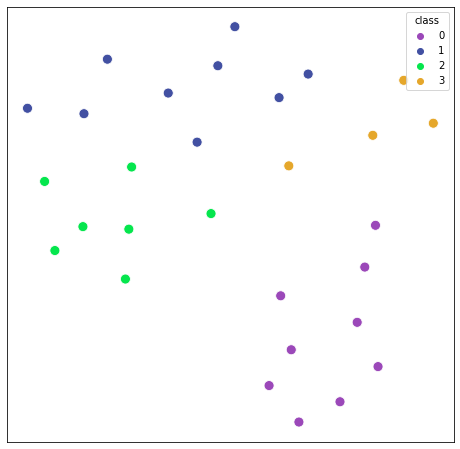

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


4


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


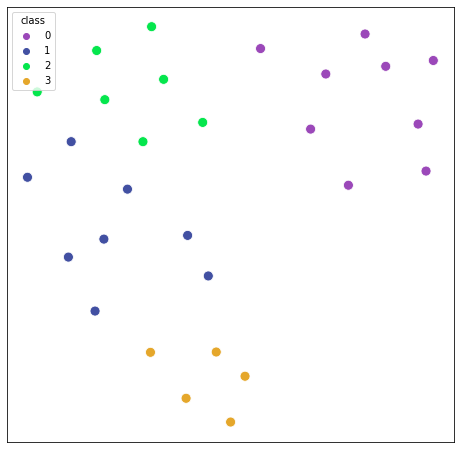

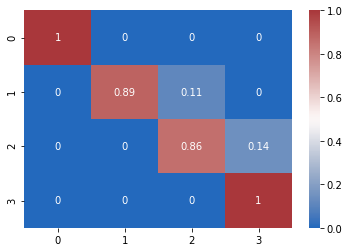

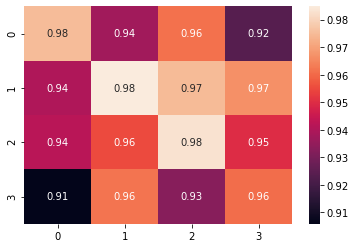

d2
19 19


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


2


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


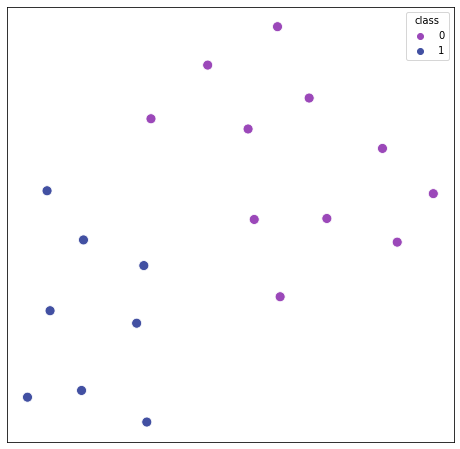

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


2


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


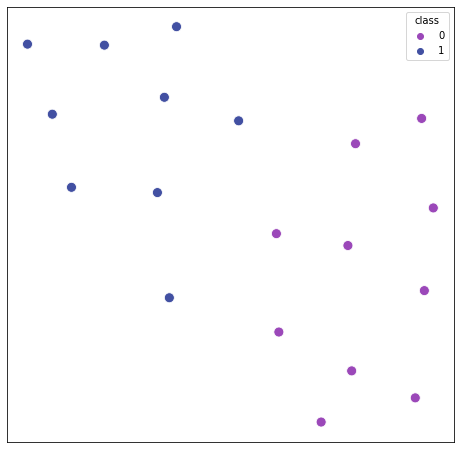

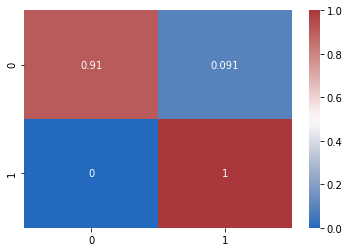

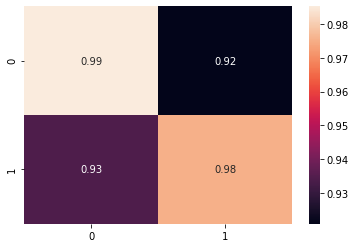

m1-ago
22 22


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


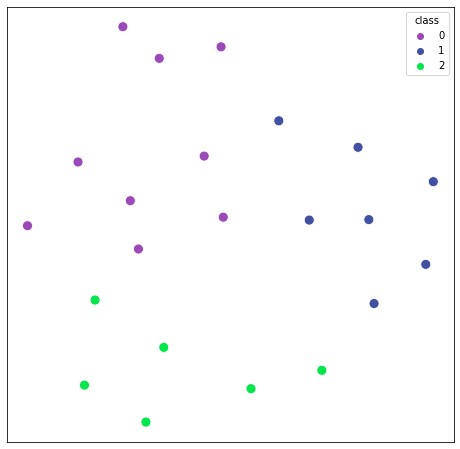

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


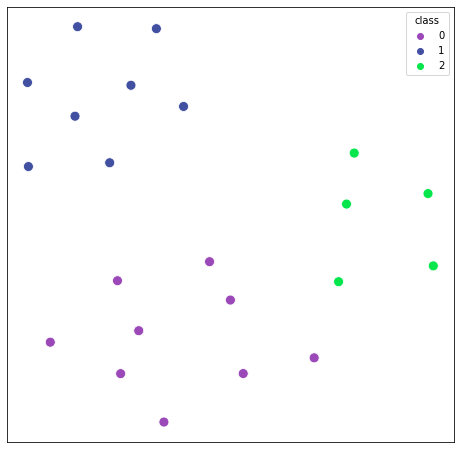

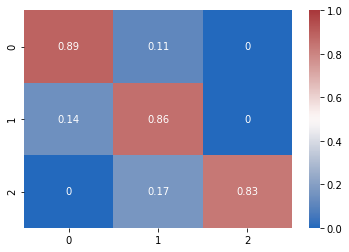

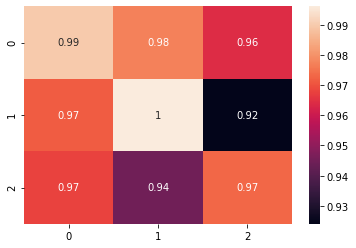

In [17]:
adj_rand_score = {}
adj_MI = {}

from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score

for cond in ['d1','d2','m1-ago']:
    print(cond)
    df_temp_acsf,df_temp_drug  = return_acsf_and_drug(ephys,cond=[cond],joint=False)
    df_temp_acsf_inh = df_temp_acsf[df_temp_acsf.ei_labels==0]
    df_temp_acsf_inh = df_temp_acsf_inh.drop_duplicates('exp_name')
    df_temp_drug_inh = df_temp_drug[df_temp_drug.ei_labels==0]
    df_temp_drug_inh = df_temp_drug_inh.drop_duplicates('exp_name')

    # df_temp_inh = df_temp[df_temp.ei_labels==0]

    print(len(df_temp_acsf_inh), len(df_temp_drug_inh))

    waves_acsf = normalize(np.vstack(df_temp_acsf_inh['waveform']))
    labels_wave_acsf,mapper,reducer = plot_UMAP_clusters_single(waves_acsf,
                            20,
                            0.1,
                            random_state =42,
                            res_louvain = 1.,
                            c_list =coherence_colors,
                            norm=False,
                            save=True,
                            savepath = savepath+cond+'_wave_cluster_ascf_inh.pdf',
                            size=100
                            )
    df_temp_acsf_inh['labels_wave'] = labels_wave_acsf

    waves_drug = normalize(np.vstack(df_temp_drug_inh['waveform']))
    labels_wave_drug,mapper,reducer = plot_UMAP_clusters_single(waves_drug,
                            20,
                            0.1,
                            random_state =42,
                            res_louvain = 1.,
                            c_list =coherence_colors,
                            norm=False,
                            save=True,
                            savepath = savepath+cond+'_wave_cluster_drug_inh.pdf',
                            size=100
                            )
    df_temp_drug_inh['labels_wave'] = labels_wave_drug

    adj_rand_score[cond] = adjusted_rand_score(labels_wave_drug,labels_wave_acsf)
    adj_MI[cond] =  adjusted_mutual_info_score(labels_wave_drug,labels_wave_acsf)
    return_confusion_matrix_(df_temp_acsf_inh,df_temp_drug_inh,'labels_wave','labels_wave',shuffle=False,cmap='vlag',vmin=0,vmax=1,figsize=[6,5], save=True, savepath = savepath + cond+'_waveform_conf_inh.pdf')
    plt.show()
    plot_cosine_mat(waves_acsf,waves_drug,labels_wave_acsf,labels_wave_drug,save=True,savepath = savepath+cond+'_waveform_cosine_inh.pdf')
    plt.show()

In [56]:
print(adj_rand_score)
print(adj_MI)

{'d1': 0.8374753978049838, 'd2': 0.7891491985203453, 'm1-ago': 0.599479843953186, 'm1-ago+ant': 0.7535428219346888}
{'d1': 0.8307900187146873, 'd2': 0.7401995392628736, 'm1-ago': 0.5831840509025709, 'm1-ago+ant': 0.7467769051669076}


## Significance test

<Axes: >

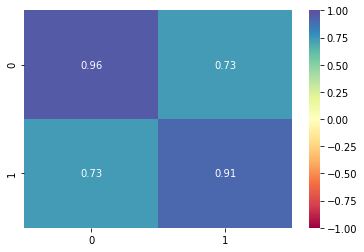

In [23]:
from sklearn.metrics.pairwise import cosine_similarity

data_wave_FN_acsf.labels_wave = binarize_EI_labels(np.array(data_wave_FN_acsf.labels_wave),[1,2,3,5])
wave_exc = data_wave_FN_acsf[data_wave_FN_acsf.labels_wave.isin([1,2,3,5])]
wave_inh = data_wave_FN_acsf[data_wave_FN_acsf.labels_wave.isin([0,6,4])]

cosine_mat = np.zeros((2,2))
for i in range(2):
    for j in range(2):
        cosine_mat[i,j] = np.mean(cosine_similarity(normalize(np.vstack(data_wave_FN_acsf[data_wave_FN_acsf.labels_wave==i]['waveform'].to_numpy())),
                  normalize(np.vstack(data_wave_FN_acsf[data_wave_FN_acsf.labels_wave==j]['waveform'].to_numpy()))))

sns.heatmap(cosine_mat,vmax=1,vmin=-1,annot=True,cmap = 'Spectral')
# plt.savefig(savepath+'EI_similarity.pdf',dpi=200)

In [22]:
from statsmodels.stats.libqsturng import qsturng, psturng
# from hypothetical.descriptive import var
from itertools import combinations
def games_howell(*args,alpha=0.05):
    alpha = 0.05
    k = len(args)

    group_means =    [np.mean(i) for i in args]
    group_obs =      [len(i) for i in args]
    group_variance = [np.var(i) for i in args]

    combs = list(combinations(np.arange(3),2))

    group_comps = []
    mean_differences = []
    degrees_freedom = []
    t_values = []
    p_values = []
    std_err = []
    up_conf = []
    low_conf = []

    for comb in combs:
        # Mean differences of each group combination
        diff = group_means[comb[1]] - group_means[comb[0]]
        
        # t-value of each group combination
        t_val = np.abs(diff) / np.sqrt((group_variance[comb[0]] / group_obs[comb[0]]) + 
                                    (group_variance[comb[1]] / group_obs[comb[1]]))
        
        # Numerator of the Welch-Satterthwaite equation
        df_num = (group_variance[comb[0]] / group_obs[comb[0]] + group_variance[comb[1]] / group_obs[comb[1]]) ** 2
        
        # Denominator of the Welch-Satterthwaite equation
        df_denom = ((group_variance[comb[0]] / group_obs[comb[0]]) ** 2 / (group_obs[comb[0]] - 1) +
                    (group_variance[comb[1]] / group_obs[comb[1]]) ** 2 / (group_obs[comb[1]] - 1))
        
        # Degrees of freedom
        df = df_num / df_denom
        
        # p-value of the group comparison
        p_val = psturng(t_val * np.sqrt(2), k, df)

        # Standard error of each group combination
        se = np.sqrt(0.5 * (group_variance[comb[0]] / group_obs[comb[0]] + 
                            group_variance[comb[1]] / group_obs[comb[1]]))
        
        # Upper and lower confidence intervals
        upper_conf = diff + qsturng(1 - alpha, k, df)
        lower_conf = diff - qsturng(1 - alpha, k, df)
        
        # Append the computed values to their respective lists.
        mean_differences.append(diff)
        degrees_freedom.append(df)
        t_values.append(t_val)
        p_values.append(p_val)
        std_err.append(se)
        up_conf.append(upper_conf)
        low_conf.append(lower_conf)
        group_comps.append(str(comb[0]) + ' : ' + str(comb[1]))
    return pd.DataFrame({'mean_differences':mean_differences,'degrees_freedom':degrees_freedom,'t_values':t_values,'p_values':p_values,'std_err':std_err,'up_conf':up_conf,'low_conf':low_conf,'group_comps':group_comps})

In [383]:
import numpy as np
from scipy.stats import f_oneway
import statsmodels.api as sm
def calcualte_cosine_sig(data1,data2,data3):
    return sm.stats.anova_oneway([data1,data2,data3])

data1 = cosine_similarity(normalize(np.vstack(data_wave_FN_acsf[data_wave_FN_acsf.labels_wave==0]['waveform'].to_numpy())),
                  normalize(np.vstack(data_wave_FN_acsf[data_wave_FN_acsf.labels_wave==0]['waveform'].to_numpy())))
data1 = data1[np.tril_indices_from(data1,k=1)]
data2 = cosine_similarity(normalize(np.vstack(data_wave_FN_acsf[data_wave_FN_acsf.labels_wave==1]['waveform'].to_numpy())),
                  normalize(np.vstack(data_wave_FN_acsf[data_wave_FN_acsf.labels_wave==1]['waveform'].to_numpy())))
data2 = data2[np.tril_indices_from(data2,k=1)]
data3 = cosine_similarity(normalize(np.vstack(data_wave_FN_acsf[data_wave_FN_acsf.labels_wave==1]['waveform'].to_numpy())),
                  normalize(np.vstack(data_wave_FN_acsf[data_wave_FN_acsf.labels_wave==0]['waveform'].to_numpy())))
data3 = data3.reshape(1,-1)[0]


print(calcualte_cosine_sig(data1,data2,data3))

statistic = 19148.005542600265
pvalue = 0.0
df = (2.0, 32096.94365369221)
df_num = 2.0
df_denom = 32096.94365369221
nobs_t = 49138.0
n_groups = 3
means = [0.95994265 0.91641193 0.7311218 ]
nobs = [ 8126. 17576. 23436.]
vars_ = [0.00158343 0.00561306 0.02768931]
use_var = unequal
welch_correction = True
tuple = (19148.005542600265, 0.0)


In [24]:
games_howell(data1,data2,data3)

NameError: name 'data1' is not defined

# Electrophysiology

In [18]:
cols_ephys = ['current_at_first_spike', 'ap_count', 'fr', 'inst_fr','time_to_first_spike',
             'mean_isi', 'median_isi', 'max_isi', 'min_isi',
             'first_thr', 'mean_thr', 'median_thr', 'min_thr', 'max_thr',
             'mean_width', 'median_width', 'max_width', 'min_width',
             'mean_amplitude', 'median_amplitude', 'min_amplitude']

## heterogeniety beween acsf and drug

d1


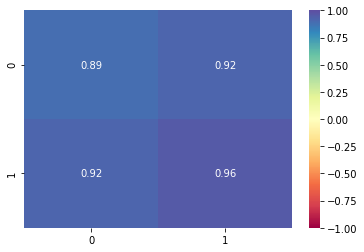

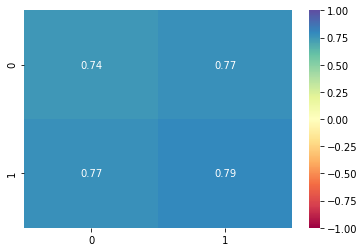

d2


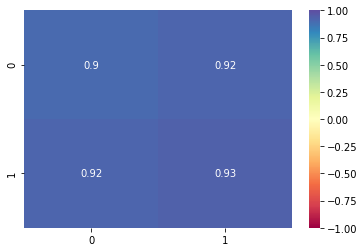

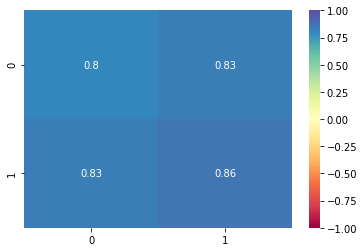

m1-ago


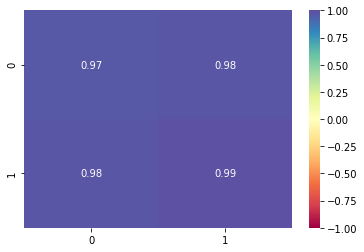

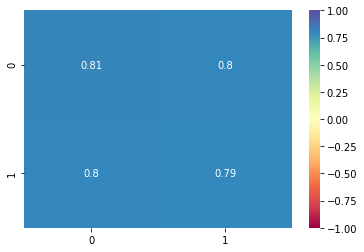

m1-ago+ant


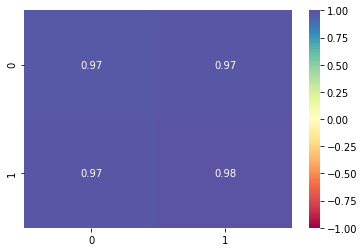

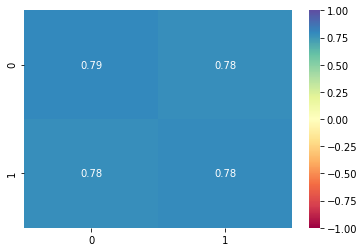

In [283]:

for drug in ['d1', 'd2', 'm1-ago', 'm1-ago+ant']:
    print(drug)
    df_temp  = return_acsf_and_drug(ephys,cond=[drug],joint=True)
    df_temp_exc = df_temp[df_temp.ei_labels==1]
    df_temp_inh = df_temp[df_temp.ei_labels==0]

    heterogeniety_for_drug(df_temp_exc,cond=drug,cols=cols_ephys)
    plt.show()
    heterogeniety_for_drug(df_temp_inh,cond=drug,cols=cols_ephys)
    plt.show()

## Excitatory cluster

In [ ]:
cols =  data_ephys_FN_acsf.columns[:-6]
data_umap_scaler = StandardScaler()

find_optimum_res(data_umap_scaler.fit_transform(normalize(ephys_exc[cols].to_numpy())),save=True,savepath=savepath+'exc_ephys_cluster_stability.pdf')
find_optimum_res(data_umap_scaler.fit_transform(normalize(ephys_inh[cols].to_numpy())),save=True,savepath=savepath+'inh_ephys_cluster_stability.pdf')

d1
29 29


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


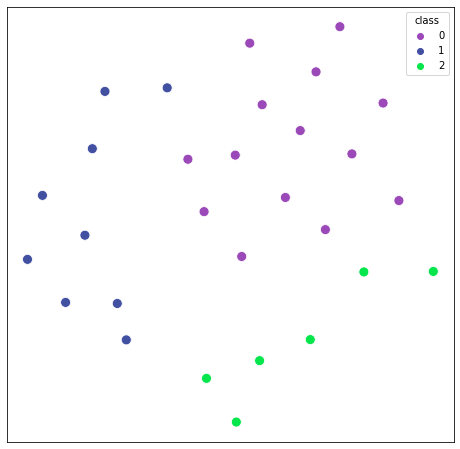

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


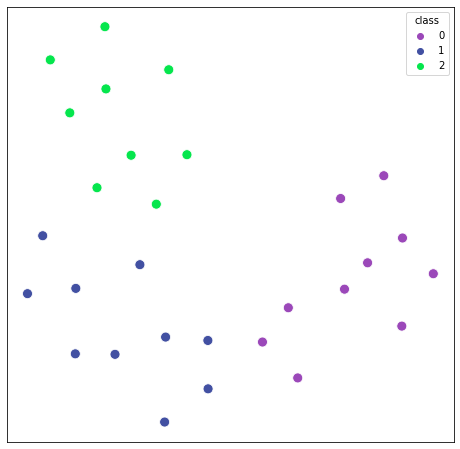

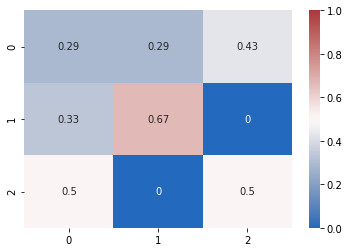

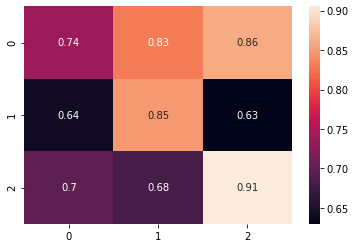

d2
19 19


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


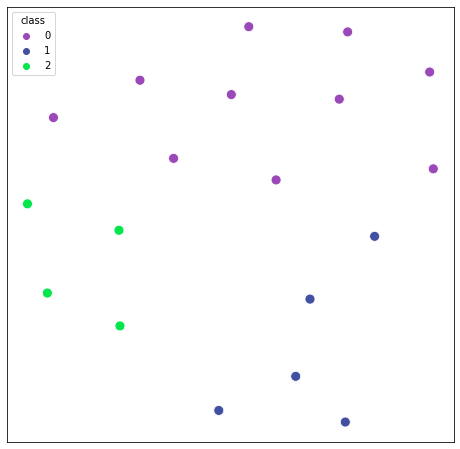

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


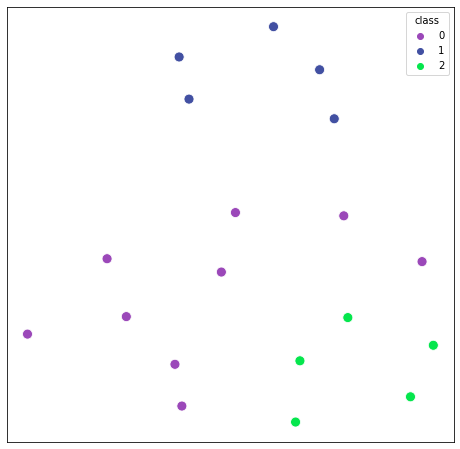

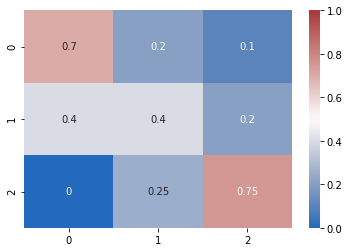

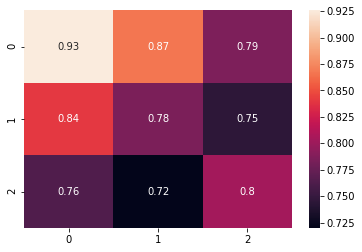

m1-ago
22 22


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


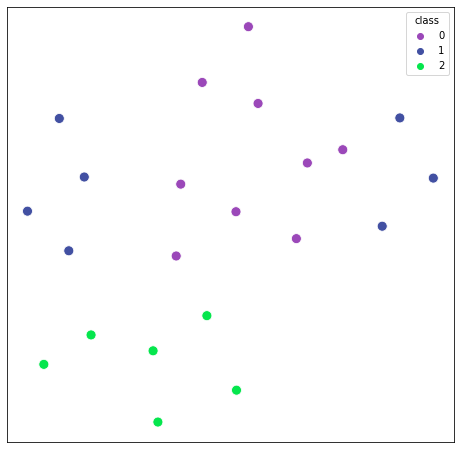

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


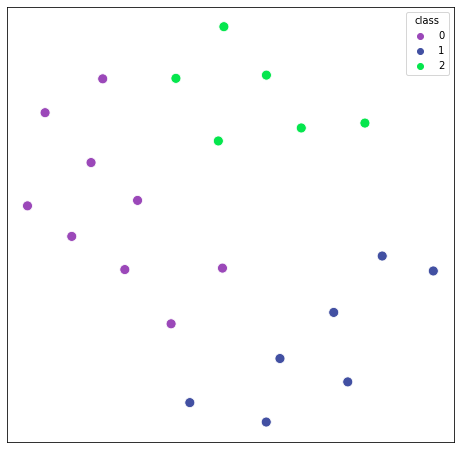

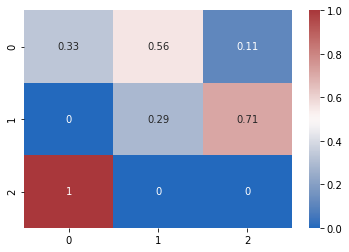

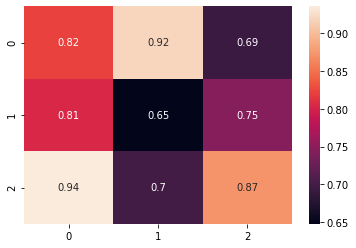

In [24]:
adj_rand_score_exc = {}
adj_MI_exc = {}
save_dtype = 'ephys'
ei_type = 'exc'
from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score

for cond in ['d1','d2','m1-ago']:
    print(cond)
    df_temp_acsf,df_temp_drug  = return_acsf_and_drug(ephys,cond=[cond],joint=False)
    df_temp_acsf_exc = df_temp_acsf[df_temp_acsf.ei_labels==0]
    df_temp_acsf_exc = df_temp_acsf_exc.drop_duplicates('exp_name')
    df_temp_drug_exc = df_temp_drug[df_temp_drug.ei_labels==0]
    df_temp_drug_exc = df_temp_drug_exc.drop_duplicates('exp_name')


    print(len(df_temp_acsf_exc), len(df_temp_drug_exc))

    waves_acsf = normalize(np.vstack(df_temp_acsf_exc[cols_ephys].to_numpy()))
    labels_wave_acsf,mapper,reducer = plot_UMAP_clusters_single(waves_acsf,
                            20,
                            0.1,
                            random_state =42,
                            res_louvain = 1.,
                            c_list =coherence_colors,
                            norm=False,
                            save=True,
                            savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_cluster_'+ei_type+'_acsf.pdf',
                            size=100
                            )
    df_temp_acsf_exc['labels_wave'] = labels_wave_acsf

    waves_drug = normalize(np.vstack(df_temp_drug_exc[cols_ephys].to_numpy()))
    labels_wave_drug,mapper,reducer = plot_UMAP_clusters_single(waves_drug,
                            20,
                            0.1,
                            random_state =42,
                            res_louvain = 1.,
                            c_list =coherence_colors,
                            norm=False,
                            save=True,
                            savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_cluster_'+ei_type+'_drug.pdf',
                            size=100
                            )
    df_temp_drug_exc['labels_wave'] = labels_wave_drug

    adj_rand_score_exc[cond] = adjusted_rand_score(labels_wave_drug,labels_wave_acsf)
    adj_MI_exc[cond] =  adjusted_mutual_info_score(labels_wave_drug,labels_wave_acsf)
    return_confusion_matrix_(df_temp_acsf_exc, df_temp_drug_exc, 'labels_wave', 'labels_wave', shuffle=False, cmap='vlag', vmin=0, vmax=1, figsize=[6,5], save=True, savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_confusion_'+ei_type+'.pdf')
    plt.show()
    plot_cosine_mat(waves_acsf, waves_drug, labels_wave_acsf, labels_wave_drug, save=True, savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_cosine_'+ei_type+'.pdf' )
    plt.show()

In [285]:
print(adj_rand_score_exc)
print(adj_MI_exc)

{'d1': 0.07707055214723926, 'd2': 0.18231499051233396, 'm1-ago': 0.3341194968553459, 'm1-ago+ant': 0.1325339558573854}
{'d1': 0.15739885504068765, 'd2': 0.1148264166404485, 'm1-ago': 0.4116422197043979, 'm1-ago+ant': 0.13994582152784282}


## Inhibitory cluster

d1
24 24


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


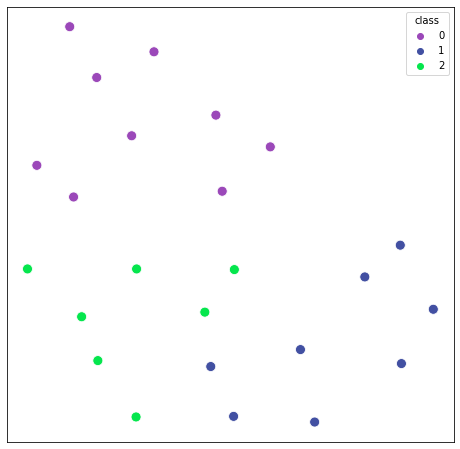

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


2


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


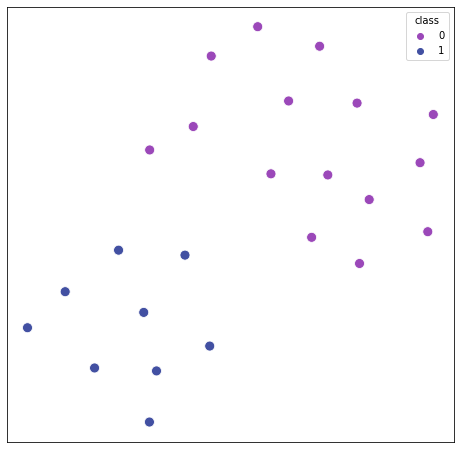

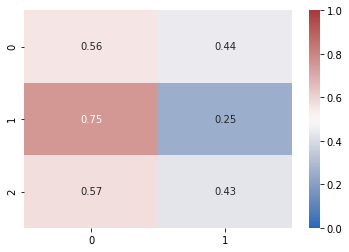

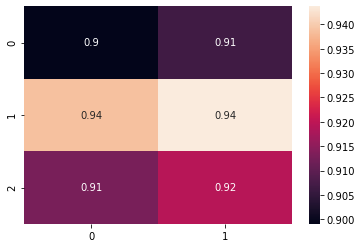

d2
40 40


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


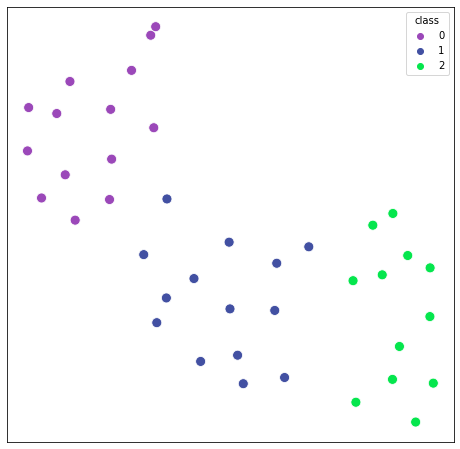

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


4


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


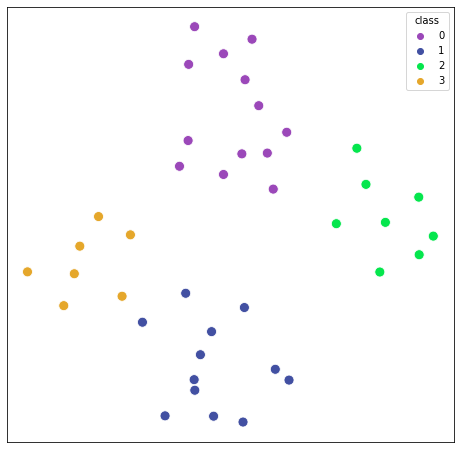

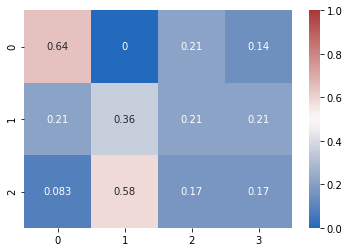

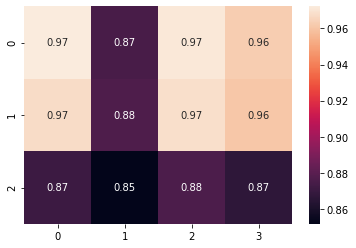

m1-ago
19 19


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


2


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


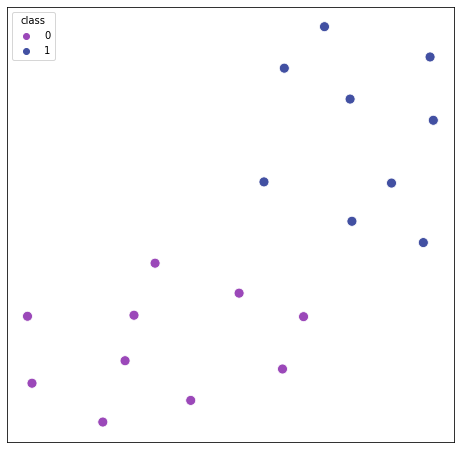

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


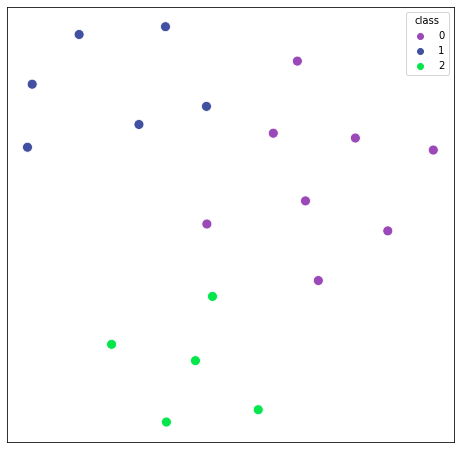

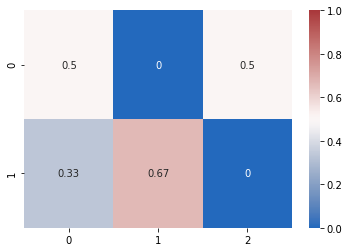

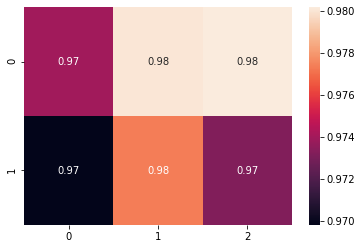

In [27]:
adj_rand_score_inh = {}
adj_MI_inh = {}

from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score
save_dtype = 'ephys' 
ei_type = 'inh'
for cond in ['d1','d2','m1-ago']:
    print(cond)
    df_temp_acsf,df_temp_drug  = return_acsf_and_drug(ephys,cond=[cond],joint=False)
    df_temp_acsf_inh = df_temp_acsf[df_temp_acsf.ei_labels==1]
    df_temp_acsf_inh = df_temp_acsf_inh.drop_duplicates('exp_name')
    df_temp_drug_inh = df_temp_drug[df_temp_drug.ei_labels==1]
    df_temp_drug_inh = df_temp_drug_inh.drop_duplicates('exp_name')

    # df_temp_inh = df_temp[df_temp.ei_labels==0]

    print(len(df_temp_acsf_inh), len(df_temp_drug_inh))

    waves_acsf = normalize(np.vstack(df_temp_acsf_inh[cols_ephys].to_numpy()))
    labels_wave_acsf,mapper,reducer = plot_UMAP_clusters_single(waves_acsf,
                            20,
                            0.1,
                            random_state =42,
                            res_louvain = 1.,
                            c_list =coherence_colors,
                            norm=False,
                            save=False,
                            savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_cluster_'+ei_type+'_acsf.pdf',
                            size=100
                            )
    df_temp_acsf_inh['labels_wave'] = labels_wave_acsf

    waves_drug = normalize(np.vstack(df_temp_drug_inh[cols_ephys].to_numpy()))
    labels_wave_drug,mapper,reducer = plot_UMAP_clusters_single(waves_drug,
                            20,
                            0.1,
                            random_state =42,
                            res_louvain = 1.,
                            c_list =coherence_colors,
                            norm=False,
                            save=False,
                            savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_cluster_'+ei_type+'_drug.pdf',
                            size=100
                            )
    df_temp_drug_inh['labels_wave'] = labels_wave_drug

    adj_rand_score_inh[cond] = adjusted_rand_score(labels_wave_drug,labels_wave_acsf)
    adj_MI_inh[cond] =  adjusted_mutual_info_score(labels_wave_drug,labels_wave_acsf)
    return_confusion_matrix_(df_temp_acsf_inh,df_temp_drug_inh,'labels_wave','labels_wave',
                             shuffle=False,
                             cmap='vlag',
                             vmin=0,
                             vmax=1,
                             figsize=[6,5],
                             save=True, 
                             savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_confusion_'+ei_type+'_acsf.pdf')
    plt.show()
                            
    plot_cosine_mat(waves_acsf,waves_drug,labels_wave_acsf,labels_wave_drug, 
                    save = True, 
                    savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_cosine_'+ei_type+'_acsf.pdf')
    plt.show()

In [ ]:
print(adj_rand_score_inh)
print(adj_MI_inh)

{'d1': -0.03483830651460709, 'd2': 0.12967468540031904, 'm1-ago': 0.30778894472361806, 'm1-ago+ant': 0.22121896162528218}
{'d1': -0.03530618035000067, 'd2': 0.12750903292246726, 'm1-ago': 0.4275026290867327, 'm1-ago+ant': 0.20742232264726876}


## polar exc

In [48]:
cols_spikes   = ['current_at_first_spike', 'ap_count', 'fr', 'inst_fr', 'mean_isi', 'median_isi', 'max_isi', 'min_isi',]
cols_thrs     = ['first_thr', 'mean_thr', 'median_thr', 'min_thr', 'max_thr',]
cols_wf       = ['mean_width', 'median_width', 'max_width', 'min_width','mean_amplitude', 'median_amplitude', 'min_amplitude', 'max_amplitude',]

### D1

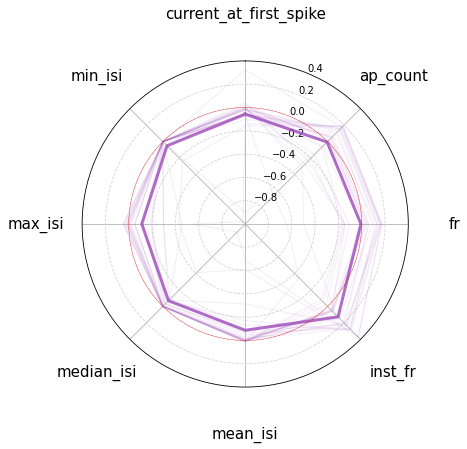

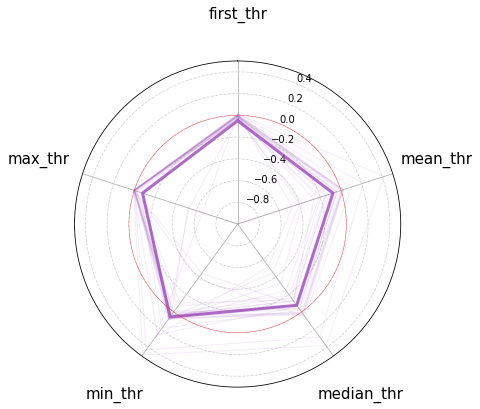

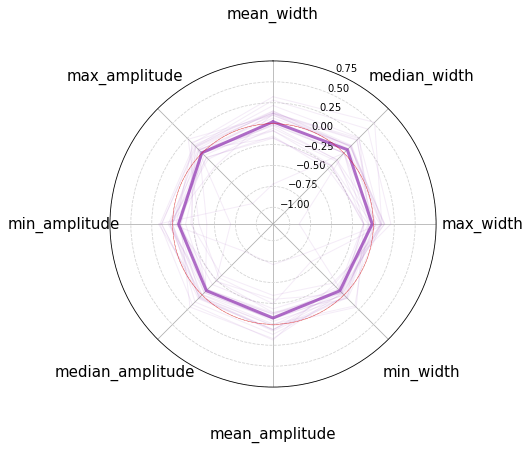

In [30]:
df_temp_acsf,df_temp_drug  = return_acsf_and_drug(ephys,cond=['d1'],joint=False)
exc_acsf = df_temp_acsf[df_temp_acsf.ei_labels==1]
exc_acsf = exc_acsf.drop_duplicates('exp_name')
# exc_acsf.reset_index(True)
exc_drug = df_temp_drug[df_temp_drug.ei_labels==1]
exc_drug = exc_drug.drop_duplicates('exp_name')
# exc_drug.reset_index(True) 

plot_radar((exc_acsf[cols_spikes].reset_index(drop=True) - exc_drug[cols_spikes].reset_index(drop=True))/exc_acsf[cols_spikes].reset_index(drop=True),
           cols_spikes,
           np.repeat(0, len(exc_acsf)),
           logscale=False,lims=(-1,0.4),
           label_font_size=15,
           palette=coherence_colors,
           save=True,
           savepath=savepath+'d1/ephys/'+'Exc_FN_spikes_radar.pdf',linewidth=0.3)

plot_radar((exc_acsf[cols_thrs].reset_index(drop=True) - exc_drug[cols_thrs].reset_index(drop=True))/exc_acsf[cols_thrs].reset_index(drop=True),
           cols_thrs,  
           np.repeat(0, len(exc_acsf)),lims=(-1,0.5),
           palette=coherence_colors,
           label_font_size=15,
           logscale = False,
           save=True,
           savepath=savepath+'d1/ephys/'+'Exc_FN_thrs_radar.pdf',linewidth=0.3)

plot_radar((exc_acsf[cols_wf].reset_index(drop=True) - exc_drug[cols_wf].reset_index(drop=True))/exc_acsf[cols_wf].reset_index(drop=True),
           cols_wf,    
           np.repeat(0, len(exc_acsf)),
           logscale=False,
           lims=(-1.2,75e-2),
           palette=coherence_colors,
           label_font_size=15,
           save=True,
           savepath=savepath+'d1/ephys/'+'Exc_FN_wave_radar.pdf',linewidth=0.3)

#### Significance

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:8.741e-04 t=-3.822e+00


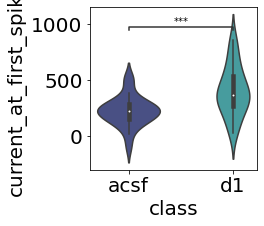

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:5.003e-01 t=6.848e-01


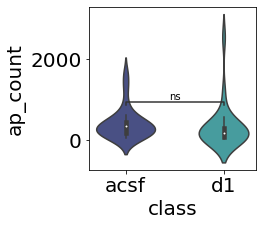

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:3.647e-01 t=9.248e-01


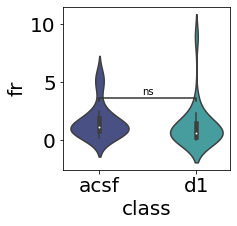

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:3.248e-04 t=4.221e+00


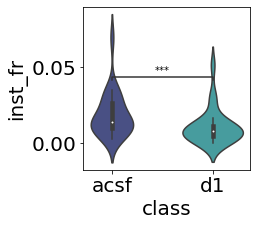

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:2.022e-01 t=-1.313e+00


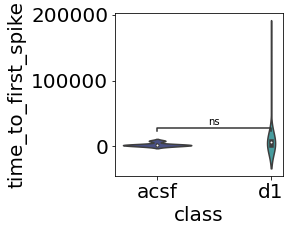

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:1.198e-01 t=-1.616e+00


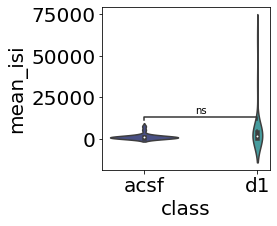

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:1.340e-01 t=-1.553e+00


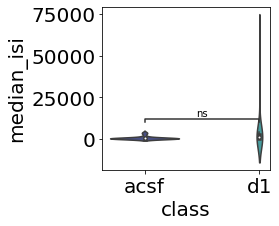

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:4.478e-02 t=-2.122e+00


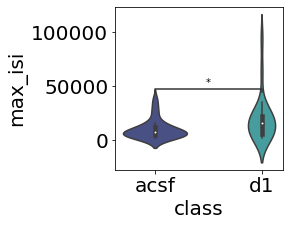

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:2.289e-01 t=-1.236e+00


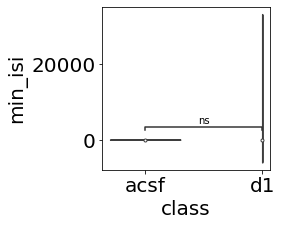

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:6.818e-03 t=2.972e+00


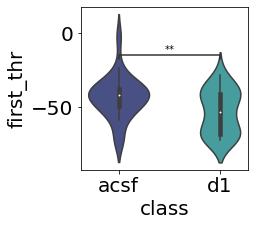

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:6.952e-02 t=1.904e+00


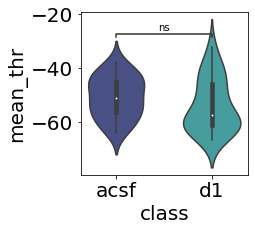

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:6.123e-02 t=1.968e+00


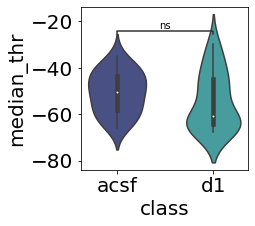

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:1.738e-01 t=-1.404e+00


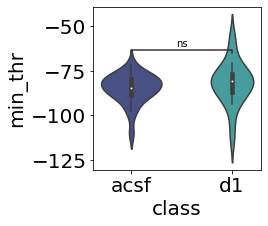

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:9.955e-02 t=1.716e+00


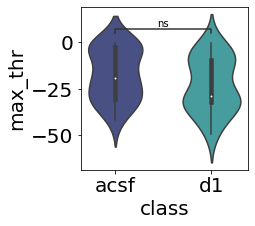

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:4.043e-01 t=8.496e-01


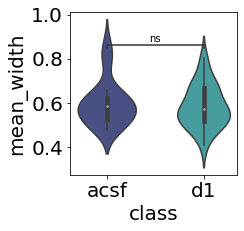

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:1.387e-01 t=1.534e+00


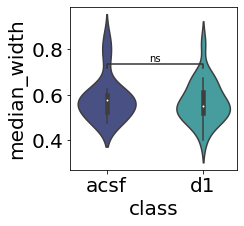

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:5.513e-01 t=6.047e-01


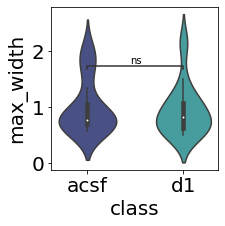

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:1.483e-01 t=-1.496e+00


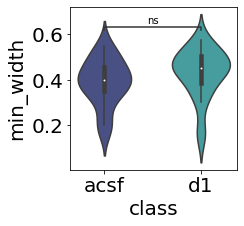

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:8.839e-02 t=-1.779e+00


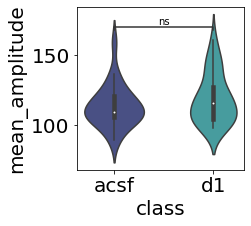

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:1.067e-01 t=-1.679e+00


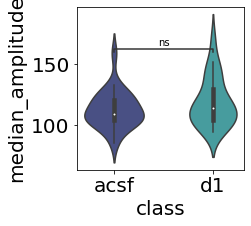

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:1.273e-01 t=-1.582e+00


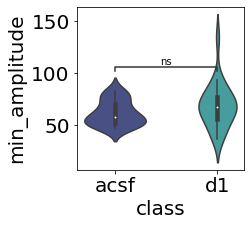

,feature,p_val,t_stat,cohen_d
0,current_at_first_spike,0.000874,-3.822132,-1.021133
1,ap_count,0.500301,0.684820,0.174922
2,fr,0.364682,0.924779,0.254005
3,inst_fr,0.000325,4.220729,0.625245
4,time_to_first_spike,0.202203,-1.312789,-0.386332
5,mean_isi,0.119788,-1.615733,-0.477346
6,median_isi,0.134003,-1.553308,-0.461305
7,max_isi,0.044780,-2.122479,-0.609089
8,min_isi,0.228860,-1.236203,-0.364550
9,first_thr,0.006818,2.972344,0.711529


In [290]:
df_temp_d1_acsf,df_temp_d1_drug  = return_acsf_and_drug(ephys[ephys.ei_labels==1],cond=['d1'],joint=False,remove_duplicates=True)
df_temp_d1 = pd.concat([df_temp_d1_acsf,df_temp_d1_drug])
from scipy import stats
D1_exc_sig_df = pd.DataFrame(columns= ['feature','p_val','t_stat','cohen_d'])
for val in cols_ephys:
    acsf = df_temp_d1_acsf[df_temp_d1_acsf.cond=='acsf'][val].to_numpy()
    drug = df_temp_d1_drug[df_temp_d1_drug.cond!='ascf'][val].to_numpy()
    t_statistic, p_value = stats.ttest_rel(acsf, drug)
    cohend_val = cohend(acsf,drug)
    D1_exc_sig_df.loc[len(D1_exc_sig_df)] = [val, p_value,t_statistic,cohend_val]
    fig,ax = plt.subplots(1,1,figsize=[3,3])

    plot_significance_new(data = df_temp_d1,
    var = val,
    hue = 'cond',
    ax = ax,
    drug = True,
    # palette = CUSTOM_PAL_SORT_3[:len(set(df_temp_m1_ant_ago['labels_lv']))] 
    test ='t-test_paired'
    )

#     # plt.savefig('C:/Users/Nishant Joshi/Documents/DNM/'+val+'_'+cond+'_dist.png',dpi=200)
D1_exc_sig_df

### D2

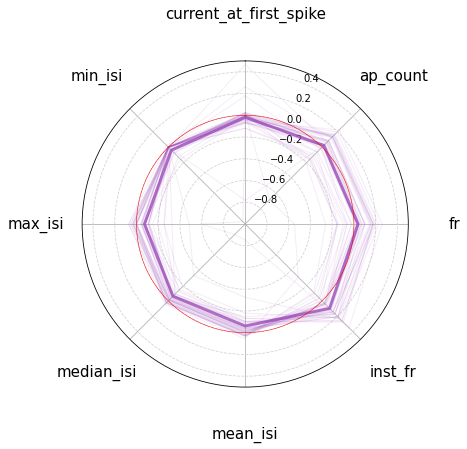

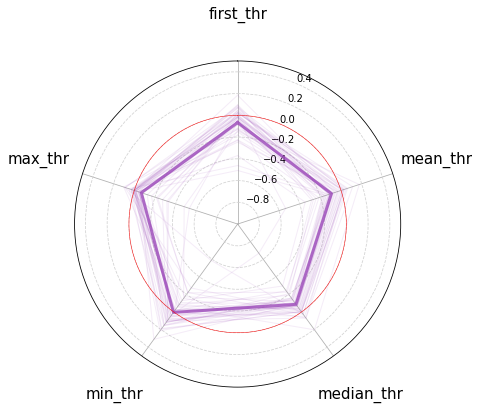

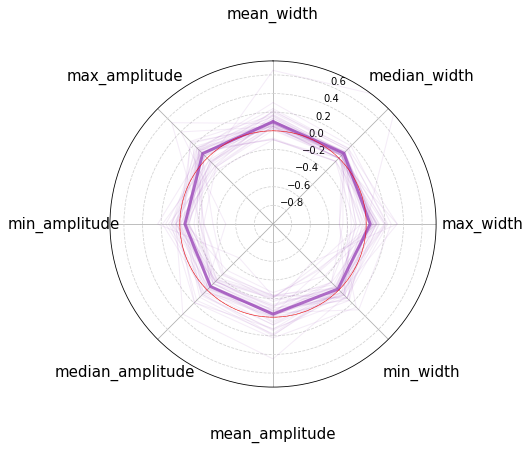

In [36]:
df_temp_acsf,df_temp_drug  = return_acsf_and_drug(ephys,cond=['d2'],joint=False)
exc_acsf = df_temp_acsf[df_temp_acsf.ei_labels==1]
exc_acsf = exc_acsf.drop_duplicates('exp_name')
# exc_acsf.reset_index(True)
exc_drug = df_temp_drug[df_temp_drug.ei_labels==1]
exc_drug = exc_drug.drop_duplicates('exp_name')
# exc_acsf.reset_index(True) 
data_spikes = (exc_acsf[cols_spikes].reset_index(drop=True) - exc_drug[cols_spikes].reset_index(drop=True))/exc_acsf[cols_spikes].reset_index(drop=True)
data_thrs = (exc_acsf[cols_thrs].reset_index(drop=True) - exc_drug[cols_thrs].reset_index(drop=True))/exc_acsf[cols_thrs].reset_index(drop=True)
data_wf = (exc_acsf[cols_wf].reset_index(drop=True) - exc_drug[cols_wf].reset_index(drop=True))/exc_acsf[cols_wf].reset_index(drop=True)

plot_radar(data_spikes,cols_spikes,  np.repeat(0, len(exc_acsf)),
           logscale=False,
           lims=(-1,0.5),
           palette=coherence_colors,
           label_font_size=15,
           save=True,
           savepath=savepath+'d2/ephys/'+'Exc_FN_spikes_radar.pdf')

plot_radar(data_thrs,cols_thrs,  
           np.repeat(0, len(exc_acsf)),lims=(-1,.5),
           palette=coherence_colors,
           logscale = False,
           label_font_size=15,
           save=True,
           savepath=savepath+'d2/ephys/'+'Exc_FN_thrs_radar.pdf')

plot_radar(data_wf,cols_wf,  
           np.repeat(0, len(exc_acsf)),
           logscale=False,
           lims=(-1,75e-2),
           palette=coherence_colors,
           label_font_size=15,
           save=True,
           savepath=savepath+'d2/ephys/'+'Exc_FN_wave_radar.pdf')

#### Significance 

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:3.315e-04 t=-3.880e+00


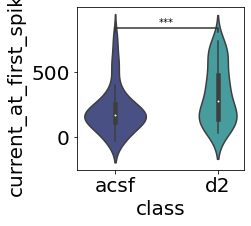

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:4.224e-02 t=2.089e+00


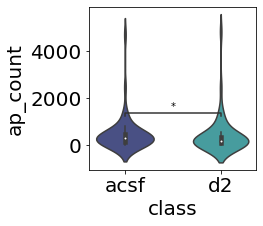

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:4.029e-01 t=8.442e-01


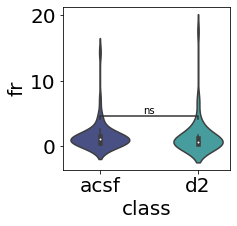

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:7.072e-05 t=4.368e+00


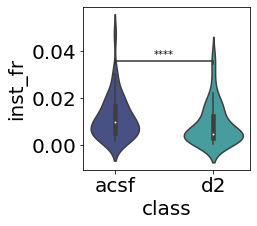

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:3.623e-03 t=-3.066e+00


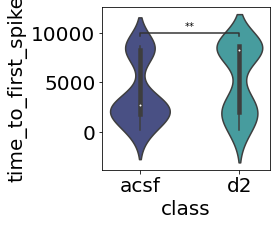

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:1.407e-02 t=-2.553e+00


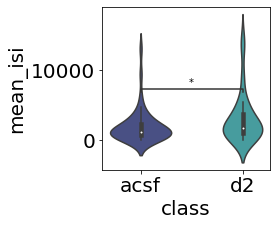

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:3.075e-02 t=-2.229e+00


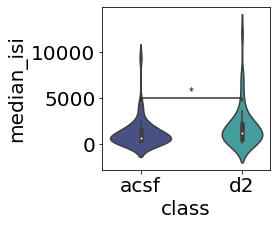

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:2.263e-03 t=-3.234e+00


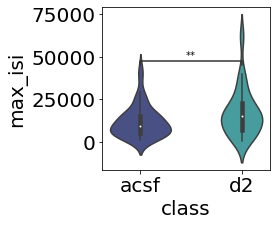

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:2.937e-02 t=-2.249e+00


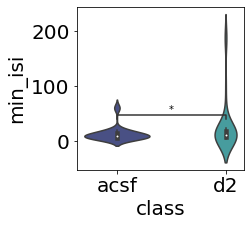

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:5.114e-02 t=2.003e+00


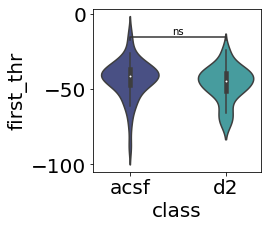

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:4.175e-07 t=5.894e+00


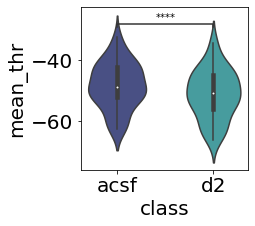

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:6.830e-07 t=5.751e+00


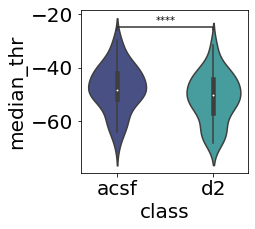

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:5.815e-01 t=5.551e-01


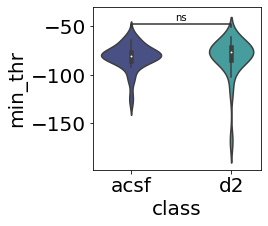

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:3.053e-04 t=3.906e+00


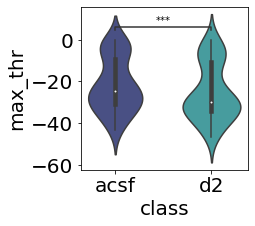

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:6.455e-06 t=5.092e+00


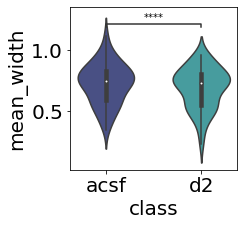

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:8.394e-04 t=3.574e+00


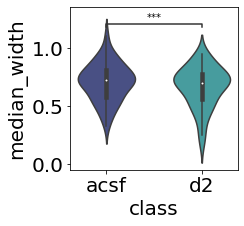

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:5.029e-02 t=2.010e+00


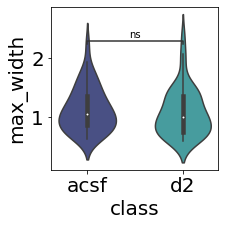

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:7.245e-01 t=-3.546e-01


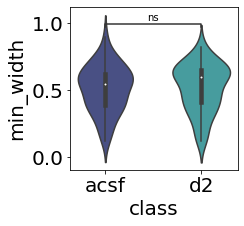

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:3.740e-02 t=-2.143e+00


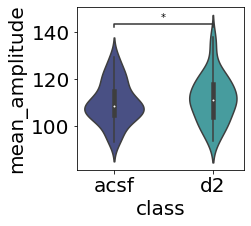

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:7.531e-03 t=-2.796e+00


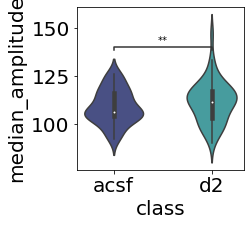

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:6.068e-03 t=-2.877e+00


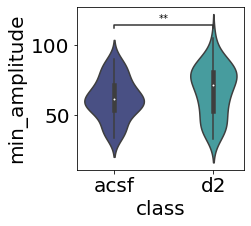

,feature,p_val,t_stat,cohen_d
0,current_at_first_spike,3.314923e-04,-3.879524,-0.602791
1,ap_count,4.224475e-02,2.089251,0.072181
2,fr,4.029352e-01,0.844185,0.039508
3,inst_fr,7.072406e-05,4.367741,0.332067
4,time_to_first_spike,3.623152e-03,-3.066241,-0.421301
5,mean_isi,1.406998e-02,-2.552774,-0.373341
6,median_isi,3.075172e-02,-2.228832,-0.351067
7,max_isi,2.263473e-03,-3.233756,-0.450861
8,min_isi,2.936552e-02,-2.248680,-0.382018
9,first_thr,5.113642e-02,2.002585,0.263856


In [143]:
df_temp_d2_acsf,df_temp_d2_drug  = return_acsf_and_drug(ephys[ephys.ei_labels==1],cond=['d2'],joint=False,remove_duplicates=True)
from scipy import stats
df_temp_d2 = pd.concat([df_temp_d2_acsf,df_temp_d2_drug])
D2_exc_sig_df = pd.DataFrame(columns= ['feature','p_val','t_stat','cohen_d'])
for val in cols_ephys:
    acsf = df_temp_d2_acsf[df_temp_d2_acsf.cond=='acsf'][val].to_numpy()
    drug = df_temp_d2_drug[df_temp_d2_drug.cond!='ascf'][val].to_numpy()
    t_statistic, p_value = stats.ttest_rel(acsf, drug)
    cohend_val = cohend(acsf,drug)
    D2_exc_sig_df.loc[len(D2_exc_sig_df)] = [val, p_value,t_statistic,cohend_val]
    fig,ax = plt.subplots(1,1,figsize=[3,3])

    plot_significance_new(data = df_temp_d2,
    var = val,
    hue = 'cond',
    ax = ax,
    drug = True,
    # palette = CUSTOM_PAL_SORT_3[:len(set(df_temp_m1_ant_ago['labels_lv']))] 
    test ='t-test_paired'
    )

#     # plt.savefig('C:/Users/Nishant Joshi/Documents/DNM/'+val+'_'+cond+'_dist.png',dpi=200)
D2_exc_sig_df

### M1-ago

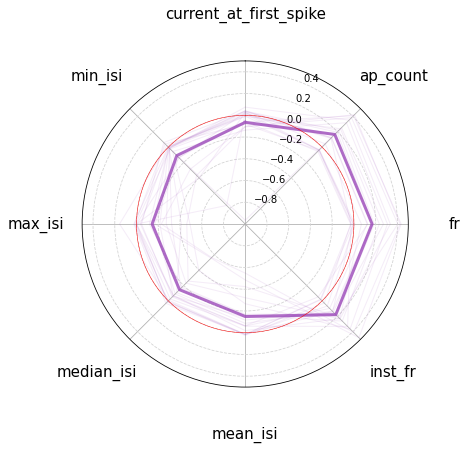

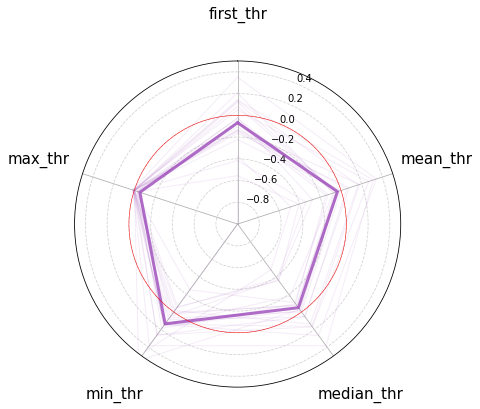

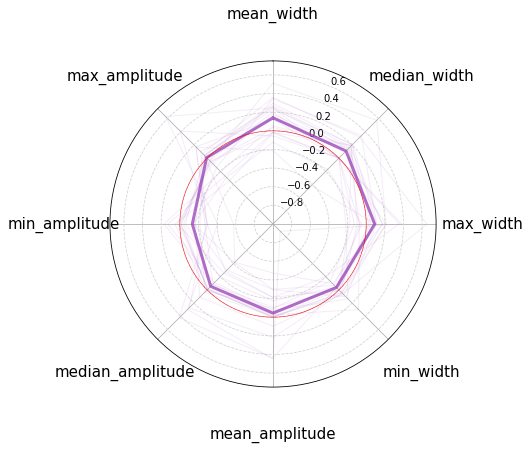

In [38]:
df_temp_acsf,df_temp_drug  = return_acsf_and_drug(ephys,cond=['m1-ago'],joint=False)
exc_acsf = df_temp_acsf[df_temp_acsf.ei_labels==1]
exc_acsf = exc_acsf.drop_duplicates('exp_name')
# exc_acsf.reset_index(True)
exc_drug = df_temp_drug[df_temp_drug.ei_labels==1]
exc_drug = exc_drug.drop_duplicates('exp_name')
# exc_acsf.reset_index(True) 
plot_radar((exc_acsf[cols_spikes].reset_index(drop=True) - exc_drug[cols_spikes].reset_index(drop=True))/exc_acsf[cols_spikes].reset_index(drop=True),cols_spikes,
           np.repeat(0, len(exc_acsf)),
           logscale=False,lims=(-1,50e-2),
           label_font_size=15,
           palette=coherence_colors,
           save=True,
           savepath=savepath+'m1-ago/ephys/'+'Exc_FN_spikes_radar.pdf')

plot_radar((exc_acsf[cols_thrs].reset_index(drop=True) - exc_drug[cols_thrs].reset_index(drop=True))/exc_acsf[cols_thrs].reset_index(drop=True),
           cols_thrs,  
           np.repeat(0, len(exc_acsf)),lims=(-1,.5),
           palette=coherence_colors,
           label_font_size=15,
           logscale = False,
           save=True,
           savepath=savepath+'m1-ago/ephys/'+'Exc_FN_thrs_radar.pdf')

plot_radar((exc_acsf[cols_wf].reset_index(drop=True) - exc_drug[cols_wf].reset_index(drop=True))/exc_acsf[cols_wf].reset_index(drop=True),
           cols_wf,    
           np.repeat(0, len(exc_acsf)),
           logscale=False,
           lims=(-1,7.5e-1),
           label_font_size=15,
           palette=coherence_colors,
           save=True,
           savepath=savepath+'m1-ago/ephys/'+'Exc_FN_wave_radar.pdf')

#### Significance 

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:7.181e-01 t=-3.667e-01


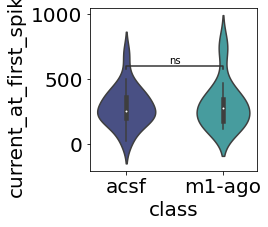

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:1.615e-03 t=3.707e+00


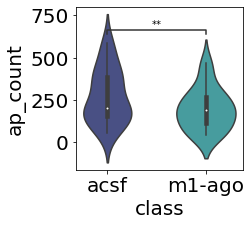

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:1.635e-03 t=3.701e+00


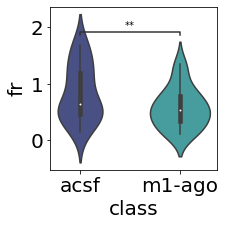

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:6.369e-03 t=3.086e+00


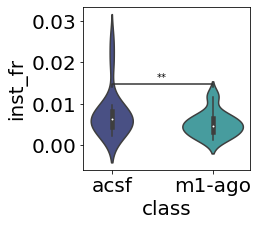

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:7.724e-02 t=-1.874e+00


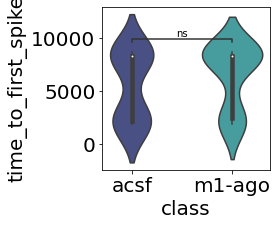

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:8.363e-03 t=-2.961e+00


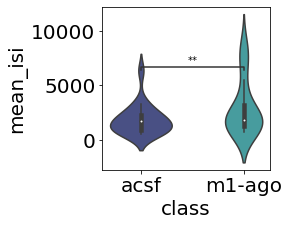

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:5.476e-03 t=-3.155e+00


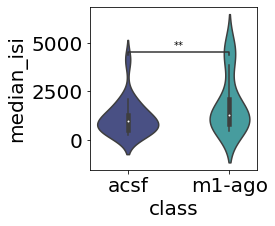

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:1.164e-02 t=-2.808e+00


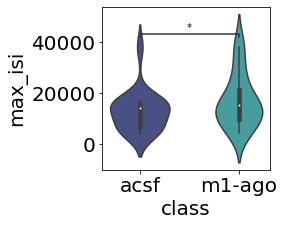

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:7.426e-02 t=-1.895e+00


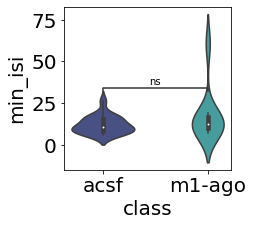

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:3.455e-01 t=9.688e-01


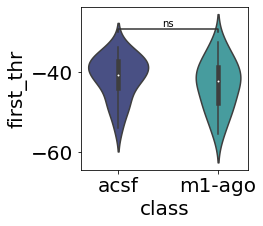

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:4.002e-01 t=8.618e-01


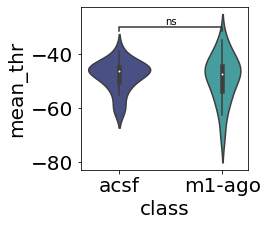

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:2.663e-01 t=1.147e+00


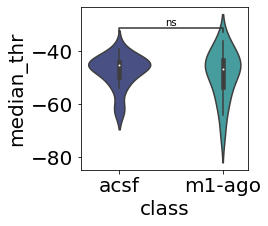

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:8.949e-03 t=-2.930e+00


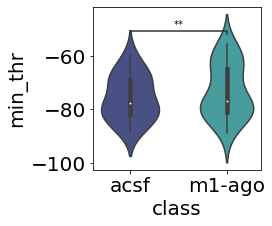

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:2.966e-01 t=1.075e+00


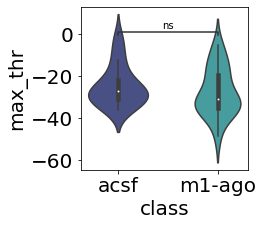

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:3.188e-03 t=3.400e+00


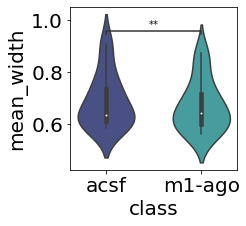

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:2.390e-02 t=2.467e+00


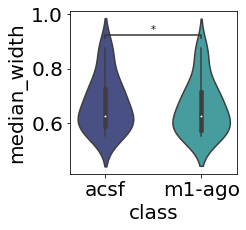

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:9.551e-02 t=1.759e+00


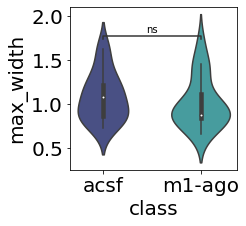

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:8.868e-01 t=-1.444e-01


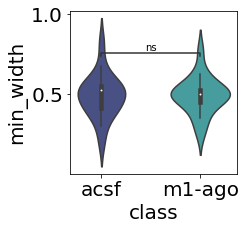

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:5.202e-01 t=-6.558e-01


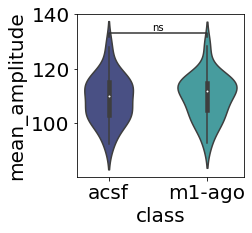

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:3.797e-01 t=-9.006e-01


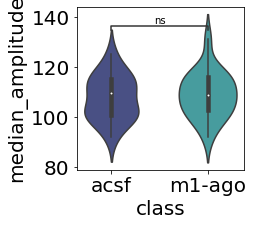

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:1.016e-02 t=-2.871e+00


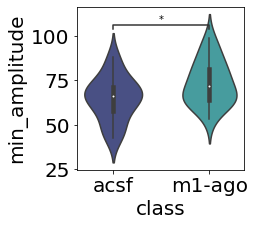

,feature,p_val,t_stat,cohen_d
0,current_at_first_spike,0.718144,-0.366665,-0.112780
1,ap_count,0.001615,3.706578,0.560733
2,fr,0.001635,3.701023,0.625560
3,inst_fr,0.006369,3.086144,0.550336
4,time_to_first_spike,0.077239,-1.874129,-0.327287
5,mean_isi,0.008363,-2.961091,-0.557590
6,median_isi,0.005476,-3.155143,-0.579134
7,max_isi,0.011638,-2.807908,-0.465035
8,min_isi,0.074259,-1.895081,-0.478881
9,first_thr,0.345468,0.968832,0.334447


In [145]:
df_temp_M1_acsf,df_temp_M1_drug  = return_acsf_and_drug(ephys[ephys.ei_labels==1],cond=['m1-ago'],joint=False,remove_duplicates=True)
df_temp_M1 = pd.concat([df_temp_M1_acsf,df_temp_M1_drug])
M1_exc_sig_df = pd.DataFrame(columns= ['feature','p_val','t_stat','cohen_d'])
for val in cols_ephys:
    acsf = df_temp_M1_acsf[df_temp_M1_acsf.cond=='acsf'][val].to_numpy()
    drug = df_temp_M1_drug[df_temp_M1_drug.cond!='ascf'][val].to_numpy()
    t_statistic, p_value = stats.ttest_rel(acsf, drug)
    cohend_val = cohend(acsf,drug)
    M1_exc_sig_df.loc[len(M1_exc_sig_df)] = [val, p_value,t_statistic,cohend_val]
    fig,ax = plt.subplots(1,1,figsize=[3,3])

    plot_significance_new(data = df_temp_M1,
    var = val,
    hue = 'cond',
    ax = ax,
    drug = True,
    # palette = CUSTOM_PAL_SORT_3[:len(set(df_temp_m1_ant_ago['labels_lv']))] 
    test ='t-test_paired'
    )

#     # plt.savefig('C:/Users/Nishant Joshi/Documents/DNM/'+val+'_'+cond+'_dist.png',dpi=200)
M1_exc_sig_df

### M1-ago+ant

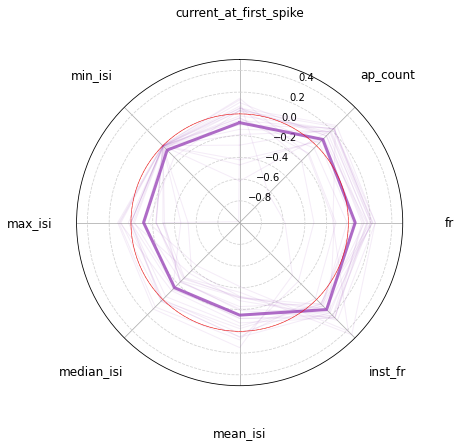

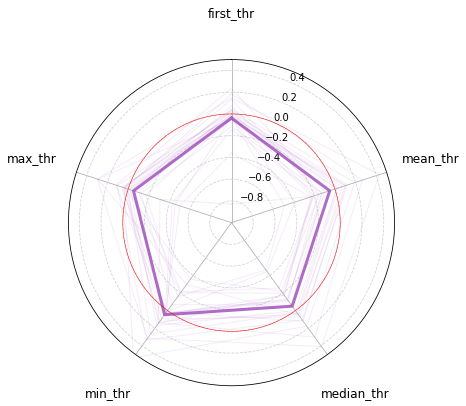

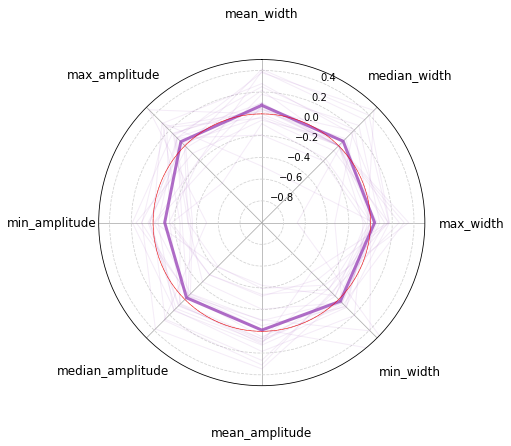

In [44]:
df_temp_acsf,df_temp_drug  = return_acsf_and_drug(ephys,cond=['m1-ago+ant'],joint=False)
exc_acsf = df_temp_acsf[df_temp_acsf.ei_labels==1]
exc_acsf = exc_acsf.drop_duplicates('exp_name')
# exc_acsf.reset_index(True)
exc_drug = df_temp_drug[df_temp_drug.ei_labels==1]
exc_drug = exc_drug.drop_duplicates('exp_name')
# exc_acsf.reset_index(True) 
plot_radar((exc_acsf[cols_spikes].reset_index(drop=True) - exc_drug[cols_spikes].reset_index(drop=True))/exc_acsf[cols_spikes].reset_index(drop=True),cols_spikes,np.repeat(0, len(exc_acsf)),logscale=False,lims=(-1,5e-1),palette=coherence_colors,save=False,savepath=savepath+'Exc_FN_spikes_radar.pdf')
plot_radar((exc_acsf[cols_thrs].reset_index(drop=True) - exc_drug[cols_thrs].reset_index(drop=True))/exc_acsf[cols_thrs].reset_index(drop=True),cols_thrs,  np.repeat(0, len(exc_acsf)),lims=(-1,0.5),palette=coherence_colors,logscale = False,save=False,savepath=savepath+'Exc_FN_thrs_radar.pdf')
plot_radar((exc_acsf[cols_wf].reset_index(drop=True) - exc_drug[cols_wf].reset_index(drop=True))/exc_acsf[cols_wf].reset_index(drop=True),cols_wf,    np.repeat(0, len(exc_acsf)),logscale=False,lims=(-1,5e-1),palette=coherence_colors,save=False,savepath=savepath+'Exc_FN_wave_radar.pdf')

#### Significance 

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:8.076e-01 t=-2.450e-01


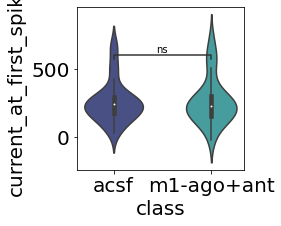

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:2.878e-01 t=1.076e+00


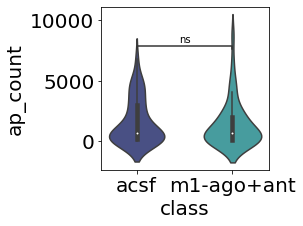

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:3.476e-01 t=-9.491e-01


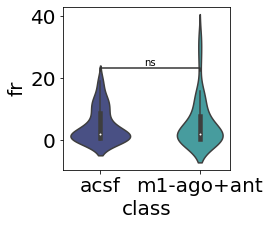

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:2.237e-03 t=3.242e+00


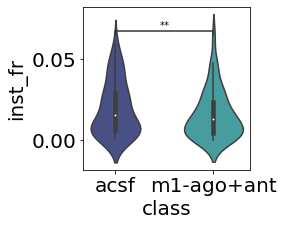

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:3.026e-01 t=-1.043e+00


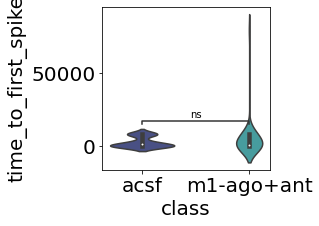

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:5.461e-02 t=-1.973e+00


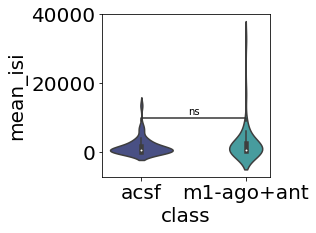

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:5.761e-02 t=-1.948e+00


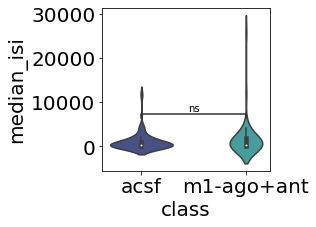

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:4.014e-02 t=-2.113e+00


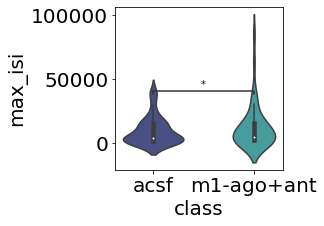

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:3.011e-01 t=-1.046e+00


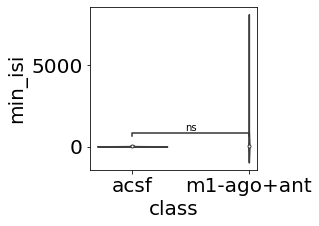

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:1.313e-01 t=1.537e+00


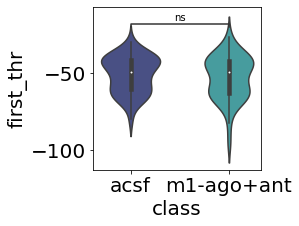

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:1.868e-01 t=1.340e+00


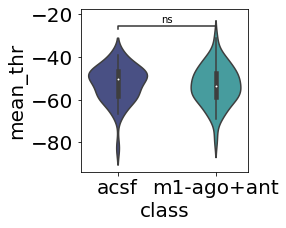

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:3.113e-01 t=1.024e+00


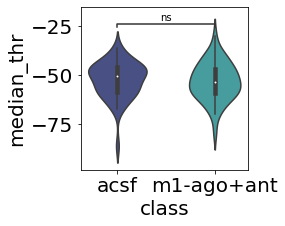

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:3.007e-01 t=1.047e+00


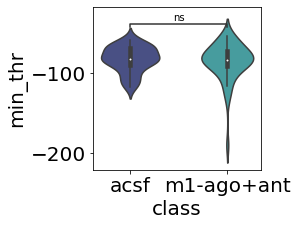

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:1.682e-01 t=1.400e+00


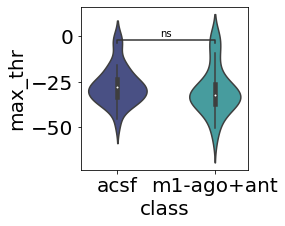

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:4.902e-01 t=-6.956e-01


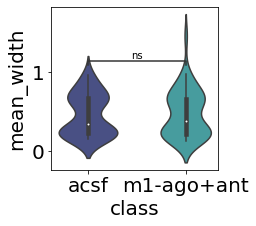

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:4.300e-01 t=-7.964e-01


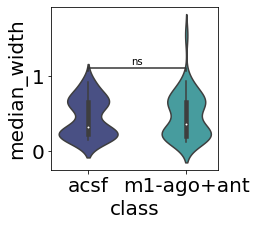

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:5.838e-01 t=-5.518e-01


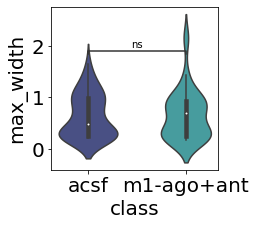

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:1.666e-01 t=1.406e+00


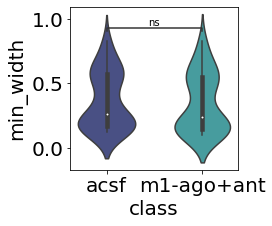

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:4.332e-01 t=7.908e-01


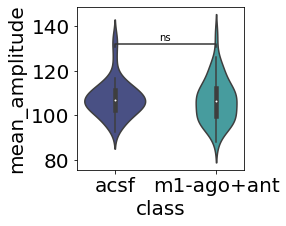

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:4.482e-01 t=7.651e-01


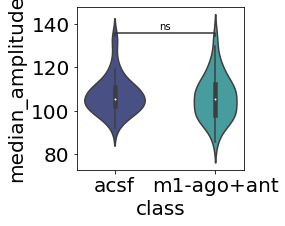

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:1.903e-01 t=-1.330e+00


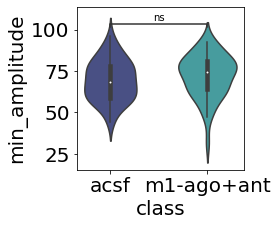

In [168]:
df_temp_m1_ant_ago  = return_acsf_and_drug(ephys,cond=['m1-ago+ant'],joint=True)

for val in cols_ephys:

    fig,ax = plt.subplots(1,1,figsize=[3,3])

    plot_significance_new(data = df_temp_m1_ant_ago,
    var = val,
    hue = 'cond',
    ax = ax,
    drug = True,
    # palette = CUSTOM_PAL_SORT_3[:len(set(df_temp_m1_ant_ago['labels_lv']))] 
    test ='t-test_paired'
    )
    # plt.savefig('C:/Users/Nishant Joshi/Documents/DNM/'+val+'_'+cond+'_dist.png',dpi=200)


## polar inhibitory

### D1

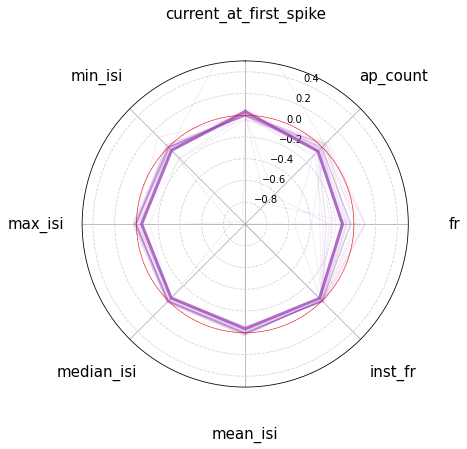

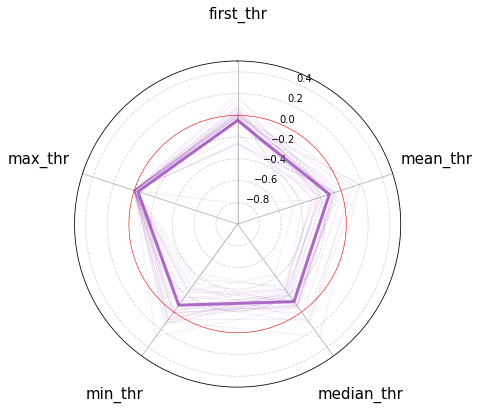

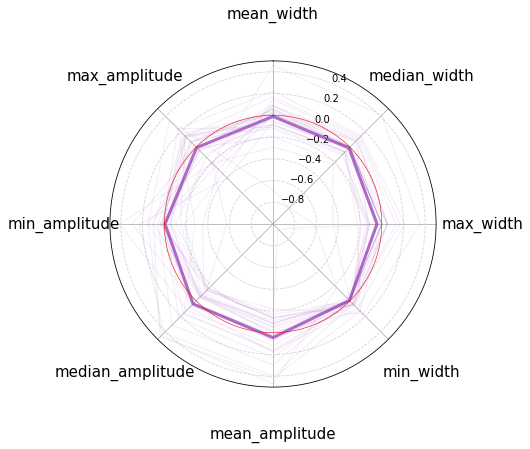

In [41]:
df_temp_acsf,df_temp_drug  = return_acsf_and_drug(ephys,cond=['d1'],joint=False)
inh_acsf = df_temp_acsf[df_temp_acsf.ei_labels==0]
inh_acsf = inh_acsf.drop_duplicates('exp_name')
# inh_acsf.reset_index(True)
inh_drug = df_temp_drug[df_temp_drug.ei_labels==0]
inh_drug = inh_drug.drop_duplicates('exp_name')
# inh_acsf.reset_index(True) 
plot_radar((inh_acsf[cols_spikes].reset_index(drop=True) - inh_drug[cols_spikes].reset_index(drop=True))/inh_acsf[cols_spikes].reset_index(drop=True),
           cols_spikes,
           np.repeat(0, len(inh_acsf)),
           logscale=False,
           lims=(-1,5e-1),
           label_font_size=15,
           palette=coherence_colors,
           save=True,
           savepath=savepath+'d1/ephys/'+'inh_FN_spikes_radar.pdf')

plot_radar((inh_acsf[cols_thrs].reset_index(drop=True) - inh_drug[cols_thrs].reset_index(drop=True))/inh_acsf[cols_thrs].reset_index(drop=True),
           cols_thrs,  
           np.repeat(0, len(inh_acsf)),
           lims=(-1,.5),
           palette=coherence_colors,
           label_font_size=15,
           logscale = False,
           save=True,
           savepath=savepath+'d1/ephys/'+'inh_FN_thrs_radar.pdf')

plot_radar((inh_acsf[cols_wf].reset_index(drop=True) - inh_drug[cols_wf].reset_index(drop=True))/inh_acsf[cols_wf].reset_index(drop=True),
           cols_wf,    
           np.repeat(0, len(inh_acsf)),
           logscale=False,
           lims=(-1,5e-1),
           palette=coherence_colors,
           label_font_size=15,
           save=True,
           savepath=savepath+'d1/ephys/'+'inh_FN_wave_radar.pdf')

#### Signifiance 

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:3.429e-01 t=-9.647e-01


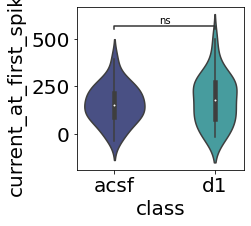

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:2.960e-01 t=-1.065e+00


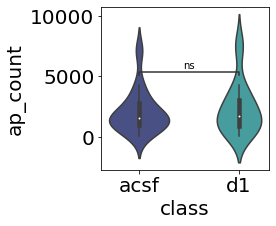

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:3.129e-03 t=-3.233e+00


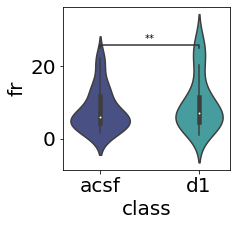

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:8.425e-01 t=2.006e-01


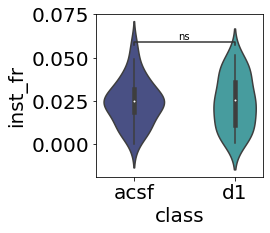

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:3.521e-01 t=9.463e-01


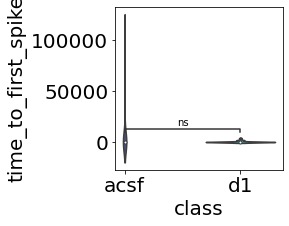

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:6.755e-01 t=4.231e-01


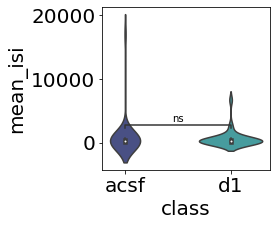

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:6.164e-01 t=5.066e-01


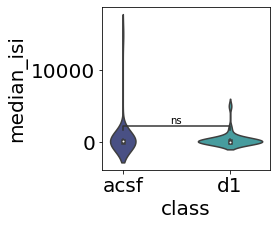

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:7.313e-01 t=-3.469e-01


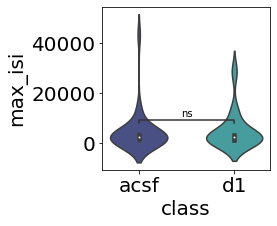

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:3.406e-01 t=9.695e-01


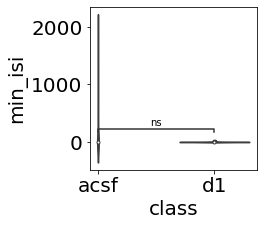

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:3.086e-01 t=1.037e+00


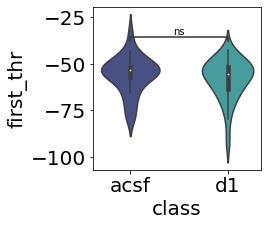

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:7.211e-04 t=3.798e+00


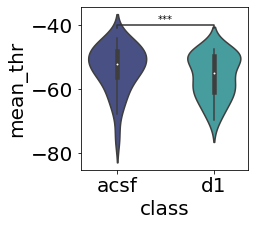

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:4.788e-04 t=3.951e+00


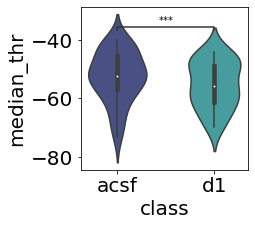

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:2.812e-02 t=2.316e+00


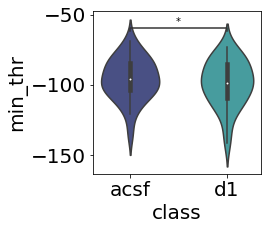

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:6.894e-01 t=-4.039e-01


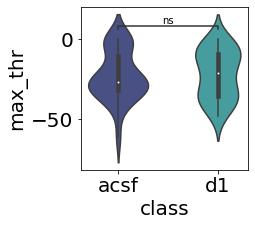

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:9.351e-01 t=8.222e-02


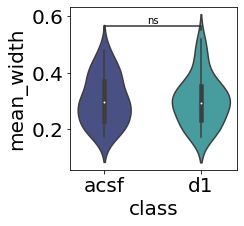

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:9.178e-01 t=1.042e-01


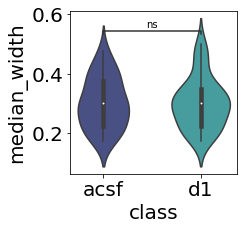

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:5.182e-01 t=-6.544e-01


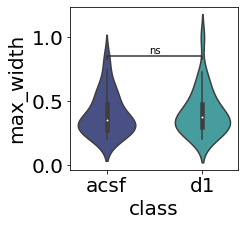

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:1.903e-01 t=1.342e+00


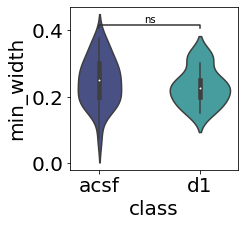

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:1.407e-01 t=1.516e+00


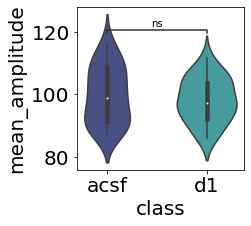

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:1.813e-01 t=1.371e+00


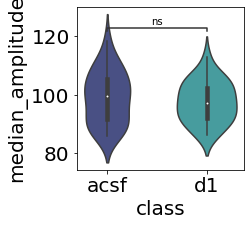

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:5.195e-01 t=6.523e-01


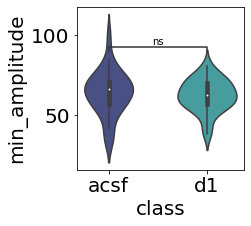

,feature,p_val,t_stat,cohen_d
0,current_at_first_spike,0.342940,-0.964728,-0.175159
1,ap_count,0.295962,-1.065027,-0.152917
2,fr,0.003129,-3.233300,-0.298196
3,inst_fr,0.842470,0.200589,0.024013
4,time_to_first_spike,0.352069,0.946345,0.253138
5,mean_isi,0.675465,0.423085,0.099216
6,median_isi,0.616428,0.506563,0.120722
7,max_isi,0.731278,-0.346877,-0.081871
8,min_isi,0.340605,0.969482,0.259421
9,first_thr,0.308618,1.036980,0.221315


In [141]:
df_temp_d1_acsf,df_temp_d1_drug  = return_acsf_and_drug(ephys[ephys.ei_labels==0],cond=['d1'],joint=False,remove_duplicates=True)
from scipy import stats
df_temp_d1 = pd.concat([df_temp_d1_acsf,df_temp_d1_drug])
D1_inh_sig_df = pd.DataFrame(columns= ['feature','p_val','t_stat','cohen_d'])
for val in cols_ephys:
    acsf = df_temp_d1_acsf[df_temp_d1_acsf.cond=='acsf'][val].to_numpy()
    drug = df_temp_d1_drug[df_temp_d1_drug.cond!='ascf'][val].to_numpy()
    t_statistic, p_value = stats.ttest_rel(acsf, drug)
    cohend_val = cohend(acsf,drug)
    D1_inh_sig_df.loc[len(D1_inh_sig_df)] = [val, p_value,t_statistic,cohend_val]
    fig,ax = plt.subplots(1,1,figsize=[3,3])

    plot_significance_new(data = df_temp_d1,
    var = val,
    hue = 'cond',
    ax = ax,
    drug = True,
    # palette = CUSTOM_PAL_SORT_3[:len(set(df_temp_m1_ant_ago['labels_lv']))] 
    test ='t-test_paired'
    )

#     # plt.savefig('C:/Users/Nishant Joshi/Documents/DNM/'+val+'_'+cond+'_dist.png',dpi=200)
D1_inh_sig_df

### D2

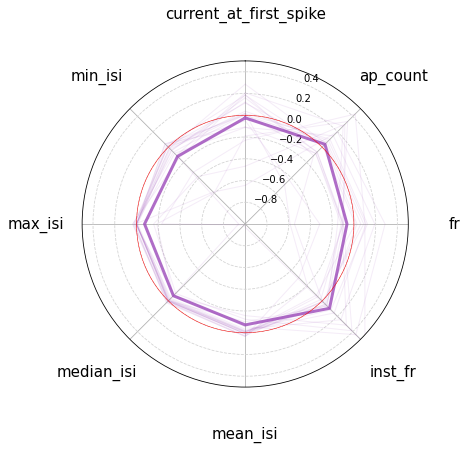

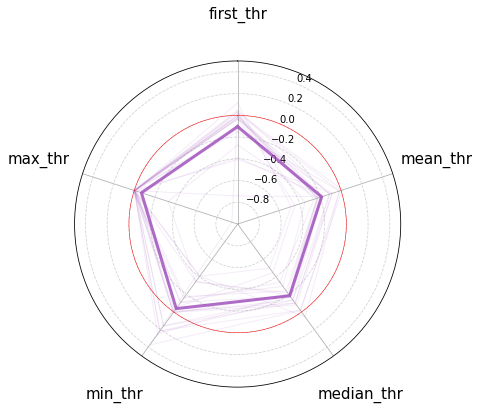

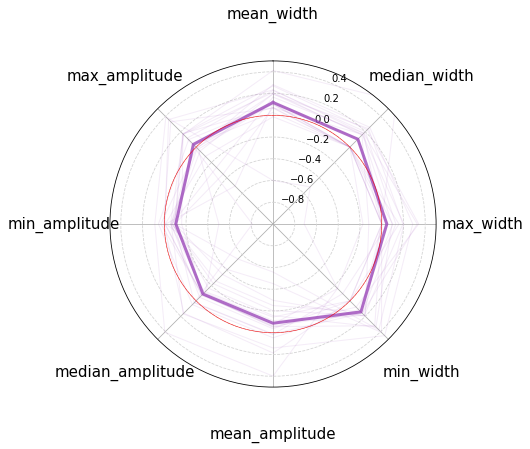

In [42]:
df_temp_acsf,df_temp_drug  = return_acsf_and_drug(ephys,cond=['d2'],joint=False)
inh_acsf = df_temp_acsf[df_temp_acsf.ei_labels==0]
inh_acsf = inh_acsf.drop_duplicates('exp_name')
# inh_acsf.reset_index(True)
inh_drug = df_temp_drug[df_temp_drug.ei_labels==0]
inh_drug = inh_drug.drop_duplicates('exp_name')
# inh_acsf.reset_index(True) 

plot_radar((inh_acsf[cols_spikes].reset_index(drop=True) - inh_drug[cols_spikes].reset_index(drop=True))/inh_acsf[cols_spikes].reset_index(drop=True),
           cols_spikes,
           np.repeat(0, len(inh_acsf)),
           logscale=False,
           lims=(-1,5e-1),
           label_font_size=15,
           palette=coherence_colors,
           save=True,
           savepath=savepath+'d2/ephys/'+'inh_FN_spikes_radar.pdf')

plot_radar((inh_acsf[cols_thrs].reset_index(drop=True) - inh_drug[cols_thrs].reset_index(drop=True))/inh_acsf[cols_thrs].reset_index(drop=True),
           cols_thrs,  
           np.repeat(0, len(inh_acsf)),
           lims=(-1,.5),
           label_font_size=15,
           palette=coherence_colors,
           logscale = False,
           save=True,
           savepath=savepath+'d2/ephys/'+'inh_FN_thrs_radar.pdf')

plot_radar((inh_acsf[cols_wf].reset_index(drop=True) - inh_drug[cols_wf].reset_index(drop=True))/inh_acsf[cols_wf].reset_index(drop=True),
           cols_wf,    
           np.repeat(0, len(inh_acsf)),
           logscale=False,
           lims=(-1,5e-1),
           label_font_size=15,
           palette=coherence_colors,
           save=True,
           savepath=savepath+'d2/ephys/'+'inh_FN_wave_radar.pdf')

#### Signifiance 

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:6.317e-01 t=-4.877e-01


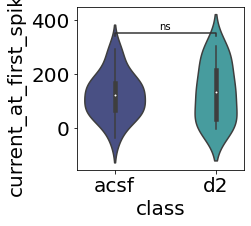

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:5.029e-01 t=6.836e-01


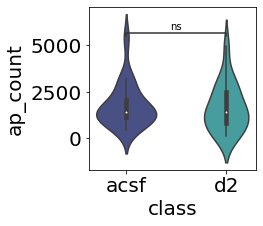

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:1.100e-01 t=-1.681e+00


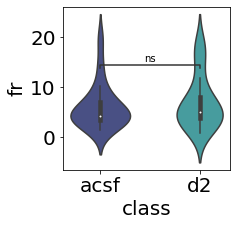

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:1.265e-01 t=1.602e+00


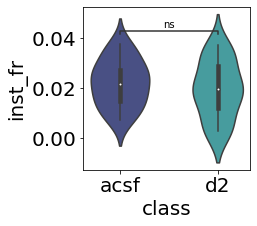

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:1.863e-01 t=-1.374e+00


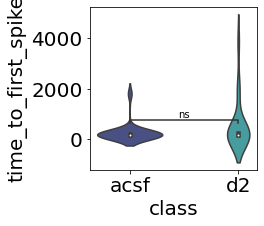

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:1.093e-01 t=-1.685e+00


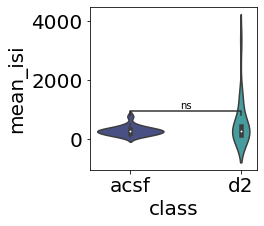

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:1.103e-01 t=-1.679e+00


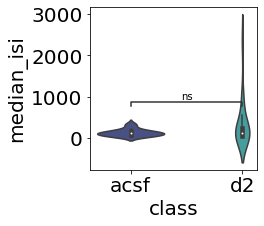

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:2.116e-01 t=-1.295e+00


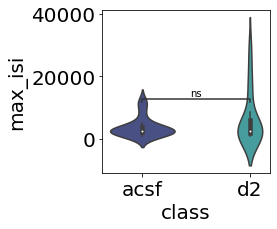

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:3.848e-02 t=-2.233e+00


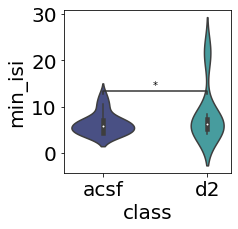

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:4.031e-02 t=2.210e+00


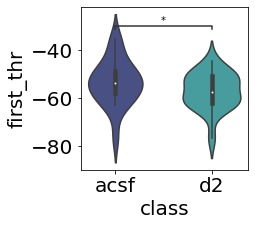

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:5.526e-06 t=6.352e+00


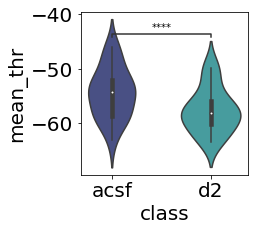

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:1.150e-05 t=5.990e+00


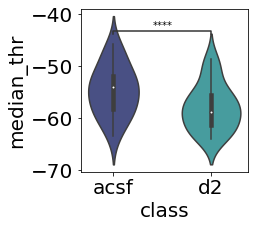

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:5.937e-01 t=5.431e-01


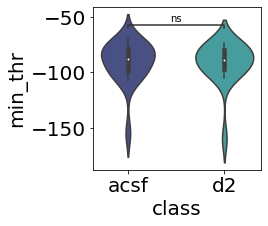

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:4.176e-02 t=2.192e+00


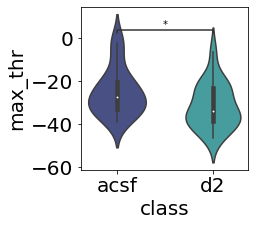

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:2.604e-03 t=3.492e+00


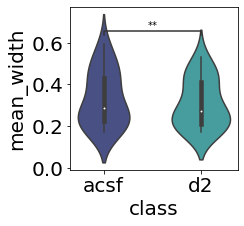

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:5.676e-03 t=3.139e+00


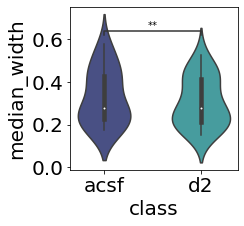

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:1.659e-01 t=1.444e+00


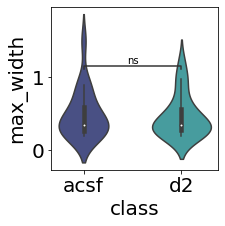

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:2.584e-03 t=3.495e+00


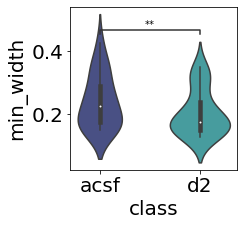

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:1.062e-01 t=-1.701e+00


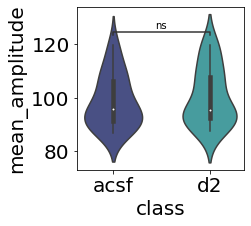

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:1.006e-01 t=-1.731e+00


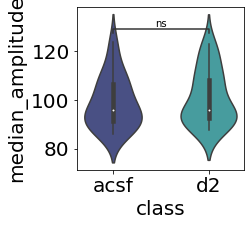

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:1.892e-02 t=-2.579e+00


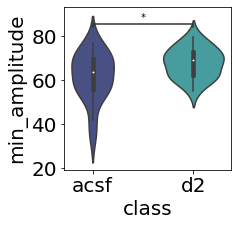

,feature,p_val,t_stat,cohen_d
0,current_at_first_spike,0.631661,-0.487684,-0.126726
1,ap_count,0.502924,0.683616,0.106119
2,fr,0.109964,-1.681348,-0.178860
3,inst_fr,0.126491,1.602307,0.251820
4,time_to_first_spike,0.186277,-1.374111,-0.409678
5,mean_isi,0.109268,-1.684895,-0.520689
6,median_isi,0.110349,-1.679396,-0.528576
7,max_isi,0.211599,-1.295256,-0.440133
8,min_isi,0.038477,-2.233114,-0.459437
9,first_thr,0.040306,2.209889,0.427652


In [140]:
df_temp_d2_acsf,df_temp_d2_drug  = return_acsf_and_drug(ephys[ephys.ei_labels==0],cond=['d2'],joint=False,remove_duplicates=True)
df_temp_d2  = pd.concat([df_temp_d2_acsf,df_temp_d2_drug])
from scipy import stats
D2_inh_sig_df = pd.DataFrame(columns= ['feature','p_val','t_stat','cohen_d'])
for val in cols_ephys:
    acsf = df_temp_d2_acsf[df_temp_d2_acsf.cond=='acsf'][val].to_numpy()
    drug = df_temp_d2_drug[df_temp_d2_drug.cond!='ascf'][val].to_numpy()
    t_statistic, p_value = stats.ttest_rel(acsf, drug)
    cohend_val = cohend(acsf,drug)
    D2_inh_sig_df.loc[len(D2_inh_sig_df)] = [val, p_value,t_statistic,cohend_val]
    fig,ax = plt.subplots(1,1,figsize=[3,3])

    plot_significance_new(data = df_temp_d2,
    var = val,
    hue = 'cond',
    ax = ax,
    drug = True,
    # palette = CUSTOM_PAL_SORT_3[:len(set(df_temp_m1_ant_ago['labels_lv']))] 
    test ='t-test_paired'
    )

#     # plt.savefig('C:/Users/Nishant Joshi/Documents/DNM/'+val+'_'+cond+'_dist.png',dpi=200)
D2_inh_sig_df

-0.2930070105588103
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:3.429e-01 t=-9.647e-01


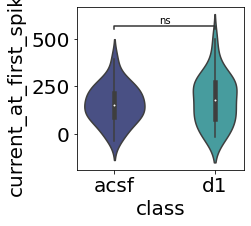

-0.03751373487082438
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:2.960e-01 t=-1.065e+00


<Figure size 432x288 with 0 Axes>

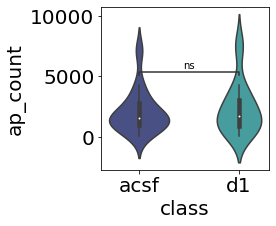

-0.07425296306672138
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:3.129e-03 t=-3.233e+00


<Figure size 432x288 with 0 Axes>

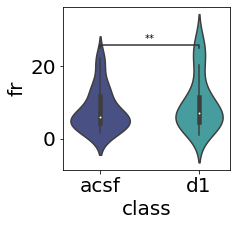

0.13238939047467765
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:8.425e-01 t=2.006e-01


<Figure size 432x288 with 0 Axes>

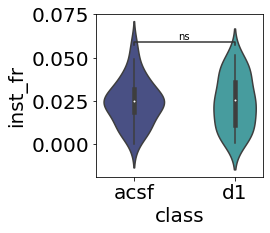

-0.05699093186721984
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:3.521e-01 t=9.463e-01


<Figure size 432x288 with 0 Axes>

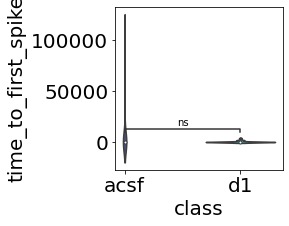

-0.16347255563877736
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:6.755e-01 t=4.231e-01


<Figure size 432x288 with 0 Axes>

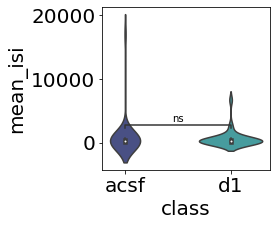

-0.16091993318266828
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:6.164e-01 t=5.066e-01


<Figure size 432x288 with 0 Axes>

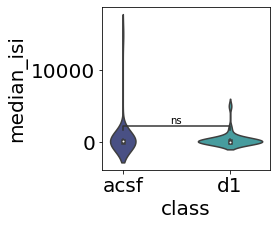

-0.1945042642290276
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:7.313e-01 t=-3.469e-01


<Figure size 432x288 with 0 Axes>

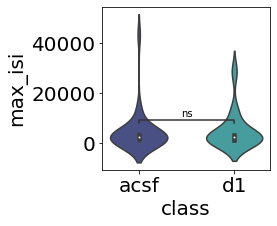

-0.1381037397276302
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:3.406e-01 t=9.695e-01


<Figure size 432x288 with 0 Axes>

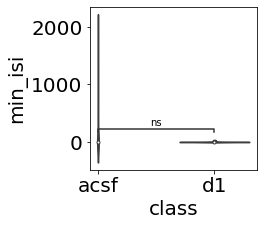

0.21602167485241713
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:3.086e-01 t=1.037e+00


<Figure size 432x288 with 0 Axes>

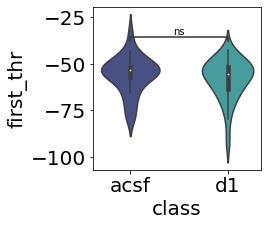

0.17899971782746368
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:7.211e-04 t=3.798e+00


<Figure size 432x288 with 0 Axes>

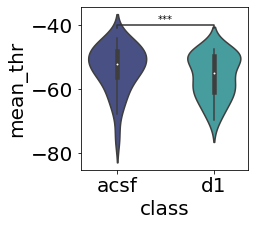

0.1748606787434689
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:4.788e-04 t=3.951e+00


<Figure size 432x288 with 0 Axes>

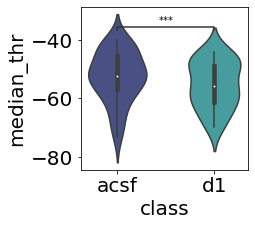

0.0102539078302175
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:2.812e-02 t=2.316e+00


<Figure size 432x288 with 0 Axes>

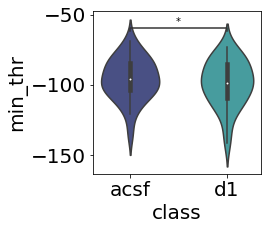

0.07091603696743391
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:6.894e-01 t=-4.039e-01


<Figure size 432x288 with 0 Axes>

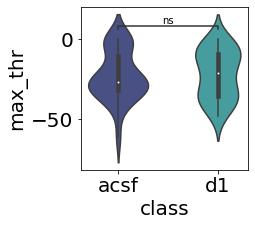

0.018755757143615145
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:9.351e-01 t=8.222e-02


<Figure size 432x288 with 0 Axes>

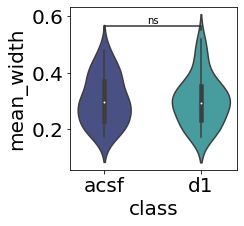

0.02170856661572478
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:9.178e-01 t=1.042e-01


<Figure size 432x288 with 0 Axes>

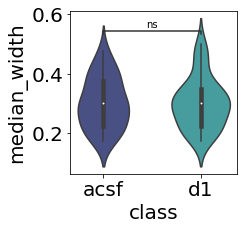

0.023889431869825103
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:5.182e-01 t=-6.544e-01


<Figure size 432x288 with 0 Axes>

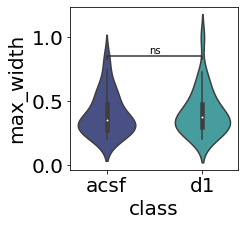

-0.046254311209020835
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:1.903e-01 t=1.342e+00


<Figure size 432x288 with 0 Axes>

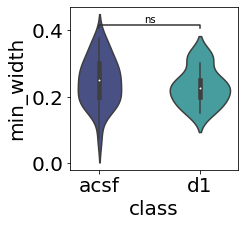

-0.056537845982608886
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:1.407e-01 t=1.516e+00


<Figure size 432x288 with 0 Axes>

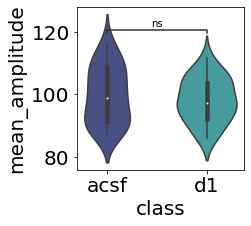

-0.06553884868357199
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:1.813e-01 t=1.371e+00


<Figure size 432x288 with 0 Axes>

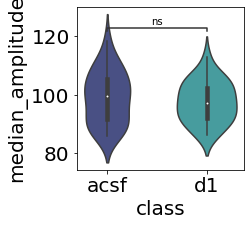

-0.08472419386825367
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:5.195e-01 t=6.523e-01


<Figure size 432x288 with 0 Axes>

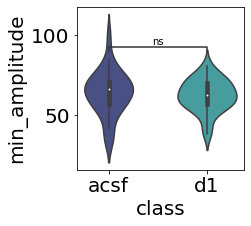

<Figure size 432x288 with 0 Axes>

In [ ]:
df_temp_d1  = return_acsf_and_drug(ephys,cond=['d1'],joint=True)


for val in cols_ephys:
    acsf = df_temp_d1[df_temp_d1.cond=='acsf'][val].to_numpy()
    drug = df_temp_d1[df_temp_d1.cond!='ascf'][val].to_numpy()
    print(cohend(acsf,drug))
    fig,ax = plt.subplots(1,1,figsize=[3,3])

    plot_significance_new(data = df_temp_d1[df_temp_d1.ei_labels==0],
    var = val,
    hue = 'cond',
    ax = ax,
    drug = True,
    # palette = CUSTOM_PAL_SORT_3[:len(set(df_temp_m1_ant_ago['labels_lv']))] 
    test ='t-test_paired'
    )
    plt.savefig('C:/Users/Nishant Joshi/Documents/DNM/'+val+'_'+cond+'_dist.png',dpi=200)


### M1-ago

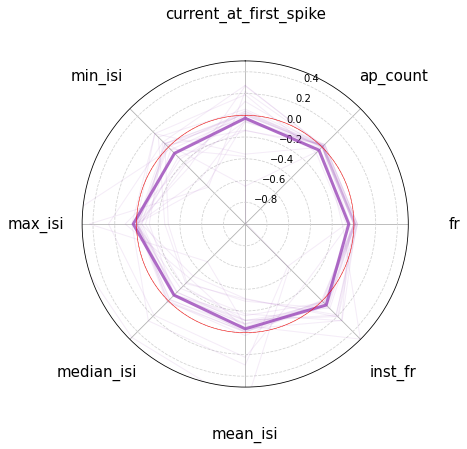

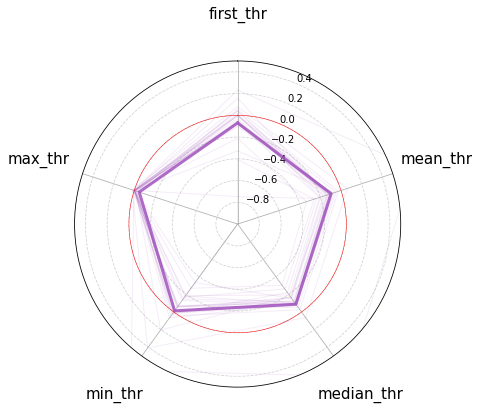

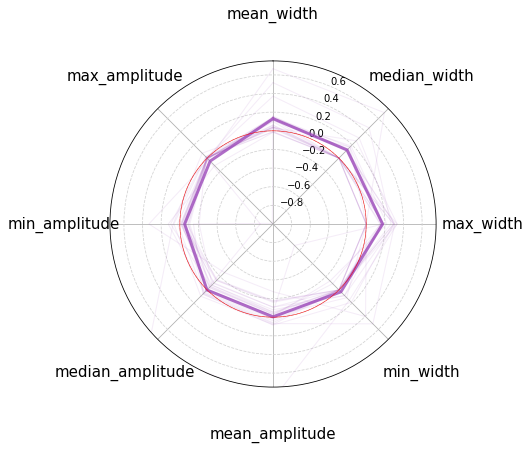

In [44]:
df_temp_acsf,df_temp_drug  = return_acsf_and_drug(ephys,cond=['m1-ago'],joint=False)
inh_acsf = df_temp_acsf[df_temp_acsf.ei_labels==0]
inh_acsf = inh_acsf.drop_duplicates('exp_name')
# inh_acsf.reset_index(True)
inh_drug = df_temp_drug[df_temp_drug.ei_labels==0]
inh_drug = inh_drug.drop_duplicates('exp_name')
# inh_acsf.reset_index(True) 

plot_radar((inh_acsf[cols_spikes].reset_index(drop=True) - inh_drug[cols_spikes].reset_index(drop=True))/inh_acsf[cols_spikes].reset_index(drop=True),
           cols_spikes,
           np.repeat(0, len(inh_acsf)),
           label_font_size=15,
           logscale=False,lims=(-1,5e-1),
           palette=coherence_colors,
           save=True,
           savepath=savepath+'m1-ago/ephys/'+'inh_FN_spikes_radar.pdf')

plot_radar((inh_acsf[cols_thrs].reset_index(drop=True) - inh_drug[cols_thrs].reset_index(drop=True))/inh_acsf[cols_thrs].reset_index(drop=True),
           cols_thrs,  
           np.repeat(0, len(inh_acsf)),
           lims=(-1,.5),
           label_font_size=15,
           palette=coherence_colors,
           logscale = False,
           save=True,
           savepath=savepath+'m1-ago/ephys/'+'inh_FN_thrs_radar.pdf')

plot_radar((inh_acsf[cols_wf].reset_index(drop=True) - inh_drug[cols_wf].reset_index(drop=True))/inh_acsf[cols_wf].reset_index(drop=True),
           cols_wf,    
           np.repeat(0, len(inh_acsf)),
           logscale=False,
           lims=(-1,7.5e-1),
           label_font_size=15,
           palette=coherence_colors,
           save=True,
           savepath=savepath+'m1-ago/ephys/'+'inh_FN_wave_radar.pdf')

#### Significance 

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:3.486e-01 t=9.588e-01


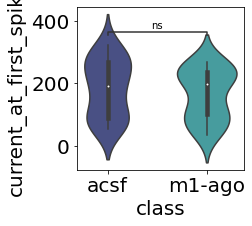

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:7.737e-01 t=-2.913e-01


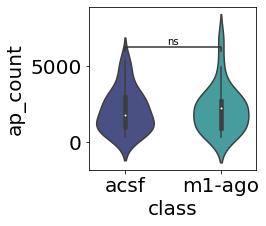

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:2.873e-01 t=-1.092e+00


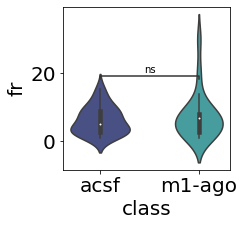

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:1.751e-01 t=1.403e+00


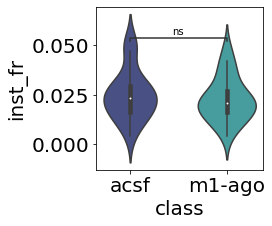

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:4.426e-01 t=7.825e-01


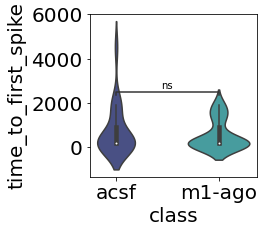

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:7.296e-01 t=3.503e-01


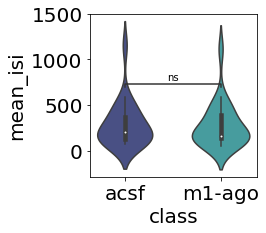

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:9.572e-01 t=-5.435e-02


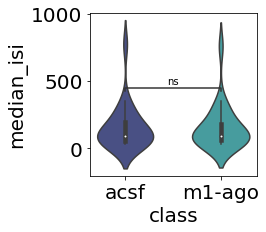

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:4.091e-01 t=8.423e-01


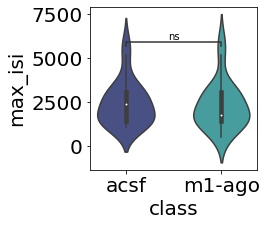

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:8.605e-02 t=-1.801e+00


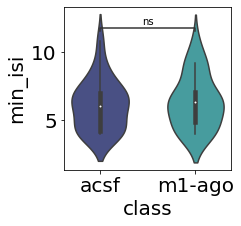

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:1.990e-01 t=1.326e+00


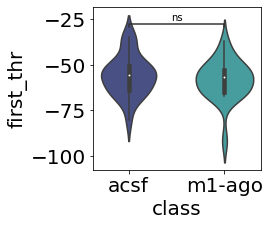

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:1.755e-01 t=1.402e+00


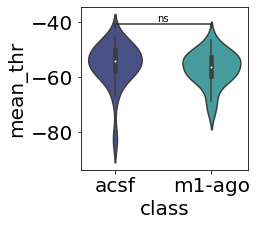

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:2.669e-01 t=1.141e+00


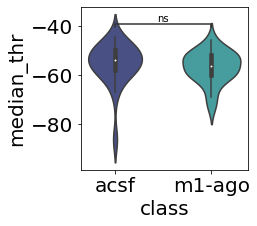

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:9.007e-01 t=-1.263e-01


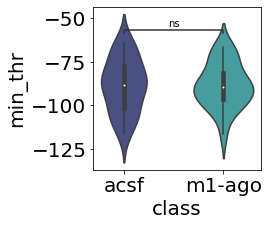

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:1.152e-01 t=1.643e+00


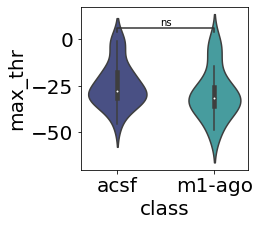

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:5.081e-04 t=4.103e+00


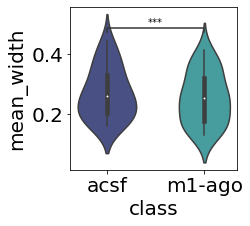

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:1.097e-03 t=3.780e+00


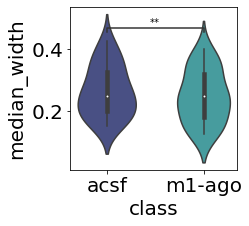

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:2.924e-05 t=5.306e+00


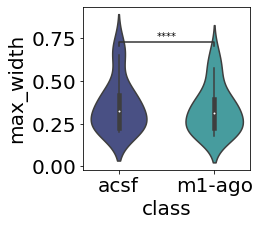

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:4.378e-01 t=7.909e-01


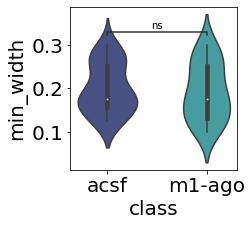

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:9.119e-01 t=1.120e-01


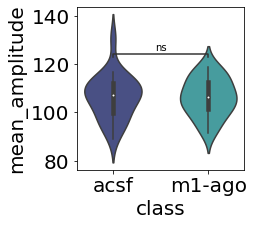

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:8.200e-01 t=2.304e-01


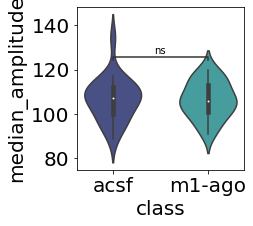

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:3.676e-01 t=-9.207e-01


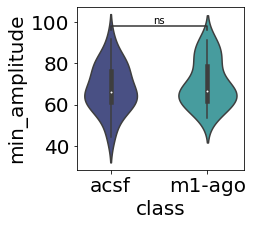

,feature,p_val,t_stat,cohen_d
0,current_at_first_spike,0.348591,0.958756,0.216840
1,ap_count,0.773656,-0.291331,-0.060497
2,fr,0.287331,-1.091703,-0.221079
3,inst_fr,0.175140,1.403304,0.199609
4,time_to_first_spike,0.442637,0.782533,0.208252
5,mean_isi,0.729572,0.350341,0.035594
6,median_isi,0.957171,-0.054349,-0.004690
7,max_isi,0.409106,0.842309,0.104088
8,min_isi,0.086052,-1.801183,-0.132182
9,first_thr,0.198965,1.326363,0.229853


In [136]:
df_temp_M1_acsf,df_temp_M1_drug  = return_acsf_and_drug(ephys[ephys.ei_labels==0],cond=['m1-ago'],joint=False,remove_duplicates=True)
df_temp_M1 = pd.concat([df_temp_M1_acsf,df_temp_M1_drug])
from scipy import stats
M1_inh_sig_df = pd.DataFrame(columns= ['feature','p_val','t_stat','cohen_d'])
for val in cols_ephys:
    acsf = df_temp_M1_acsf[df_temp_M1_acsf.cond=='acsf'][val].to_numpy()
    drug = df_temp_M1_drug[df_temp_M1_drug.cond!='ascf'][val].to_numpy()
    t_statistic, p_value = stats.ttest_rel(acsf, drug)
    cohend_val = cohend(acsf,drug)
    M1_inh_sig_df.loc[len(M1_inh_sig_df)] = [val, p_value,t_statistic,cohend_val]
    fig,ax = plt.subplots(1,1,figsize=[3,3])

    plot_significance_new(data = df_temp_M1,
    var = val,
    hue = 'cond',
    ax = ax,
    drug = True,
    # palette = CUSTOM_PAL_SORT_3[:len(set(df_temp_m1_ant_ago['labels_lv']))] 
    test ='t-test_paired'
    )

#     # plt.savefig('C:/Users/Nishant Joshi/Documents/DNM/'+val+'_'+cond+'_dist.png',dpi=200)
M1_inh_sig_df

### M1-ant+ago

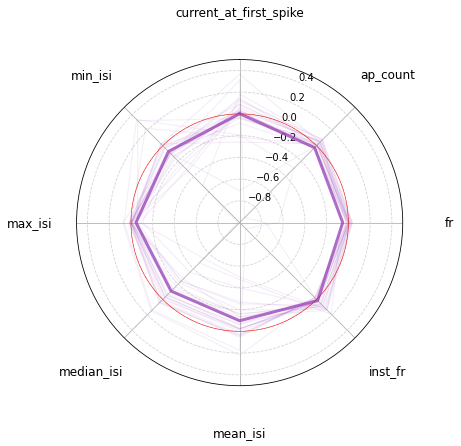

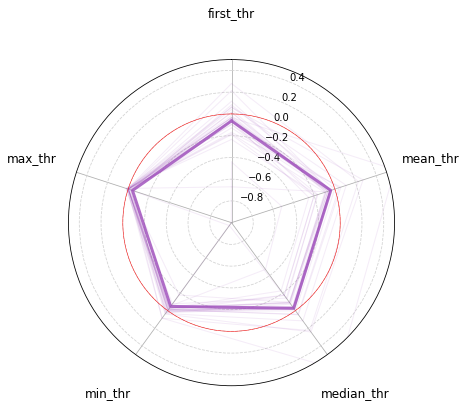

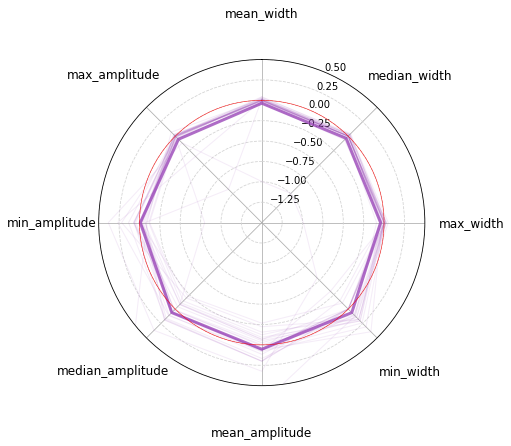

In [58]:
df_temp_acsf,df_temp_drug  = return_acsf_and_drug(ephys,cond=['m1-ago+ant'],joint=False)
exc_acsf = df_temp_acsf[df_temp_acsf.ei_labels==0]
exc_acsf = exc_acsf.drop_duplicates('exp_name')
# exc_acsf.reset_index(True)
exc_drug = df_temp_drug[df_temp_drug.ei_labels==0]
exc_drug = exc_drug.drop_duplicates('exp_name')
# exc_acsf.reset_index(True) 
plot_radar((exc_acsf[cols_spikes].reset_index(drop=True) - exc_drug[cols_spikes].reset_index(drop=True))/exc_acsf[cols_spikes].reset_index(drop=True),cols_spikes,np.repeat(0, len(exc_acsf)),logscale=False,lims=(-1,5e-1),palette=coherence_colors,save=False,savepath=savepath+'Exc_FN_spikes_radar.pdf')
plot_radar((exc_acsf[cols_thrs].reset_index(drop=True) - exc_drug[cols_thrs].reset_index(drop=True))/exc_acsf[cols_thrs].reset_index(drop=True),cols_thrs,  np.repeat(0, len(exc_acsf)),lims=(-1,.5),palette=coherence_colors,logscale = False,save=False,savepath=savepath+'Exc_FN_thrs_radar.pdf')
plot_radar((exc_acsf[cols_wf].reset_index(drop=True) - exc_drug[cols_wf].reset_index(drop=True))/exc_acsf[cols_wf].reset_index(drop=True),cols_wf,    np.repeat(0, len(exc_acsf)),logscale=False,lims=(-1.5,5e-1),palette=coherence_colors,save=False,savepath=savepath+'Exc_FN_wave_radar.pdf')

## PCA subsets

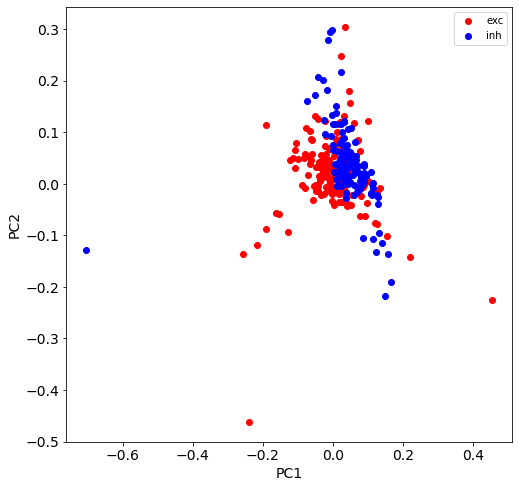

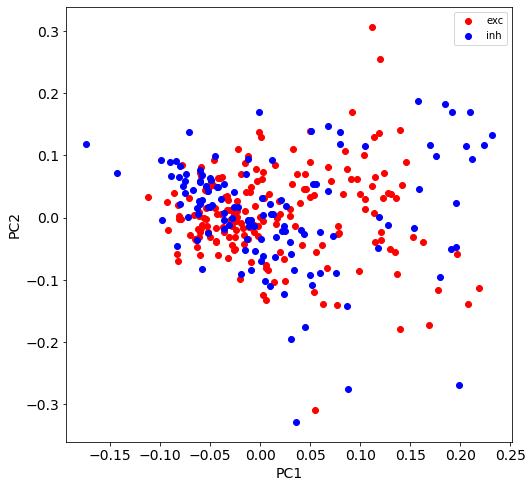

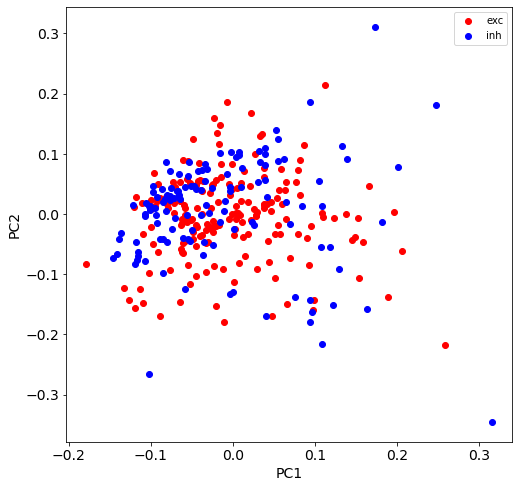

In [437]:
# %matplotlib ipympl =False



import numpy as np
from sklearn.decomposition import PCA
scaler = StandardScaler()
for sets in [cols_spikes, cols_thrs, cols_wf]:
    fig = plt.figure(figsize=[8,8])
    ax = fig.add_subplot()
    X1 = normalize(ephys_exc[sets].to_numpy().T)
    pca1 = PCA(n_components=2)
    pca1.fit_transform(X1)

    X2 = normalize(ephys_inh[sets].to_numpy().T)
    pca2 = PCA(n_components=2)
    pca2.fit_transform(X2)

    ax.scatter(pca1.components_[0],pca1.components_[1],label = 'exc',c = 'red')
    ax.scatter(pca2.components_[0],pca2.components_[1],label = 'inh',c = 'blue')

    ax.tight_layout=True
    ax.set_xlabel('PC1',fontsize=14)
    ax.set_ylabel('PC2',fontsize=14)
    plt.legend()
    # ax.set_zlabel('min_amplitude',fontsize=14)
    plt.show()



## MANOVA

In [789]:
data_manova = data_ephys_FN_acsf
data_manova['type'] = data_manova['labels_wave'].map({0:'inh',1:'exc'})


In [790]:
from statsmodels.multivariate.manova import MANOVA
# data_temp = data_manova[cols_ephys]
cols = ['current_at_first_spike', 'ap_count', 'fr', 'inst_fr',
       'time_to_first_spike', 'mean_isi', 'median_isi', 'max_isi', 'min_isi',
       'first_thr', 'mean_thr', 'median_thr', 'min_thr', 'max_thr',
       'mean_width', 'median_width', 'max_width', 'min_width',
       'mean_amplitude', 'median_amplitude', 'min_amplitude', 'max_amplitude']
data_manova[cols] = normalize(data_manova[cols])
# Apply MANOVA with the renamed columns
manova = MANOVA.from_formula('current_at_first_spike + ap_count + fr + inst_fr + time_to_first_spike+ mean_isi+ median_isi + max_isi + min_isi + first_thr + mean_thr + median_thr + min_thr + max_thr + mean_width + median_width + max_width + min_width + mean_amplitude + median_amplitude + min_amplitude + max_amplitude ~ type',data = data_manova)
result = manova.mv_test()
print(result)

                     Multivariate linear model
                                                                   
-------------------------------------------------------------------
       Intercept         Value    Num DF  Den DF   F Value   Pr > F
-------------------------------------------------------------------
          Wilks' lambda   0.0013 21.0000 290.0000 10413.7278 0.0000
         Pillai's trace   0.9987 21.0000 290.0000 10413.7278 0.0000
 Hotelling-Lawley trace 754.0975 21.0000 290.0000 10413.7278 0.0000
    Roy's greatest root 754.0975 21.0000 290.0000 10413.7278 0.0000
-------------------------------------------------------------------
                                                                   
--------------------------------------------------------------------
           type           Value    Num DF   Den DF   F Value  Pr > F
--------------------------------------------------------------------
           Wilks' lambda  0.2819  21.0000  290.0000  35.1841  0.00

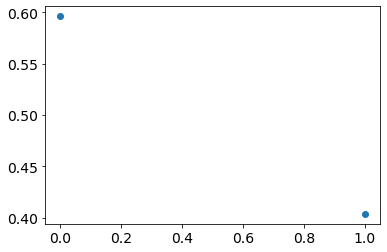

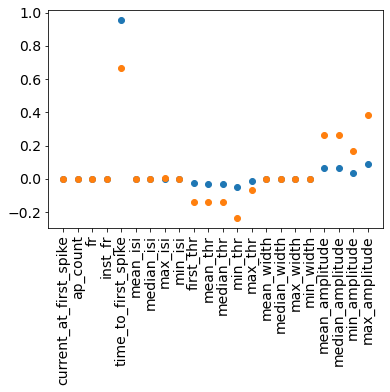

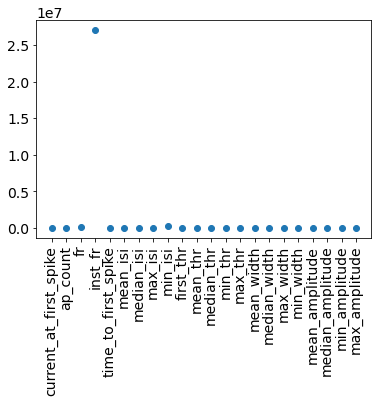

In [791]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as lda
X = data_manova[cols]
y = data_manova['type']
post_hoc = lda().fit(X=X, y=y)

# get Prior probabilities of groups:
plt.scatter(np.arange(len(post_hoc.priors_)),post_hoc.priors_)
plt.show()

# get group means
plt.scatter(data_manova.columns[:22],post_hoc.means_[0])
plt.scatter(data_manova.columns[:22],post_hoc.means_[1])
plt.xticks(rotation=90)
plt.show()

# get Coefficients of linear discriminants
plt.scatter(data_manova.columns[:22],post_hoc.scalings_)
plt.xticks(rotation=90)

plt.show()
# get Proportion of trace (variance explained by each of the selected components)



## CCA

CCA score:  -28.29486629351265
CCA score:  -18.88534589067473
CCA score:  -15.3374702068862
CCA score:  -10.204337185770932
CCA score:  -14.945876171181839
CCA score:  -10.569101764248977
CCA score:  -10.040523590839754
CCA score:  -43.823657517280346
CCA score:  -7.134473247441874
CCA score:  -5.80826665815995
-0.30410538899245987 0.30410538899245987


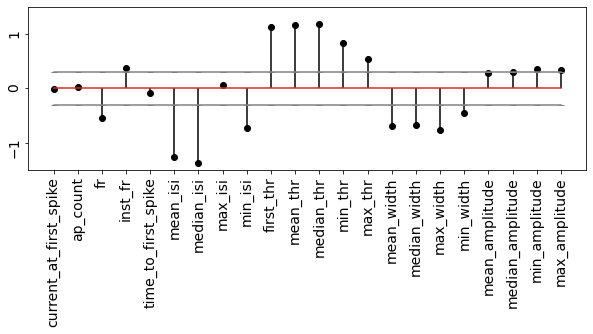

-0.2052726225856284 0.2052726225856284


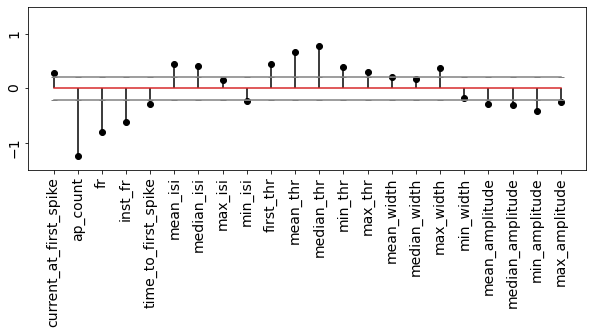

In [800]:

import numpy as np
from sklearn.cross_decomposition import CCA
from scipy.stats import zscore
from sklearn.model_selection import train_test_split
scale = StandardScaler()
X_inh = data_manova[data_manova.type=='inh'][data_manova.columns[:22]].to_numpy()
X_exc = data_manova[data_manova.type=='exc'][data_manova.columns[:22]].to_numpy()

def perform_CCA(X,y,n_components=10):
    ca = CCA(n_components=n_components)
    ca.fit(X, y)
    X_c, Y_c = ca.transform(X,y)
    x_weights = ca.x_weights_
    score = ca.score(X , y)
    print('CCA score: ',score)
    return X_c,Y_c,ca

def return_ci(data,alpha):
    loadings  = data
    mean = np.mean(loadings)
    n = len(loadings)
    std = np.std(loadings)
    ci = (1.96)*(std/np.sqrt(n)) 
    print(mean - ci, mean + ci)
    return mean - ci, mean + ci

all_loadings_exc = []
all_loadings_inh = []

for i in range(10):

    _,_,ca_all_E_S = perform_CCA(X_inh,X_exc[np.random.randint(0,len(X_exc),len(X_inh))],n_components=22)

    all_loadings_exc.append(ca_all_E_S.x_loadings_[:,1])
    all_loadings_inh.append(ca_all_E_S.x_loadings_[:,0])

loadings_exc = np.mean(np.vstack(all_loadings_exc),axis=0)
loadings_exc = loadings_exc - np.mean(loadings_exc)

loadings_inh = np.mean(np.vstack(all_loadings_inh),axis=0)
loadings_inh = loadings_inh - np.mean(loadings_inh)


ci_neg, ci_pos = return_ci(loadings_exc, alpha=0.05)

plt.figure(figsize=[10,3])
plt.stem(data_manova.columns[:22],loadings_exc,'black')
plt.tick_params(rotation=90)
plt.plot(np.repeat(ci_neg,22), c='grey', marker = '_')
plt.plot(np.repeat(ci_pos,22), c='grey', marker = '_')
plt.ylim(-1.5,1.5)
plt.savefig(savepath+'stem_ephys_exc.pdf',dpi=200)
plt.show()

plt.figure(figsize=[10,3])

ci_neg, ci_pos = return_ci(loadings_inh, alpha=0.05)
plt.stem(data_manova.columns[:22], loadings_inh,'black')
plt.tick_params(rotation=90)
plt.plot(np.repeat(ci_neg,22),c='grey',marker = '_')
plt.plot(np.repeat(ci_pos,22),c='grey',marker = '_')
plt.ylim(-1.5,1.5)
plt.savefig(savepath+'stem_ephys_inh.pdf',dpi=200)
plt.show()


-0.3526641935609164 1.1272198360941985


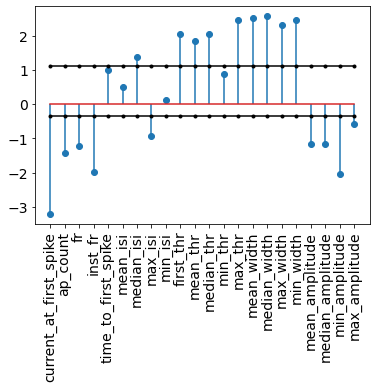

-1.5735164838386133 3.5354079927069915


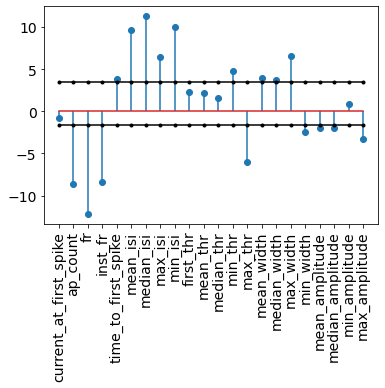

In [606]:

ci_neg, ci_pos = return_ci(ca_all_E_S.x_loadings_[:,1], alpha=0.05)
plt.stem(data_manova.columns[:22], ca_all_E_S.x_loadings_[:,1])
plt.xticks(rotation=90)
plt.plot(np.repeat(ci_neg,22), c='black', marker = '.')
plt.plot(np.repeat(ci_pos,22), c='black', marker = '.')
plt.savefig('D:/Data For Publication/figures/part2/')
plt.show()

ci_neg, ci_pos = return_ci(ca_all_E_S.x_loadings_[:,0], alpha=0.05)
plt.stem(data_manova.columns[:22], ca_all_E_S.x_loadings_[:,0])
plt.xticks(rotation=90)
plt.plot(np.repeat(ci_neg,22),c='black',marker = '.')
plt.plot(np.repeat(ci_pos,22),c='black',marker = '.')
plt.show()

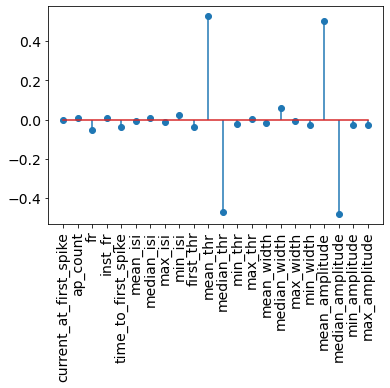

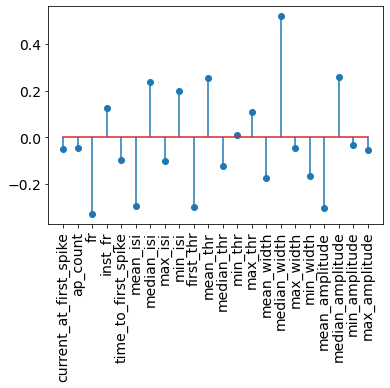

In [571]:

plt.stem(data_manova.columns[:22], ca_all_E_S.x_weights_[:,0])
plt.xticks(rotation=90)
plt.show()

plt.stem(data_manova.columns[:22], ca_all_E_S.x_weights_[:,1])
plt.xticks(rotation=90)
plt.show()


## plot waveforms for each cluster

In [37]:
waves_exc = data_wave_FN_acsf[data_wave_FN_acsf.exp_name.isin(ephys_exc.exp_name)]
waves_exc = waves_exc.drop_duplicates('exp_name')
waves_exc['labels_ephys'] = np.array(ephys_exc.labels_ephys)
waves_inh = data_wave_FN_acsf[data_wave_FN_acsf.exp_name.isin(ephys_inh.exp_name)]
waves_inh = waves_inh.drop_duplicates('exp_name')
waves_inh['labels_ephys'] = np.array(ephys_inh.labels_ephys)


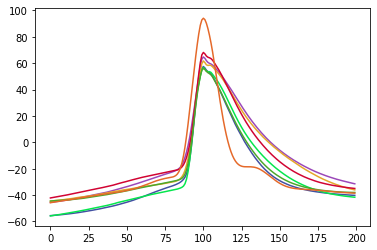

In [38]:
for i in set(waves_exc.labels_ephys):
    plt.plot(np.mean(np.vstack(waves_exc[waves_exc.labels_ephys==i]['waveform'].to_numpy()),axis=0),c=coherence_colors[i])
    # plt.show()
plt.savefig(savepath+'exc_waves_mean.pdf',dpi=200)

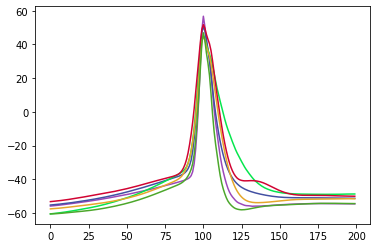

In [39]:
for i in set(waves_inh.labels_ephys):
    plt.plot(np.mean(np.vstack(waves_inh[waves_inh.labels_ephys==i]['waveform'].to_numpy()),axis=0),c=coherence_colors[i])
    # plt.show()
plt.savefig(savepath+'inh_waves_mean.pdf',dpi=200)    

## Significance test 

<Axes: >

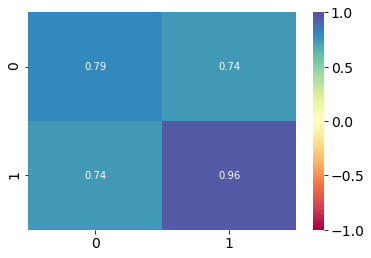

In [363]:
data_ephys_FN_acsf.labels_wave = binarize_EI_labels(np.array(data_ephys_FN_acsf.labels_wave),[1,2,3,6,7])
# wave_exc = data_ephys_FN_acsf[data_ephys_FN_acsf.labels_wave.isin([1,2,3,6,7])]
# wave_inh = data_ephys_FN_acsf[data_ephys_FN_acsf.labels_wave.isin([0,5,4])]

cosine_mat = np.zeros((2,2))
for i in range(2):
    for j in range(2):
        cosine_mat[i,j] = np.mean(cosine_similarity(normalize(np.vstack(data_ephys_FN_acsf[data_ephys_FN_acsf.labels_wave==i][cols_temp].to_numpy())),
                  normalize(np.vstack(data_ephys_FN_acsf[data_ephys_FN_acsf.labels_wave==j][cols_temp].to_numpy()))))

sns.heatmap(cosine_mat,vmax=1,vmin=-1,annot=True,cmap = 'Spectral')

In [364]:
import numpy as np
from scipy.stats import f_oneway
data1 = cosine_similarity(normalize(np.vstack(data_ephys_FN_acsf[data_ephys_FN_acsf.labels_wave==0][cols_temp].to_numpy())),
                  normalize(np.vstack(data_ephys_FN_acsf[data_ephys_FN_acsf.labels_wave==0][cols_temp].to_numpy())))
data1 = data1[np.tril_indices_from(data1)]
data2 = cosine_similarity(normalize(np.vstack(data_ephys_FN_acsf[data_ephys_FN_acsf.labels_wave==1][cols_temp].to_numpy())),
                  normalize(np.vstack(data_ephys_FN_acsf[data_ephys_FN_acsf.labels_wave==1][cols_temp].to_numpy())))
data2 = data2[np.tril_indices_from(data2)]
data3 = cosine_similarity(normalize(np.vstack(data_ephys_FN_acsf[data_ephys_FN_acsf.labels_wave==1][cols_temp].to_numpy())),
                  normalize(np.vstack(data_ephys_FN_acsf[data_ephys_FN_acsf.labels_wave==0][cols_temp].to_numpy())))

data3 = data3.reshape(1,-1)[0]
import statsmodels.api as sm
def calcualte_cosine_sig(data1,data2,data3):
    return sm.stats.anova_oneway([data1,data2,data3])

print(calcualte_cosine_sig(data1,data2,data3))

statistic = 8772.354118364967
pvalue = 0.0
df = (2.0, 18308.226898897734)
df_num = 2.0
df_denom = 18308.226898897734
nobs_t = 48828.0
n_groups = 3
means = [0.79407431 0.95701047 0.7391163 ]
nobs = [ 8001. 17391. 23436.]
vars_ = [0.04648135 0.00721223 0.06657426]
use_var = unequal
welch_correction = True
tuple = (8772.354118364967, 0.0)


In [365]:
games_howell(data1,data2,data3)

,mean_differences,degrees_freedom,t_values,p_values,std_err,up_conf,low_conf,group_comps
0,0.162936,9161.539599,65.313586,0.001,0.001764,3.477981,-3.152109,0 : 1
1,-0.054958,16398.682442,18.687064,0.001,0.002080,3.259845,-3.369761,0 : 2
2,-0.217894,29917.632997,120.768449,0.001,0.001276,3.096771,-3.532560,1 : 2


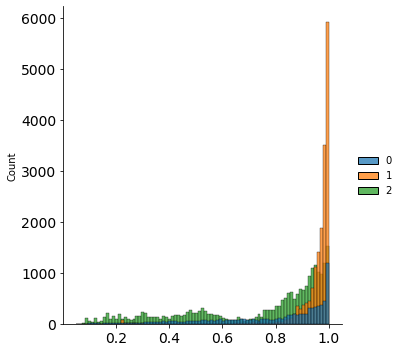

In [305]:
sns.displot([data1,data2,data3])

In [ ]:

for i in ['C', 'gl', 'El', 'Vr', 'Vt', 'DV',]:
    sns.boxplot(data = df_temp,x='type',y=i)
    plt.show()
    rvs1 = df_temp[df_temp.type=='exc'][i]
    rvs2 = df_temp[df_temp.type=='inh'][i]

    print(stats.ttest_ind(rvs1, rvs2, equal_var=False))

# Biophysical

In [45]:
df = pd.read_pickle("D:/Biophysical_cluster/rect_bio_all_feats.pkl")
df = df[~df.exp_name.isin(discarded_exps)]
# df = df[df.columns[1:]]
df_acsf = df[df.cond.isin(['acsf','acsf_bic'])]
df_acsf = df_acsf[df_acsf.trial==0]
df_acsf['labels_wave']=binarize_EI_labels(labels_wave,[1,2,3,6,7])

# np.unique(df_acsf.labels_wave,return_counts=True)


In [46]:
df_above_threshold = df[df.r_squared_V>0.7]
neuromod_list_bio = neumericalize_neurmods(df_above_threshold)

In [47]:
cols_bio = [ 'gl (nS)','C (nF)','El (mV)', 'Vr (mV)', 'Vt* (mV)', 'DV (mV)']

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


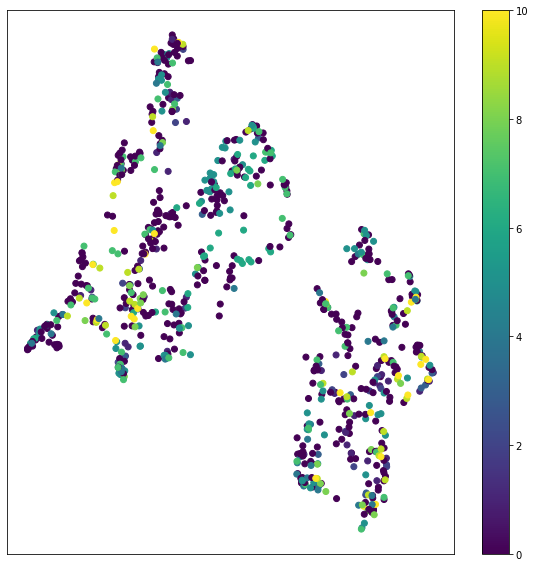

In [81]:
plot_UMAP_values(np.vstack(df_above_threshold[cols_bio].to_numpy()),list(neuromod_list_bio),random_state=42,save=False,figsize=[10,10])


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


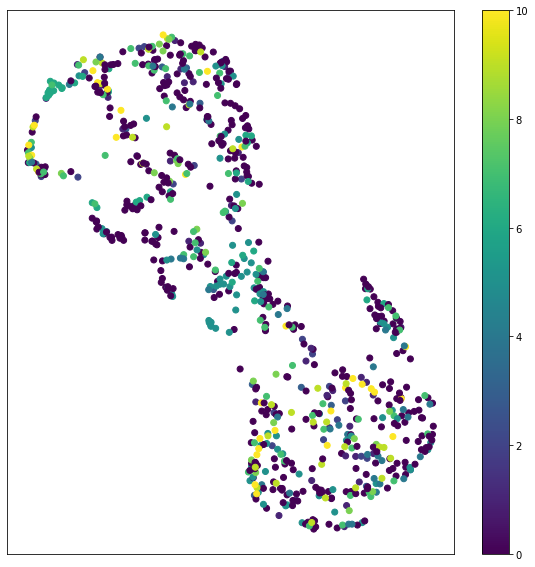

In [82]:
plot_UMAP_values(np.vstack(df_above_threshold['eta'].to_numpy()),list(neuromod_list_bio),random_state=42,save=False,figsize=[10,10])


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


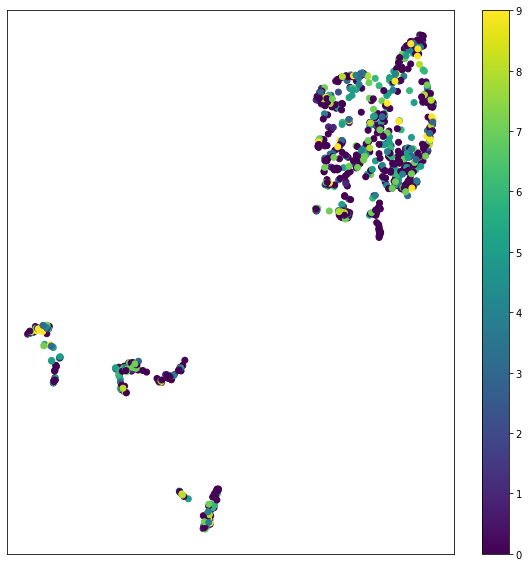

In [195]:
plot_UMAP_values(np.vstack(df_above_threshold['gamma_threshold'].to_numpy()),list(neuromod_list_bio),random_state=42,save=False,figsize=[10,10])


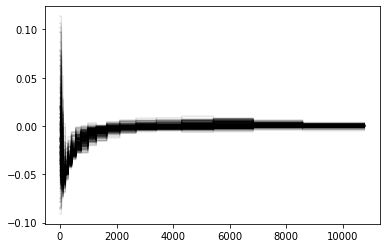

In [189]:
plt.plot(normalize(np.vstack(df_acsf[df_acsf.r_squared_V>0.7]['eta'])).T,c='black',alpha=0.1)
plt.show()

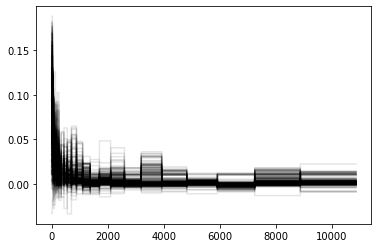

In [190]:
plt.plot(normalize(np.vstack(df_acsf[df_acsf.r_squared_V>0.7]['gamma_threshold'])).T,c='black',alpha=0.1)
plt.show()

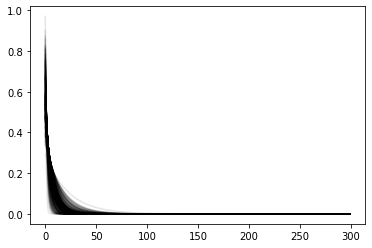

In [191]:
plt.plot(normalize(np.vstack(df_acsf[df_acsf.r_squared_V>0.7]['K'])).T,c='black',alpha=0.1)
plt.show()

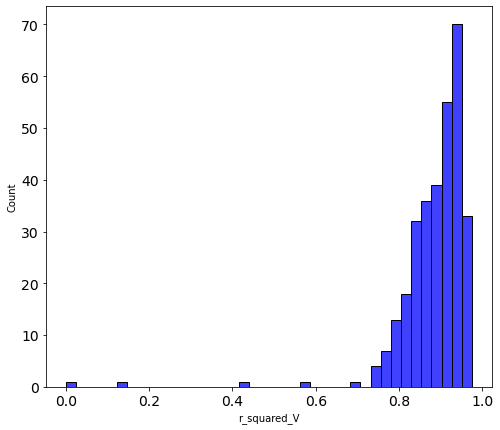

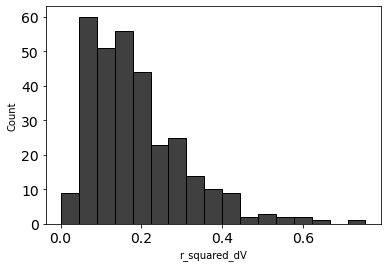

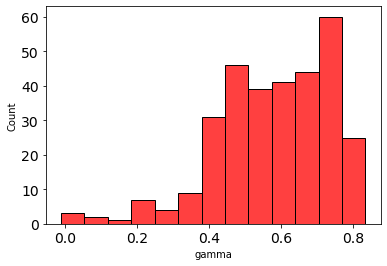

In [118]:
plt.rcParams['xtick.labelsize']=14
plt.rcParams['ytick.labelsize']=14
fig,ax = plt.subplots(figsize=[8,7])
sns.histplot(df_acsf['r_squared_V'],color='blue')
plt.show()
# plt.savefig(savepath+'rsquaredV_dist.pdf',dpi=200)
sns.histplot(df_acsf['r_squared_dV'],color='black')
plt.show()
# plt.savefig(savepath+'rsquareddV_dist.pdf',dpi=200)
sns.histplot(df_acsf['gamma'],color='red',)
plt.show()
# plt.savefig(savepath+'gamma_dist.pdf',dpi=200)


In [51]:
cols_bio = [ 'gl (nS)','C (nF)',  'El (mV)', 'Vr (mV)', 'Vt* (mV)', 'DV (mV)',]

In [52]:
df_biophys_exc= df_above_threshold[df_above_threshold.ei_labels==1]
df_biophys_inh= df_above_threshold[df_above_threshold.ei_labels==0]

### Heterogeneity Biophysical

d1


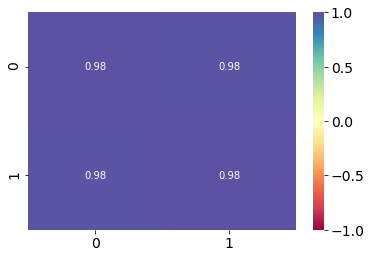

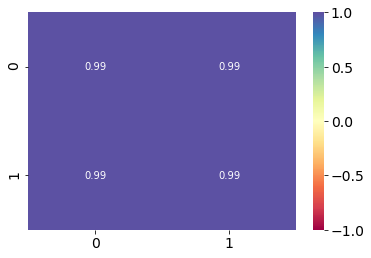

d2


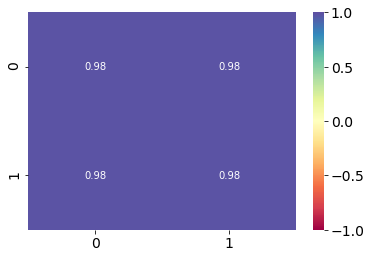

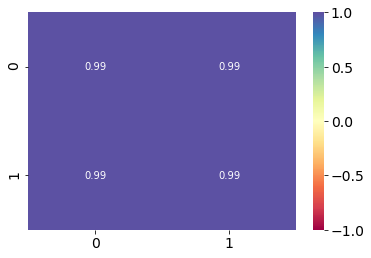

m1-ago


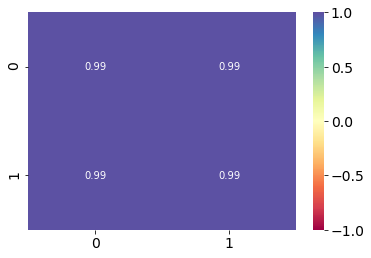

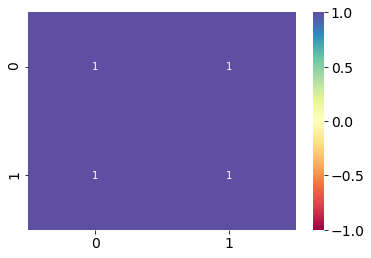

m1-ago+ant


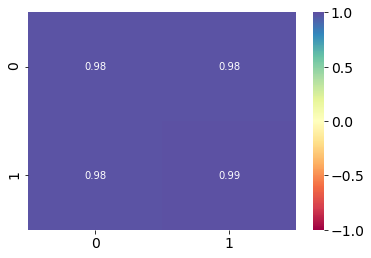

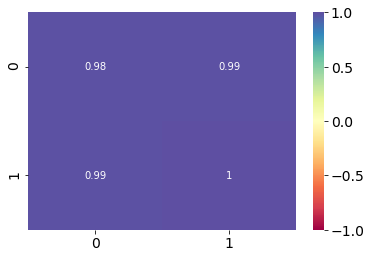

In [120]:


for cond in ['d1','d2','m1-ago','m1-ago+ant']:
    print(cond)
    df_temp  = return_acsf_and_drug(df_above_threshold,cond=[cond],joint=True)
    df_temp_exc = df_temp[df_temp.ei_labels==1]
    df_temp_inh = df_temp[df_temp.ei_labels==0]

    heterogeniety_for_drug(df_temp_exc,cond=cond,cols=cols_bio)
    plt.show()
    heterogeniety_for_drug(df_temp_inh,cond=cond,cols=cols_bio)
    plt.show()

### cluster stability

In [ ]:

data_umap_scaler = StandardScaler()

find_optimum_res(data_umap_scaler.fit_transform(normalize(df_biophys_inh[cols_bio])),save=True,savepath=savepath+'cluster_stability_bio_inh.pdf')
find_optimum_res(data_umap_scaler.fit_transform(normalize(df_biophys_exc[cols_bio])),save=True,savepath=savepath+'cluster_stability_bio_exc.pdf')


## passive params

### Excitatory clusters

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


4


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


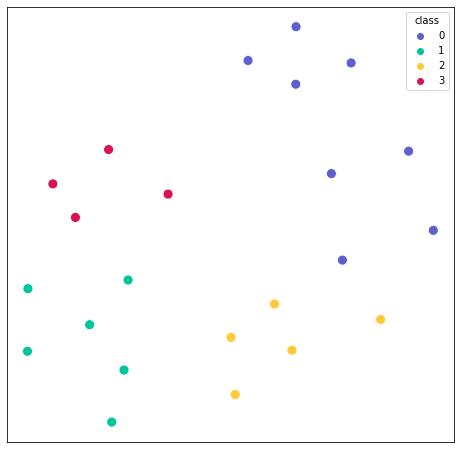

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


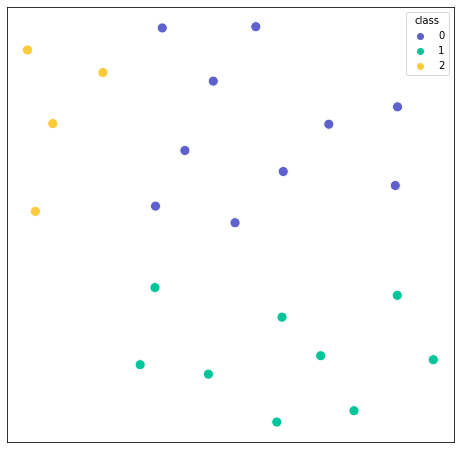

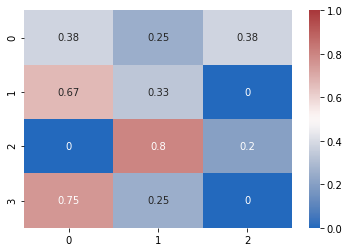

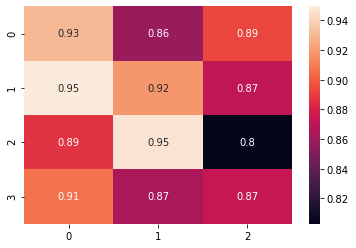

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


4


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


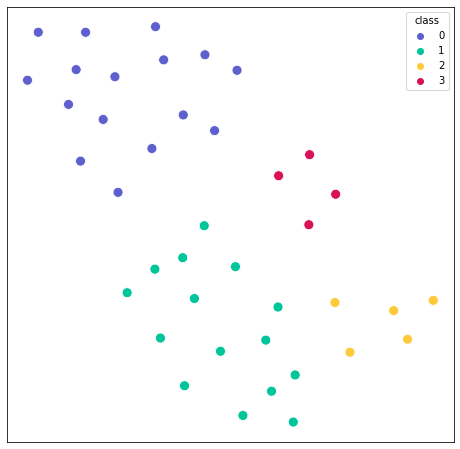

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


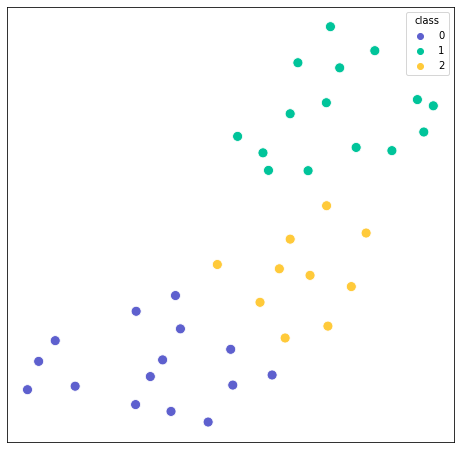

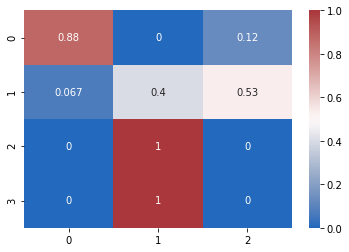

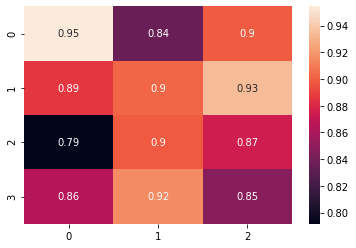

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


3


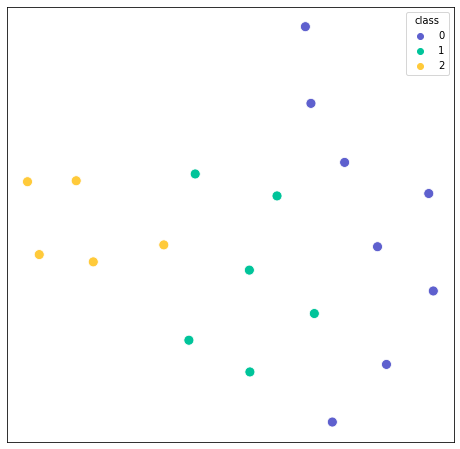

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


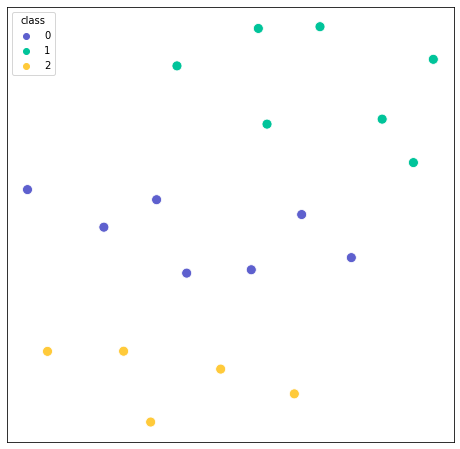

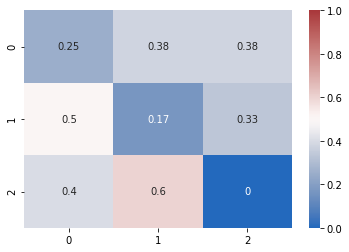

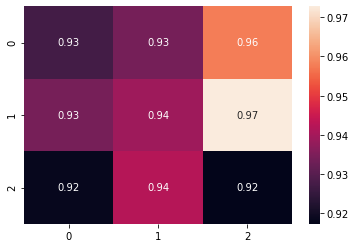

In [56]:
cols_bio = [ 'gl (nS)','C (nF)',  'El (mV)', 'Vr (mV)', 'Vt* (mV)', 'DV (mV)',]
adj_rand_score_exc = {}
adj_MI_exc = {}

from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score
save_dtype = 'biophys'
ei_type = 'exc'

for cond in ['d1','d2','m1-ago']:
    df_acsf,df_drug = return_acsf_and_drug(df_biophys_exc,cond=[cond],joint=False)
    df_acsf = df_acsf.drop_duplicates('exp_name')
    df_drug = df_drug.drop_duplicates('exp_name')
    bio_phys_acsf = normalize(np.vstack(df_acsf[cols_bio].to_numpy()),axis=0)
    lables_bio_acsf,mapper,reducer = plot_UMAP_clusters_single(bio_phys_acsf,
                              20,
                              0.1,
                              random_state =30,
                              res_louvain = 1.,
                              c_list =CUSTOM_PAL_SORT_3,
                              size=100,
                              norm=False,
                              save =True,
                              savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_cluster_'+ei_type+'_acsf.pdf'
                              )

    bio_phys_drug = normalize(np.vstack(df_drug[cols_bio].to_numpy()),axis=0)
    lables_bio_drug,mapper,reducer = plot_UMAP_clusters_single(bio_phys_drug,
                              20,
                              0.1,
                              random_state =30,
                              res_louvain = 1.,
                              c_list =CUSTOM_PAL_SORT_3,
                              size=100,
                              norm=False,
                              save =True,
                              savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_cluster_'+ei_type+'_drug.pdf'
                              )
    df_acsf['labels_bio'] = lables_bio_acsf
    df_drug['labels_bio'] = lables_bio_drug 
    adj_rand_score_exc[cond] = adjusted_rand_score(lables_bio_acsf,lables_bio_drug)
    adj_MI_exc[cond] =  adjusted_mutual_info_score(lables_bio_acsf,lables_bio_drug)
    
    return_confusion_matrix_(df_acsf,df_drug,'labels_bio','labels_bio',
                             shuffle=False,
                             cmap='vlag',
                             vmin=0,
                             vmax=1,
                             figsize=[6,5],
                             save=True,
                             savepath= savepath + cond+'/' +save_dtype+'/'+save_dtype+'_confusion_'+ei_type+'.pdf')
    plt.show()

    plot_cosine_mat(bio_phys_acsf,bio_phys_drug,lables_bio_acsf,lables_bio_drug,
                    save =True, 
                    savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_cosine_'+ei_type+'.pdf')
    plt.show()

In [221]:
print(adj_rand_score_exc) 
print(adj_MI_exc) 


{'d1': 0.05143971205758848, 'd2': 0.43529732036434804, 'm1-ago': -0.03069999196335289, 'm1-ago+ant': 0.09850881156800723}
{'d1': 0.11676823069309564, 'd2': 0.4771682005943345, 'm1-ago': 0.003969196009446965, 'm1-ago+ant': 0.14056307743436525}


### Inhibitory Clusters

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


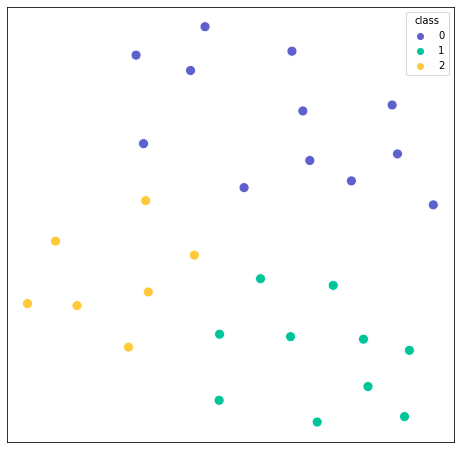

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


4


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


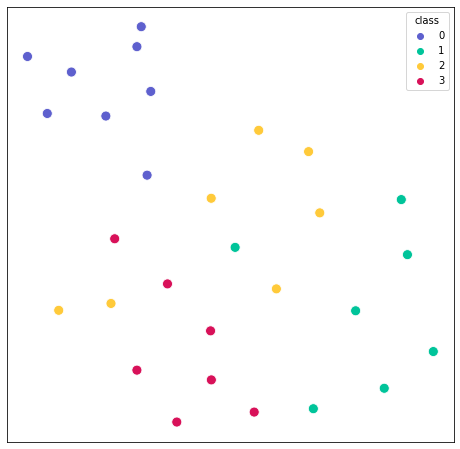

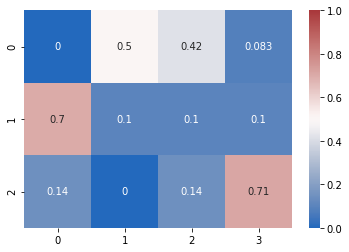

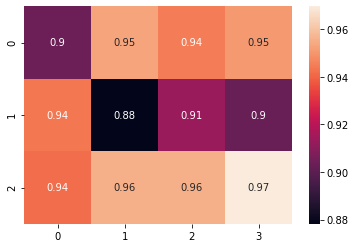

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


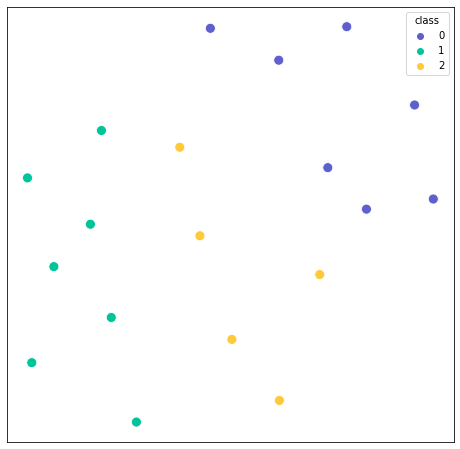

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


2


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


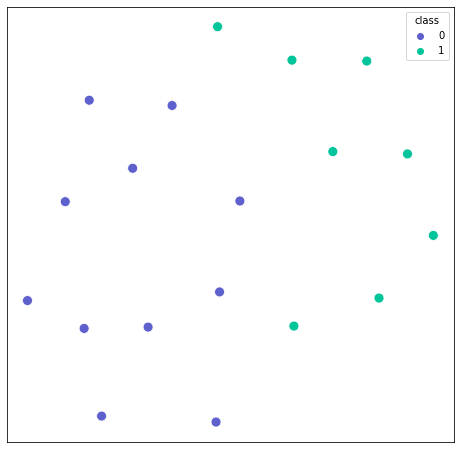

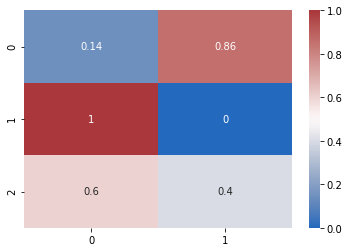

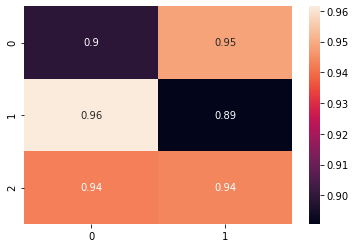

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


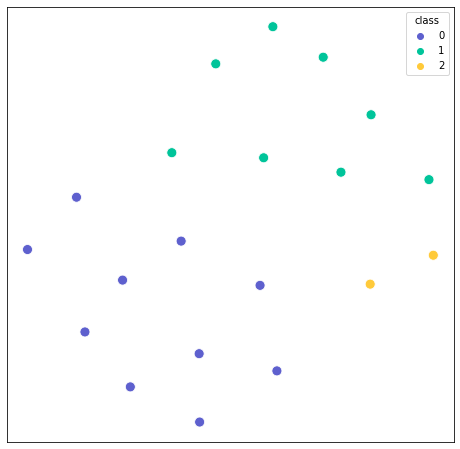

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


4


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


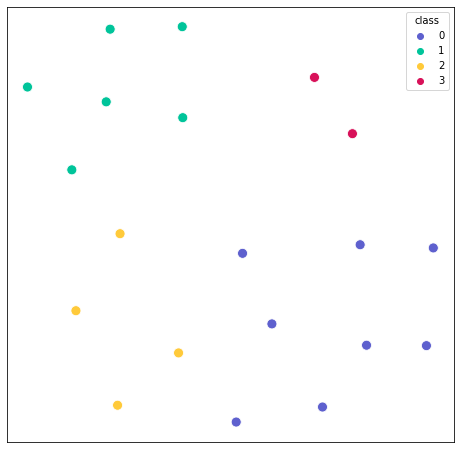

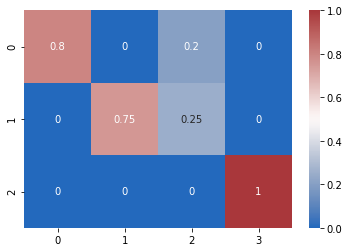

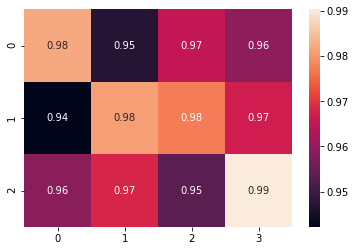

In [58]:
cols_bio = [ 'gl (nS)','C (nF)',  'El (mV)', 'Vr (mV)', 'Vt* (mV)', 'DV (mV)',]
adj_rand_score_inh = {}
adj_MI_inh = {}

from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score


save_dtype = 'biophys'
ei_type = 'inh'

for cond in ['d1','d2','m1-ago']:
    df_acsf,df_drug = return_acsf_and_drug(df_biophys_inh,cond=[cond],joint=False)
    common_exps = set(df_acsf.exp_name) & set(df_drug.exp_name)
    df_acsf = df_acsf.drop_duplicates('exp_name')
    df_acsf = df_acsf[df_acsf.exp_name.isin(common_exps)]
    df_drug = df_drug.drop_duplicates('exp_name')
    df_drug = df_drug[df_drug.exp_name.isin(common_exps)]

    bio_phys_acsf = normalize(np.vstack(df_acsf[cols_bio].to_numpy()),axis=0)
    lables_bio_acsf,mapper,reducer = plot_UMAP_clusters_single(bio_phys_acsf,
                              20,
                              0.1,
                              random_state =30,
                              res_louvain = 1.,
                              c_list =CUSTOM_PAL_SORT_3,
                              size=100,
                              norm=False,
                              save =True,
                              savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_cluster_'+ei_type+'_acsf.pdf'
                              )

    bio_phys_drug = normalize(np.vstack(df_drug[cols_bio].to_numpy()),axis=0)

    lables_bio_drug,mapper,reducer = plot_UMAP_clusters_single(bio_phys_drug,
                              20,
                              0.1,
                              random_state = 30,
                              res_louvain = 1.,
                              c_list = CUSTOM_PAL_SORT_3,
                              size =100,
                              norm =False,
                              save =True,
                              savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_cluster_'+ei_type+'_drug.pdf'
                              )
    
    df_acsf['labels_bio'] = lables_bio_acsf
    df_drug['labels_bio'] = lables_bio_drug 
    
    adj_rand_score_inh[cond] = adjusted_rand_score(lables_bio_acsf,lables_bio_drug)
    adj_MI_inh[cond] =  adjusted_mutual_info_score(lables_bio_acsf,lables_bio_drug)
    
    return_confusion_matrix_(df_acsf,df_drug,'labels_bio','labels_bio',
                             shuffle=False,
                             cmap='vlag',
                             vmin=0,
                             vmax=1,
                             figsize=[6,5],
                             save=True,
                             savepath= savepath + cond+'/' +save_dtype+'/'+save_dtype+'_confusion_'+ei_type+'.pdf'                            
                             )
    plt.show()

    plot_cosine_mat(bio_phys_acsf,bio_phys_drug,lables_bio_acsf,lables_bio_drug , 
                    save = True, 
                    savepath= savepath + cond+'/' +save_dtype+'/'+save_dtype+'_cosine_'+ei_type+'.pdf' )
    plt.show()

In [230]:
print(adj_rand_score_inh)
print(adj_MI_inh)

{'d1': 0.3224584298042517, 'd2': 0.34927004774095344, 'm1-ago': 0.6237623762376238, 'm1-ago+ant': 0.4253627760252366}
{'d1': 0.3294163695479657, 'd2': 0.35439519481953147, 'm1-ago': 0.6700118832196741, 'm1-ago+ant': 0.5072854857108972}


### Radar Plot Excitatory

#### D1

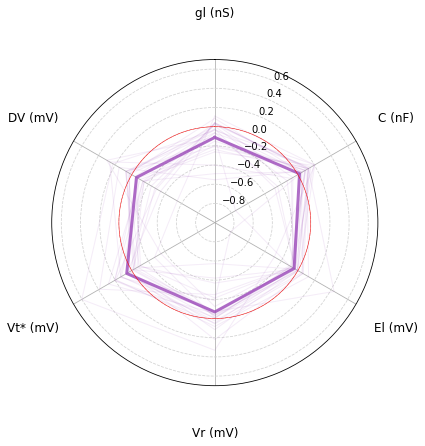

In [59]:
df_temp_acsf,df_temp_drug  = return_acsf_and_drug(df_above_threshold,cond=['d1'],joint=False)
exc_acsf = df_temp_acsf[df_temp_acsf.ei_labels==1]
exc_acsf = exc_acsf.drop_duplicates('exp_name')
# exc_acsf.reset_index(True)
exc_drug = df_temp_drug[df_temp_drug.ei_labels==1]
exc_drug = exc_drug.drop_duplicates('exp_name')
# exc_acsf.reset_index(True) 
plot_radar((exc_acsf[cols_bio].reset_index(drop=True) - exc_drug[cols_bio].reset_index(drop=True))/exc_acsf[cols_bio].reset_index(drop=True),
           cols_bio,
           np.repeat(0, len(exc_acsf)),
           logscale=False,
           lims=(-1,7e-1),
           palette=coherence_colors,
           save=True,
           savepath=savepath+'d1/biophys/'+'exc_FN_spikes_radar.pdf')


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:4.335e-03 t=-3.180e+00


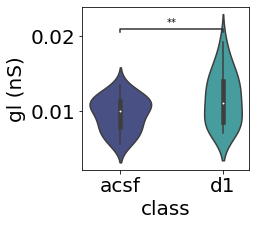

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:8.008e-02 t=1.835e+00


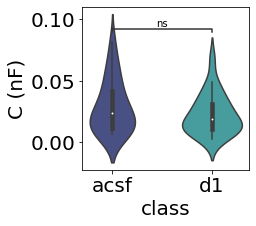

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:3.627e-01 t=9.295e-01


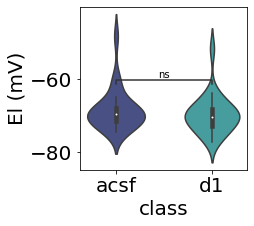

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:3.661e-01 t=9.228e-01


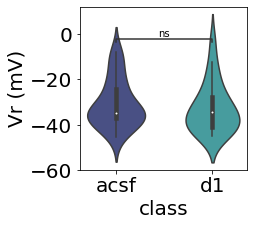

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:1.389e-01 t=-1.536e+00


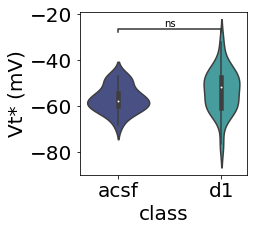

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:9.277e-01 t=-9.175e-02


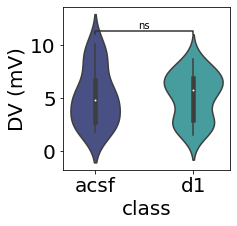

In [57]:
df_temp_d1 = return_acsf_and_drug(df_above_threshold,cond=['d1'],joint=True)

for val in cols_bio:

    fig,ax = plt.subplots(1,1,figsize=[3,3])

    plot_significance_new(data = df_temp_d1[df_temp_d1.ei_labels==1],
    var = val,
    hue = 'cond',
    ax = ax,
    drug = True,
    # palette = CUSTOM_PAL_SORT_3[:len(set(df_temp_m1_ant_ago['labels_lv']))] 
    test ='t-test_paired'
    )
    # plt.savefig('C:/Users/Nishant Joshi/Documents/DNM/'+val+'_'+cond+'_dist.png',dpi=200)


#### D2

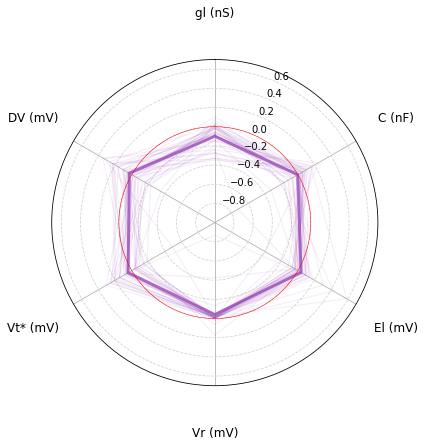

In [60]:
df_temp_acsf,df_temp_drug  = return_acsf_and_drug(df_above_threshold,cond=['d2'],joint=False)
exc_acsf = df_temp_acsf[df_temp_acsf.ei_labels==1]
exc_acsf = exc_acsf.drop_duplicates('exp_name')
# exc_acsf.reset_index(True)
exc_drug = df_temp_drug[df_temp_drug.ei_labels==1]
exc_drug = exc_drug.drop_duplicates('exp_name')
# exc_acsf.reset_index(True) 
plot_radar((exc_acsf[cols_bio].reset_index(drop=True) - exc_drug[cols_bio].reset_index(drop=True))/exc_acsf[cols_bio].reset_index(drop=True),
           cols_bio,
           np.repeat(0, len(exc_acsf)),
           logscale=False,
           lims=(-1,7e-1),
           palette=coherence_colors,
           save=True,
           savepath=savepath+'d2/biophys/'+'exc_FN_spikes_radar.pdf')


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:1.172e-06 t=-5.593e+00


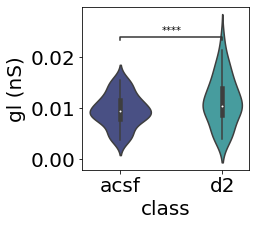

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:7.461e-02 t=1.824e+00


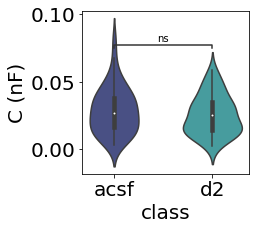

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:5.447e-02 t=-1.973e+00


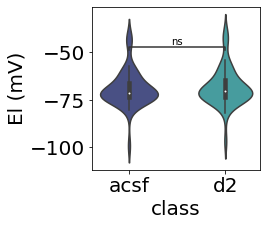

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:3.591e-04 t=3.854e+00


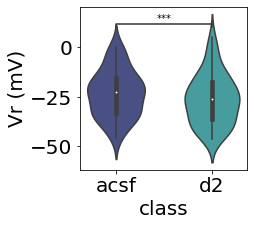

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:6.191e-03 t=-2.869e+00


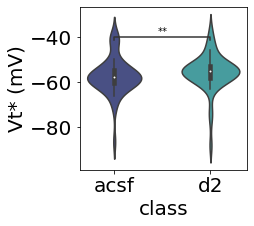

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:3.093e-01 t=1.028e+00


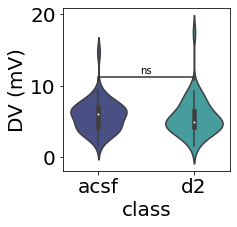

In [40]:
df_temp_d2 = return_acsf_and_drug(df_above_threshold,cond=['d2'],joint=True)

for val in cols_bio:
    acsf = df_temp_d1[df_temp_d1.cond=='acsf'][val].to_numpy()
    drug = df_temp_d1[df_temp_d1.cond!='ascf'][val].to_numpy()
    print(cohend(acsf,drug))
    fig,ax = plt.subplots(1,1,figsize=[3,3])

    plot_significance_new(data = df_temp_d2[df_temp_d2.ei_labels==1],
    var = val,
    hue = 'cond',
    ax = ax,
    drug = True,
    # palette = CUSTOM_PAL_SORT_3[:len(set(df_temp_m1_ant_ago['labels_lv']))] 
    test ='t-test_paired'
    )
    # plt.savefig('C:/Users/Nishant Joshi/Documents/DNM/'+val+'_'+cond+'_dist.png',dpi=200)


#### M1 ago

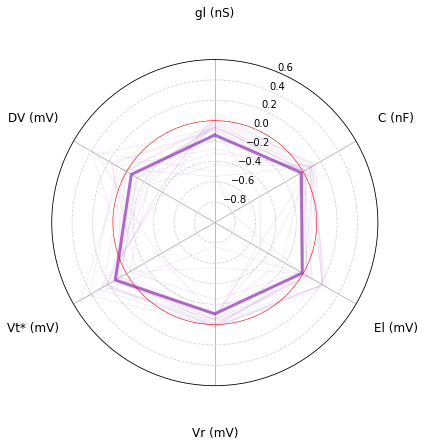

In [61]:
df_temp_acsf,df_temp_drug  = return_acsf_and_drug(df_above_threshold,cond=['m1-ago'],joint=False)
exc_acsf = df_temp_acsf[df_temp_acsf.ei_labels==1]
exc_acsf = exc_acsf.drop_duplicates('exp_name')
# exc_acsf.reset_index(True)
exc_drug = df_temp_drug[df_temp_drug.ei_labels==1]
exc_drug = exc_drug.drop_duplicates('exp_name')
# exc_acsf.reset_index(True) 
plot_radar((exc_acsf[cols_bio].reset_index(drop=True) - exc_drug[cols_bio].reset_index(drop=True))/exc_acsf[cols_bio].reset_index(drop=True),
           cols_bio,
           np.repeat(0, len(exc_acsf)),
           logscale=False,
           lims=(-1,6e-1),
           palette=coherence_colors,
           save=True,
           savepath=savepath+'m1-ago/biophys/'+'exc_FN_spikes_radar.pdf')


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:3.607e-03 t=-3.345e+00


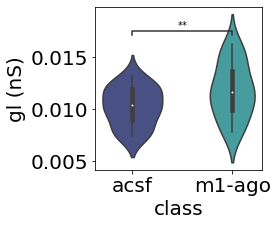

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:3.216e-01 t=1.019e+00


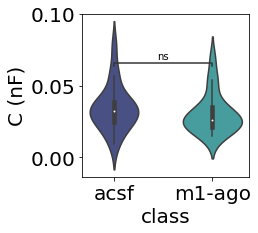

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:9.200e-01 t=1.019e-01


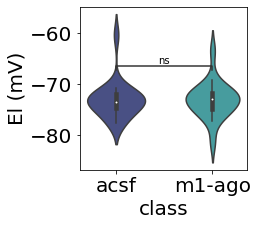

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:8.577e-03 t=2.949e+00


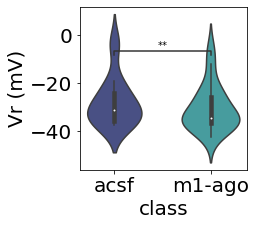

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:9.971e-03 t=-2.880e+00


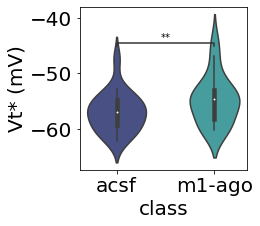

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:5.454e-01 t=-6.164e-01


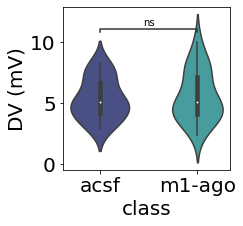

In [52]:
for val in cols_bio:

    fig,ax = plt.subplots(1,1,figsize=[3,3])

    plot_significance_new(data = df_temp_m1[df_temp_m1.ei_labels==1],
    var = val,
    hue = 'cond',
    ax = ax,
    drug = True,
    # palette = CUSTOM_PAL_SORT_3[:len(set(df_temp_m1_ant_ago['labels_lv']))] 
    test ='t-test_paired'
    )
    # plt.savefig('C:/Users/Nishant Joshi/Documents/DNM/'+val+'_'+cond+'_dist.png',dpi=200)


#### M1-ago+ant

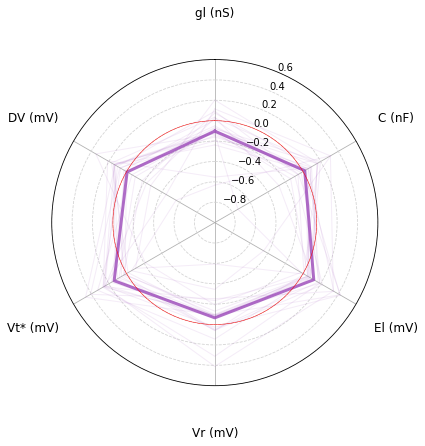

In [36]:
df_temp_acsf,df_temp_drug  = return_acsf_and_drug(df_above_threshold,cond=['m1-ago+ant'],joint=False)
exc_acsf = df_temp_acsf[df_temp_acsf.ei_labels==1]
exc_acsf = exc_acsf.drop_duplicates('exp_name')
# exc_acsf.reset_index(True)
exc_drug = df_temp_drug[df_temp_drug.ei_labels==1]
exc_drug = exc_drug.drop_duplicates('exp_name')
# exc_acsf.reset_index(True) 
plot_radar((exc_acsf[cols_bio].reset_index(drop=True) - exc_drug[cols_bio].reset_index(drop=True))/exc_acsf[cols_bio].reset_index(drop=True),cols_bio,np.repeat(0, len(exc_acsf)),logscale=False,lims=(-1,6e-1),palette=coherence_colors,save=False,savepath=savepath+'Exc_FN_spikes_radar.pdf')


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:2.965e-02 t=-2.342e+00


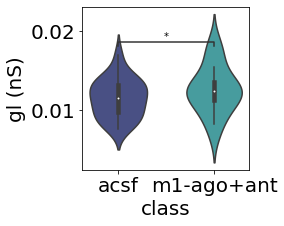

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:4.699e-01 t=7.366e-01


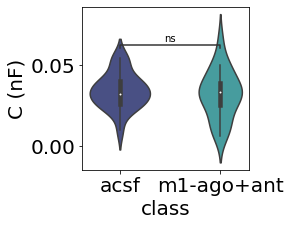

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:6.543e-03 t=-3.035e+00


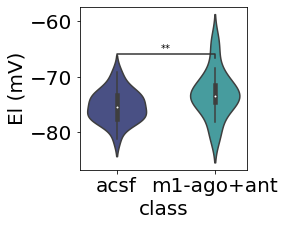

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:6.122e-01 t=5.150e-01


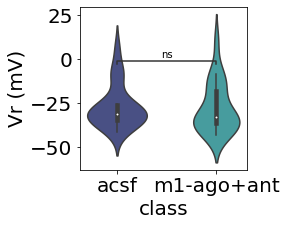

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:1.023e-03 t=-3.840e+00


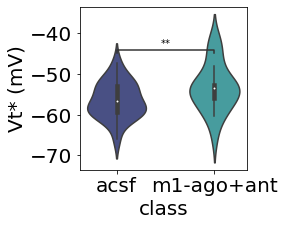

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:8.842e-01 t=1.475e-01


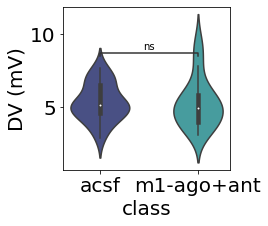

In [56]:
df_temp_m1_ago_ant = return_acsf_and_drug(df_above_threshold,cond=['m1-ago+ant'],joint=True,remove_duplicates=True)

df_temp_m1_acsf = df_temp_m1_ago_ant[df_temp_m1_ago_ant.cond=='acsf']
df_temp_m1_drug = df_temp_m1_ago_ant[df_temp_m1_ago_ant.cond!='acsf']

common_exps = set(df_temp_m1_acsf.exp_name) & set(df_temp_m1_drug.exp_name)
df_temp_m1_acsf = df_temp_m1_acsf[df_temp_m1_acsf.exp_name.isin(common_exps)]
df_temp_m1_drug = df_temp_m1_drug[df_temp_m1_drug.exp_name.isin(common_exps)]

df_temp_m1 = pd.concat([df_temp_m1_acsf,df_temp_m1_drug])
for val in cols_bio:

    fig,ax = plt.subplots(1,1,figsize=[3,3])

    plot_significance_new(data = df_temp_m1[df_temp_m1.ei_labels==1],
    var = val,
    hue = 'cond',
    ax = ax,
    drug = True,
    # palette = CUSTOM_PAL_SORT_3[:len(set(df_temp_m1_ant_ago['labels_lv']))] 
    test ='t-test_paired'
    )
    # plt.savefig('C:/Users/Nishant Joshi/Documents/DNM/'+val+'_'+cond+'_dist.png',dpi=200)


### Radar Plot Inhibitory

#### D1

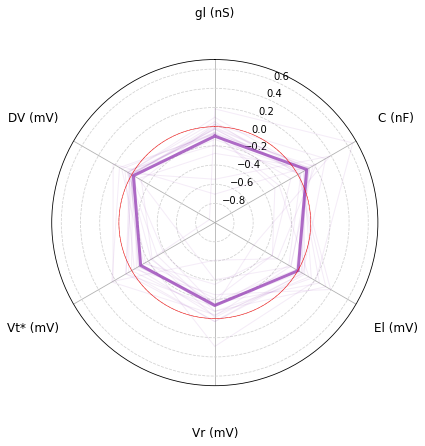

In [63]:
df_temp_acsf,df_temp_drug  = return_acsf_and_drug(df_above_threshold,cond=['d2'],joint=False)
inh_acsf = df_temp_acsf[df_temp_acsf.ei_labels==0]
inh_acsf = inh_acsf.drop_duplicates('exp_name')
# inh_acsf.reset_index(True)
inh_drug = df_temp_drug[df_temp_drug.ei_labels==0]
inh_drug = inh_drug.drop_duplicates('exp_name')
# inh_acsf.reset_index(True) 
plot_radar((inh_acsf[cols_bio].reset_index(drop=True) - inh_drug[cols_bio].reset_index(drop=True))/inh_acsf[cols_bio].reset_index(drop=True),
           cols_bio,
           np.repeat(0, len(inh_acsf)),
           logscale=False,
           lims=(-1,7e-1),
           palette=coherence_colors,
           save=False,
           savepath=savepath+'d1/biophys/'+'inh_FN_spikes_radar.pdf')


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:7.679e-02 t=-1.837e+00


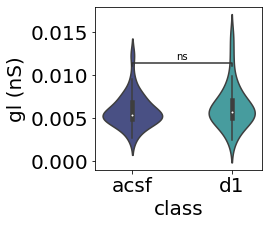

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:7.261e-03 t=2.896e+00


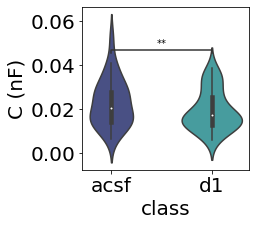

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:6.418e-01 t=4.702e-01


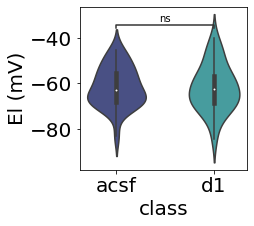

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:1.194e-02 t=2.689e+00


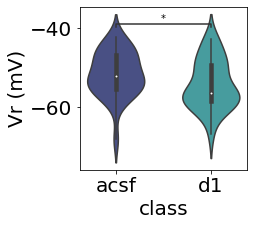

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:2.206e-04 t=4.239e+00


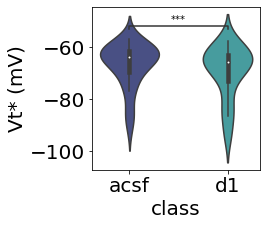

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d1: t-test paired samples, P_val:3.519e-01 t=-9.467e-01


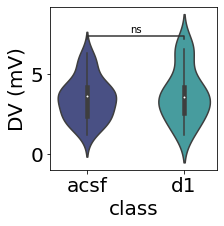

In [38]:
df_temp_d1  = return_acsf_and_drug(df_above_threshold,cond=['d1'],joint=True)


for val in cols_bio:

    fig,ax = plt.subplots(1,1,figsize=[3,3])

    plot_significance_new(data = df_temp_d1[df_temp_d1.ei_labels==0],
    var = val,
    hue = 'cond',
    ax = ax,
    drug = True,
    # palette = CUSTOM_PAL_SORT_3[:len(set(df_temp_m1_ant_ago['labels_lv']))] 
    test ='t-test_paired'
    )
    # plt.savefig('C:/Users/Nishant Joshi/Documents/DNM/'+val+'_'+cond+'_dist.png',dpi=200)


#### D2

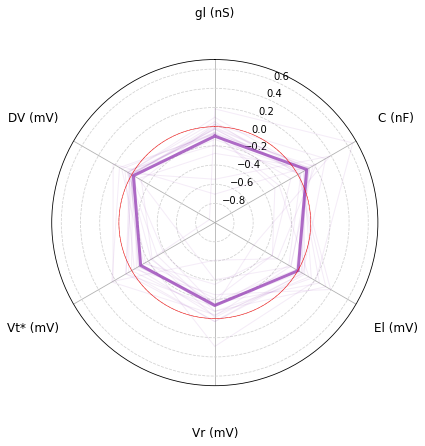

In [64]:
df_temp_acsf,df_temp_drug  = return_acsf_and_drug(df_above_threshold,cond=['d2'],joint=False)
inh_acsf = df_temp_acsf[df_temp_acsf.ei_labels==0]
inh_acsf = inh_acsf.drop_duplicates('exp_name')
# inh_acsf.reset_index(True)

inh_drug = df_temp_drug[df_temp_drug.ei_labels==0]
inh_drug = inh_drug.drop_duplicates('exp_name')
# inh_acsf.reset_index(True) 

plot_radar((inh_acsf[cols_bio].reset_index(drop=True) - inh_drug[cols_bio].reset_index(drop=True))/inh_acsf[cols_bio].reset_index(drop=True),
           cols_bio,
           np.repeat(0, len(inh_acsf)),
           logscale=False,
           lims=(-1,7e-1),
           palette=coherence_colors,
           save=False,
           savepath=savepath+'d2/biophys/'+'inh_FN_spikes_radar.pdf')


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:7.374e-02 t=-1.899e+00


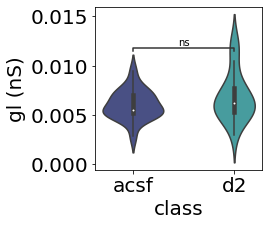

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:4.731e-02 t=2.129e+00


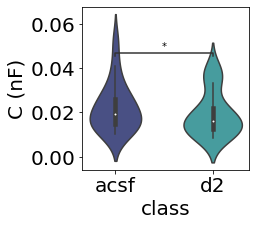

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:9.264e-01 t=-9.372e-02


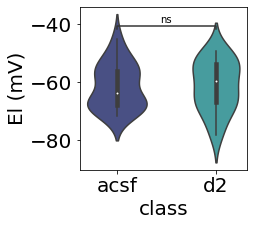

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:6.916e-03 t=3.048e+00


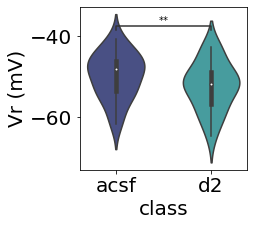

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:3.352e-02 t=2.302e+00


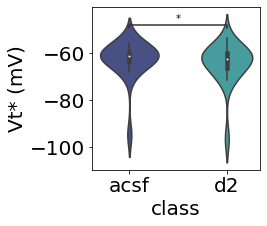

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. d2: t-test paired samples, P_val:9.668e-01 t=-4.225e-02


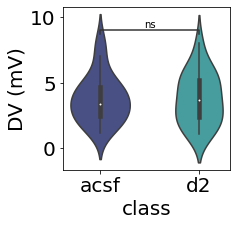

In [39]:
df_temp_d2 = return_acsf_and_drug(df_above_threshold,cond=['d2'],joint=True)

for val in cols_bio:

    fig,ax = plt.subplots(1,1,figsize=[3,3])

    plot_significance_new(data = df_temp_d2[df_temp_d2.ei_labels==0],
    var = val,
    hue = 'cond',
    ax = ax,
    drug = True,
    # palette = CUSTOM_PAL_SORT_3[:len(set(df_temp_m1_ant_ago['labels_lv']))] 
    test ='t-test_paired'
    )
    # plt.savefig('C:/Users/Nishant Joshi/Documents/DNM/'+val+'_'+cond+'_dist.png',dpi=200)


#### M1 ago

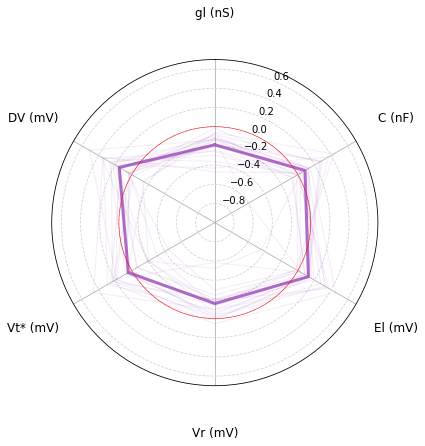

In [68]:
df_temp_acsf,df_temp_drug  = return_acsf_and_drug(df_above_threshold,cond=['m1-ago'],joint=False)
inh_acsf = df_temp_acsf[df_temp_acsf.ei_labels==0]
common_exps = set(df_temp_acsf.exp_name) & set(df_temp_drug.exp_name)
inh_acsf = inh_acsf.drop_duplicates('exp_name')
inh_acsf = inh_acsf[inh_acsf.exp_name.isin(common_exps)]
# inh_acsf.reset_index(True)
inh_drug = df_temp_drug[df_temp_drug.ei_labels==0]
inh_drug = inh_drug.drop_duplicates('exp_name')
inh_drug = inh_drug[inh_drug.exp_name.isin(common_exps)]

# inh_acsf.reset_index(True) 
plot_radar((inh_acsf[cols_bio].reset_index(drop=True) - inh_drug[cols_bio].reset_index(drop=True))/inh_acsf[cols_bio].reset_index(drop=True),
           cols_bio,
           np.repeat(0, len(inh_acsf)),
           logscale=False,
           lims=(-1,7e-1),
           palette=coherence_colors,
           save=True,
           savepath=savepath+'m1-ago/biophys/'+'inh_FN_spikes_radar.pdf')


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:3.908e-07 t=-7.551e+00


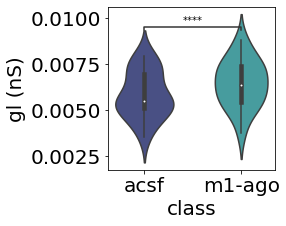

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:2.818e-02 t=2.376e+00


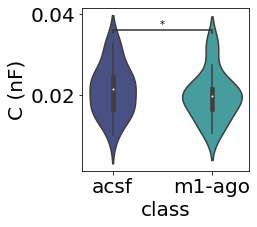

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:1.233e-02 t=-2.765e+00


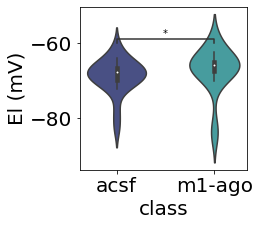

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:6.554e-04 t=4.068e+00


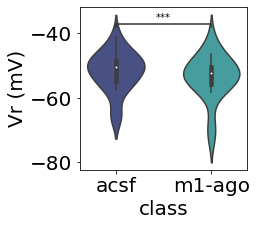

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:4.531e-01 t=-7.660e-01


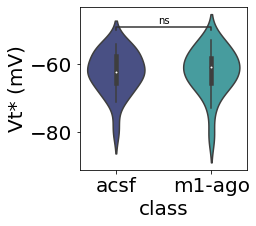

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago: t-test paired samples, P_val:2.318e-03 t=3.514e+00


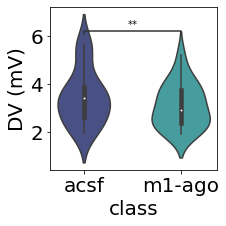

In [51]:
df_temp_m1 = return_acsf_and_drug(df_above_threshold,cond=['m1-ago'],joint=True,remove_duplicates=True)

df_temp_m1_acsf = df_temp_m1[df_temp_m1.cond=='acsf']
df_temp_m1_drug = df_temp_m1[df_temp_m1.cond!='acsf']

common_exps = set(df_temp_m1_acsf.exp_name) & set(df_temp_m1_drug.exp_name)
df_temp_m1_acsf = df_temp_m1_acsf[df_temp_m1_acsf.exp_name.isin(common_exps)]
df_temp_m1_drug = df_temp_m1_drug[df_temp_m1_drug.exp_name.isin(common_exps)]

df_temp_m1 = pd.concat([df_temp_m1_acsf,df_temp_m1_drug])
for val in cols_bio:

    fig,ax = plt.subplots(1,1,figsize=[3,3])

    plot_significance_new(data = df_temp_m1[df_temp_m1.ei_labels==0],
    var = val,
    hue = 'cond',
    ax = ax,
    drug = True,
    # palette = CUSTOM_PAL_SORT_3[:len(set(df_temp_m1_ant_ago['labels_lv']))] 
    test ='t-test_paired'
    )
    # plt.savefig('C:/Users/Nishant Joshi/Documents/DNM/'+val+'_'+cond+'_dist.png',dpi=200)


#### M1-ago+ant

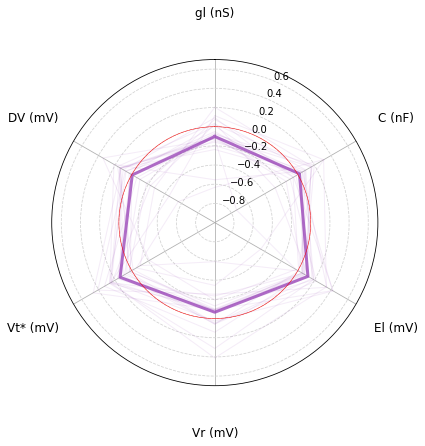

In [42]:
df_temp_acsf,df_temp_drug  = return_acsf_and_drug(df_above_threshold,cond=['m1-ago+ant'],joint=False)
exc_acsf = df_temp_acsf[df_temp_acsf.ei_labels==1]
exc_acsf = exc_acsf.drop_duplicates('exp_name')
# exc_acsf.reset_index(True)
exc_drug = df_temp_drug[df_temp_drug.ei_labels==1]
exc_drug = exc_drug.drop_duplicates('exp_name')
# exc_acsf.reset_index(True) 
plot_radar((exc_acsf[cols_bio].reset_index(drop=True) - exc_drug[cols_bio].reset_index(drop=True))/exc_acsf[cols_bio].reset_index(drop=True),cols_bio,np.repeat(0, len(exc_acsf)),logscale=False,lims=(-1,7e-1),palette=coherence_colors,save=False,savepath=savepath+'Exc_FN_spikes_radar.pdf')


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:9.763e-01 t=3.002e-02


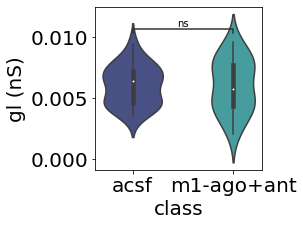

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:1.633e-02 t=2.600e+00


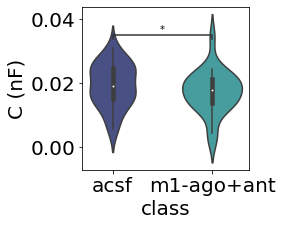

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:1.022e-01 t=-1.705e+00


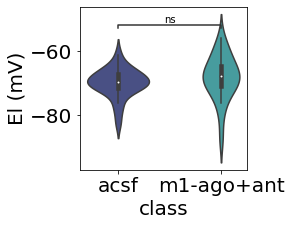

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:8.132e-01 t=-2.391e-01


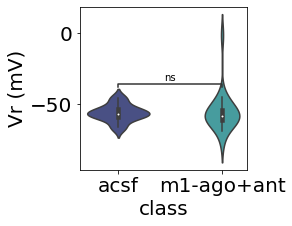

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:2.325e-01 t=1.228e+00


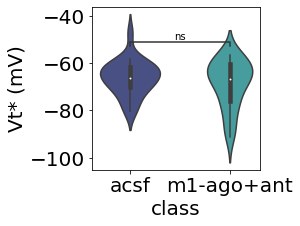

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

acsf vs. m1-ago+ant: t-test paired samples, P_val:2.445e-01 t=-1.196e+00


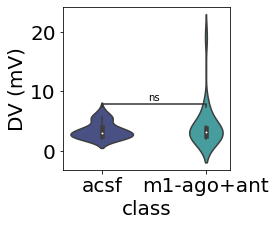

In [55]:

for val in cols_bio:

    fig,ax = plt.subplots(1,1,figsize=[3,3])

    plot_significance_new(data = df_temp_m1[df_temp_m1.ei_labels==0],
    var = val,
    hue = 'cond',
    ax = ax,
    drug = True,
    # palette = CUSTOM_PAL_SORT_3[:len(set(df_temp_m1_ant_ago['labels_lv']))] 
    test ='t-test_paired'
    )
    # plt.savefig('C:/Users/Nishant Joshi/Documents/DNM/'+val+'_'+cond+'_dist.png',dpi=200)


## eta

d1


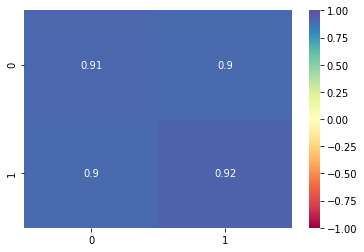

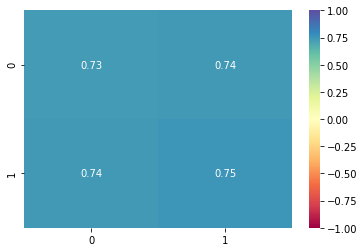

d2


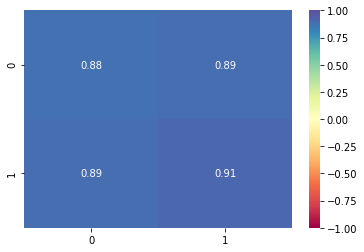

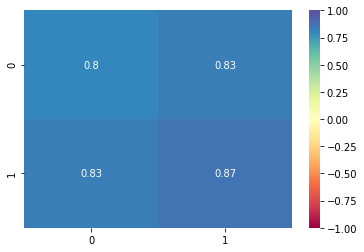

m1-ago


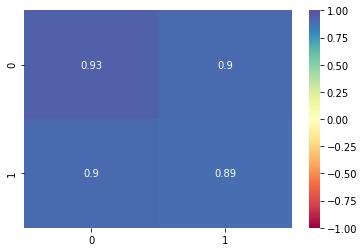

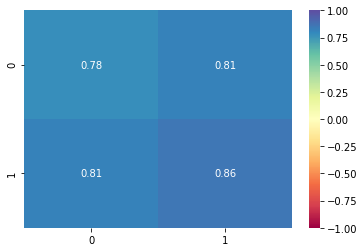

m1-ago+ant


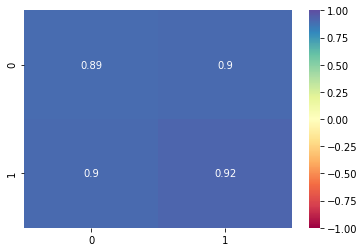

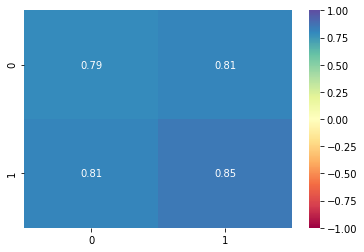

In [25]:

for cond in ['d1','d2','m1-ago','m1-ago+ant']:
    print(cond)
    df_temp  = return_acsf_and_drug(df_above_threshold,cond=[cond],joint=True)
    df_temp_exc = df_temp[df_temp.ei_labels==1]
    df_temp_inh = df_temp[df_temp.ei_labels==0]

    heterogeniety_for_drug(df_temp_exc,cond=cond,cols='eta')
    plt.show()
    heterogeniety_for_drug(df_temp_inh,cond=cond,cols='eta')
    plt.show()

### Clustering Inhibitory 

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


2


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


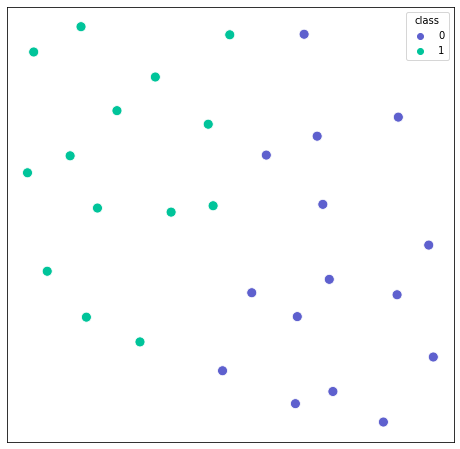

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


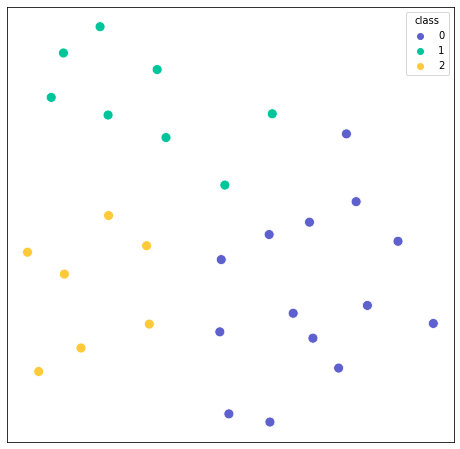

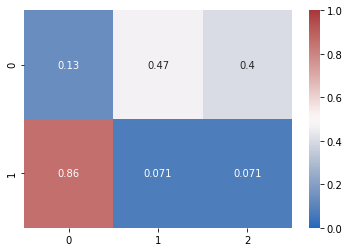

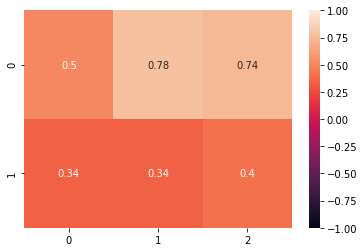

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


4


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


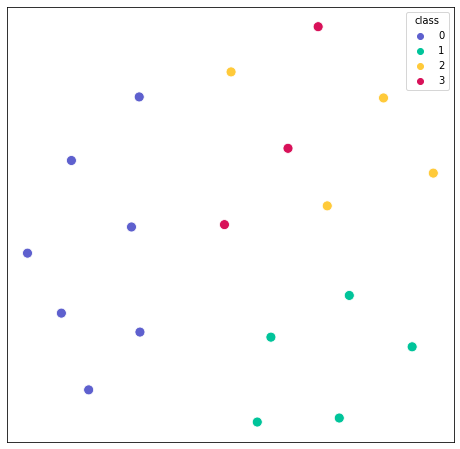

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


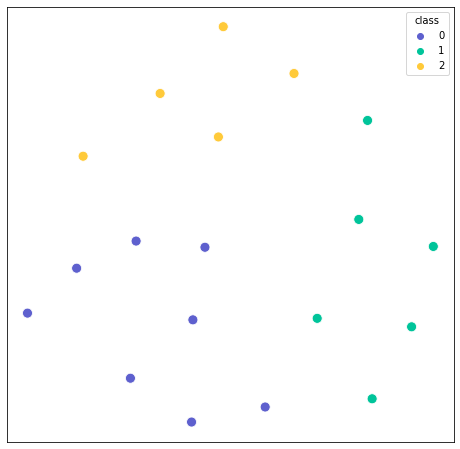

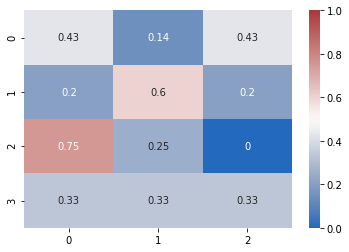

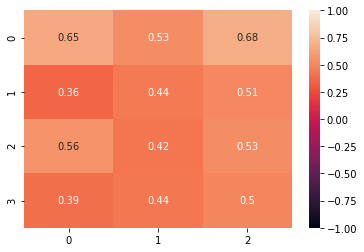

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


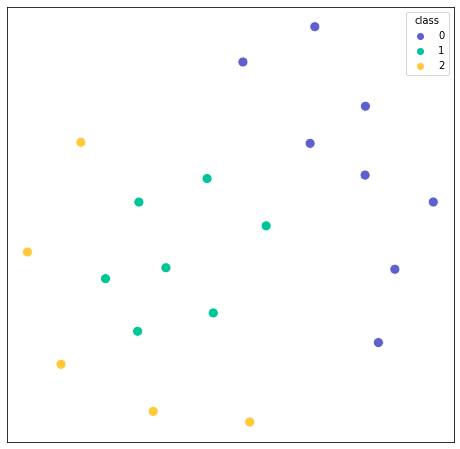

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


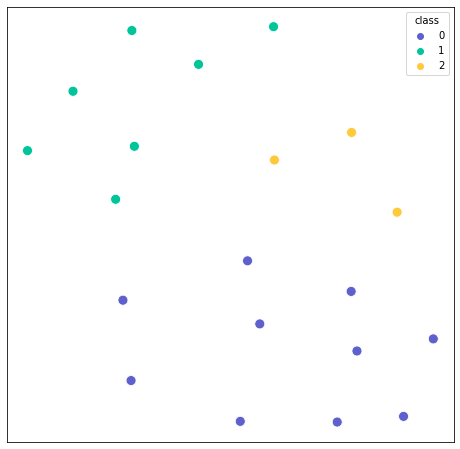

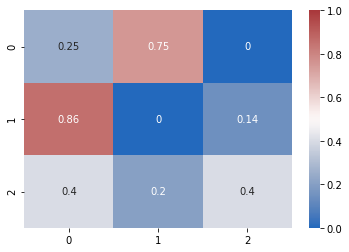

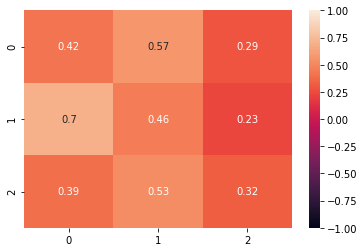

In [ ]:
cols_bio = [ 'gl (nS)','C (nF)',  'El (mV)', 'Vr (mV)', 'Vt* (mV)', 'DV (mV)',]
adj_rand_score_inh = {}
adj_MI_inh = {}

from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score

save_dtype = 'adaptation'
ei_type = 'inh'

for cond in ['d1','d2','m1-ago']:
    df_acsf,df_drug = return_acsf_and_drug(df_biophys_inh,cond=[cond],joint=False)
    common_exps = set(df_acsf.exp_name) & set(df_drug.exp_name)
    df_acsf = df_acsf.drop_duplicates('exp_name')
    df_acsf = df_acsf[df_acsf.exp_name.isin(common_exps)]
    df_drug = df_drug.drop_duplicates('exp_name')
    df_drug = df_drug[df_drug.exp_name.isin(common_exps)]

    bio_phys_acsf = normalize(np.vstack(df_acsf['eta'].to_numpy()),axis=0)
    lables_bio_acsf,mapper,reducer = plot_UMAP_clusters_single(bio_phys_acsf,
                              20,
                              0.1,
                              random_state =30,
                              res_louvain = 1.,
                              c_list =CUSTOM_PAL_SORT_3,
                              size=100,
                              norm=False,
                              save =True,
                              savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_cluster_'+ei_type+'_acsf.pdf'
                              )

    bio_phys_drug = normalize(np.vstack(df_drug['eta'].to_numpy()),axis=0)
    lables_bio_drug,mapper,reducer = plot_UMAP_clusters_single(bio_phys_drug,
                              20,
                              0.1,
                              random_state =30,
                              res_louvain = 1.,
                              c_list =CUSTOM_PAL_SORT_3,
                              size=100,
                              norm=False,
                              save =True,
                              savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_cluster_'+ei_type+'_drug.pdf'
                              )
    
    df_acsf['labels_bio'] = lables_bio_acsf
    df_drug['labels_bio'] = lables_bio_drug 
    adj_rand_score_inh[cond] = adjusted_rand_score(lables_bio_acsf,lables_bio_drug)
    adj_MI_inh[cond] =  adjusted_mutual_info_score(lables_bio_acsf,lables_bio_drug)

    return_confusion_matrix_(df_acsf,df_drug,'labels_bio','labels_bio',
                             shuffle=False,
                             cmap='vlag',
                             vmin=0,
                             vmax=1,
                             figsize=[6,5],
                             save=True,
                             savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_confusion_'+ei_type+'.pdf')
    plt.show()
    plot_cosine_mat(bio_phys_acsf,bio_phys_drug,lables_bio_acsf,lables_bio_drug,
                    save = True,
                    savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_cosine_'+ei_type+'.pdf')
    plt.show()

In [250]:
print(adj_rand_score_inh) 
print(adj_MI_inh) 

{'d1': 0.35267857142857145, 'd2': -0.011660807682414473, 'm1-ago': 0.27185066139201386, 'm1-ago+ant': 0.3909407665505226}
{'d1': 0.304677219176899, 'd2': -0.03966407889791596, 'm1-ago': 0.26322428474716353, 'm1-ago+ant': 0.2999132014236611}


### Clustering Excitatory

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


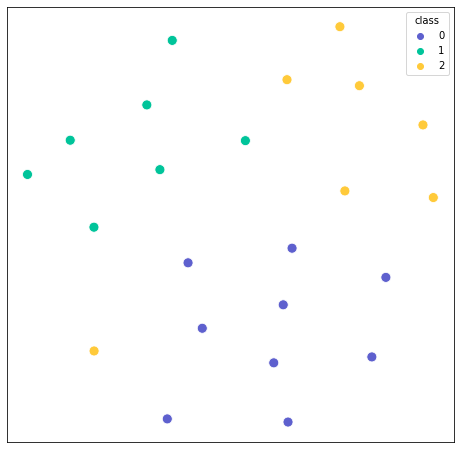

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


2


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


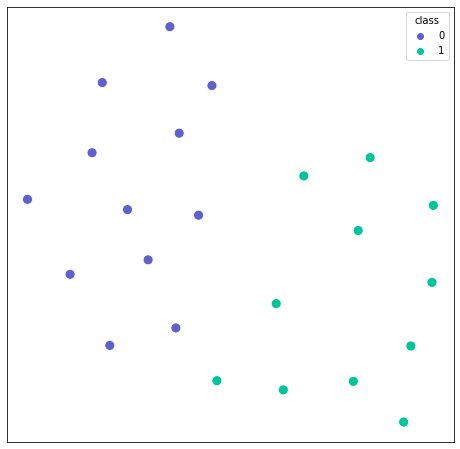

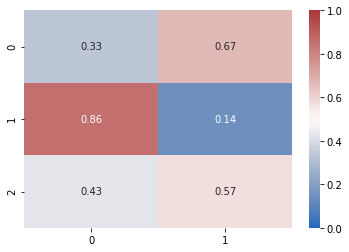

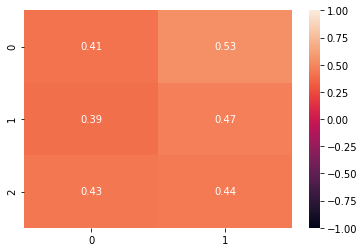

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


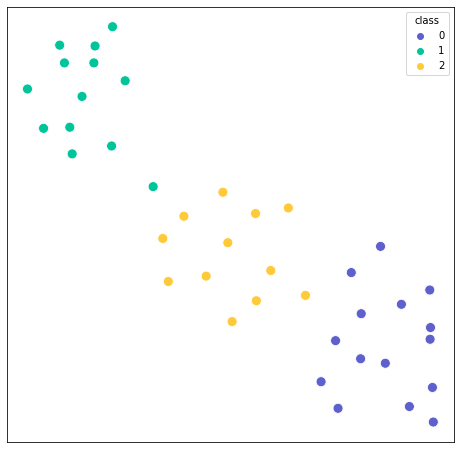

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


4


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


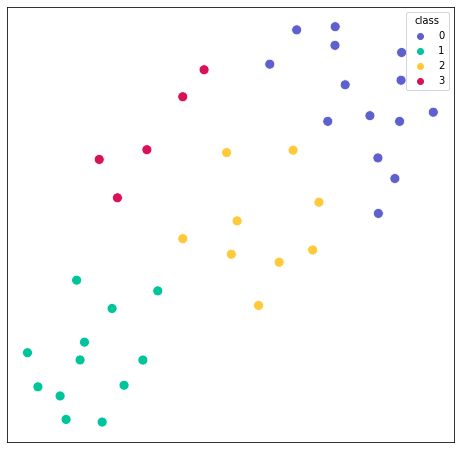

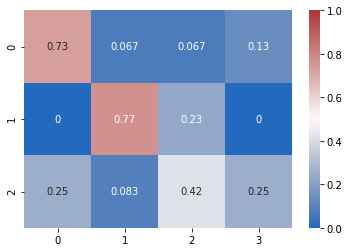

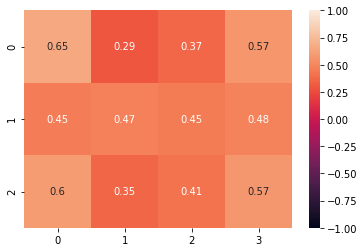

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


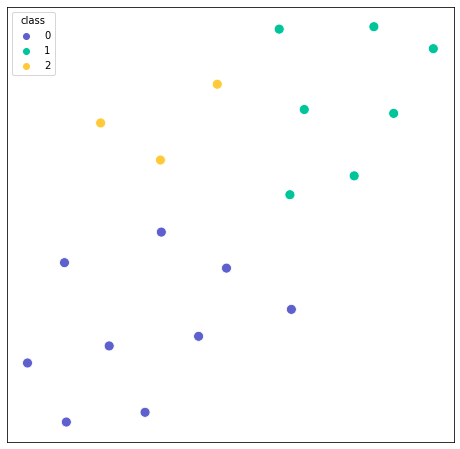

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


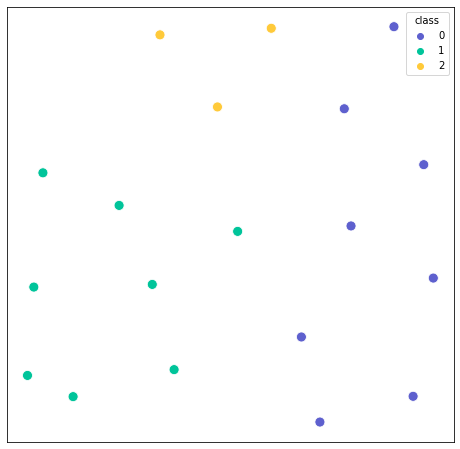

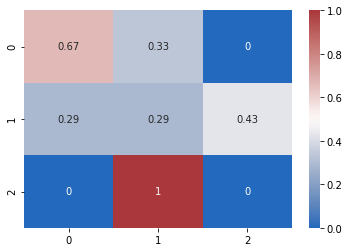

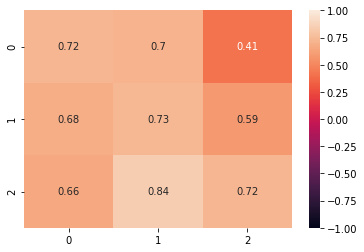

In [74]:
cols_bio = [ 'gl (nS)','C (nF)',  'El (mV)', 'Vr (mV)', 'Vt* (mV)', 'DV (mV)',]
adj_rand_score_exc = {}
adj_MI_exc = {}

from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score
save_dtype = 'adaptation'
ei_type = 'exc'

for cond in ['d1','d2','m1-ago']:
    df_acsf,df_drug = return_acsf_and_drug(df_biophys_exc,cond=[cond],joint=False)
    common_exps = set(df_acsf.exp_name) & set(df_drug.exp_name)
    df_acsf = df_acsf.drop_duplicates('exp_name')
    df_acsf = df_acsf[df_acsf.exp_name.isin(common_exps)]
    df_drug = df_drug.drop_duplicates('exp_name')
    df_drug = df_drug[df_drug.exp_name.isin(common_exps)]

    bio_phys_acsf = normalize(np.vstack(df_acsf['eta'].to_numpy()),axis=0)
    lables_bio_acsf,mapper,reducer = plot_UMAP_clusters_single(bio_phys_acsf,
                              20,
                              0.1,
                              random_state =30,
                              res_louvain = 1.,
                              c_list =CUSTOM_PAL_SORT_3,
                              size=100,
                              norm=False,
                              save =False,
                              savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_cluster_'+ei_type+'_acsf.pdf'
                              )

    bio_phys_drug = normalize(np.vstack(df_drug['eta'].to_numpy()),axis=0)
    lables_bio_drug,mapper,reducer = plot_UMAP_clusters_single(bio_phys_drug,
                              20,
                              0.1,
                              random_state =30,
                              res_louvain = 1.,
                              c_list =CUSTOM_PAL_SORT_3,
                              size=100,
                              norm=False,
                              save =False,
                              savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_cluster_'+ei_type+'_drug.pdf'
                              )
    df_acsf['labels_bio'] = lables_bio_acsf
    df_drug['labels_bio'] = lables_bio_drug 
    adj_rand_score_exc[cond] = adjusted_rand_score(lables_bio_acsf,lables_bio_drug)
    adj_MI_exc[cond] =  adjusted_mutual_info_score(lables_bio_acsf,lables_bio_drug)

    return_confusion_matrix_(df_acsf,df_drug,'labels_bio','labels_bio',
                             shuffle=False,
                             cmap='vlag',
                             vmin=0,vmax=1,
                             figsize=[6,5],
                             save=True,
                             savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_confusion_'+ei_type+'.pdf' )
    plt.show()
    
    plot_cosine_mat(bio_phys_acsf,bio_phys_drug,lables_bio_acsf,lables_bio_drug ,
                    save = True,
                    savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_cosine_'+ei_type+'.pdf'
                    )
    plt.show()

In [321]:
print(adj_MI_exc)
print(adj_rand_score_exc)


{'d1': 0.07386489871775233, 'd2': 0.3326385743385815, 'm1-ago': 0.21265922750296862, 'm1-ago+ant': 0.12425579215958438}
{'d1': 0.07549807759524642, 'd2': 0.35194004995836803, 'm1-ago': 0.13655889667646393, 'm1-ago+ant': 0.13043478260869565}


### Plot ETA

d1


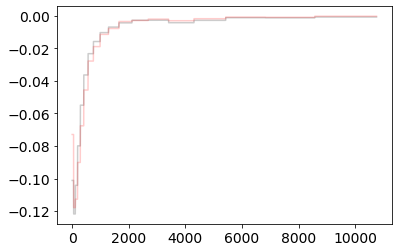

d2


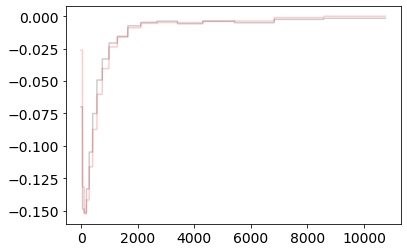

m1-ago


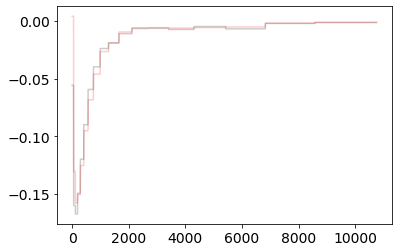

m1-ago+ant


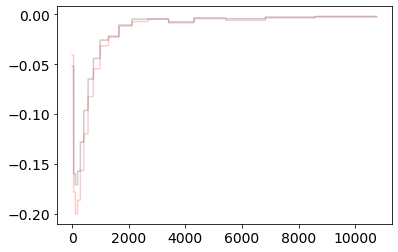

In [343]:

for cond in ['d1','d2','m1-ago','m1-ago+ant']:
    print(cond)
    df_acsf,df_drug = return_acsf_and_drug(df_biophys_exc,cond=[cond],joint=False)
    common_exps = set(df_acsf.exp_name) & set(df_drug.exp_name)
    df_acsf = df_acsf.drop_duplicates('exp_name')
    df_acsf = df_acsf[df_acsf.exp_name.isin(common_exps)]
    df_drug = df_drug.drop_duplicates('exp_name')
    df_drug = df_drug[df_drug.exp_name.isin(common_exps)]

    eta_exc_acsf = np.vstack(df_acsf['eta'].to_numpy())
    eta_exc_drug = np.vstack(df_drug['eta'].to_numpy())

    plt.plot((np.mean(eta_exc_drug,axis=0)).T,c='black',alpha=0.2)
    plt.plot((np.mean(eta_exc_acsf,axis=0)).T,c='red',alpha=0.2)

    plt.show()


d1


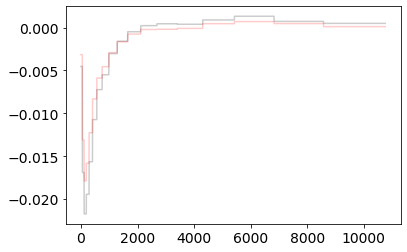

d2


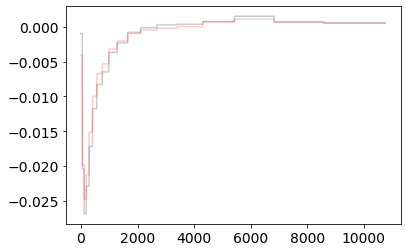

m1-ago


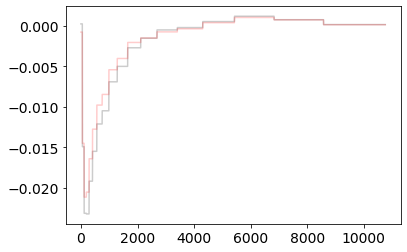

m1-ago+ant


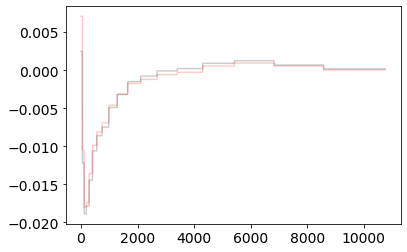

In [345]:

for cond in ['d1','d2','m1-ago','m1-ago+ant']:
    print(cond)
    df_acsf,df_drug = return_acsf_and_drug(df_biophys_inh,cond=[cond],joint=False)
    common_exps = set(df_acsf.exp_name) & set(df_drug.exp_name)
    df_acsf = df_acsf.drop_duplicates('exp_name')
    df_acsf = df_acsf[df_acsf.exp_name.isin(common_exps)]
    df_drug = df_drug.drop_duplicates('exp_name')
    df_drug = df_drug[df_drug.exp_name.isin(common_exps)]

    eta_inh_acsf = np.vstack(df_acsf['eta'].to_numpy())
    eta_inh_drug = np.vstack(df_drug['eta'].to_numpy())

    plt.plot((np.mean(eta_inh_acsf,axis=0)).T,c='black',alpha=0.2)
    plt.plot((np.mean(eta_inh_drug,axis=0)).T,c='red',alpha=0.2)

    plt.show()


## gamma

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


7


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


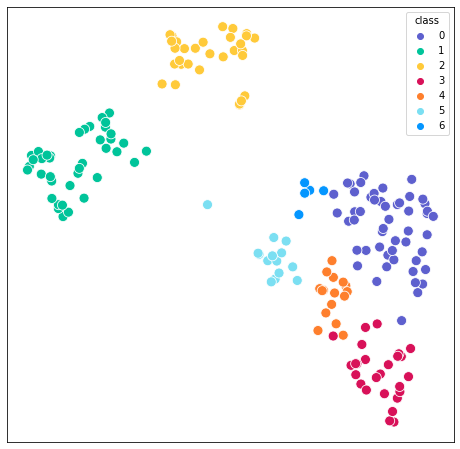

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


5


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


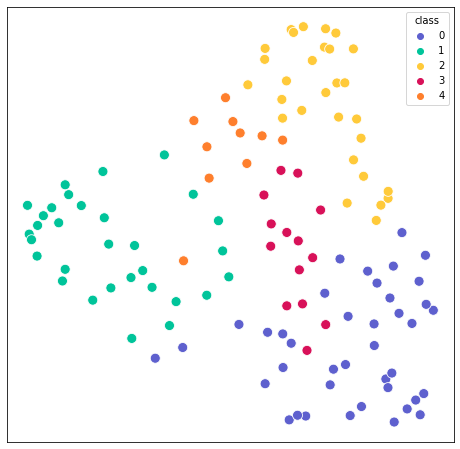

In [56]:
cols_bio = [ 'gl (nS)','C (nF)',  'El (mV)', 'Vr (mV)', 'Vt* (mV)', 'DV (mV)',]
bio_phys_exc = normalize(np.vstack(df_biophys_exc['gamma_threshold'].to_numpy()),axis=0)
lables_bio_exc,mapper,reducer = plot_UMAP_clusters_single(bio_phys_exc,
                          20,
                          0.1,
                          random_state =30,
                          res_louvain = 1.,
                          c_list =CUSTOM_PAL_SORT_3,
                          size=100,
                          norm=False,
                          save =False,
                          savepath = savepath+'exc_bio_cluster.pdf'
                        #   title='UMAP+Louvain for biophysics'
                          )

bio_phys_inh = normalize(np.vstack(df_biophys_inh['gamma_threshold'].to_numpy()),axis=0)
lables_bio_inh,mapper,reducer = plot_UMAP_clusters_single(bio_phys_inh,
                          20,
                          0.1,
                          random_state =30,
                          res_louvain = 1.,
                          c_list =CUSTOM_PAL_SORT_3,
                          size=100,
                          norm=False,
                          save =False,
                          savepath = savepath+'inh_bio_cluster.pdf'
                          )
df_biophys_exc['lables_gamma'] = lables_bio_exc
df_biophys_inh['lables_gamma'] = lables_bio_inh

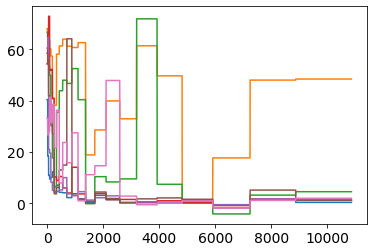

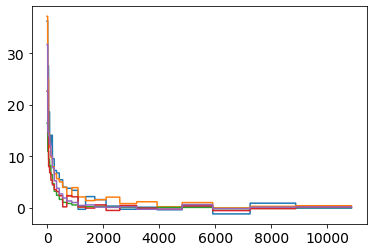

In [57]:
for i in set(df_biophys_exc['lables_gamma']):
    plt.plot(np.mean(df_biophys_exc[df_biophys_exc['lables_gamma']==i]['gamma_threshold'],axis=0).T)
plt.show()

for i in set(df_biophys_inh['lables_gamma']):
    plt.plot(np.mean(df_biophys_inh[df_biophys_inh['lables_gamma']==i]['gamma_threshold'],axis=0).T)
plt.show()

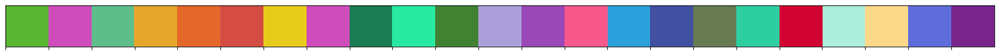

In [61]:
coherence_colors_temp = [
 [0.351, 0.712, 0.198],
 [0.812, 0.3, 0.734],
 [0.369, 0.749, 0.549],
 [0.898, 0.654, 0.169],
 [0.898, 0.41, 0.165],
 [0.834, 0.3, 0.265],
 [0.912, 0.8, 0.112],
 [0.812, 0.3, 0.734],
 [0.109, 0.483, 0.324],
 [0.159, 0.914, 0.635],
 [0.251, 0.512, 0.198],
 [0.676, 0.631, 0.859],
 [0.609, 0.283, 0.724],
 [0.969, 0.349, 0.549],
 [0.176, 0.631, 0.859],
 [0.259, 0.314, 0.635],
 [0.409, 0.483, 0.324],
 [0.179, 0.814, 0.635],
 [0.821, 0.012, 0.198],
 [0.676, 0.931, 0.859],
 [0.989, 0.849, 0.549],
 [0.376, 0.431, 0.859],
 [0.469, 0.149, 0.549]]
 
sns.palplot(coherence_colors_temp)

##  significance test passive

In [99]:
from sklearn.metrics.pairwise import cosine_similarity


In [355]:
data_exc = normalize(np.vstack(df_biophys_exc[cols_bio].to_numpy()))
data_inh = normalize(np.vstack(df_biophys_exc[cols_bio].to_numpy()))

sim_inh = cosine_similarity(data_inh,data_inh)[np.triu_indices_from(cosine_similarity(data_inh,data_inh),k=1)]
sim_exc = cosine_similarity(data_exc,data_exc)[np.triu_indices_from(cosine_similarity(data_exc,data_exc),k=1)]
sim_inh_exc = cosine_similarity(data_exc,data_inh).reshape(1,-1)[0]

In [354]:
np.mean(sim_inh_exc)

0.9841836695363948

In [34]:
df_temp  = pd.concat([df_biophys_exc,df_biophys_inh])
df_temp.labels_wave = np.concatenate([np.ones(len(df_biophys_exc)),np.zeros(len(df_biophys_inh))]) 

<Axes: >

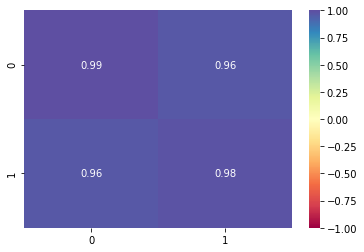

In [37]:
from sklearn.metrics.pairwise import cosine_similarity


cosine_mat = np.zeros((2,2))

for i in range(2):
    for j in range(2):

        if i==j:
            
            idx = np.tril_indices_from(cosine_similarity(normalize(np.vstack(df_temp[df_temp.labels_wave==i][cols_bio].to_numpy())),
                    normalize(np.vstack(df_temp[df_temp.labels_wave==j][cols_bio].to_numpy()))))
            
            data = cosine_similarity(normalize(np.vstack(df_temp[df_temp.labels_wave==i][cols_bio].to_numpy())),
                    normalize(np.vstack(df_temp[df_temp.labels_wave==j][cols_bio].to_numpy())))[idx]
            
            cosine_mat[i,j] = np.mean(data)

        else:

            cosine_mat[i,j] = np.mean(cosine_similarity(normalize(np.vstack(df_temp[df_temp.labels_wave==i][cols_bio].to_numpy())),
                    normalize(np.vstack(df_temp[df_temp.labels_wave==j][cols_bio].to_numpy()))))

sns.heatmap(cosine_mat, vmax=1, vmin=-1, annot=True, cmap = 'Spectral')
# plt.savefig(savepath+'EI_similarity.pdf',dpi=200)

In [356]:
import statsmodels.api as sm
print(sm.stats.anova_oneway([sim_inh_exc,sim_exc,sim_inh]))

statistic = 0.16777199584749036
pvalue = 0.8455472714259953
df = (2.0, 35491.55827213661)
df_num = 2.0
df_denom = 35491.55827213661
nobs_t = 66795.0
n_groups = 3
means = [0.98418367 0.98409677 0.98409677]
nobs = [33489. 16653. 16653.]
vars_ = [0.00037548 0.00037618 0.00037618]
use_var = unequal
welch_correction = True
tuple = (0.16777199584749036, 0.8455472714259953)


In [357]:
games_howell(sim_exc,sim_inh,sim_inh_exc)      

,mean_differences,degrees_freedom,t_values,p_values,std_err,up_conf,low_conf,group_comps
0,0.000000,33304.00000,0.000000,0.9,0.00015,3.314648,-3.314648,0 : 1
1,0.000087,33216.30889,0.472693,[0.8731162460178223],0.00013,3.314736,-3.314562,0 : 2
2,0.000087,33216.30889,0.472693,[0.8731162460178223],0.00013,3.314736,-3.314562,1 : 2


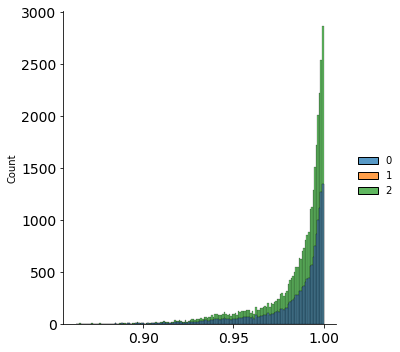

In [358]:
sns.displot([sim_inh,sim_exc,sim_inh_exc])

## significance test ETA

<Axes: >

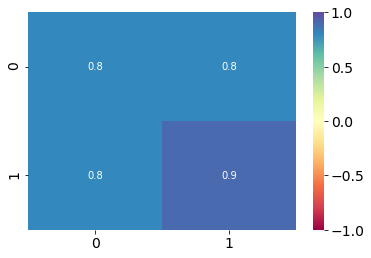

In [372]:
from sklearn.metrics.pairwise import cosine_similarity


cosine_mat = np.zeros((2,2))
for i in range(2):
    for j in range(2):
        cosine_mat[i,j] = np.mean(cosine_similarity(normalize(np.vstack(df_temp[df_temp.labels_wave==i]['eta'].to_numpy())),
                  normalize(np.vstack(df_temp[df_temp.labels_wave==j]['eta'].to_numpy()))))

sns.heatmap(cosine_mat,vmax=1,vmin=-1,annot=True,cmap = 'Spectral')
# plt.savefig(savepath+'EI_similarity.pdf',dpi=200)

In [373]:
exc_eta  = normalize(np.vstack(df_biophys_exc['eta'].to_numpy()))
inh_eta  = normalize(np.vstack(df_biophys_inh['eta'].to_numpy()))


sim_inh = cosine_similarity(inh_eta,inh_eta)[np.triu_indices_from(cosine_similarity(inh_eta,inh_eta),k=1)]
sim_exc = cosine_similarity(exc_eta,exc_eta)[np.triu_indices_from(cosine_similarity(exc_eta,exc_eta),k=1)]
sim_inh_exc = cosine_similarity(exc_eta,inh_eta).reshape(1,-1)[0]

print(sm.stats.anova_oneway([sim_inh_exc,sim_exc,sim_inh]))

statistic = 2796.7762249757006
pvalue = 0.0
df = (2.0, 19349.411351075527)
df_num = 2.0
df_denom = 19349.411351075527
nobs_t = 46971.0
n_groups = 3
means = [0.7962029  0.90277313 0.79445963]
nobs = [22692. 16653.  7626.]
vars_ = [0.03644907 0.01378087 0.0385615 ]
use_var = unequal
welch_correction = True
tuple = (2796.7762249757006, 0.0)


In [374]:
games_howell(sim_inh,sim_exc,sim_inh_exc)

,mean_differences,degrees_freedom,t_values,p_values,std_err,up_conf,low_conf,group_comps
0,0.108314,10200.041337,44.654827,0.001,0.001715,3.423303,-3.206676,0 : 1
1,0.001743,12804.944032,0.675399,[0.7571669273532889],0.001825,3.316632,-3.313146,0 : 2
2,-0.106570,38257.169467,68.313372,0.001,0.001103,3.208059,-3.421199,1 : 2


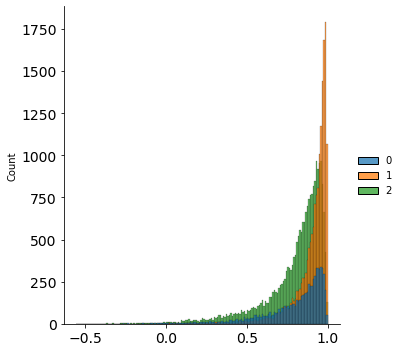

In [375]:
sns.displot([sim_inh,sim_exc,sim_inh_exc])

## MANOVA

In [25]:
df_temp.columns

Index(['tau_m (ms)', 'R (MOhm)', 'C (nF)', 'gl (nS)', 'El (mV)', 'Tref (ms)',
       'Vr (mV)', 'Vt* (mV)', 'DV (mV)', 'r_squared_V', 'r_squared_dV',
       'gamma', 'K', 'eta', 'gamma_threshold', 'cond', 'trial', 'exp_name',
       'labels_wave', 'lables_bio', 'type'],
      dtype='object')

In [26]:

df_temp.columns =  ['tau_m', 'R', 'C', 'gl', 'El', 'Tref',
       'Vr', 'Vt', 'DV', 'r_squared_V', 'r_squared_dV',
       'gamma', 'K', 'eta', 'gamma_threshold', 'cond', 'trial', 'exp_name',
       'labels_wave', 'lables_bio','type']

In [27]:
data_manova = df_temp
data_manova['type'] = data_manova['labels_wave'].map({0:'inh',1:'exc'})

from statsmodels.multivariate.manova import MANOVA
scaler = StandardScaler()
cols = ['C', 'gl', 'El', 'Vr', 'Vt', 'DV']

data_manova[cols] = scaler.fit_transform(normalize(data_manova[cols]))

# Apply MANOVA with the renamed columns
# manova = MANOVA.from_formula('C + gl + El + Vr + Vt + DV ~ type', data = data_manova)
# Y = XB^T+E

manova = MANOVA(endog=data_manova[cols].to_numpy(),
                exog=data_manova['labels_wave'].to_numpy())
result = manova.mv_test()
print(result)

                  Multivariate linear model
                                                             
-------------------------------------------------------------
           x0           Value  Num DF  Den DF  F Value Pr > F
-------------------------------------------------------------
          Wilks' lambda 0.6722 6.0000 301.0000 24.4641 0.0000
         Pillai's trace 0.3278 6.0000 301.0000 24.4641 0.0000
 Hotelling-Lawley trace 0.4877 6.0000 301.0000 24.4641 0.0000
    Roy's greatest root 0.4877 6.0000 301.0000 24.4641 0.0000



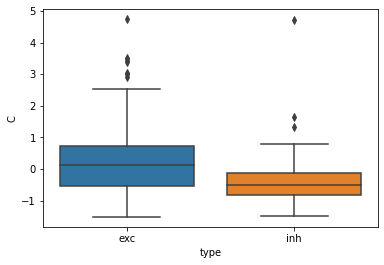

Ttest_indResult(statistic=6.416367638381892, pvalue=5.327716350253809e-10)


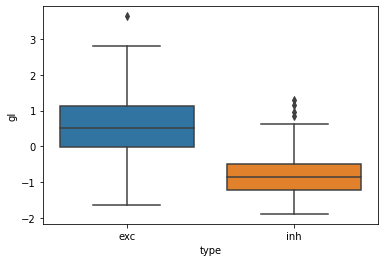

Ttest_indResult(statistic=15.44471421667694, pvalue=4.561341609290155e-40)


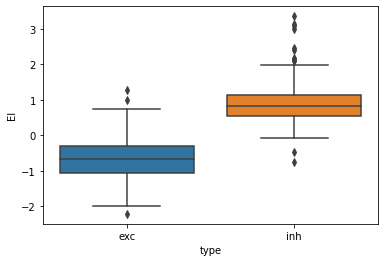

Ttest_indResult(statistic=-21.031579469029413, pvalue=4.632908847813203e-56)


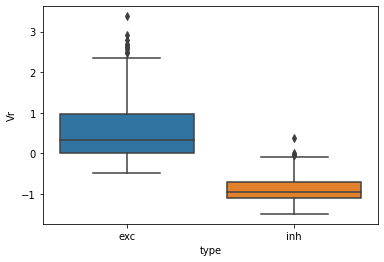

Ttest_indResult(statistic=21.703523225247583, pvalue=5.6391218651105266e-61)


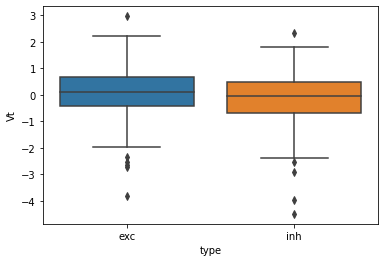

Ttest_indResult(statistic=2.2122771261216125, pvalue=0.027851350415999395)


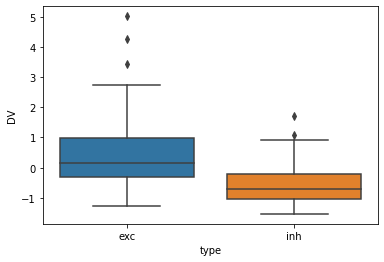

Ttest_indResult(statistic=10.6106375527857, pvalue=1.5709814558219063e-22)


In [31]:
from scipy.stats import ttest_ind
for i in ['C', 'gl', 'El', 'Vr', 'Vt', 'DV',]:
    sns.boxplot(data = data_manova,x='type',y=i)
    plt.show()
    rvs1 = data_manova[data_manova.type=='exc'][i]
    rvs2 = data_manova[data_manova.type=='inh'][i]

    print(ttest_ind(rvs1, rvs2, equal_var=False))


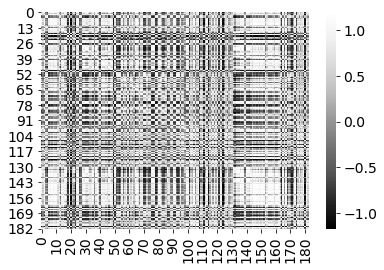

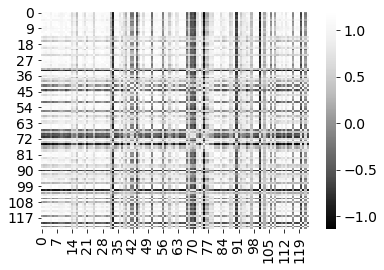

In [804]:
sns.heatmap(np.cov(data_manova[data_manova.type=='exc'][cols]),cmap='Greys_r')
plt.show()
sns.heatmap(np.cov(data_manova[data_manova.type=='inh'][cols]),cmap='Greys_r')
plt.show()

## CCA

CCA score:  -0.5579680953625284
CCA score:  -0.5902430501857064
CCA score:  -0.569885819666807
CCA score:  -0.5335243632109813
CCA score:  -0.9671745713677966
CCA score:  -0.5184040425570583
CCA score:  -0.585964786802776
CCA score:  -0.7834961319656202
CCA score:  -0.6929116200725343
CCA score:  -0.7515327379933714
-0.13362466903492243 0.13362466903492237


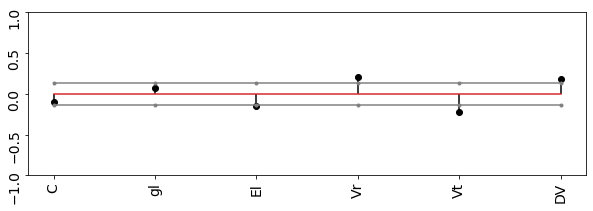

-0.23587713640393657 0.23587713640393657


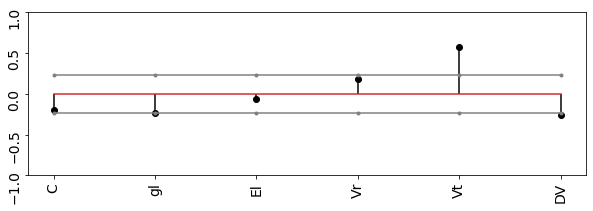

In [814]:

import numpy as np
from sklearn.cross_decomposition import CCA
from scipy.stats import zscore
from sklearn.model_selection import train_test_split
scale = StandardScaler()
cols = ['C', 'gl', 'El', 'Vr', 'Vt', 'DV']

X_inh = data_manova[data_manova.type=='inh'][cols].to_numpy()
X_exc = data_manova[data_manova.type=='exc'][cols].to_numpy()

def perform_CCA(X,y,n_components=10):
    ca = CCA(n_components=n_components)
    ca.fit(X, y)
    X_c, Y_c = ca.transform(X,y)
    x_weights = ca.x_weights_
    score = ca.score(X , y)
    print('CCA score: ',score)
    return X_c,Y_c,ca

def return_ci(data,alpha):
    loadings  = data
    mean = np.mean(loadings)
    n = len(loadings)
    std = np.std(loadings)
    ci = (1.96)*(std/np.sqrt(n)) 
    print(mean - ci, mean + ci)
    return mean - ci, mean + ci

all_loadings_exc = []
all_loadings_inh = []

for i in range(10):

    _,_,ca_all_E_S = perform_CCA(X_inh,X_exc[np.random.randint(0,len(X_exc),len(X_inh))],n_components=len(cols))

    all_loadings_exc.append(ca_all_E_S.x_loadings_[:,1])
    all_loadings_inh.append(ca_all_E_S.x_loadings_[:,0])

plt.figure(figsize=[10,3])

loadings_exc = np.mean(np.vstack(all_loadings_exc),axis=0)
loadings_exc = loadings_exc -np.mean(loadings_exc)

loadings_inh = np.mean(np.vstack(all_loadings_inh),axis=0)
loadings_inh = loadings_inh -np.mean(loadings_inh)


ci_neg, ci_pos = return_ci(loadings_exc, alpha=0.05)
plt.stem(cols, loadings_exc,'black')
plt.tick_params(rotation=90)
plt.plot(np.repeat(ci_neg,len(cols)), c='grey', marker = '.')
plt.plot(np.repeat(ci_pos,len(cols)), c='grey', marker = '.')
plt.ylim(-1,1)
plt.savefig(savepath+'stem_bio_exc.pdf',dpi=200)
plt.show()

plt.figure(figsize=[10,3])
ci_neg, ci_pos = return_ci(loadings_inh, alpha=0.05)
plt.stem(cols, loadings_inh,'black')
plt.tick_params(rotation=90)
plt.plot(np.repeat(ci_neg,len(cols)),c='grey', marker = '.' )
plt.plot(np.repeat(ci_pos,len(cols)),c='grey', marker = '.' )
plt.ylim(-1,1)
plt.savefig(savepath+'stem_bio_inh.pdf',dpi=200)
plt.show()


# Spike Triggered Average

In [75]:
df_sta = pd.read_pickle('D:/CurrentClamp/all_stas_hidden_spikes_computed.pkl')
# df_sta = pd.read_pickle('D:/CurrentClamp/all_stas_normed_input.pkl')
# df_sta = pd.read_pickle('D:/CurrentClamp/all_stas_shifted.pkl')


# df_sta.trial = df_sta.trial.apply(int)
df_sta = df_sta[~df_sta.exp_name.isin(discarded_exps)]
# df_sta_acsf = df_sta[df_sta.cond.isin(['acsf','acsf_bic'])]

# df_sta_acsf = df_sta_acsf[df_sta_acsf.exp_name.isin(set(data_wave_FN_acsf.exp_name))]
# df_sta_acsf = df_sta_acsf[df_sta_acsf.trial==0]
df_sta_exc = df_sta[df_sta.ei_label==1]
df_sta_inh = df_sta[df_sta.ei_label==0]


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


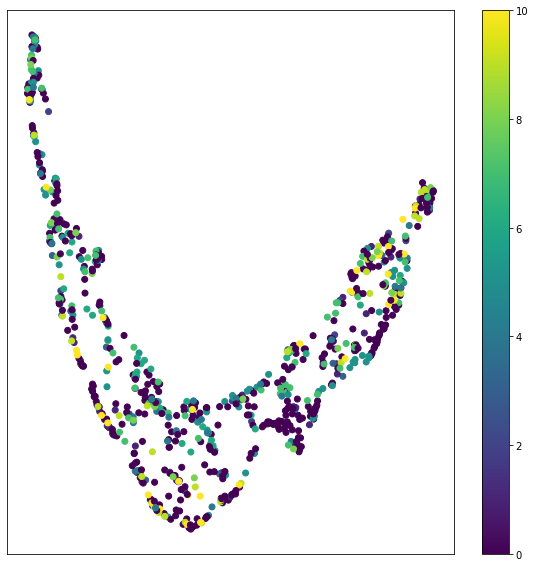

In [92]:
neuromod_list_sta =  neumericalize_neurmods(df_sta)
plot_UMAP_values(np.vstack(df_sta['sta'].to_numpy()),list(neuromod_list_sta),random_state=42,save=False,figsize=[10,10])


### Heterogeniety heatmap

d1


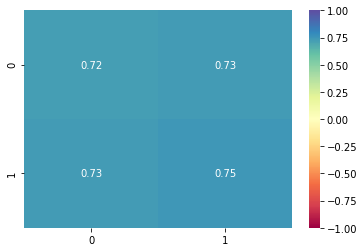

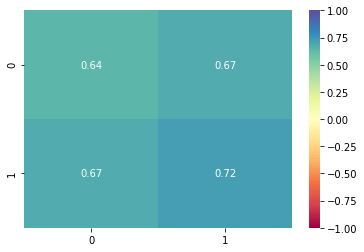

d2


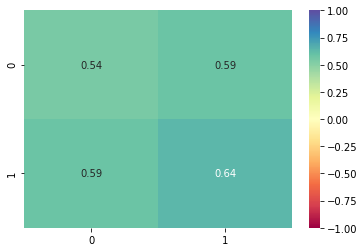

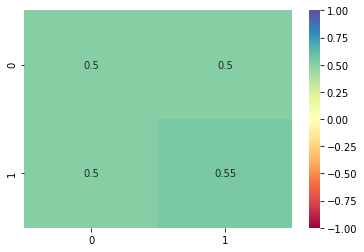

m1-ago


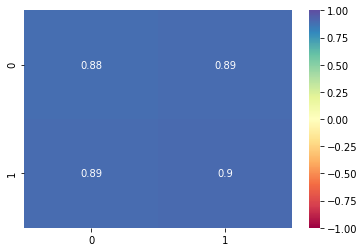

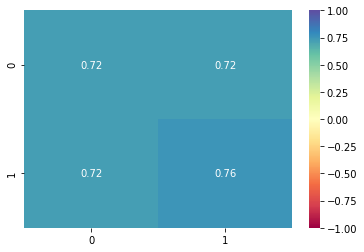

m1-ago+ant


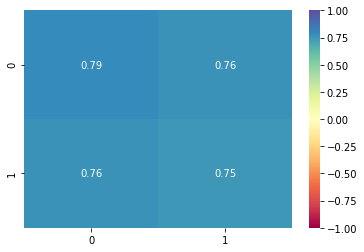

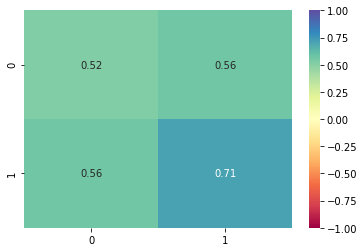

In [31]:
for cond in ['d1','d2','m1-ago','m1-ago+ant']:
    print(cond)
    df_temp  = return_acsf_and_drug(df_sta,cond=[cond],joint=True)
    df_temp_exc = df_temp[df_temp.ei_label==1]
    df_temp_inh = df_temp[df_temp.ei_label==0]

    heterogeniety_for_drug(df_temp_exc,cond=cond,cols='sta')
    plt.show()
    heterogeniety_for_drug(df_temp_inh,cond=cond,cols='sta')
    plt.show()

In [181]:
# data_umap_scaler = StandardScaler()

# find_optimum_res(data_umap_scaler.fit_transform(normalize(np.vstack(df_sta_acsf_exc['sta'].to_numpy()))),save=True,savepath=savepath+'clsuter_stability_sta_exc.pdf')
# find_optimum_res(data_umap_scaler.fit_transform(normalize(np.vstack(df_sta_acsf_inh['sta'].to_numpy()))),save=True,savepath=savepath+'clsuter_stability_sta_inh.pdf')

### STA Clusters Excitatory 

d1


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


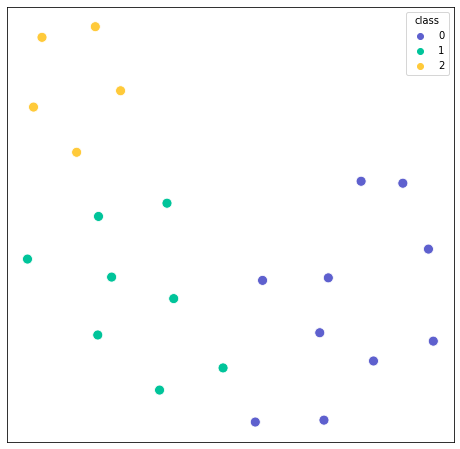

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


4


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


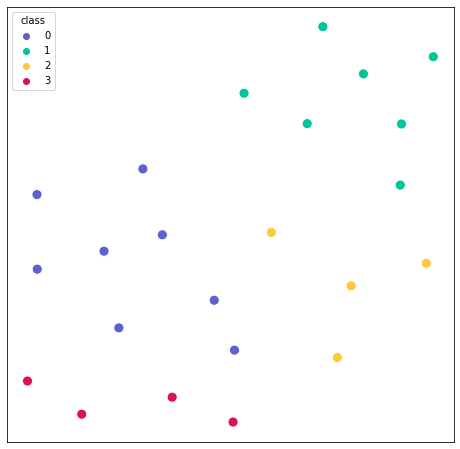

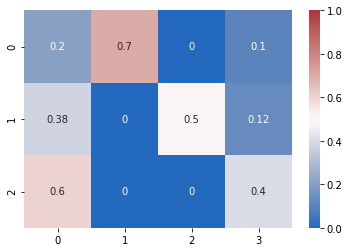

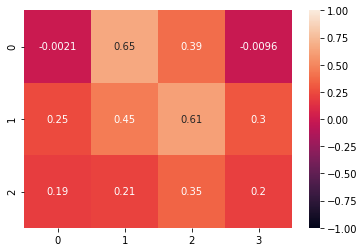

d2


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


4


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


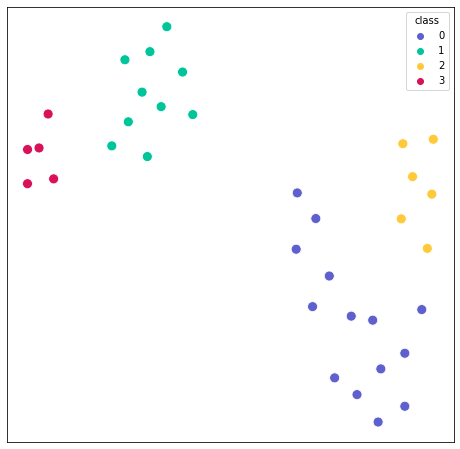

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


4


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


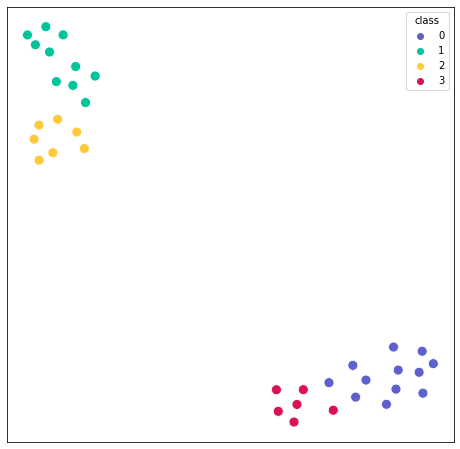

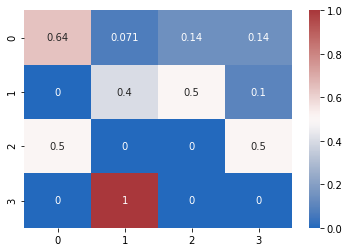

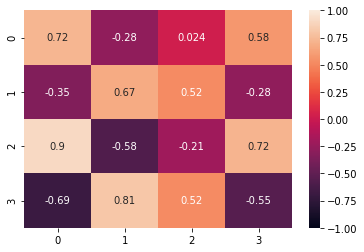

m1-ago


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


2


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


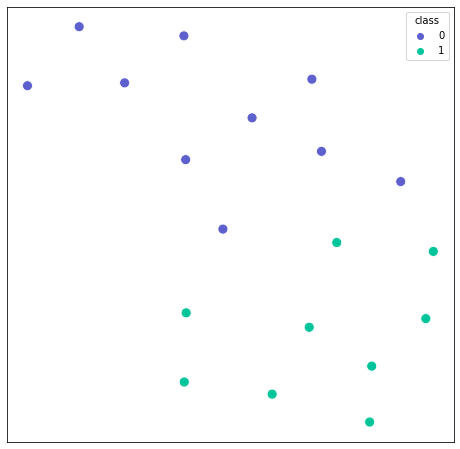

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


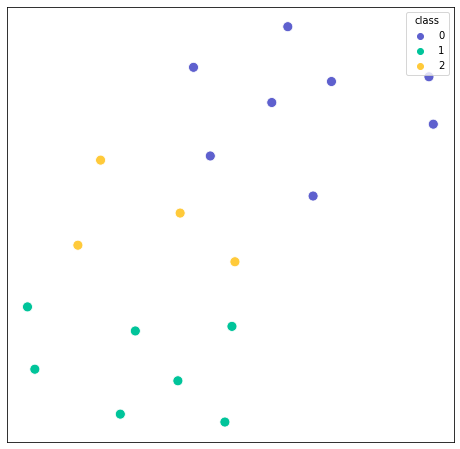

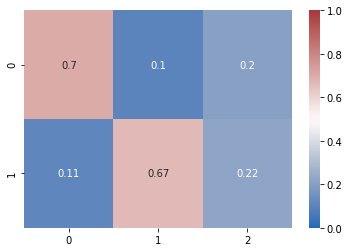

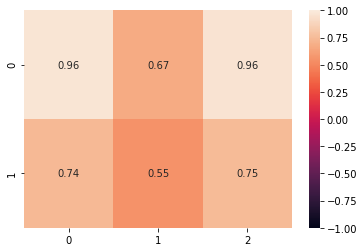

In [ ]:
adj_rand_score_exc = {}
adj_MI_exc = {}

from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score

save_dtype = 'sta'
ei_type = 'exc'

for cond in ['d1','d2','m1-ago']:
    print(cond)
    df_acsf,df_drug = return_acsf_and_drug(df_sta_exc,cond=[cond],joint=False)
    common_exps = set(df_acsf.exp_name) & set(df_drug.exp_name)
    df_acsf = df_acsf.drop_duplicates('exp_name')
    df_acsf = df_acsf[df_acsf.exp_name.isin(common_exps)]
    df_drug = df_drug.drop_duplicates('exp_name')
    df_drug = df_drug[df_drug.exp_name.isin(common_exps)]

    sta_acsf = normalize(np.vstack(df_acsf['sta'].to_numpy()),axis=0)
    lables_sta_acsf,mapper,reducer = plot_UMAP_clusters_single(sta_acsf,
                              20,
                              0.1,
                              random_state =30,
                              res_louvain = 1.,
                              c_list =CUSTOM_PAL_SORT_3,
                              size=100,
                              norm = False,
                              save = True,
                              savepath =  savepath + cond+'/' +save_dtype+'/'+save_dtype+'_cluster_'+ei_type+'_acsf.pdf'
                              )

    sta_drug = normalize(np.vstack(df_drug['sta'].to_numpy()),axis=0)
    lables_sta_drug,mapper,reducer = plot_UMAP_clusters_single(sta_drug,
                              20,
                              0.1,
                              random_state =30,
                              res_louvain = 1.,
                              c_list =CUSTOM_PAL_SORT_3,
                              size=100,
                              norm=False,
                              save =True,
                              savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_cluster_'+ei_type+'_drug.pdf'
                              )
    df_acsf['labels_sta'] = lables_sta_acsf
    df_drug['labels_sta'] = lables_sta_drug 
    adj_rand_score_exc[cond] = adjusted_rand_score(lables_sta_acsf,lables_sta_drug)
    adj_MI_exc[cond] =  adjusted_mutual_info_score(lables_sta_acsf,lables_sta_drug)
    return_confusion_matrix_(df_acsf,df_drug,'labels_sta','labels_sta',
                             shuffle=False,
                             cmap='vlag',
                             vmin=0,
                             vmax=1,
                             figsize=[6,5],
                             save=True,
                             savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_confusion_'+ei_type+'.pdf')
    plt.show()
    plot_cosine_mat(sta_acsf,sta_drug,lables_sta_acsf,lables_sta_drug , 
                    save = True,
                    savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_cosine_'+ei_type+'.pdf'
                    )
    plt.show()

In [270]:
print(adj_rand_score_exc) 
print(adj_MI_exc) 

{'d1': 0.28829924732000306, 'd2': 0.23606284017349433, 'm1-ago': 0.2848180677540778, 'm1-ago+ant': 0.3818019625334523}
{'d1': 0.3275766938660412, 'd2': 0.2716968404688072, 'm1-ago': 0.2144572638458464, 'm1-ago+ant': 0.3408880459491501}


### STA Clusters Inhibitory

d1


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


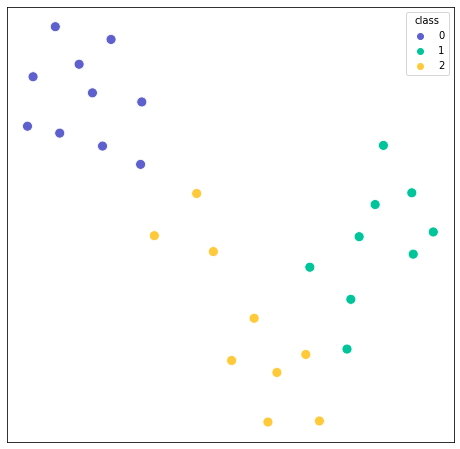

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


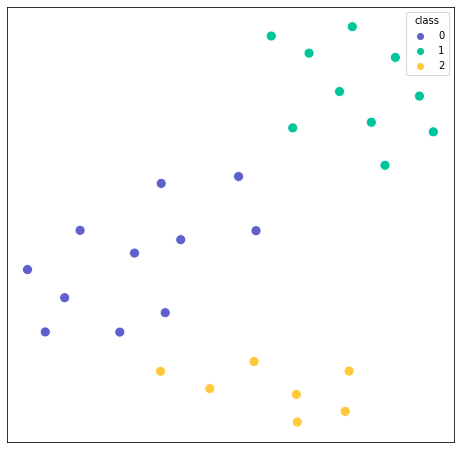

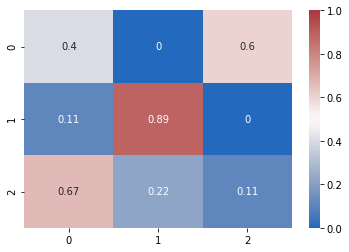

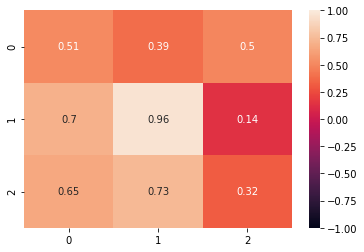

d2


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


2


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


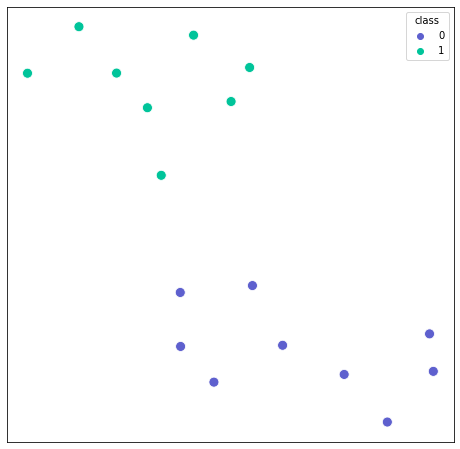

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


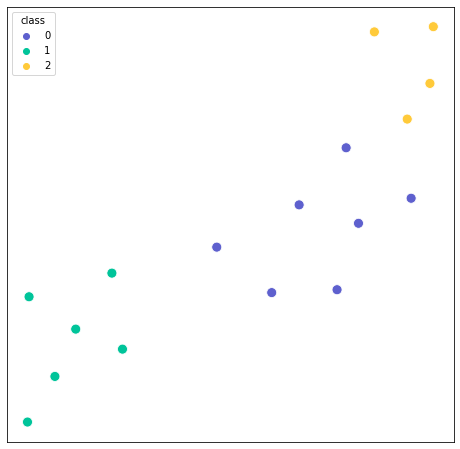

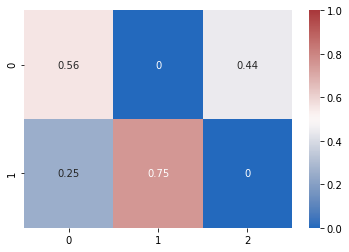

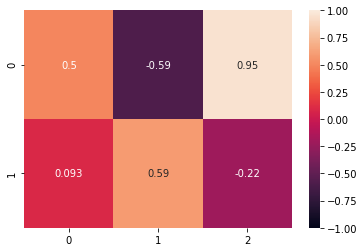

m1-ago


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


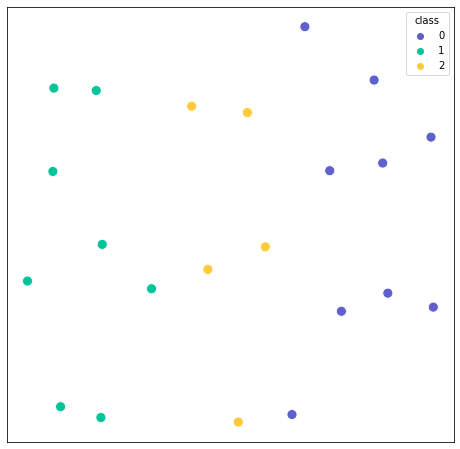

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


3


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


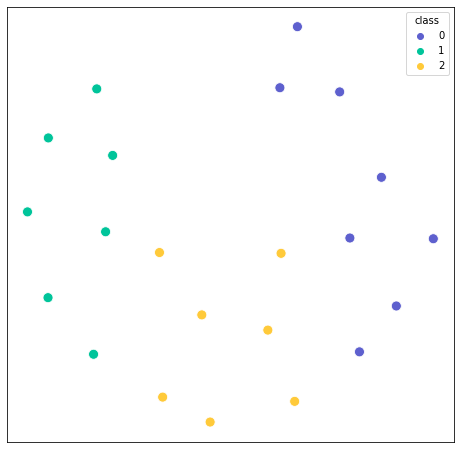

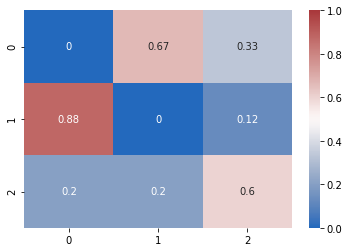

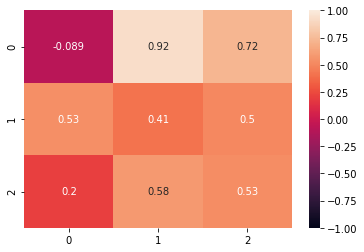

In [78]:
adj_rand_score_inh = {}
adj_MI_inh = {}

from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score

save_dtype = 'sta'
ei_type = 'inh'


for cond in ['d1','d2','m1-ago']:
    print(cond)
    df_acsf,df_drug = return_acsf_and_drug(df_sta_inh,cond=[cond],joint=False)
    common_exps = set(df_acsf.exp_name) & set(df_drug.exp_name)
    df_acsf = df_acsf.drop_duplicates('exp_name')
    df_acsf = df_acsf[df_acsf.exp_name.isin(common_exps)]
    df_drug = df_drug.drop_duplicates('exp_name')
    df_drug = df_drug[df_drug.exp_name.isin(common_exps)]

    sta_acsf = normalize(np.vstack(df_acsf['sta'].to_numpy()),axis=0)
    lables_sta_acsf,mapper,reducer = plot_UMAP_clusters_single(sta_acsf,
                              20,
                              0.1,
                              random_state = 30,
                              res_louvain = 1.,
                              c_list = CUSTOM_PAL_SORT_3,
                              size = 100,
                              norm = False,
                              save = True,
                              savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_cluster_'+ei_type+'_acsf.pdf'
                              )

    sta_drug = normalize(np.vstack(df_drug['sta'].to_numpy()),axis=0)
    lables_sta_drug,mapper,reducer = plot_UMAP_clusters_single(sta_drug,
                              20,
                              0.1,
                              random_state =30,
                              res_louvain = 1.,
                              c_list =CUSTOM_PAL_SORT_3,
                              size=100,
                              norm=False,
                              save =True,
                              savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_cluster_'+ei_type+'_drug.pdf'
                              )
    df_acsf['labels_sta'] = lables_sta_acsf
    df_drug['labels_sta'] = lables_sta_drug 
    adj_rand_score_inh[cond] = adjusted_rand_score(lables_sta_acsf,lables_sta_drug)
    adj_MI_inh[cond] =  adjusted_mutual_info_score(lables_sta_acsf,lables_sta_drug)
    return_confusion_matrix_(df_acsf,df_drug,'labels_sta','labels_sta',
                             shuffle=False,
                             cmap='vlag',
                             vmin=0,
                             vmax=1,
                             figsize=[6,5],
                             save=True,
                             savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_confusion_'+ei_type+'.pdf')
    plt.show()

    plot_cosine_mat(sta_acsf,sta_drug,lables_sta_acsf,lables_sta_drug,
                    save = True,
                    savepath = savepath + cond+'/' +save_dtype+'/'+save_dtype+'_cosine_'+ei_type+'.pdf')
    plt.show()

In [271]:
print(adj_rand_score_inh) 
print(adj_MI_inh) 

{'d1': 0.3378102189781022, 'd2': 0.40401505646173147, 'm1-ago': 0.39486552567237165, 'm1-ago+ant': 0.27376058041112455}
{'d1': 0.37159756047736553, 'd2': 0.48319060059274876, 'm1-ago': 0.3836771280596196, 'm1-ago+ant': 0.15368492888574561}


### Plot STA Inhibitory

d1


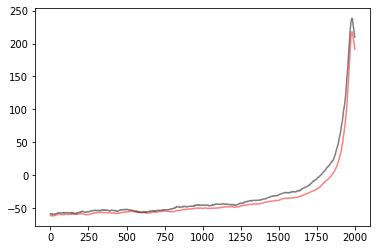

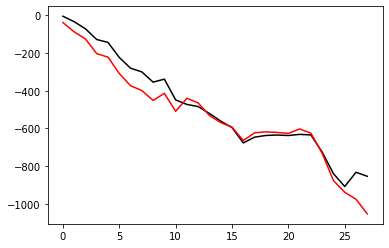

d2


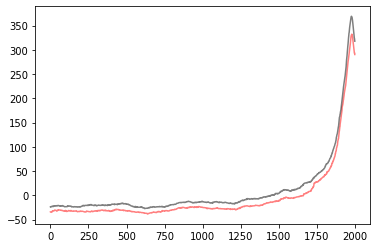

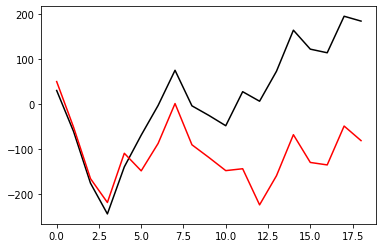

m1-ago


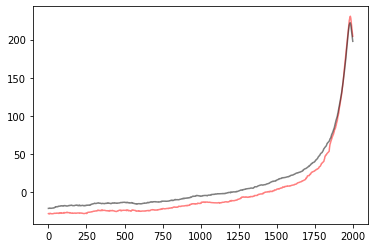

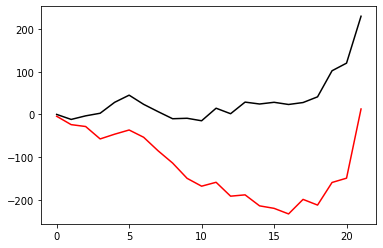

m1-ago+ant


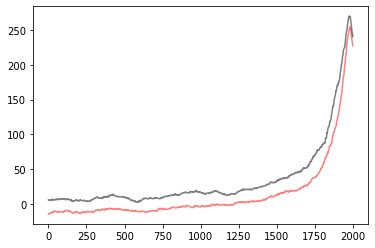

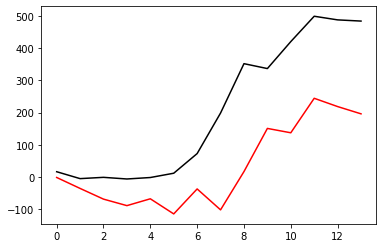

In [71]:

for cond in ['d1','d2','m1-ago','m1-ago+ant']:
    print(cond)
    df_acsf,df_drug = return_acsf_and_drug(df_sta_inh,cond=[cond],joint=False)
    common_exps = set(df_acsf.exp_name) & set(df_drug.exp_name)
    df_acsf = df_acsf.drop_duplicates('exp_name')
    df_acsf = df_acsf[df_acsf.exp_name.isin(common_exps)]
    df_drug = df_drug.drop_duplicates('exp_name')
    df_drug = df_drug[df_drug.exp_name.isin(common_exps)]

    eta_inh_acsf = (np.vstack(df_acsf['sta'].to_numpy()))
    eta_inh_drug = (np.vstack(df_drug['sta'].to_numpy()))

    plt.plot((np.mean(eta_inh_drug,axis=0) ).T,c='red',alpha=0.5)
    plt.plot((np.mean(eta_inh_acsf,axis=0) ).T,c='black',alpha=0.5)
    plt.show()
    plt.plot(np.cumsum(np.mean(eta_inh_acsf,axis=1)[-20*20:], axis=0, dtype=None, out=None),c='black')
    plt.plot(np.cumsum(np.mean(eta_inh_drug,axis=1)[-20*20:], axis=0, dtype=None, out=None),c='red')

    plt.show()


### Plot STA Excitatory 

d1


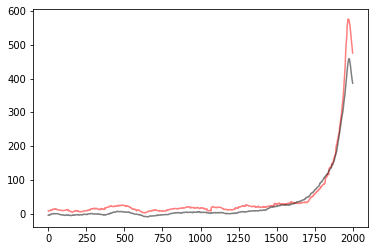

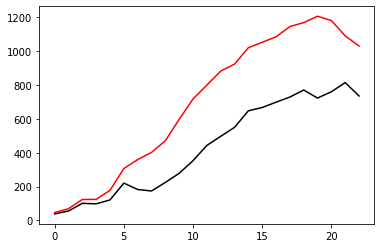

d2


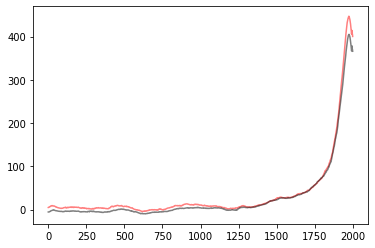

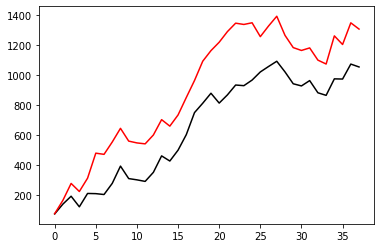

m1-ago


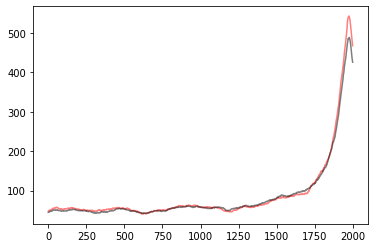

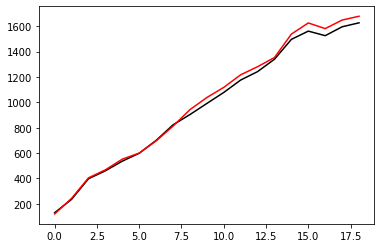

m1-ago+ant


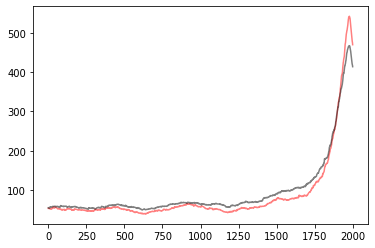

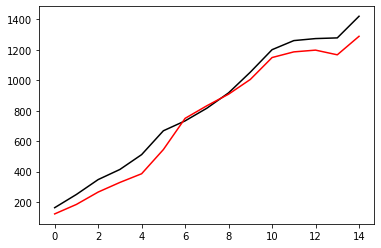

In [73]:

for cond in ['d1','d2','m1-ago','m1-ago+ant']:
    print(cond)
    df_acsf,df_drug = return_acsf_and_drug(df_sta_exc,cond=[cond],joint=False)
    common_exps = set(df_acsf.exp_name) & set(df_drug.exp_name)
    df_acsf = df_acsf.drop_duplicates('exp_name')
    df_acsf = df_acsf[df_acsf.exp_name.isin(common_exps)]
    df_drug = df_drug.drop_duplicates('exp_name')
    df_drug = df_drug[df_drug.exp_name.isin(common_exps)]

    eta_exc_acsf = (np.vstack(df_acsf['sta'].to_numpy()))
    eta_exc_drug = (np.vstack(df_drug['sta'].to_numpy()))

    plt.plot((np.mean(eta_exc_drug,axis=0) ).T,c='red',alpha=0.5)
    plt.plot((np.mean(eta_exc_acsf,axis=0) ).T,c='black',alpha=0.5)
    plt.show()

    plt.plot(np.cumsum(np.mean(eta_exc_acsf,axis=1)[-20*20:], axis=0, dtype=None, out=None),c='black')
    plt.plot(np.cumsum(np.mean(eta_exc_drug,axis=1)[-20*20:], axis=0, dtype=None, out=None),c='red')

    plt.show()

In [231]:
stas = normalize(np.vstack(df_sta_acsf_exc[df_sta_acsf_exc.labels_sta==1]['sta']))

exps = df_sta_acsf_exc[df_sta_acsf_exc.labels_sta==1]['exp_name']

In [275]:
from sklearn.metrics import auc
amps_exc = []
speed_exc = []
auc_exc = []
for sta in normalize(np.vstack(df_sta_acsf_exc['sta'].to_numpy())):
    # sta = np.mean(np.vstack(df_sta_acsf_exc[df_sta_acsf_exc.labels_sta==i]['sta']).T,axis=1)[50*20:]
    amps_exc.append(np.max(sta))
    speed_exc.append(np.max(np.diff(sta,2)))
    auc_exc.append(auc(np.arange(-100,0,1/20),np.abs(sta)))

amps_inh = []
speed_inh = []
auc_inh = []
for sta in normalize(np.vstack(df_sta_acsf_inh['sta'].to_numpy())):
    # sta = np.mean(np.vstack(df_sta_acsf_inh[df_sta_acsf_inh.labels_sta==i]['sta']).T,axis=1)[50*20:]
    amps_inh.append(np.max(sta))
    speed_inh.append(np.max(np.diff(sta,2)))
    auc_inh.append(auc(np.arange(-100,0,1/20),np.abs(sta)))



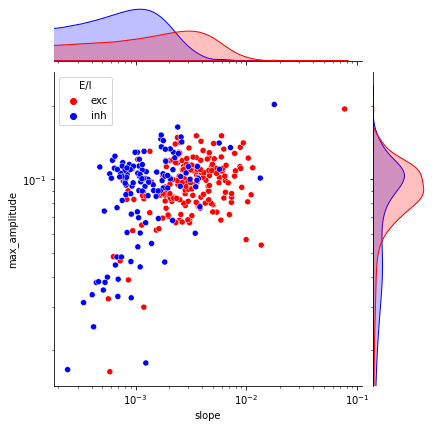

In [276]:
df_slope_amp = pd.DataFrame({'slope':np.concatenate([speed_exc,speed_inh]),
                   'max_amplitude':np.concatenate([amps_exc,amps_inh]),
                   'E/I':np.concatenate([np.repeat('exc',len(speed_exc)) , np.repeat('inh',len(speed_inh))])})

plt.rcParams.fontsize=14
# fig,ax = plt.subplots()
g = sns.jointplot(data=df_slope_amp, x="slope", y="max_amplitude", hue="E/I",palette=['red','blue'])
# ax.loglog()
g.ax_joint.set_xscale('log')
g.ax_joint.set_yscale('log')
# plt.savefig(savepath+'amp_slope_joint_plot.pdf',dpi=200)

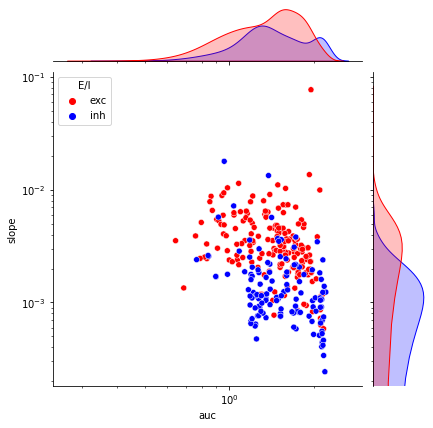

In [278]:
df_slope_amp = pd.DataFrame({'slope':np.concatenate([speed_exc,speed_inh]),
                   'max_amplitude':np.concatenate([amps_exc,amps_inh]),
                   'auc':np.concatenate([auc_exc,auc_inh]),
                   'E/I':np.concatenate([np.repeat('exc',len(speed_exc)) , np.repeat('inh',len(speed_inh))])})

plt.rcParams.fontsize=14
# fig,ax = plt.subplots()
g = sns.jointplot(data=df_slope_amp, x="auc", y="slope", hue="E/I",palette=['red','blue'])
# ax.loglog()
g.ax_joint.set_xscale('log')
g.ax_joint.set_yscale('log')

In [279]:
from scipy import stats

print(stats.ttest_ind(df_slope_amp[df_slope_amp['E/I']=='exc']['slope'],df_slope_amp[df_slope_amp['E/I']=='inh']['slope'],equal_var=False))
print(stats.ttest_ind(df_slope_amp[df_slope_amp['E/I']=='exc']['max_amplitude'],df_slope_amp[df_slope_amp['E/I']=='inh']['max_amplitude'],equal_var=False))

print(stats.ttest_ind(df_slope_amp[df_slope_amp['E/I']=='exc']['auc'],df_slope_amp[df_slope_amp['E/I']=='inh']['auc'],equal_var=False))



Ttest_indResult(statistic=5.233298450587491, pvalue=3.539820800871851e-07)
Ttest_indResult(statistic=0.948192887596497, pvalue=0.34412778247027354)
Ttest_indResult(statistic=-2.05345058254112, pvalue=0.041054157858430196)


In [181]:
df_sta_temp = df_sta_acsf
df_sta_temp['labels_wave'] = binarize_EI_labels(labels_wave,e_vals =[1,2,3,6,7])

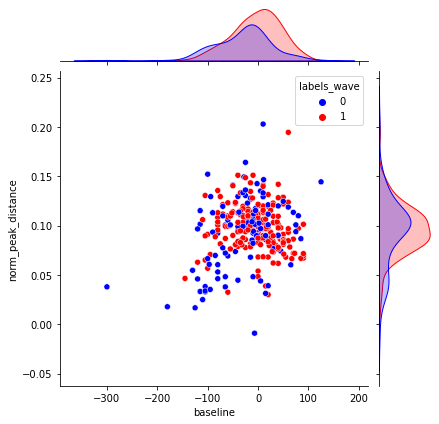

In [187]:


df_sta_temp['baseline'] = np.float32(df_sta_temp['baseline'].to_numpy()) 
df_sta_temp['peak_distance'] = np.float32(df_sta_temp['norm_peak_distance'].to_numpy()) 
# df_sta_temp['peak_calculated'] = np.float32(df_sta_temp['peak_calculated'].to_numpy()) 

sns.jointplot(data=df_sta_temp, x="baseline", y="norm_peak_distance", hue="labels_wave",palette=['blue','red'],marginal_ticks=False)
plt.xlabel('baseline',fontsize=14)
plt.ylabel('peak_calculated',fontsize=14)

plt.savefig(savepath+'baseline_vs_peak.pdf',dpi=200)


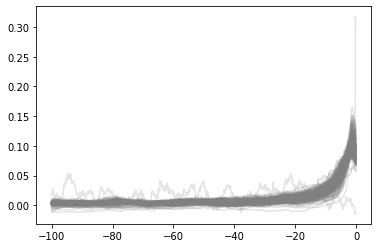

In [60]:
plt.plot(np.arange(-100,0,1/20), normalize(np.vstack(df_sta_acsf_exc['sta'])).T[:],c='grey',alpha=0.2)
plt.show()

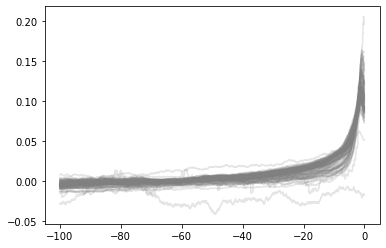

In [61]:
plt.plot(np.arange(-100,0,1/20), normalize(np.vstack(df_sta_acsf_inh['sta'])).T[:],c='grey',alpha=0.2)
plt.show()

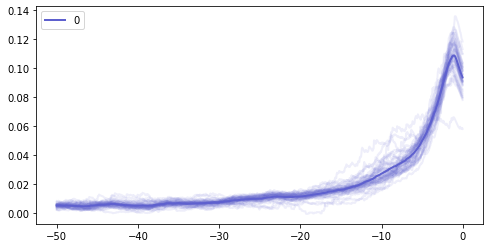

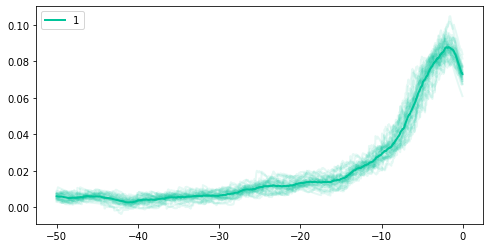

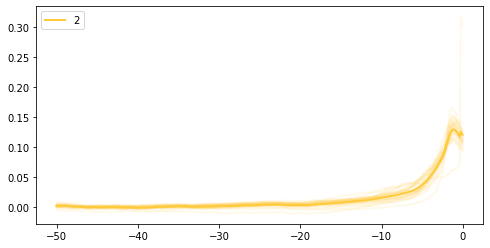

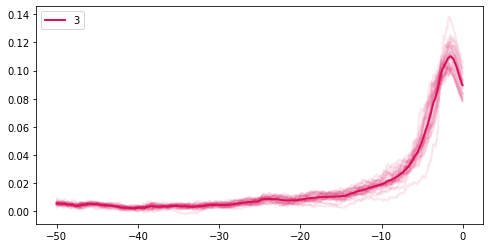

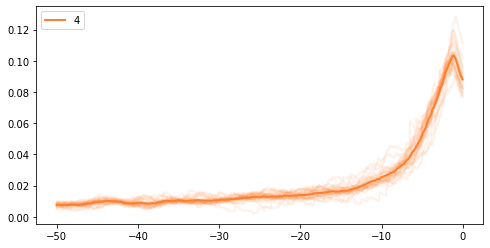

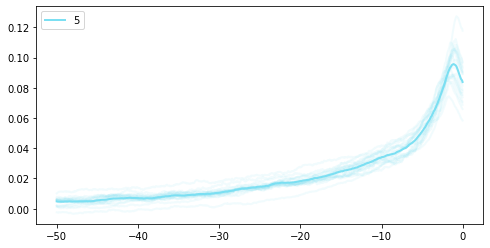

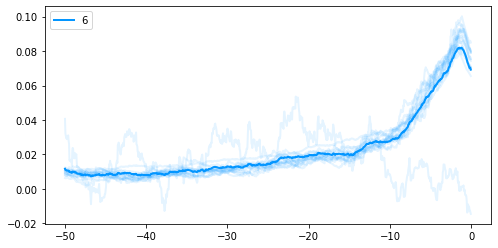

In [62]:
for i in set(df_sta_acsf_exc.labels_sta):
    fig,ax = plt.subplots(figsize=[8,4])
    plt.plot(np.arange(-50,0,1/20),normalize(np.vstack(df_sta_acsf_exc[df_sta_acsf_exc.labels_sta==i]['sta'])).T[50*20:],c=CUSTOM_PAL_SORT_3[i],linewidth=2,alpha=0.1)
    plt.plot(np.arange(-50,0,1/20),np.mean(normalize(np.vstack(df_sta_acsf_exc[df_sta_acsf_exc.labels_sta==i]['sta'])).T,axis=1)[50*20:],c=CUSTOM_PAL_SORT_3[i],linewidth=2,label=i)
    plt.legend()
    plt.show()

# for i in set(df_sta_acsf_inh.labels_sta):
#     plt.plot(np.arange(0,50,1/20),np.mean(np.vstack(df_sta_acsf_inh[df_sta_acsf_inh.labels_sta==i]['sta']).T,axis=1)[50*20:],c=coherence_colors[i],linewidth=2,label=i)
# plt.legend()    
# plt.show()

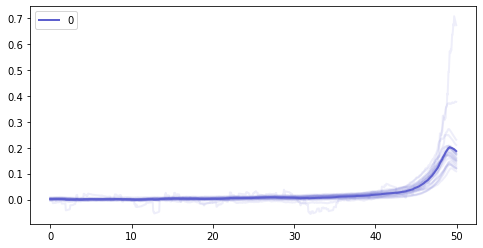

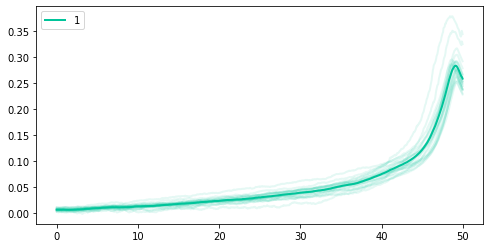

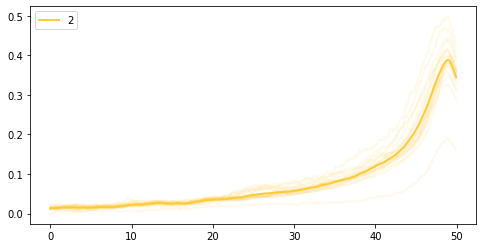

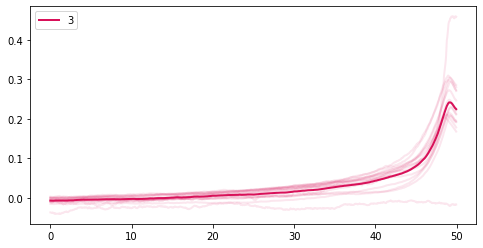

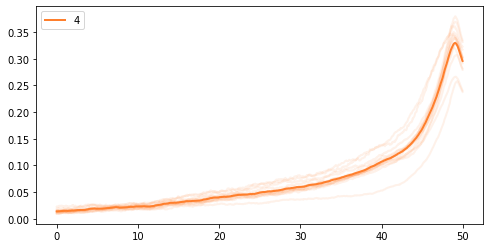

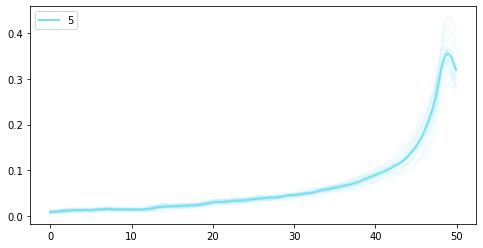

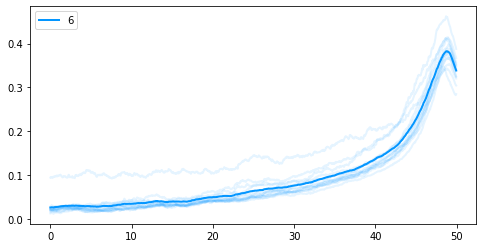

In [63]:
for i in set(df_sta_acsf_inh.labels_sta):
    fig,ax = plt.subplots(figsize=[8,4])
    plt.plot(np.arange(0,50,1/20),np.vstack(df_sta_acsf_inh[df_sta_acsf_inh.labels_sta==i]['sta']).T[50*20:],c=CUSTOM_PAL_SORT_3[i],linewidth=2,alpha=0.1)
    plt.plot(np.arange(0,50,1/20),np.mean(np.vstack(df_sta_acsf_inh[df_sta_acsf_inh.labels_sta==i]['sta']).T,axis=1)[50*20:],c=CUSTOM_PAL_SORT_3[i],linewidth=2,label=i)
    plt.legend()
    plt.show()

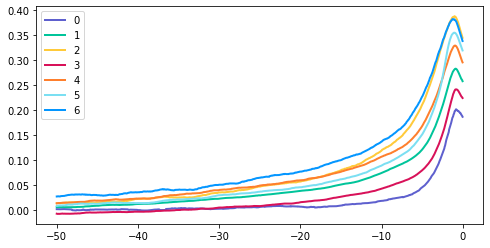

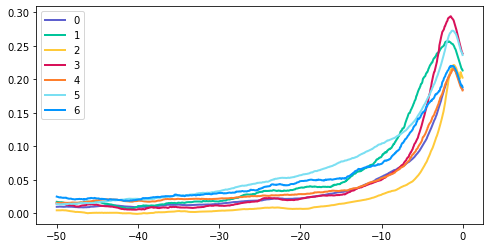

In [64]:
fig,ax = plt.subplots(figsize=[8,4])
for i in set(df_sta_acsf_inh.labels_sta):
    
    plt.plot(np.arange(-50,0,1/20),np.mean(np.vstack(df_sta_acsf_inh[df_sta_acsf_inh.labels_sta==i]['sta']).T,axis=1)[-50*20:],c=CUSTOM_PAL_SORT_3[i],linewidth=2,label=i)
# plt.ylim(-0.1,0.15)
plt.legend()
# plt.savefig(savepath+'sta_inh_50ms.pdf',dpi=200)
# plt.show()

fig,ax = plt.subplots(figsize=[8,4])
for i in set(df_sta_acsf_exc.labels_sta):
    plt.plot(np.arange(-50,0,1/20),np.mean(np.vstack(df_sta_acsf_exc[df_sta_acsf_exc.labels_sta==i]['sta']).T,axis=1)[-50*20:],c=CUSTOM_PAL_SORT_3[i],linewidth=2,label=i)
# plt.ylim(-0.1,0.15)
plt.legend()
# plt.savefig(savepath+'sta_exc_10ms.pdf',dpi=200)
# plt.show()

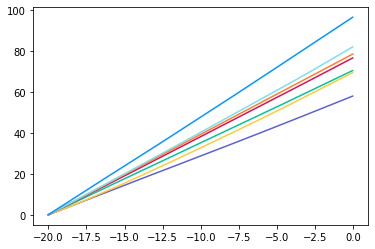

In [65]:
for  i in range(len(set(df_sta_acsf_exc.labels_sta))):
    data = normalize(np.vstack(df_sta_acsf_exc[df_sta_acsf_exc.labels_sta==i]['sta']).T)
    plt.plot(np.arange(-20,0,1/20),np.cumsum(np.mean(data,axis=1)[-20*20:], axis=0, dtype=None, out=None),c=CUSTOM_PAL_SORT_3[i])
plt.savefig(savepath+'cumsum_exc_sta.pdf',dpi=200)

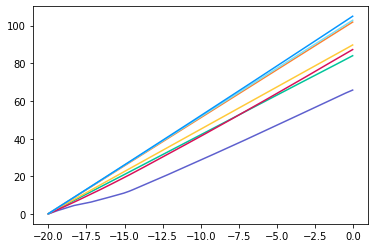

In [66]:
for  i in range(len(set(df_sta_acsf_inh.labels_sta))):
    data = normalize(np.vstack(df_sta_acsf_inh[df_sta_acsf_inh.labels_sta==i]['sta']).T)
    plt.plot(np.arange(-20,0,1/20),np.cumsum(np.mean(data,axis=1)[-20*20:], axis=0, dtype=None, out=None),c=CUSTOM_PAL_SORT_3[i])
plt.savefig(savepath+'cumsum_inh_sta.pdf',dpi=200)    

## significance test

In [328]:
from sklearn.metrics.pairwise import cosine_similarity

In [329]:
sta_exc = np.vstack(df_sta_acsf_exc['sta'])[-50*20:,:]
sta_inh = np.vstack(df_sta_acsf_inh['sta'])[-50*20:,:]

cosine_mat = np.zeros((2,2))
for i in range(2):
    for j in range(2):
        if i ==0:
            data1 = sta_exc
            if j == 0:
                data2 = sta_exc
            else:
                data2 = sta_inh
        else:
            data1 = sta_inh
            if j == 0:
                data2 = sta_exc
            else:
                data2 = sta_inh            
        cosine_mat[i,j] = np.mean(cosine_similarity(data1,data2))


<Axes: >

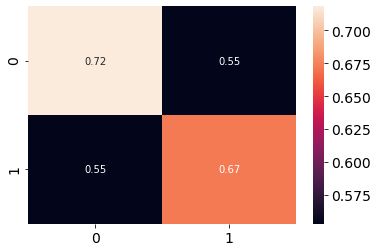

In [330]:
sns.heatmap(cosine_mat,annot=True)

In [332]:
data1 = cosine_similarity(sta_exc,sta_exc)[np.triu_indices_from(cosine_similarity(sta_exc,sta_exc))]
data2 = cosine_similarity(sta_inh,sta_inh)[np.triu_indices_from(cosine_similarity(sta_inh,sta_inh))]
data3 = cosine_similarity(sta_inh,sta_exc).reshape(1,-1)[0]
print(calcualte_cosine_sig(data1,data2,data3))

statistic = 1005.9034392076701
pvalue = 0.0
df = (2.0, 23121.78654346833)
df_num = 2.0
df_denom = 23121.78654346833
nobs_t = 48828.0
n_groups = 3
means = [0.71970767 0.674678   0.55311763]
nobs = [17391.  8001. 23436.]
vars_ = [0.11776403 0.11175403 0.17558281]
use_var = unequal
welch_correction = True
tuple = (1005.9034392076701, 0.0)


In [377]:
games_howell(data1,data2,data3)      

,mean_differences,degrees_freedom,t_values,p_values,std_err,up_conf,low_conf,group_comps
0,0.162936,9161.539599,65.313586,0.001,0.001764,3.477981,-3.152109,0 : 1
1,-0.054958,16398.682442,18.687064,0.001,0.002080,3.259845,-3.369761,0 : 2
2,-0.217894,29917.632997,120.768449,0.001,0.001276,3.096771,-3.532560,1 : 2


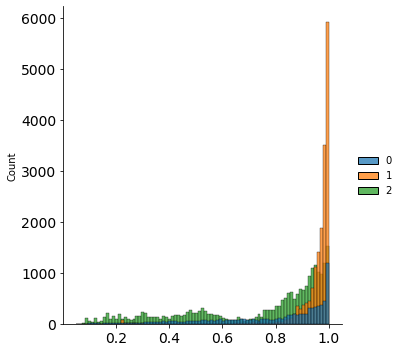

In [378]:
sns.displot([data1,data2,data3])

## STA Comparisons

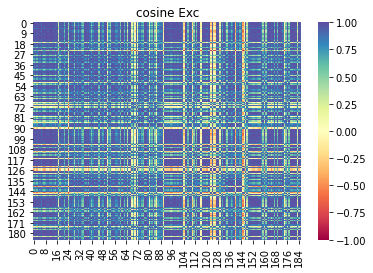

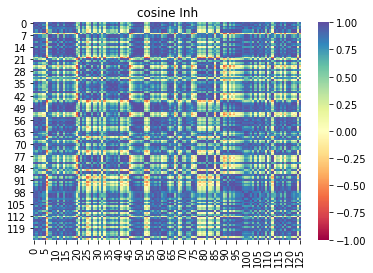

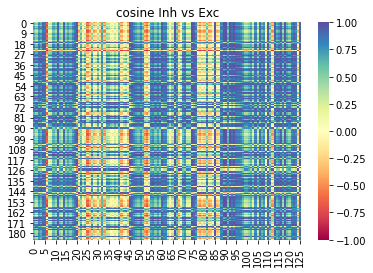

In [224]:

sns.heatmap(cosine_similarity(wave_exc,wave_exc),cmap='Spectral',vmax=1,vmin=-1)
plt.title('cosine Exc')
plt.savefig(savepath+'cosine_exc.pdf',dpi=200)
plt.show()
sns.heatmap(cosine_similarity(wave_inh,wave_inh),cmap='Spectral',vmax=1,vmin=-1)
plt.title('cosine Inh') 
plt.savefig(savepath+'cosine_inh.pdf',dpi=200)
plt.show()
sns.heatmap(cosine_similarity(wave_exc,wave_inh),cmap='Spectral',vmax=1,vmin=-1)
plt.title('cosine Inh vs Exc') 
plt.savefig(savepath+'cosine_exc_inh.pdf',dpi=200)
plt.show()


<Axes: >

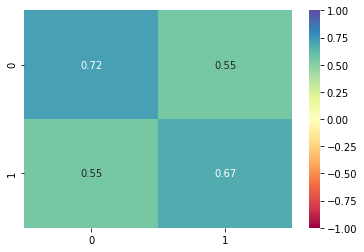

In [218]:
sns.heatmap(cosine_mat,vmax=1,vmin=-1,annot=True,cmap='Spectral')

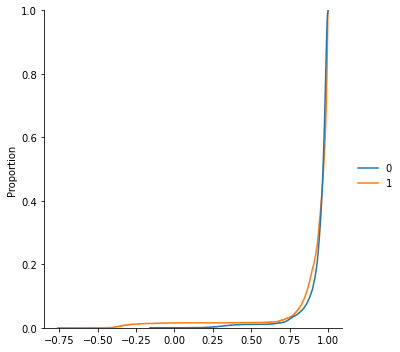

In [74]:
sns.displot([np.hstack(cosine_similarity(wave_exc,wave_exc)),np.hstack(cosine_similarity(wave_inh,wave_inh))],kind='ecdf')


In [32]:
amps_exc = []
acceleration_exc = []

for sta in np.vstack(df_sta_acsf_exc['sta']):
    # sta = np.mean(np.vstack(df_sta_acsf_exc[df_sta_acsf_exc.labels_sta==i]['sta']).T,axis=1)[50*20:]
    amps_exc.append(np.max(sta))
    acceleration_exc.append(np.max(np.diff(sta,1)))



amps_inh = []
acceleration_inh = []
for sta in np.vstack(df_sta_acsf_inh['sta']):
    # sta = np.mean(np.vstack(df_sta_acsf_inh[df_sta_acsf_inh.labels_sta==i]['sta']).T,axis=1)[50*20:]
    amps_inh.append(np.max(sta))
    acceleration_inh.append(np.max(np.diff(sta,1)))



In [67]:
df_slope_amp = pd.DataFrame({'slope':np.concatenate([acceleration_exc,acceleration_inh]),
                   'max_amplitude':np.concatenate([amps_exc,amps_inh]),
                   'E/I':np.concatenate([np.repeat('exc',len(acceleration_exc)) , np.repeat('inh',len(acceleration_inh))])})

plt.rcParams.fontsize=14

sns.jointplot(data=df_slope_amp, x="slope", y="max_amplitude", hue="E/I",palette=['blue','red'])


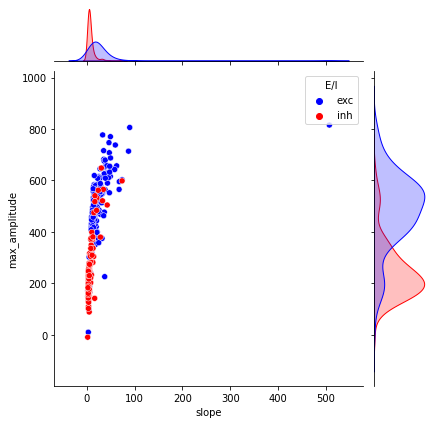

In [145]:
df_sta_comparison = pd.read_pickle('D:/CurrentClamp/all_stas_for_baseline_vs_amp.pkl')
df_sta_comparison.trial = df_sta_comparison.trial.apply(int)
df_sta_comparison = df_sta_comparison[~df_sta_comparison.exp_name.isin(discarded_exps)]
df_sta_acsf_comparison = df_sta_comparison[df_sta_comparison.cond.isin(['acsf','acsf_bic'])]
df_sta_acsf_comparison = df_sta_acsf_comparison[df_sta_acsf_comparison.exp_name.isin(set(data_wave_FN_acsf.exp_name))]
df_sta_acsf_comparison = df_sta_acsf_comparison[df_sta_acsf_comparison.trial==0]


In [149]:
df_sta['baseline'] = df_sta_comparison['baseline']

In [132]:
df_sta_acsf_comparison['labels_wave'] = binarize_EI_labels(labels_wave,e_vals=[1,2,3,6,7]) 

df_sta_acsf_exc = df_sta_acsf_comparison[df_sta_acsf_comparison.labels_wave.isin([1,2,3,6,7])]
df_sta_acsf_inh = df_sta_acsf_comparison[df_sta_acsf_comparison.labels_wave.isin([0,4,5])]

,sta,cond,exp_name,trial,baseline
0,"[-29.136803, -28.914057, -28.866486, -29.03143...",acsf,asli_18719_E2,0,-14
1,"[-32.869057, -33.12753, -33.20921, -33.50037, ...",m1-ago,asli_18719_E2,1,-19
2,"[-38.50977, -38.67939, -38.813385, -39.27503, ...",m1-ant,asli_18719_E2,2,-24
3,"[86.70841, 86.39632, 85.40984, 88.23137, 91.31...",acsf,asli_11719_E1,0,55
4,"[63.68802, 63.43242, 63.18577, 64.41218, 61.43...",m1-ago,asli_11719_E1,1,38
...,...,...,...,...,...
835,"[-108.715836, -108.300224, -108.20681, -108.06...",cirazoline,xuan_9919_E3,1,-50
836,"[-122.256165, -121.501526, -121.25651, -120.79...",agoanta,xuan_9919_E3,2,-65
837,"[-7.214985, -7.0553594, -7.281143, -6.8065333,...",acsf,xuan_9919_E4,0,2
838,"[-21.94919, -22.162203, -22.186674, -22.125116...",cirazoline,xuan_9919_E4,1,-10


In [136]:
df_sta['baseline'] = df_sta_acsf_comparison['baseline']

In [137]:
sta_norms_exc = normalize(np.vstack(df_sta_acsf_exc['sta'].to_numpy()))
peaks_exc = [np.max(i) for i in sta_norms_exc]

sta_norms_inh = normalize(np.vstack(df_sta_acsf_inh['sta'].to_numpy()))
peaks_inh = [np.max(i) for i in sta_norms_inh]


In [138]:
df_sta_acsf = df_sta_acsf.sort_values('labels_wave')
df_sta_acsf['peak_calculated'] = np.concatenate([peaks_inh,peaks_exc])

In [139]:
# plt.scatter(np.array(df_sta_acsf_exc['baseline']), np.array(df_sta_acsf_exc['peak_distance']))
# np.array(df_sta_acsf_exc['baseline'])
# plt.scatter(np.float32(np.array(df_sta_acsf_exc['baseline'])) , np.float32(np.array(df_sta_acsf_exc['peak_distance'])),alpha=0.5,c='red')
# plt.scatter(np.float32(np.array(df_sta_acsf_inh['baseline'])) , np.float32(np.array(df_sta_acsf_inh['peak_distance'])),alpha=0.5,c='blue')
# plt.xlabel('baseline')
# plt.ylabel('peak_distance')
# plt.legend(['exc','inh'])
# plt.show()
df_sta_acsf['baseline'] = np.float32(df_sta_acsf['baseline'].to_numpy()) 
df_sta_acsf['peak_distance'] = np.float32(df_sta_acsf['peak_distance'].to_numpy()) 
df_sta_acsf['peak_calculated'] = np.float32(df_sta_acsf['peak_calculated'].to_numpy()) 

sns.jointplot(data=df_sta_acsf, x="baseline", y="peak_calculated", hue="labels_wave",palette=['blue','red'],marginal_ticks=False)
plt.xlabel('baseline',fontsize=14)
plt.ylabel('peak_calculated',fontsize=14)
# plt.legend(['exc','inh'])
# plt.savefig(savepath+'baseline_vs_peak.pdf',dpi=200)
plt.show()
# np.float32(df_sta_acsf_exc['peak_distance'].to_numpy())

KeyError: 'baseline'

In [75]:
df_sta = pd.read_pickle('D:/CurrentClamp/all_stas_fleur.pkl')
df_sta.trial = df_sta.trial.apply(int)
df_sta = df_sta[~df_sta.exp_name.isin(discarded_exps)]
df_sta_acsf = df_sta[df_sta.cond.isin(['acsf','acsf_bic'])]

df_sta_acsf = df_sta_acsf[df_sta_acsf.exp_name.isin(set(data_wave_FN_acsf.exp_name))]
df_sta_acsf = df_sta_acsf[df_sta_acsf.trial==0]



In [76]:
df_sta_acsf['labels_wave'] =labels_wave 
df_sta_acsf_exc = df_sta_acsf[df_sta_acsf.labels_wave.isin([1,2,3,6,7])]
df_sta_acsf_inh = df_sta_acsf[df_sta_acsf.labels_wave.isin([0,4,5])]

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


7


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


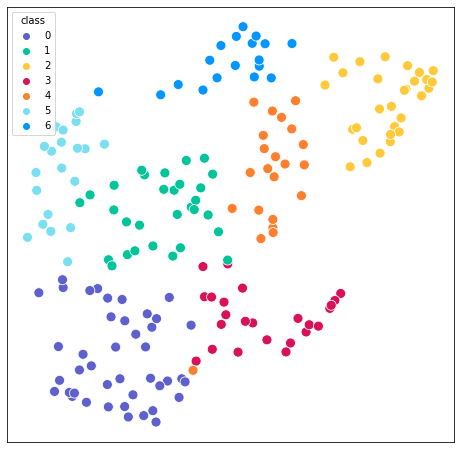

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


7


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


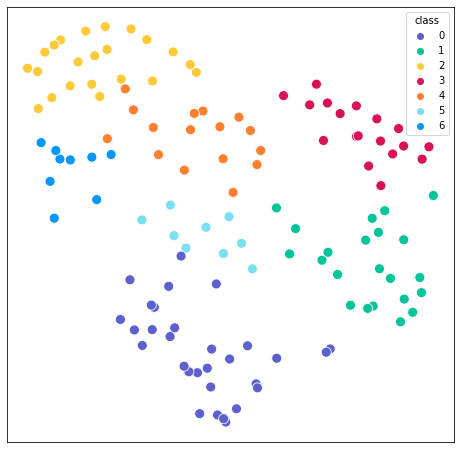

<ipython-input-77-81579ff23db0>:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sta_acsf_exc['labels_sta'] =labels_sta_exc
<ipython-input-77-81579ff23db0>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sta_acsf_inh['labels_sta'] =labels_sta_inh


In [77]:
sta_exc = normalize(np.vstack(df_sta_acsf_exc['sta'].to_numpy()))
labels_sta_exc,mapper,reducer = plot_UMAP_clusters_single(sta_exc,
                          20,
                          0.1,
                          random_state =30,
                          res_louvain = 1.,
                          c_list =CUSTOM_PAL_SORT_3,
                        #   title='UMAP+Louvain for waveforms'
                          norm = False,
                          size= 100,
                          save=False,
                          savepath=savepath+'sta_cluster_exc.pdf'
                          )

sta_inh = normalize(np.vstack(df_sta_acsf_inh['sta'].to_numpy()))
labels_sta_inh,mapper,reducer = plot_UMAP_clusters_single(sta_inh,
                          20,
                          0.1,
                          random_state =30,
                          res_louvain = 1.,
                          c_list =CUSTOM_PAL_SORT_3,
                        #   title='UMAP+Louvain for waveforms'
                          norm = False,
                          size= 100,
                          save=False,
                          savepath=savepath+'sta_cluster_inh.pdf'
                          )

df_sta_acsf_exc['labels_sta'] =labels_sta_exc
df_sta_acsf_inh['labels_sta'] =labels_sta_inh

In [78]:
stas = np.vstack(df_sta_acsf_exc[df_sta_acsf_exc.labels_sta==1]['sta'])
exps = df_sta_acsf_exc[df_sta_acsf_exc.labels_sta==1]['exp_name']

In [79]:
amps_exc = []
acceleration_exc = []

for sta in np.vstack(df_sta_acsf_exc['sta']):
    # sta = np.mean(np.vstack(df_sta_acsf_exc[df_sta_acsf_exc.labels_sta==i]['sta']).T,axis=1)[50*20:]
    amps_exc.append(np.max(sta))
    acceleration_exc.append(np.max(np.diff(sta,1)))



amps_inh = []
acceleration_inh = []
for sta in np.vstack(df_sta_acsf_inh['sta']):
    # sta = np.mean(np.vstack(df_sta_acsf_inh[df_sta_acsf_inh.labels_sta==i]['sta']).T,axis=1)[50*20:]
    amps_inh.append(np.max(sta))
    acceleration_inh.append(np.max(np.diff(sta,1)))



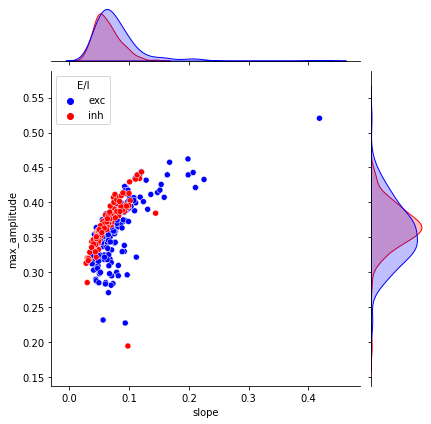

In [81]:
df_slope_amp = pd.DataFrame({'slope':np.concatenate([acceleration_exc,acceleration_inh]),
                   'max_amplitude':np.concatenate([amps_exc,amps_inh]),
                   'E/I':np.concatenate([np.repeat('exc',len(acceleration_exc)) , np.repeat('inh',len(acceleration_inh))])})

plt.rcParams.fontsize=14

sns.jointplot(data=df_slope_amp, x="slope", y="max_amplitude", hue="E/I",palette=['blue','red'])


In [139]:
len(np.vstack(df_sta_acsf_exc['sta'])[0])/20

5.55

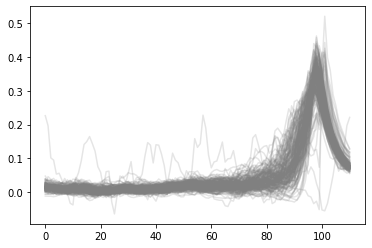

In [136]:
plt.plot( np.vstack(df_sta_acsf_exc['sta'].to_numpy()).T,c='grey',alpha=0.2)
plt.show()

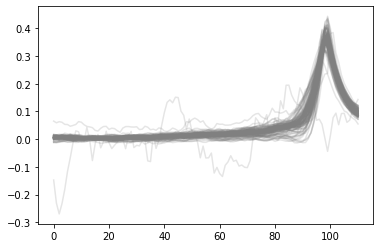

In [125]:
plt.plot(normalize(np.vstack(df_sta_acsf_inh['sta'])).T[:],c='grey',alpha=0.2)
plt.show()

In [ ]:
for i in set(df_sta_acsf_exc.labels_sta):
    fig,ax = plt.subplots(figsize=[8,4])
    plt.plot(np.arange(-50,0,1/20),normalize(np.vstack(df_sta_acsf_exc[df_sta_acsf_exc.labels_sta==i]['sta'])).T[50*20:],c=CUSTOM_PAL_SORT_3[i],linewidth=2,alpha=0.1)
    plt.plot(np.arange(-50,0,1/20),np.mean(normalize(np.vstack(df_sta_acsf_exc[df_sta_acsf_exc.labels_sta==i]['sta'])).T,axis=1)[50*20:],c=CUSTOM_PAL_SORT_3[i],linewidth=2,label=i)
    plt.legend()
    plt.show()

# for i in set(df_sta_acsf_inh.labels_sta):
#     plt.plot(np.arange(0,50,1/20),np.mean(np.vstack(df_sta_acsf_inh[df_sta_acsf_inh.labels_sta==i]['sta']).T,axis=1)[50*20:],c=coherence_colors[i],linewidth=2,label=i)
# plt.legend()    
# plt.show()

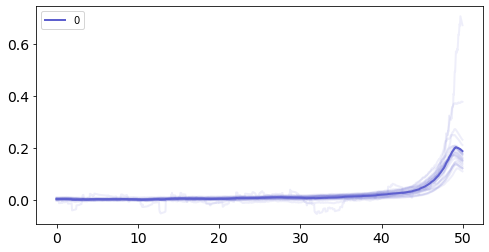

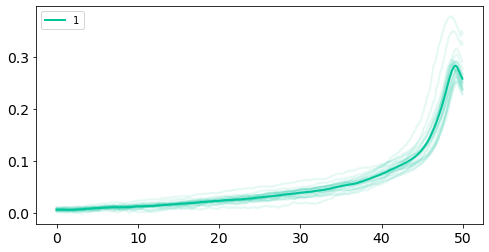

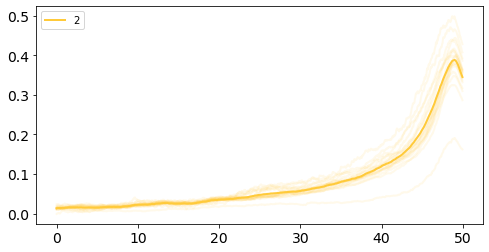

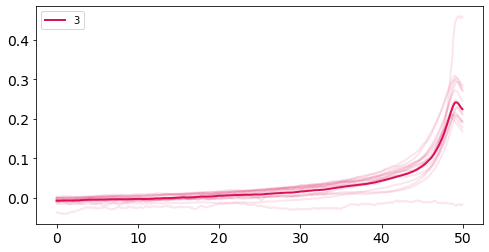

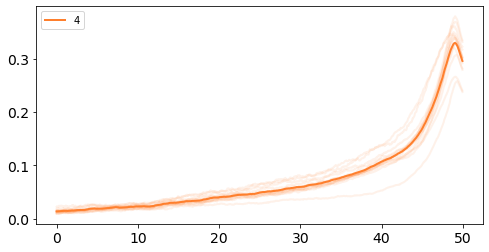

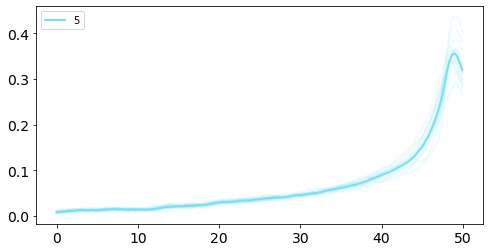

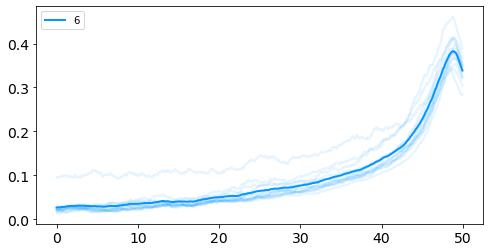

In [93]:
for i in set(df_sta_acsf_inh.labels_sta):
    fig,ax = plt.subplots(figsize=[8,4])
    plt.plot(np.arange(0,50,1/20),np.vstack(df_sta_acsf_inh[df_sta_acsf_inh.labels_sta==i]['sta']).T[50*20:],c=CUSTOM_PAL_SORT_3[i],linewidth=2,alpha=0.1)
    plt.plot(np.arange(0,50,1/20),np.mean(np.vstack(df_sta_acsf_inh[df_sta_acsf_inh.labels_sta==i]['sta']).T,axis=1)[50*20:],c=CUSTOM_PAL_SORT_3[i],linewidth=2,label=i)
    plt.legend()
    plt.show()

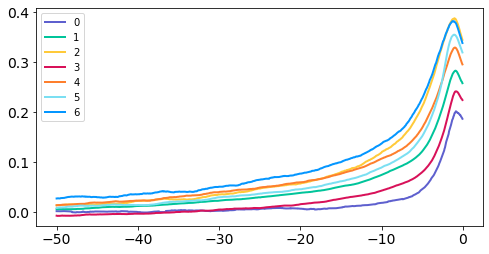

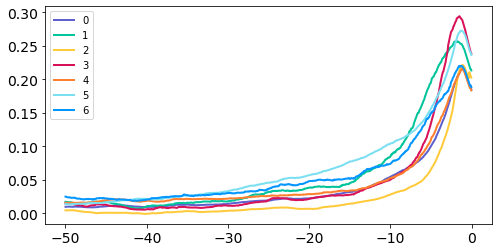

In [95]:
fig,ax = plt.subplots(figsize=[8,4])
for i in set(df_sta_acsf_inh.labels_sta):
    
    plt.plot(np.arange(-50,0,1/20),np.mean(np.vstack(df_sta_acsf_inh[df_sta_acsf_inh.labels_sta==i]['sta']).T,axis=1)[-50*20:],c=CUSTOM_PAL_SORT_3[i],linewidth=2,label=i)
# plt.ylim(-0.1,0.15)
plt.legend()
# plt.savefig(savepath+'sta_inh_50ms.pdf',dpi=200)
# plt.show()

fig,ax = plt.subplots(figsize=[8,4])
for i in set(df_sta_acsf_exc.labels_sta):
    plt.plot(np.arange(-50,0,1/20),np.mean(np.vstack(df_sta_acsf_exc[df_sta_acsf_exc.labels_sta==i]['sta']).T,axis=1)[-50*20:],c=CUSTOM_PAL_SORT_3[i],linewidth=2,label=i)
# plt.ylim(-0.1,0.15)
plt.legend()
# plt.savefig(savepath+'sta_exc_10ms.pdf',dpi=200)
# plt.show()

In [129]:
from sklearn.metrics.pairwise import cosine_similarity


In [97]:
def plot_cosine_mat(data1,data2,label1,label2):
    cosine_mat = np.zeros((len(set(label1)),len(set(label2))))
    sim_data = cosine_similarity(data1,data2)
    for i in set(label1):
        for j in set(label2):
            idx_FN = label1==i
            idx_SH = label2==j
            cosine_mat[i,j] = np.mean(sim_data[:,idx_FN][idx_SH])
    return cosine_mat
data1 = normalize(np.vstack(df_sta_acsf_inh['sta']))
data2 = normalize(np.vstack(df_sta_acsf_exc['sta']))
cosine_mat_inh = np.around(plot_cosine_mat(data1,data1,df_sta_acsf_inh.labels_sta,df_sta_acsf_inh.labels_sta),decimals=2)
cosine_mat_exc = np.around(plot_cosine_mat(data2,data2,df_sta_acsf_exc.labels_sta,df_sta_acsf_exc.labels_sta),decimals=2)


<Axes: >

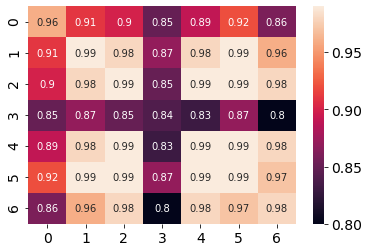

In [98]:
sns.heatmap(np.around(cos,decimals=2),annot=True)

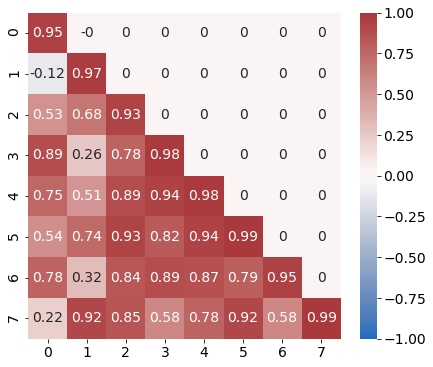

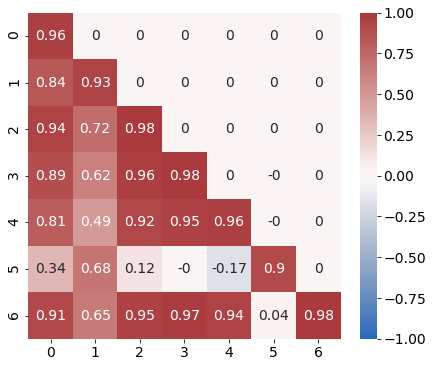

In [ ]:
plt.rcParams['font.size'] =14
fig,ax = plt.subplots(figsize=[7,6])
sns.heatmap(cosine_mat_inh*np.tril(np.ones_like(cosine_mat_inh)),cmap='vlag',vmin=-1,vmax=1,annot=True,ax=ax)
plt.savefig(savepath+'sta_cosine_inh.pdf',dpi=200)
plt.show()
fig,ax = plt.subplots(figsize=[7,6])

sns.heatmap(cosine_mat_exc*np.tril(np.ones_like(cosine_mat_exc)),cmap='vlag',vmin=-1,vmax=1,annot=True,ax=ax)
plt.savefig(savepath+'sta_cosine_exc.pdf',dpi=200)
plt.show()

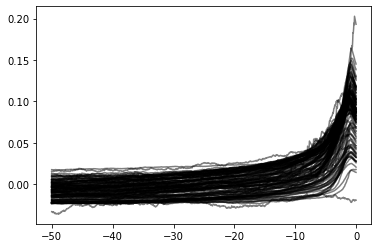

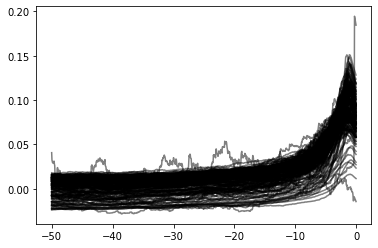

In [72]:
plt.plot(np.arange(-50,0,1/20),wave_inh.T[-50*20:,:],c='black',alpha=0.5)
plt.show()
plt.plot(np.arange(-50,0,1/20),wave_exc.T[-50*20:,:],c='black',alpha=0.5)
plt.show()

In [82]:
wave_exc = np.vstack(df_sta_acsf_exc['sta'])
wave_inh = np.vstack(df_sta_acsf_inh['sta'])

cosine_mat = np.zeros((2,2))
for i in range(2):
    for j in range(2):
        if i ==0:
            data1 = wave_exc
            if j == 0:
                data2 = wave_exc
            else:
                data2 = wave_inh
        else:
            data1 = wave_inh
            if j == 0:
                data2 = wave_exc
            else:
                data2 = wave_inh            
        cosine_mat[i,j] = np.mean(cosine_similarity(data1,data2))


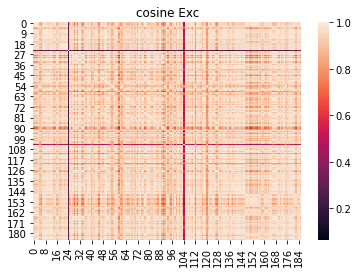

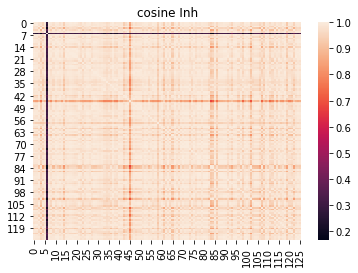

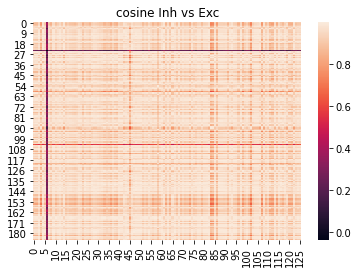

In [84]:

sns.heatmap(cosine_similarity(wave_exc,wave_exc),cmap=)
plt.title('cosine Exc')
plt.show()
sns.heatmap(cosine_similarity(wave_inh,wave_inh))
plt.title('cosine Inh') 

plt.show()
sns.heatmap(cosine_similarity(wave_exc,wave_inh))
plt.title('cosine Inh vs Exc') 

plt.show()

<Axes: >

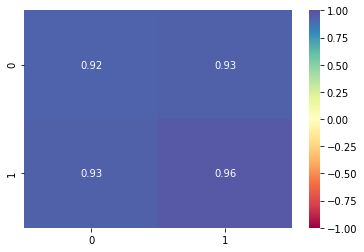

In [83]:
sns.heatmap(cosine_mat,vmax=1,vmin=-1,annot=True,cmap='Spectral')

# plt.savefig(savepath+'sta_EI_similarity_normalize_input.pdf',dpi=200)

In [163]:
len(np.concatenate([np.repeat('exc',len(np.hstack(cosine_similarity(wave_exc,wave_exc)))),np.repeat('inh',len(np.hstack(cosine_similarity(wave_inh,wave_inh))))]))

50472

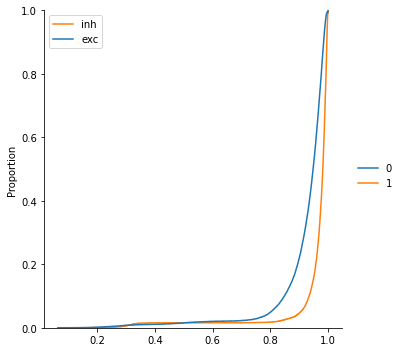

In [89]:

sns.displot([np.hstack(cosine_similarity(wave_exc,wave_exc)),np.hstack(cosine_similarity(wave_inh,wave_inh))],kind='ecdf')
plt.legend(['inh','exc'])

In [ ]:
wave_exc = normalize(np.vstack(ephys_exc[cols].to_numpy()))
wave_inh = normalize(np.vstack(ephys_inh[cols].to_numpy()))

cosine_mat = np.zeros((2,2))
for i,type_i in enumerate(['exc','inh']):
    for j,type_j in enumerate(['exc','inh']):
        if type_i =='exc':
            data1 = wave_exc
            if type_j == 'exc':
                data2 = wave_exc
            else:
                data2 = wave_inh
        elif type_i =='inh':
            data1 = wave_inh
            if type_j == 'inh':
                data2 = wave_inh
            else:
                data2 = wave_exc            
        cosine_mat[i,j] = np.mean(cosine_similarity(data1,data2))


In [ ]:
np.mean(cosine_similarity(wave_inh,wave_inh))

0.796117209037501

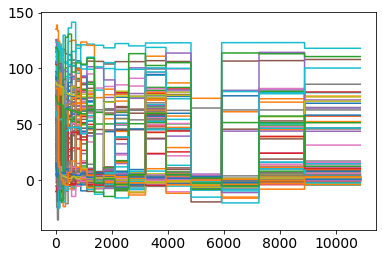

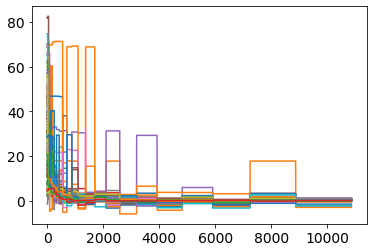

In [ ]:
plt.plot(np.vstack(df_biophys_exc['gamma_threshold'].to_numpy()).T)
plt.show()

plt.plot(np.vstack(df_biophys_inh['gamma_threshold'].to_numpy()).T)
plt.show()


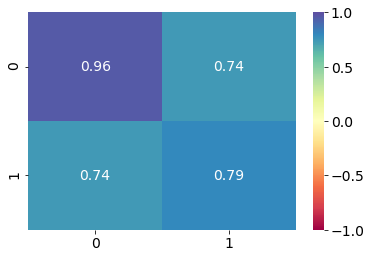

In [ ]:
sns.heatmap(cosine_mat,vmax=1,vmin=-1,annot=True,cmap='Spectral')
plt.savefig(savepath+'ephys_EI_comparison.pdf',dpi=200)

# Labels Matching 

In [ ]:
import pandas as pd 
def return_confusion_matrix_temp(df1,df2,label1_name,label2_name,vmin=0,vmax=100,figsize =[12,5],shuffle = False,save=False,savepath=None,palette='BrBG_r'):
    np.random.seed(42)
    if shuffle:
        fig,ax1 = plt.subplots(figsize =figsize )
        df = pd.DataFrame(columns=['label1','label2'])
        # df['exp_name1'] = df1.exp_name
        # df['exp_name2'] = df2.exp_name
        
        label1 = list(df1[label1_name])
        np.random.shuffle(label1)
        label2 = list(df2[label2_name])
        np.random.shuffle(label2)

        df['label1_sh'] = label1
        df['label2_sh'] = label2

        df['label1'] = np.array(df1[label1_name]) 
        df['label2'] = np.array(df2[label2_name])

        mat_orig = np.zeros((len(set(df1[label1_name])),len(set(df2[label2_name]))))
        for i in np.unique(df.label1):
            data_ = np.unique(df[df.label1==i]['label2'],return_counts=True)
            mat_orig[i,data_[0]] =(data_[1]/np.sum(data_[1])) 

        mat_sh = np.zeros((len(set(df['label1_sh'])),len(set(df['label2_sh']))))
        mat_sh[:,:] = int(100/len(set(df2[label2_name])))
        # for i in np.unique(df.label1_sh):
        #     data_ = np.unique(df[df.label1_sh==i]['label2_sh'],return_counts=True)
        #     mat_sh[i,data_[0]] =(data_[1]/np.sum(data_[1]))*100 


        sns.heatmap(np.around(mat_orig,2),cmap=palette,annot=True,ax=ax1,vmin=vmin,vmax=vmax) 
        plt.xlabel(label1_name)
        plt.ylabel(label2_name)
        if save:
            plt.savefig(savepath,dpi=300)
        else:
            plt.show()

    else:
        df = pd.DataFrame(columns=['label1','label2'])
        # df['exp_name1'] = df1.exp_name
        # df['exp_name2'] = df2.exp_name
        df['label1'] = np.array(df1[label1_name])
        df['label2'] = np.array(df2[label2_name])

        mat = np.zeros((len(set(df1[label1_name])),len(set(df2[label2_name]))))

        for i in np.unique(df.label1):
            data_ = np.unique(df[df.label1==i]['label2'],return_counts=True)
            mat[i,data_[0]] =(data_[1]/np.sum(data_[1]))*100 

        sns.heatmap(np.around(mat,2),cmap=palette,annot=True,vmin=vmin,vmax=vmax) 


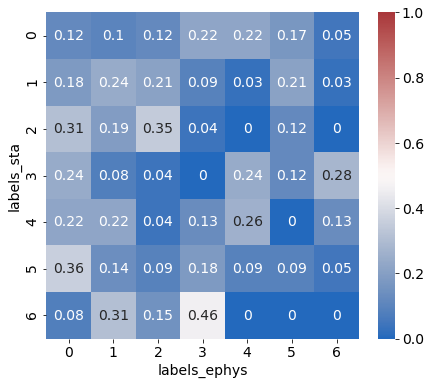

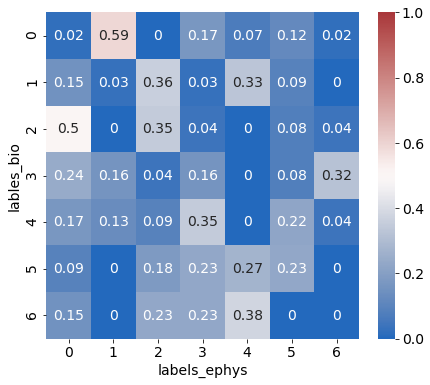

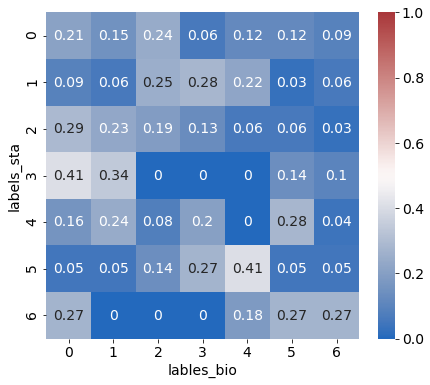

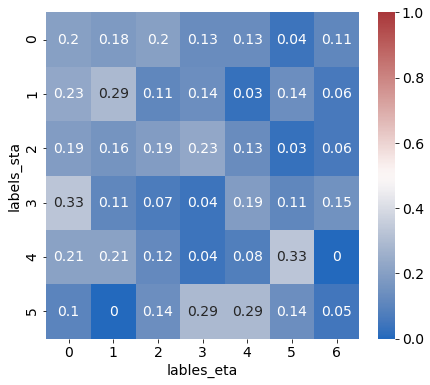

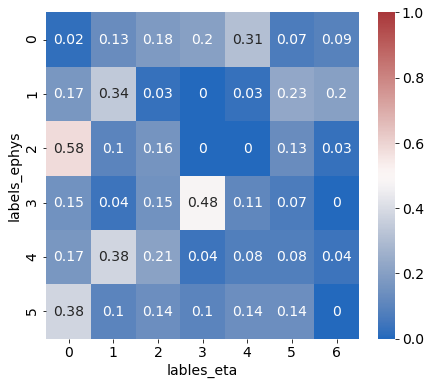

In [ ]:
from plot_utils import * 

conf_df_exc_ephys = ephys_exc[ephys_exc.exp_name.isin(set(df_biophys_exc.exp_name))]
conf_df_exc_ephys =conf_df_exc_ephys.drop_duplicates('exp_name')
conf_df_exc_sta = df_sta_acsf_exc[df_sta_acsf_exc.exp_name.isin(set(df_biophys_exc.exp_name))]
conf_df_exc_bio = df_biophys_exc.drop_duplicates('exp_name')
conf_df_exc_eta = df_biophys_exc.drop_duplicates('exp_name')

plt.rcParams['font.size']=14
return_confusion_matrix_temp(conf_df_exc_ephys, conf_df_exc_sta,  'labels_ephys','labels_sta'  ,palette='vlag',vmin=0,vmax=1,figsize=[7,6],shuffle=True,save=True,savepath=savepath+'exc_ephys_sta.pdf')
return_confusion_matrix_temp(conf_df_exc_ephys, conf_df_exc_bio,  'labels_ephys','lables_bio'  ,palette='vlag',vmin=0,vmax=1,figsize=[7,6],shuffle=True,save=True,savepath=savepath+'exc_ephys_bio.pdf')
return_confusion_matrix_temp(conf_df_exc_bio  , conf_df_exc_sta,  'lables_bio'  ,'labels_sta'  ,palette='vlag',vmin=0,vmax=1,figsize=[7,6],shuffle=True,save=True,savepath=savepath+'exc_bio_sta.pdf')
return_confusion_matrix_temp(conf_df_exc_eta  , conf_df_exc_sta,  'lables_eta'  ,'labels_sta'  ,palette='vlag',vmin=0,vmax=1,figsize=[7,6],shuffle=True,save=True,savepath=savepath+'exc_eta_sta.pdf')
return_confusion_matrix_temp(conf_df_exc_eta  , conf_df_exc_ephys,'lables_eta'  ,'labels_ephys',palette='vlag',vmin=0,vmax=1,figsize=[7,6],shuffle=True,save=True,savepath=savepath+'exc_eta_ephys.pdf')


In [ ]:
all = np.concatenate((np.concatenate((conf_df_exc_bio[cols_bio].to_numpy(),conf_df_exc_ephys[cols].to_numpy()),axis=1),np.vstack(conf_df_exc_sta['sta'])),axis=1)


(183, 2027)

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


7


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


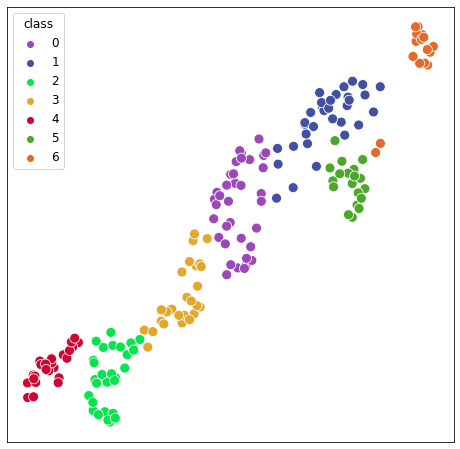

In [ ]:
waves = normalize(all,axis=0)

labels_wave,mapper,reducer = plot_UMAP_clusters_single(waves,
                          20,
                          0.1,
                          random_state =42,
                          res_louvain = 1.,
                          c_list =coherence_colors,
                          norm=False,
                          save=False,
                          savepath = savepath+'wave_cluster.pdf',
                          size=100
                          )

In [ ]:
conf_df_exc_bio

np.concatenate((conf_df_exc_bio.to_numpy(),conf_df_exc_ephys.to_numpy()),axis=0)

ValueError: all the input array dimensions for the concatenation axis must match exactly, but along dimension 1, the array at index 0 has size 17 and the array at index 1 has size 28

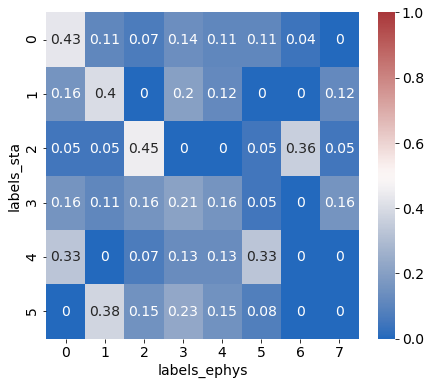

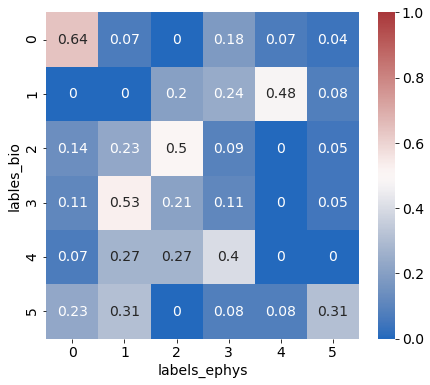

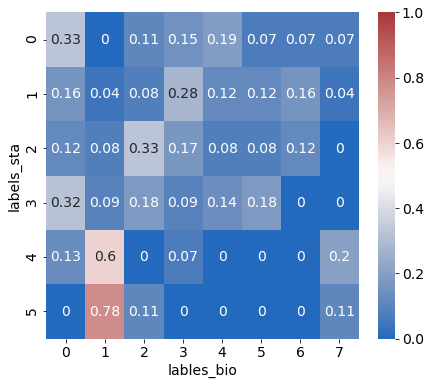

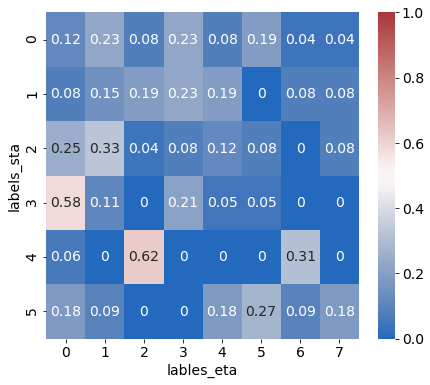

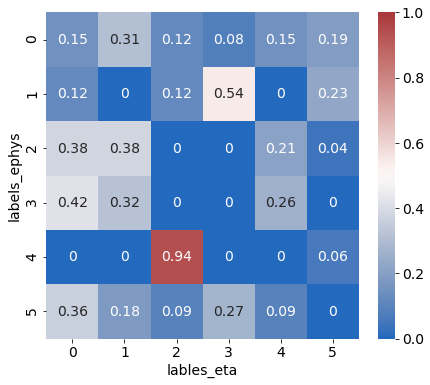

In [ ]:
exps_in_common =   (set(ephys_inh.exp_name) & set(df_sta_acsf_inh.exp_name)) & set(df_biophys_inh.exp_name) 
plt.rcParams['font.size']=14

conf_df_inh_ephys = ephys_inh[ephys_inh.exp_name.isin(exps_in_common)]
conf_df_inh_sta = df_sta_acsf_inh[df_sta_acsf_inh.exp_name.isin(exps_in_common)]
conf_df_inh_sta = conf_df_inh_sta.drop_duplicates('exp_name')
conf_df_inh_bio = df_biophys_inh[df_biophys_inh.exp_name.isin(exps_in_common)]
conf_df_inh_eta = df_biophys_inh[df_biophys_inh.exp_name.isin(exps_in_common)]

return_confusion_matrix_temp(conf_df_inh_ephys, conf_df_inh_sta, 'labels_ephys','labels_sta',palette='vlag',vmin=0,vmax=1,figsize=[7,6],shuffle=True,save=True,savepath=savepath+'inh_ephys_sta.pdf')
return_confusion_matrix_temp(conf_df_inh_ephys, conf_df_inh_bio, 'labels_ephys','lables_bio',palette='vlag',vmin=0,vmax=1,figsize=[7,6],shuffle=True,save=True,savepath=savepath+'inh_ephys_bio.pdf')
return_confusion_matrix_temp(conf_df_inh_bio  , conf_df_inh_sta, 'lables_bio'  ,'labels_sta',palette='vlag',vmin=0,vmax=1,figsize=[7,6],shuffle=True,save=True,savepath=savepath+'inh_bio_sta.pdf')
return_confusion_matrix_temp(conf_df_inh_eta  , conf_df_inh_sta,  'lables_eta'  ,'labels_sta'  ,palette='vlag',vmin=0,vmax=1,figsize=[7,6],shuffle=True,save=True,savepath=savepath+'inh_eta_sta.pdf')
return_confusion_matrix_temp(conf_df_inh_eta  , conf_df_inh_ephys,'lables_eta'  ,'labels_ephys',palette='vlag',vmin=0,vmax=1,figsize=[7,6],shuffle=True,save=True,savepath=savepath+'inh_eta_ephys.pdf')


In [ ]:
conf_df_inh_bio.columns

cols_bio = ['tau_m (ms)', 'R (MOhm)', 'C (nF)', 'gl (nS)', 'El (mV)', 'Tref (ms)',
       'Vr (mV)', 'Vt* (mV)', 'DV (mV)']

In [ ]:
fig,ax = plt.subplots(figsize = [20,20],)
sns.heatmap(conf_df_inh_ephys[cols_ephys].corr(),annot=True)

NameError: name 'plt' is not defined

In [ ]:
from sklearn.cross_decomposition import CCA
y = np.vstack(conf_df_inh_sta['sta'].to_numpy())
X = np.vstack(conf_df_inh_ephys[cols_ephys].to_numpy())
cca = CCA(n_components=len(cols_ephys))
cca.fit(X, y)
CCA(n_components=1)
X_c, Y_c = cca.transform(X,y)

cca.score(X,y)

-0.7563903235647585

In [ ]:
from sklearn.cross_decomposition import CCA
X = np.vstack(conf_df_inh_sta['sta'].to_numpy())
y = np.vstack(conf_df_inh_bio[cols_bio].to_numpy())
cca = CCA(n_components=1)
cca.fit(X, y)
CCA(n_components=1)
X_c, Y_c = cca.transform(X,y)

cca.score(X,y)

0.1393384391118384

In [ ]:
from sklearn.cross_decomposition import CCA
X = np.vstack(conf_df_inh_ephys[cols_ephys].to_numpy())
y = np.vstack(conf_df_inh_bio[cols_bio].to_numpy())
cca = CCA(n_components=len(cols_bio))
cca.fit(X, y)
X_c, Y_c = cca.transform(X,y)

cca.score(X,y)

c:\Users\Nishant Joshi\anaconda3\lib\site-packages\sklearn\cross_decomposition\_pls.py:305: UserWarning: Y residual is constant at iteration 8
  warnings.warn(f"Y residual is constant at iteration {k}")


0.4509245265323294

In [ ]:
conf_df_inh_ephys_sorted = conf_df_inh_ephys.sort_values('labels_ephys')
conf_df_inh_bio_sorted = conf_df_inh_bio.sort_values('lables_bio')
conf_df_inh_sta_sorted = conf_df_inh_sta.sort_values('labels_sta')
conf_df_inh_eta_sorted = conf_df_inh_eta.sort_values('lables_eta')


conf_df_exc_ephys_sorted = conf_df_exc_ephys.sort_values('labels_ephys')
conf_df_exc_bio_sorted = conf_df_exc_bio.sort_values('lables_bio')
conf_df_exc_sta_sorted = conf_df_exc_sta.sort_values('labels_sta')
conf_df_exc_eta_sorted = conf_df_exc_eta.sort_values('lables_eta')


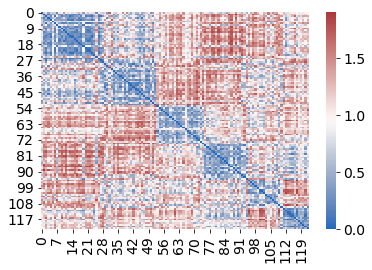

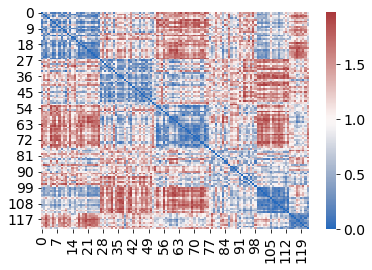

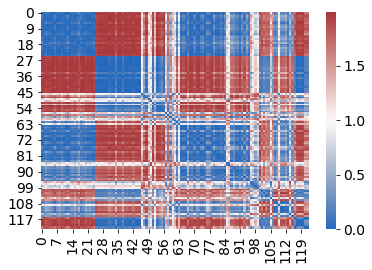

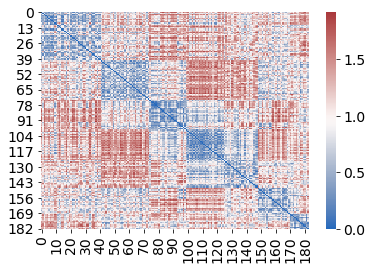

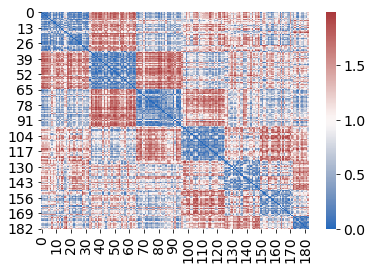

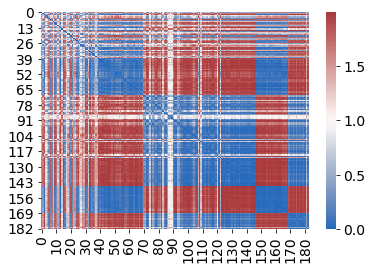

In [ ]:
import numpy as np
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import pdist, squareform

# Example data (replace these with your actual data)
# electrophysiological_data = 
# biophysical_data = 
# spike_triggered_average_data = 

# Step 1: Normalize the data
scaler = StandardScaler()
ephys_data_inh = scaler.fit_transform(conf_df_inh_ephys_sorted[cols])
bio_data_inh = scaler.fit_transform(conf_df_inh_bio_sorted[cols_bio])
sta_data_inh = scaler.fit_transform(np.vstack(conf_df_inh_sta_sorted['sta'].to_numpy()))

ephys_data_exc = scaler.fit_transform(conf_df_exc_ephys_sorted[cols])
bio_data_exc = scaler.fit_transform(conf_df_exc_bio_sorted[cols_bio])
sta_data_exc = scaler.fit_transform(np.vstack(conf_df_exc_sta_sorted['sta'].to_numpy()))


# Step 2: Calculate pairwise distances within each modality
def calculate_pairwise_distances(data, metric='cosine'):
    return squareform(pdist(data, metric)) , pdist(data, metric) 

electrophysiological_distances_mat_inh , electrophysiological_distances_inh = calculate_pairwise_distances(ephys_data_inh)
biophysical_distances_mat_inh,biophysical_distances_inh  = calculate_pairwise_distances(bio_data_inh)
sta_distance_mat_inh,sta_distance_inh = calculate_pairwise_distances(sta_data_inh)

electrophysiological_distances_mat_exc , electrophysiological_distances_exc = calculate_pairwise_distances(ephys_data_exc)
biophysical_distances_mat_exc,biophysical_distances_exc  = calculate_pairwise_distances(bio_data_exc)
sta_distance_mat_exc,sta_distance_exc = calculate_pairwise_distances(sta_data_exc)


sns.heatmap(electrophysiological_distances_mat_inh,cmap='vlag')
plt.show()
sns.heatmap(biophysical_distances_mat_inh,cmap='vlag')
plt.show()
sns.heatmap(sta_distance_mat_inh,cmap='vlag')
plt.show()


sns.heatmap(electrophysiological_distances_mat_exc,cmap='vlag')
plt.show()
sns.heatmap(biophysical_distances_mat_exc,cmap='vlag')
plt.show()
sns.heatmap(sta_distance_mat_exc,cmap='vlag')
plt.show()


In [ ]:
from sklearn.cross_decomposition import CCA

# Assuming you want to compare 22D vs 2000D and 22D vs 8D
cca = CCA(n_components=2)
cca_22d_2000d = cca.fit(ephys_data, sta_data).transform(ephys_data, sta_data)
cca_22d_8d = cca.fit(ephys_data, bio_data).transform(ephys_data, bio_data)

# cca_22d_2000d and cca_22d_8d now contain the transformed data for comparison


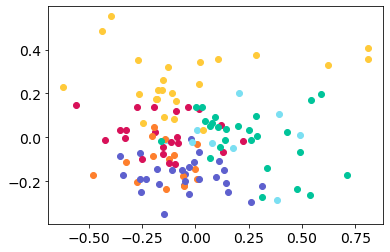

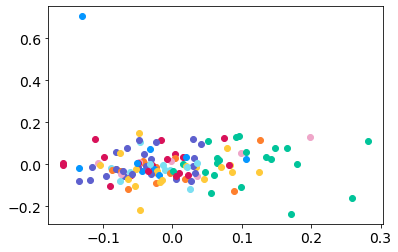

In [ ]:
# plt.scatter(cca_22d_8d[0],cca_22d_8d[1])
for i,j in enumerate(conf_df_inh_bio.lables_bio):
    plt.scatter(cca_22d_8d[0][i,0],cca_22d_8d[0][i,1],c=CUSTOM_PAL_SORT_3[j])
plt.show()
for i,j in enumerate(conf_df_inh_sta.labels_sta):    
    plt.scatter(cca_22d_2000d[0][i,0],cca_22d_2000d[0][i,1],c=CUSTOM_PAL_SORT_3[j])
plt.show()    

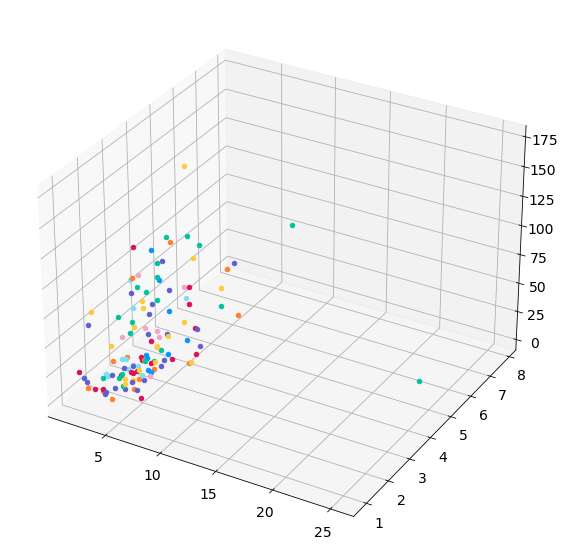

In [ ]:
ax = plt.figure(figsize=[10,10]).add_subplot(projection='3d')
for i,j in enumerate(conf_df_inh_sta.labels_sta):
    ax.scatter(electrophysiological_distances[i] ,biophysical_distances[i] ,sta_distance[i],c=CUSTOM_PAL_SORT_3[j])

In [ ]:
label_ephys_inh = list(conf_df_inh_ephys.labels_ephys)
label_sta_inh = list(conf_df_inh_sta.labels_sta)
label_bio_inh = list(conf_df_inh_bio.lables_bio)

df_labels_inh = pd.DataFrame({'label_ephys':list(label_ephys_inh),
                              'label_sta' :  list(label_sta_inh),
                              'label_bio' :  list(label_bio_inh),
                              'exp_name':    list(conf_df_inh_bio.exp_name)})
    

label_ephys_exc = list(conf_df_exc_ephys.labels_ephys)
label_sta_exc = list(conf_df_exc_sta.labels_sta)
label_bio_exc = list(conf_df_exc_bio.lables_bio)

df_labels_exc = pd.DataFrame({'label_ephys':list(label_ephys_exc),
                              'label_sta' :  list(label_sta_exc),
                              'label_bio' :  list(label_bio_exc),
                              'exp_name':    list(conf_df_exc_bio.exp_name)})
    


<Axes: >

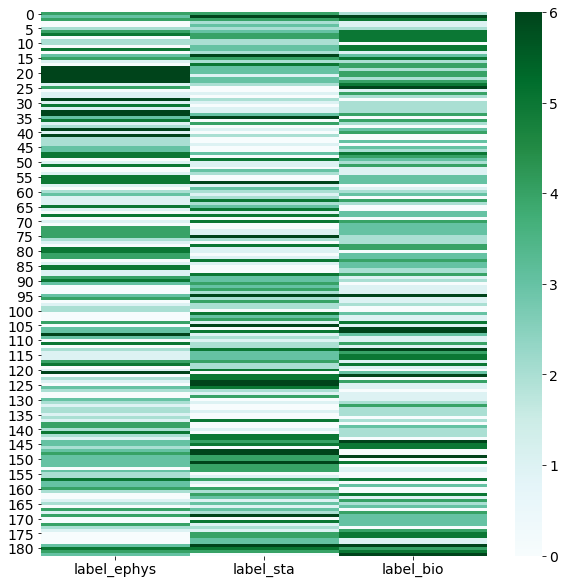

In [ ]:
plt.figure(figsize=[10,10])
sns.heatmap(df_labels_exc[df_labels_exc.columns[:-1]],cmap='BuGn')

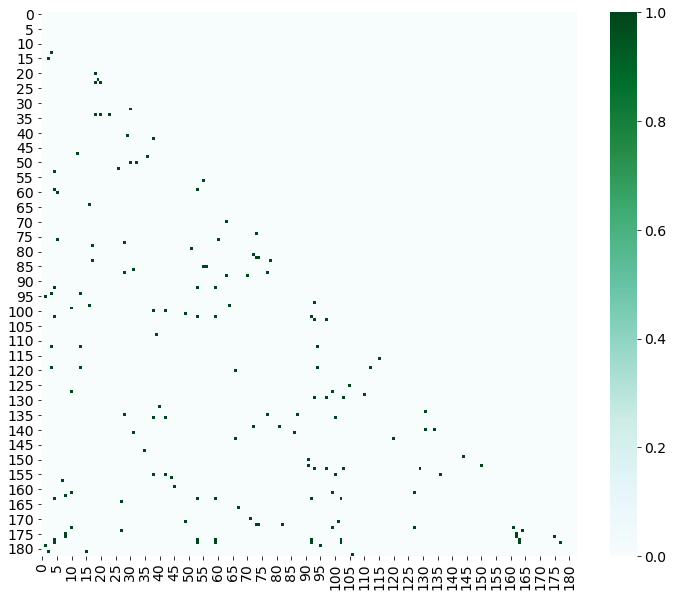

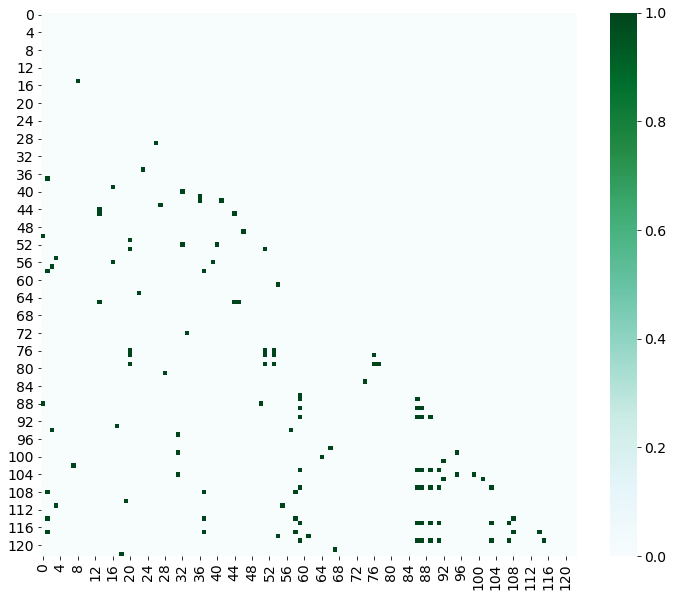

In [ ]:
def co_association_matrix(labels):
    n = len(labels)
    matrix = np.zeros((n, n))
    for i in range(n):
        for j in range(n):
            if i>j:
                if i!=j:
                    if labels[i] == labels[j]:
                        matrix[i, j] = 1
    return matrix
mat1 = co_association_matrix(df_labels_exc['label_ephys'])
mat2 = co_association_matrix(df_labels_exc['label_bio'])
mat3 = co_association_matrix( df_labels_exc['label_sta'])
mat_exc = np.int32((mat1+mat2+mat3)/3)

plt.figure(figsize=[12,10])

sns.heatmap(mat_exc,cmap='BuGn')
plt.show()

mat1 = co_association_matrix(df_labels_inh['label_ephys'])
mat2 = co_association_matrix(df_labels_inh['label_bio'])
mat3 = co_association_matrix( df_labels_inh['label_sta'])
mat_inh = np.int32((mat1+mat2+mat3)/3)

plt.figure(figsize=[12,10])

sns.heatmap(mat_inh,cmap='BuGn')
plt.show()

In [ ]:
np.sum(mat_exc,axis=1)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0,
       1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 3, 0, 0, 0, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 1, 1, 0, 2, 0, 1, 1, 0, 0, 1, 0, 0, 2, 1, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 2, 1, 1, 1, 0, 1, 2, 2, 0, 2, 1, 2,
       2, 0, 0, 0, 3, 0, 2, 1, 0, 1, 2, 1, 2, 1, 4, 2, 0, 0, 0, 0, 1, 0,
       0, 0, 3, 0, 0, 0, 1, 0, 0, 4, 1, 0, 0, 0, 0, 1, 0, 2, 1, 3, 0, 0,
       1, 0, 1, 3, 3, 0, 0, 2, 2, 2, 0, 2, 0, 0, 0, 1, 0, 1, 1, 0, 2, 4,
       0, 4, 1, 1, 0, 1, 0, 3, 1, 5, 1, 0, 1, 0, 0, 0, 1, 2, 3, 4, 2, 2,
       3, 6, 7, 2, 0, 2, 1])

<Axes: >

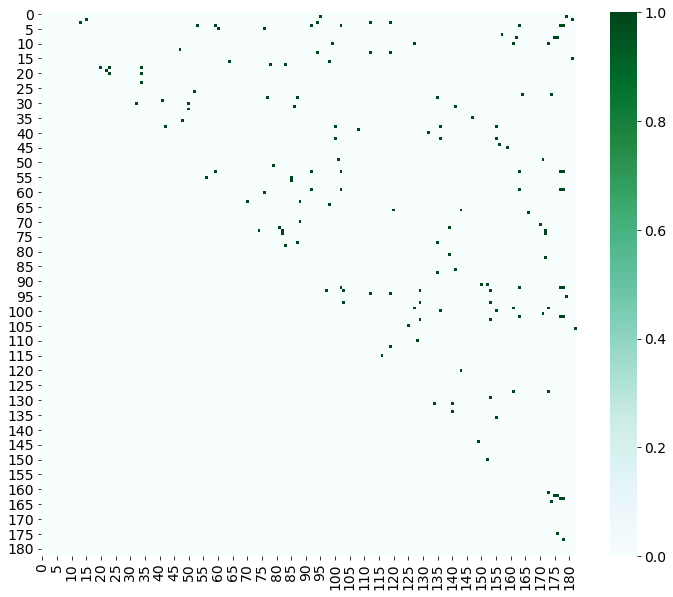

In [ ]:
plt.figure(figsize=[12,10])
sns.heatmap(consensus,cmap='BuGn')

127

In [ ]:
row_3,col_3 =np.where(consensus==3)
row_2,col_2 =np.where(consensus==2)

exps_consensus_3 = set(np.concatenate([df_labels_exc.exp_name[row_3],df_labels_exc.exp_name[col_3]]))
exps_consensus_2 = set(np.concatenate([df_labels_exc.exp_name[row_2],df_labels_exc.exp_name[col_2]]))

print(len(exps_consensus_3)/len(df_labels_exc))
print(len(exps_consensus_2)/len(df_labels_exc))


0.6939890710382514
0.9289617486338798


In [ ]:
def mahalanobis(x=None, data=None, cov=None):
    x = np.array(x,dtype=np.float32)
    x_mu = x - np.mean(x,axis=0)
    if not cov:
        cov = np.cov(x.T)
    inv_covmat = np.linalg.inv(cov)
    left = np.dot(x_mu, inv_covmat)
    mahal = np.dot(left, x_mu.T)
    return mahal.diagonal()


cols_ephys = ['current_at_first_spike', 'ap_count', 'fr', 'inst_fr',
       'time_to_first_spike', 'mean_isi', 'median_isi', 'max_isi', 'min_isi',
       'first_thr', 'mean_thr', 'median_thr', 'min_thr', 'max_thr',
       'mean_width', 'median_width', 'max_width', 'min_width',
       'mean_amplitude', 'median_amplitude', 'min_amplitude', 'max_amplitude',]




exps_in_common =   (set(ephys_inh.exp_name) & set(df_sta_acsf_inh.exp_name)) & set(df_biophys_inh.exp_name) 

conf_df_inh_ephys = ephys_inh[ephys_inh.exp_name.isin(exps_in_common)]
conf_df_inh_sta = df_sta_acsf_inh[df_sta_acsf_inh.exp_name.isin(exps_in_common)]
conf_df_inh_sta = conf_df_inh_sta.drop_duplicates('exp_name')
conf_df_inh_bio = df_biophys_inh[df_biophys_inh.exp_name.isin(exps_in_common)]

m_dist_ephys  = mahalanobis(x= conf_df_inh_ephys[cols_ephys].values,data = conf_df_inh_ephys)
m_dist_sta    = mahalanobis(x= np.vstack(conf_df_inh_sta['sta'].values),data = conf_df_inh_sta)
m_dist_bio    = mahalanobis(x= np.vstack(conf_df_inh_bio[cols_bio].values),data = conf_df_inh_bio)



conf_df_inh_ephys['m_dist'] = m_dist_ephys

conf_df_inh_sta['m_dist'] = m_dist_sta

conf_df_inh_bio['m_dist'] = m_dist_bio


<ipython-input-237-1207e45187db>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  conf_df_inh_ephys['m_dist'] = m_dist_ephys
<ipython-input-237-1207e45187db>:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  conf_df_inh_bio['m_dist'] = m_dist_bio


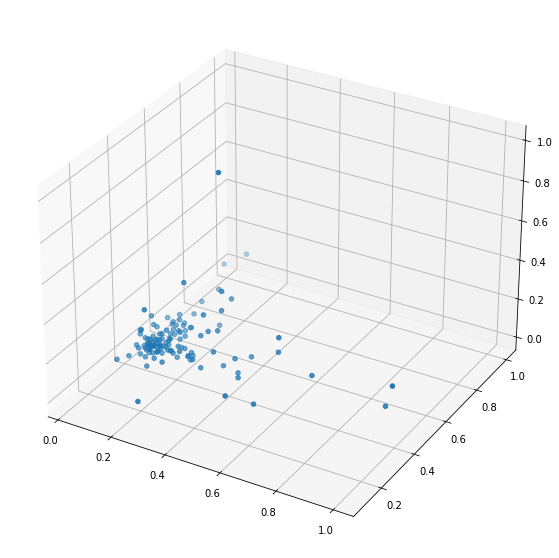

In [ ]:
ax = plt.figure(figsize=[10,10]).add_subplot(projection='3d')
ax.scatter(conf_df_inh_ephys['m_dist']/np.max(conf_df_inh_ephys['m_dist']) ,conf_df_inh_sta['m_dist']/np.max(conf_df_inh_sta['m_dist']),conf_df_inh_bio['m_dist']/np.max(conf_df_inh_bio['m_dist']))

<Axes: >

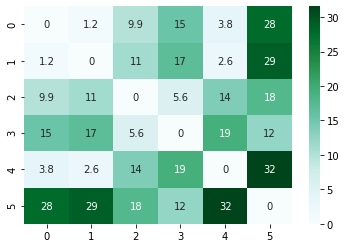

In [ ]:
centers = []
for i in set(ephys_exc.labels_ephys):

    centers.append(np.mean(ephys_exc[ephys_exc.labels_ephys==i]['m_dist']))


inter_clus_dist = np.zeros((len(centers),len(centers)))
for i in range(len(centers)):
    for j in range(len(centers)):
        if i!=j:
            inter_clus_dist[i,j] = np.abs(centers[i]-centers[j])

inter_clus_dist = np.zeros((len(centers),len(centers)))
for i in range(len(centers)):
    for j in range(len(centers)):
        if i!=j:
            inter_clus_dist[i,j] = np.abs(centers[i]-centers[j])


sns.heatmap(inter_clus_dist,cmap='BuGn',annot=True)

<Axes: >

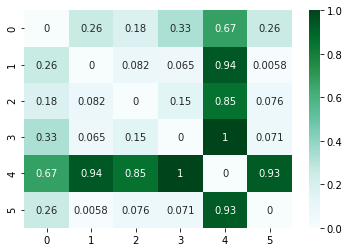

In [ ]:
centers = []
for i in set(df_sta_acsf_exc.labels_sta):

    centers.append(np.mean(df_sta_acsf_exc[df_sta_acsf_exc.labels_sta==i]['m_dist']))


inter_clus_dist = np.zeros((len(centers),len(centers)))
for i in range(len(centers)):
    for j in range(len(centers)):
        if i!=j:
            inter_clus_dist[i,j] = np.abs(centers[i]-centers[j])

inter_clus_dist = np.zeros((len(centers),len(centers)))
for i in range(len(centers)):
    for j in range(len(centers)):
        if i!=j:
            inter_clus_dist[i,j] = np.abs(centers[i]-centers[j])


sns.heatmap(inter_clus_dist/np.max(inter_clus_dist),cmap='BuGn',annot=True)

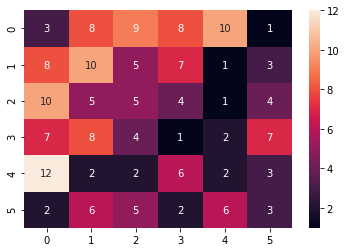

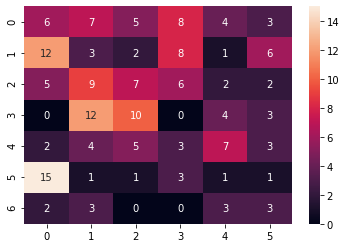

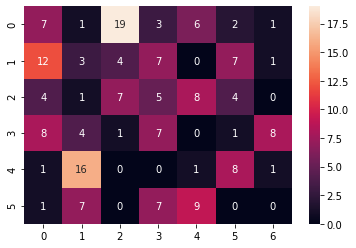

In [ ]:
from sklearn.metrics.cluster import contingency_matrix
sns.heatmap(contingency_matrix(label_ephys_exc,label_sta_exc),annot=True)
plt.show()
sns.heatmap(contingency_matrix(label_bio_exc,label_sta_exc),annot=True)
plt.show()
sns.heatmap(contingency_matrix(label_ephys_exc,label_bio_exc),annot=True)
plt.show()

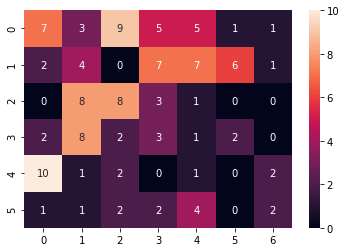

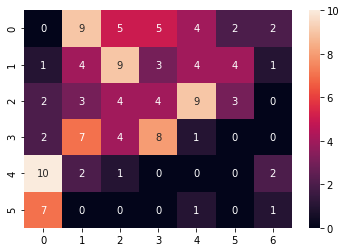

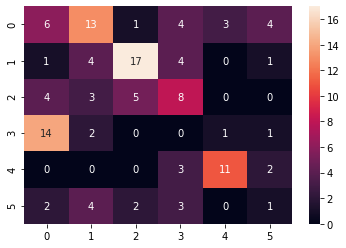

In [ ]:
from sklearn.metrics.cluster import contingency_matrix
sns.heatmap(contingency_matrix(label_ephys_inh,label_sta_inh),annot=True)
plt.show()
sns.heatmap(contingency_matrix(label_bio_inh,label_sta_inh),annot=True)
plt.show()
sns.heatmap(contingency_matrix(label_ephys_inh,label_bio_inh),annot=True)
plt.show()

In [ ]:

exps_in_common =   (set(ephys_inh.exp_name) & set(df_sta_acsf_inh.exp_name)) & set(df_biophys_inh.exp_name) 

conf_df_inh_ephys = ephys_inh[ephys_inh.exp_name.isin(exps_in_common)]
conf_df_inh_sta = df_sta_acsf_inh[df_sta_acsf_inh.exp_name.isin(exps_in_common)]
conf_df_inh_sta = conf_df_inh_sta.drop_duplicates('exp_name')
conf_df_inh_bio = df_biophys_inh[df_biophys_inh.exp_name.isin(exps_in_common)]
conf_df_inh_eta = df_biophys_inh[df_biophys_inh.exp_name.isin(exps_in_common)]

# return_confusion_matrix(conf_df_inh_ephys, conf_df_inh_sta, 'labels_ephys','labels_sta',shuffle=True)
# return_confusion_matrix(conf_df_inh_ephys, conf_df_inh_bio, 'labels_ephys','lables_bio',shuffle=True)
# return_confusion_matrix(conf_df_inh_bio  , conf_df_inh_sta, 'lables_bio'  ,'labels_sta',shuffle=True)

from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score

print('Inh: Rand Score        Mututal info score')
print((adjusted_rand_score(conf_df_inh_ephys.labels_ephys,conf_df_inh_sta.labels_sta) , #conf_df_inh_sta.labels_sta
adjusted_mutual_info_score(conf_df_inh_ephys.labels_ephys,conf_df_inh_sta.labels_sta)))

print((adjusted_rand_score(conf_df_inh_ephys.labels_ephys,conf_df_inh_bio.lables_bio) ,
adjusted_mutual_info_score(conf_df_inh_ephys.labels_ephys,conf_df_inh_bio.lables_bio)))


print((adjusted_rand_score(conf_df_inh_sta.labels_sta,conf_df_inh_bio.lables_bio) ,
adjusted_mutual_info_score(conf_df_inh_sta.labels_sta,conf_df_inh_bio.lables_bio)))


print((adjusted_rand_score(conf_df_inh_eta.lables_eta,conf_df_inh_sta.labels_sta) ,
adjusted_mutual_info_score(conf_df_inh_eta.lables_eta,conf_df_inh_sta.labels_sta)))


print((adjusted_rand_score(conf_df_inh_eta.lables_eta,conf_df_inh_ephys.labels_ephys) ,
adjusted_mutual_info_score(conf_df_inh_eta.lables_eta,conf_df_inh_ephys.labels_ephys)))


print('Exc: Rand Score        Mututal info score')

print((adjusted_rand_score(conf_df_exc_ephys.labels_ephys,conf_df_exc_sta.labels_sta) , #conf_df_exc_sta.labels_sta
adjusted_mutual_info_score(conf_df_exc_ephys.labels_ephys,conf_df_exc_sta.labels_sta)))

print((adjusted_rand_score(conf_df_exc_ephys.labels_ephys,conf_df_exc_bio.lables_bio) ,
adjusted_mutual_info_score(conf_df_exc_ephys.labels_ephys,conf_df_exc_bio.lables_bio)))


print((adjusted_rand_score(conf_df_exc_sta.labels_sta,conf_df_exc_bio.lables_bio) ,
adjusted_mutual_info_score(conf_df_exc_sta.labels_sta,conf_df_exc_bio.lables_bio)))

print((adjusted_rand_score(conf_df_exc_eta.lables_eta,conf_df_exc_sta.labels_sta) ,
adjusted_mutual_info_score(conf_df_exc_eta.lables_eta,conf_df_exc_sta.labels_sta)))

print((adjusted_rand_score(conf_df_exc_eta.lables_eta,conf_df_exc_ephys.labels_ephys) ,
adjusted_mutual_info_score(conf_df_exc_eta.lables_eta,conf_df_exc_ephys.labels_ephys)))




Inh: Rand Score        Mututal info score
(0.10999882939531264, 0.1681381841290732)
(0.18769956685227215, 0.22980867588550888)
(0.0645358831418919, 0.12252198998970418)
(0.090750571708019, 0.1471678691070663)
(0.18892533070740597, 0.28315271957810473)
Exc: Rand Score        Mututal info score
(0.030743181024791025, 0.07715598596661565)
(0.1616323183286777, 0.21285722931541898)
(0.05330314464249515, 0.09956571683254403)
(0.01200847924762805, 0.029888038050166328)
(0.10060498462794683, 0.14636084149674627)


<ipython-input-208-58c524f26bcd>:12: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(bar_labels, **{'rotation':30})


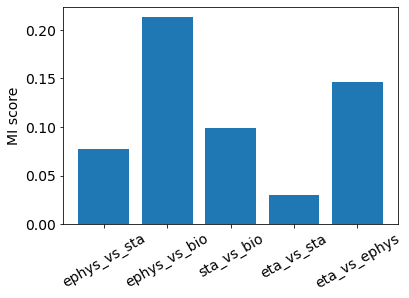

In [ ]:
y_exc = [0.1681381841290732, 0.22980867588550888, 0.12252198998970418, 0.1471678691070663, 0.28315271957810473]
y_inh = [0.0771559859666156, 0.21285722931541898, 0.09956571683254403, 0.0298880380501663, 0.14636084149674627]

fig, ax = plt.subplots()

fruits = ['ephys_vs_sta', 'ephys_vs_bio', 'sta_vs_bio', 'eta_vs_sta','etavs_ephys']
counts = y_inh
bar_labels = ['ephys_vs_sta', 'ephys_vs_bio', 'sta_vs_bio', 'eta_vs_sta','eta_vs_ephys']
bar_colors = ['tab:red', 'tab:blue', 'tab:red', 'tab:orange']

ax.bar(fruits, counts, )
ax.set_xticklabels(bar_labels, **{'rotation':30})
ax.set_ylabel('MI score')
# ax.set_title('Fruit supply by kind and color')
# ax.legend(title='Fruit color')
# plt.savefig(savepath+'inh_labels_MI.pdf',dpi=200)
plt.show()

In [ ]:
def return_mi_rand_score(label1,label2,frac): maximum mean discrepancy
    frac = frac
    idx = list(np.random.randint(0,len(label1),int(len(label1)*frac)))
    rand_scores = [] 
    MI_scores = [] 
    for i in range(10):
        rand_scores.append(adjusted_rand_score(np.array(label1)[idx],np.array(label2)[idx]))
        MI_scores.append(adjusted_mutual_info_score(np.array(label1)[idx],np.array(label2)[idx]))
    return rand_scores,MI_scores


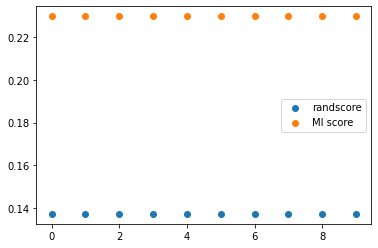

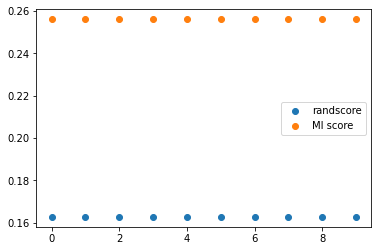

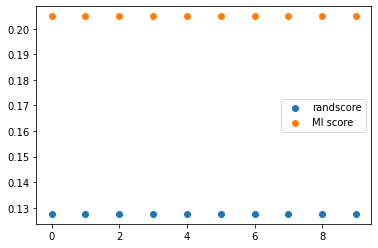

In [ ]:
randscore,miscore = return_mi_rand_score(conf_df_inh_ephys.labels_ephys,conf_df_inh_sta.labels_sta,frac=0.9)
plt.scatter(np.arange(len(randscore)),randscore,label='randscore')
plt.scatter(np.arange(len(miscore)),miscore,label='MI score')
plt.legend()
plt.show()

randscore,miscore = return_mi_rand_score(conf_df_inh_ephys.labels_ephys,conf_df_inh_bio.lables_bio,frac=0.9)
plt.scatter(np.arange(len(randscore)),randscore,label='randscore')
plt.scatter(np.arange(len(miscore)),miscore,label='MI score')
plt.legend()
plt.show()

randscore,miscore = return_mi_rand_score(conf_df_inh_bio.lables_bio,conf_df_inh_sta.labels_sta,frac=0.9)
plt.scatter(np.arange(len(randscore)),randscore,label='randscore')
plt.scatter(np.arange(len(miscore)),miscore,label='MI score')
plt.legend()
plt.show()

In [ ]:
from xg_boost_classifier import * 

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Mean accuracy 80.51421166552745


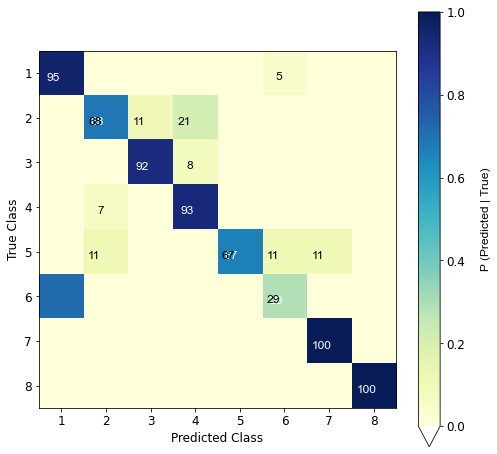

In [ ]:
_= return_xg_boost_trees_classification(data_wave_FN_acsf['waveform'],data_wave_FN_acsf.labels_wave)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Mean accuracy 94.28571428571429
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Mean accuracy 82.83013283013284


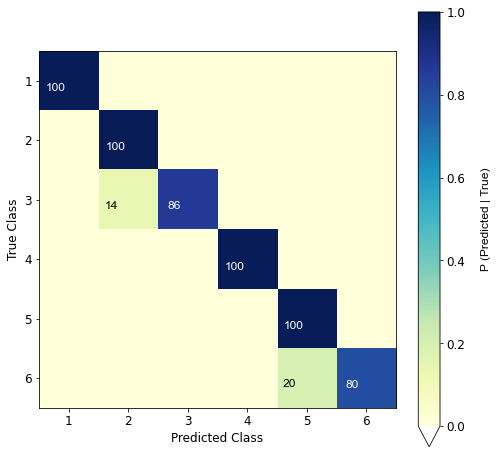

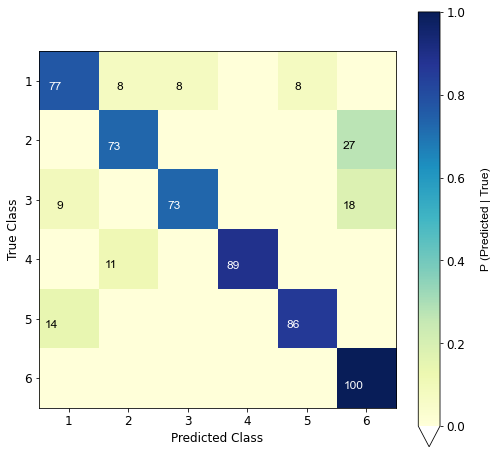

In [ ]:
_=return_xg_boost_trees_classification(conf_df_inh_ephys[conf_df_inh_ephys.columns[:-6]].to_numpy(),conf_df_inh_ephys.labels_ephys)
_=return_xg_boost_trees_classification(conf_df_exc_ephys[conf_df_exc_ephys.columns[:-6]].to_numpy(),conf_df_exc_ephys.labels_ephys)


Fitting 5 folds for each of 1 candidates, totalling 5 fits


c:\Users\Nishant Joshi\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:737: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


Mean accuracy 71.42857142857143
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Mean accuracy 89.36507936507935


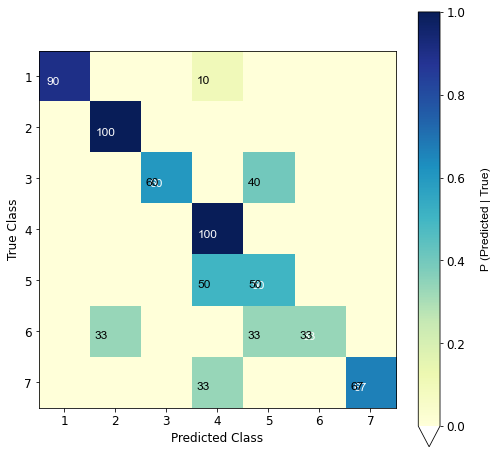

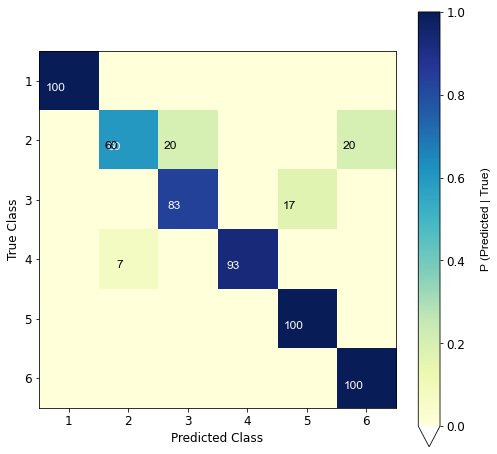

In [ ]:
_=return_xg_boost_trees_classification(conf_df_inh_sta['sta'].to_numpy(),conf_df_inh_sta.labels_sta)
_=return_xg_boost_trees_classification(conf_df_exc_sta['sta'].to_numpy(),conf_df_exc_sta.labels_sta)


Fitting 5 folds for each of 1 candidates, totalling 5 fits
Mean accuracy 71.13095238095237
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Mean accuracy 81.75824175824175


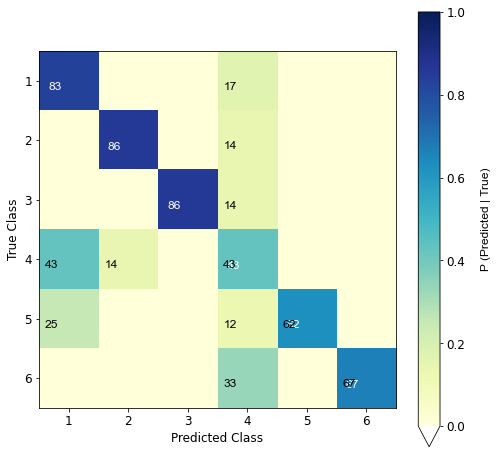

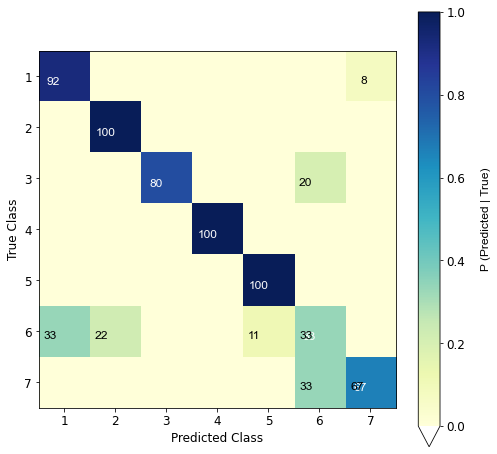

In [ ]:

cols_bio = ['C (nF):', 'gl (nS):', 'El (mV):','Vr (mV):', 'Vt* (mV):', 'DV (mV):']

_ = return_xg_boost_trees_classification(conf_df_inh_bio[cols_bio].to_numpy(),conf_df_inh_bio.lables_bio)
_ = return_xg_boost_trees_classification(conf_df_exc_bio[cols_bio].to_numpy(),conf_df_exc_bio.lables_bio)


## CCA

In [ ]:
import numpy as np
from sklearn.cross_decomposition import CCA
from scipy.stats import zscore
from sklearn.model_selection import train_test_split


X_ephys = normalize(conf_df_inh_ephys[conf_df_inh_ephys.columns[:-6]].to_numpy(),axis=0)
X_sta = np.vstack(conf_df_inh_sta['sta'].to_numpy())
X_bio = normalize(np.vstack(conf_df_inh_bio[cols_bio].to_numpy()),axis=0)

X_train_ephys, X_test_ephys, y_train_sta, y_test_sta = train_test_split(X_ephys, X_sta, test_size=0.3, random_state=42)
X_train_ephys, X_test_ephys, y_train_bio, y_test_bio = train_test_split(X_ephys, X_bio, test_size=0.3, random_state=42)
X_train_bio, X_test_bio, y_train_sta, y_test_sta = train_test_split(X_bio, X_sta, test_size=0.3, random_state=42)


def perform_CCA(X,y,n_components=10):
    ca = CCA(n_components=n_components)
    ca.fit(X, y)
    X_c, Y_c = ca.transform(X,y)
    x_weights = ca.x_weights_
    score = ca.score(X , y)
    print(score)
    return X_c,Y_c,ca


_,_,ca_all_E_S = perform_CCA(X_ephys,X_sta,n_components=22)
_,_,ca_all_E_B = perform_CCA(X_ephys,X_bio,n_components=6)
_,_,ca_all_S_B = perform_CCA(X_bio,X_sta,n_components=6)


-1.1226876039749683
0.3881159193642692
-50.20246564725727


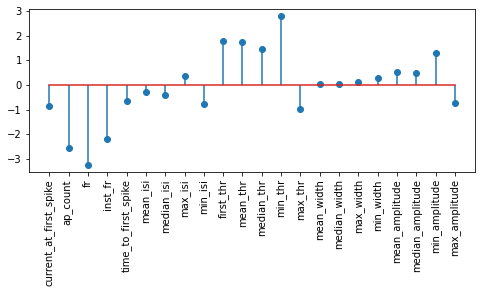

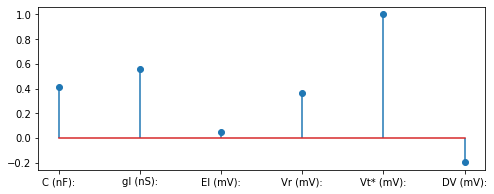

In [ ]:
fig,ax1 = plt.subplots(1, figsize=[8,3])
fig,ax2 = plt.subplots(1, figsize=[8,3])

ax1.stem(ca_all_E_B.x_loadings_[:,0])
ax1.set_xticks(np.arange(0,22),conf_df_inh_ephys.columns[:-6],rotation=90)
# ax1.set_xticks([])

ax2.stem(ca_all_E_B.y_loadings_[:,0])
ax2.set_xticks(np.arange(0,6),cols_bio[:])
# ax2.tight_layout=True
plt.show()
